# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [3]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

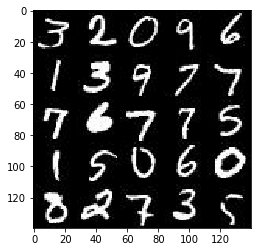

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

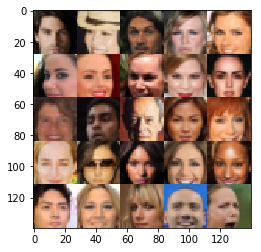

In [5]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [6]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [7]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='input_real')
    z = tf.placeholder(tf.float32, [None, z_dim], name='input_z')
    learning_rate = tf.placeholder(tf.float64, name='learning_rate')
    return real, z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/home/research/qianws/local/anaconda3/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/home/research/qianws/local/anaconda3/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/home/research/qianws/local/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py", line 3, in <module>\n    app.launch_new_instance()', 'File "/home/research/qianws/local/anaconda3/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/home/research/qianws/local/anaconda3/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [8]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        # 28*28*3

        x1 = tf.layers.conv2d(images, 64, (5,5), strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14*14*64
        
        x2 = tf.layers.conv2d(relu1, 128, (5,5), strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2) # "training=True" should be removed
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7*7*128

        x3 = tf.layers.conv2d(relu2, 256, (5,5), strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4*4*256

        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [9]:
from imp import reload
reload(tests)

<module 'problem_unittests' from '/home/research/qianws/jupyterNotebooks/DLND/face_generation/problem_unittests.py'>

In [10]:
def generator(z, out_channel_dim, is_train=True, alpha = 0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.maximum(alpha * x1, x1)
        # 2*2*512 now

        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7*7*256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14*14*128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 32x32x3 now

        out = tf.tanh(logits)
        return out
    
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [11]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    
    g_out = generator(input_z, out_channel_dim, is_train=True, alpha=alpha)
    
    d_out_real, d_logits_real = discriminator(input_real, reuse=False, alpha=alpha)
    d_out_fake, d_logits_fake = discriminator(g_out, reuse=True, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(d_logits_real)*(1-smooth),
                                                logits=d_logits_real))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.zeros_like(d_logits_fake),
                                                logits=d_logits_fake))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
        #tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(d_logits_fake)*(1-smooth),
        tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(d_logits_fake),
                                                logits=d_logits_fake))
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    g_vars = [v for v in t_vars if v.name.startswith('generator')]
    d_vars = [v for v in t_vars if v.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    return d_opt, g_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [13]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [14]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, learning_rate_ = model_inputs(*data_shape[1:], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[-1], alpha=0.2)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate_, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_i, batch_images in enumerate(get_batches(batch_size)):
                # TODO: Train Model
                batch_images = batch_images*2
                batch_z = np.random.uniform( -1, 1 , size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learning_rate_:learning_rate} )
                for _time in range(2):
                    _ = sess.run(g_opt, feed_dict={input_z: batch_z, learning_rate_:learning_rate})
                
                if batch_i %100 == 0:
                    train_loss_d = sess.run(d_loss, {input_real: batch_images, input_z: batch_z, learning_rate_:learning_rate})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print('Epoch: {}/{}...'.format(epoch_i+1, epoch_count), 
                          'd_loss: {:.4f}...'.format(train_loss_d),
                          'g_loss: {:.4f}...'.format(train_loss_g) )
                    show_generator_output(sess, 3, input_z, out_channel_dim=data_shape[-1], image_mode=data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch: 1/2... d_loss: 1.5076... g_loss: 0.4397...


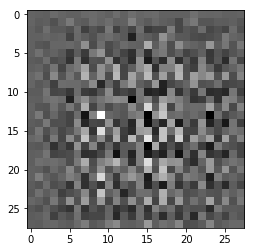

Epoch: 1/2... d_loss: 1.4040... g_loss: 0.7197...


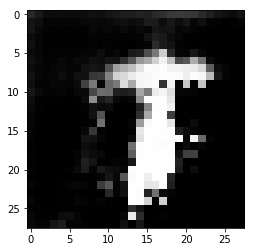

Epoch: 1/2... d_loss: 1.9187... g_loss: 0.7863...


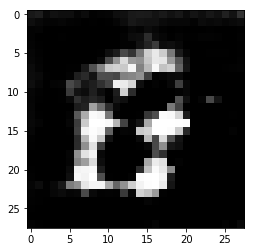

Epoch: 1/2... d_loss: 1.3214... g_loss: 0.6971...


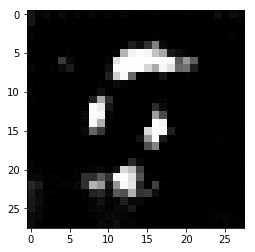

Epoch: 1/2... d_loss: 1.1312... g_loss: 0.9489...


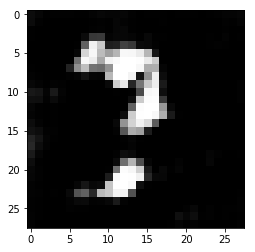

Epoch: 1/2... d_loss: 1.2793... g_loss: 0.7881...


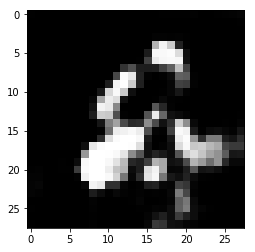

Epoch: 1/2... d_loss: 1.4262... g_loss: 0.7479...


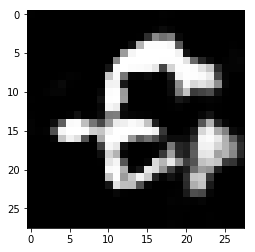

Epoch: 1/2... d_loss: 1.4006... g_loss: 0.7006...


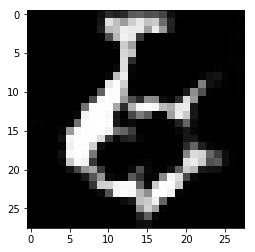

Epoch: 1/2... d_loss: 1.4225... g_loss: 1.2843...


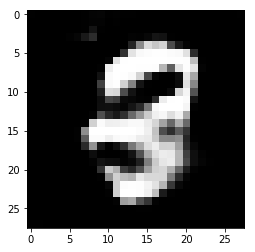

Epoch: 1/2... d_loss: 1.1399... g_loss: 0.9287...


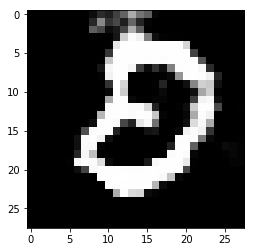

Epoch: 1/2... d_loss: 1.4069... g_loss: 0.6768...


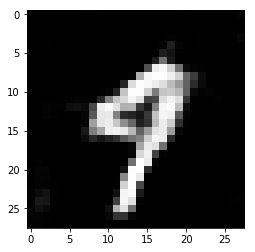

Epoch: 1/2... d_loss: 1.4741... g_loss: 0.8842...


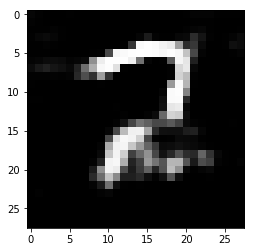

Epoch: 1/2... d_loss: 1.3556... g_loss: 0.9051...


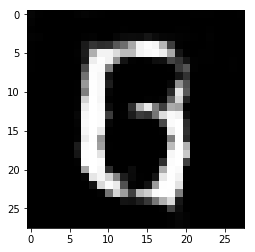

Epoch: 1/2... d_loss: 1.3818... g_loss: 0.8151...


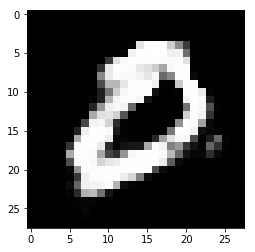

Epoch: 1/2... d_loss: 1.2992... g_loss: 0.7783...


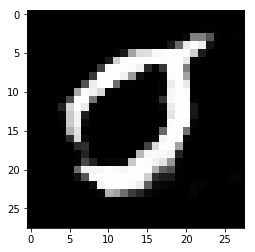

Epoch: 1/2... d_loss: 1.2894... g_loss: 0.7893...


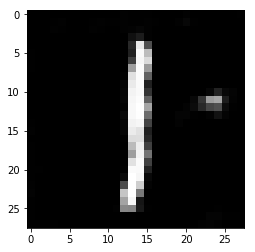

Epoch: 1/2... d_loss: 1.3137... g_loss: 0.8383...


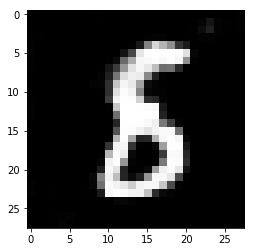

Epoch: 1/2... d_loss: 1.3455... g_loss: 0.7533...


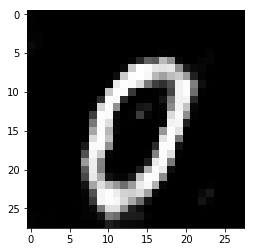

Epoch: 1/2... d_loss: 1.4383... g_loss: 0.6991...


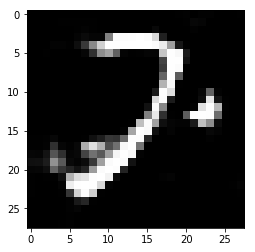

Epoch: 2/2... d_loss: 1.2966... g_loss: 0.9043...


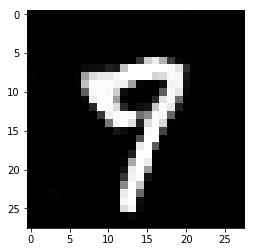

Epoch: 2/2... d_loss: 1.3970... g_loss: 0.6039...


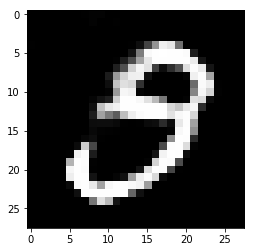

Epoch: 2/2... d_loss: 1.4106... g_loss: 0.6859...


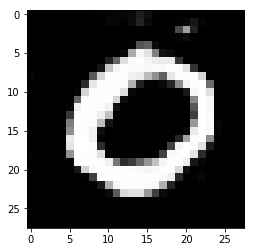

Epoch: 2/2... d_loss: 1.4093... g_loss: 0.6177...


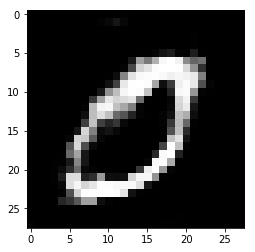

Epoch: 2/2... d_loss: 1.3476... g_loss: 0.7836...


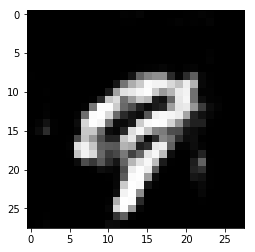

Epoch: 2/2... d_loss: 1.4991... g_loss: 0.7485...


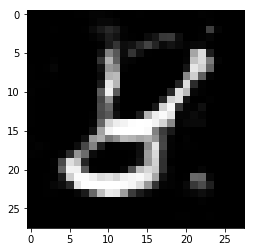

Epoch: 2/2... d_loss: 1.4725... g_loss: 0.8551...


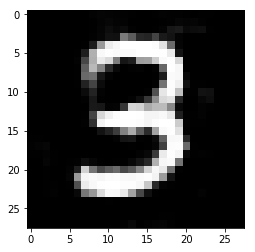

Epoch: 2/2... d_loss: 1.2693... g_loss: 0.7570...


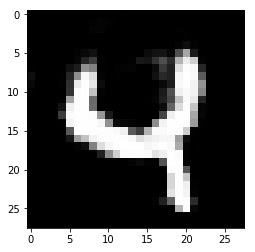

Epoch: 2/2... d_loss: 1.3245... g_loss: 1.1628...


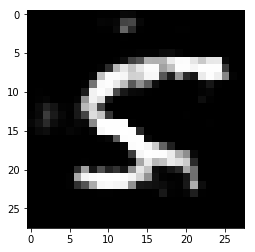

Epoch: 2/2... d_loss: 1.2882... g_loss: 0.8120...


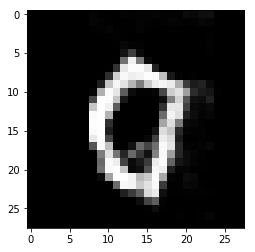

Epoch: 2/2... d_loss: 1.4581... g_loss: 0.5885...


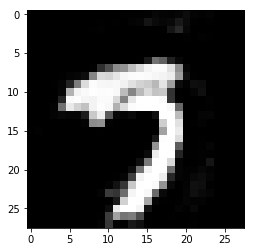

Epoch: 2/2... d_loss: 1.5057... g_loss: 0.6108...


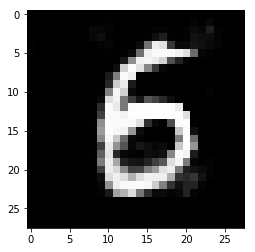

Epoch: 2/2... d_loss: 1.2944... g_loss: 0.7761...


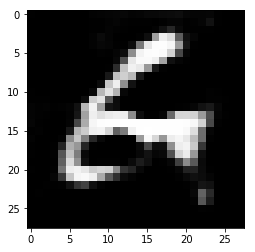

Epoch: 2/2... d_loss: 1.3272... g_loss: 0.9658...


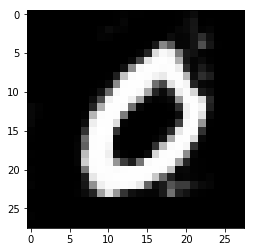

Epoch: 2/2... d_loss: 1.4518... g_loss: 0.6420...


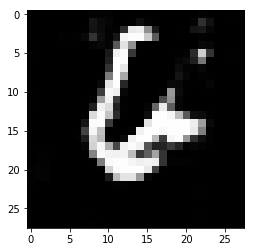

Epoch: 2/2... d_loss: 1.4708... g_loss: 0.7635...


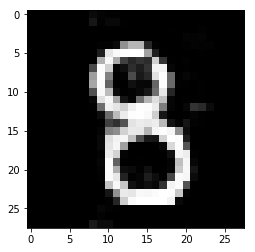

Epoch: 2/2... d_loss: 1.3573... g_loss: 0.7228...


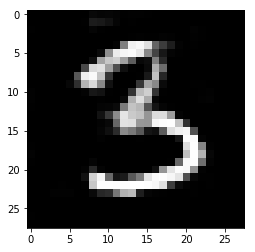

Epoch: 2/2... d_loss: 1.3744... g_loss: 0.7623...


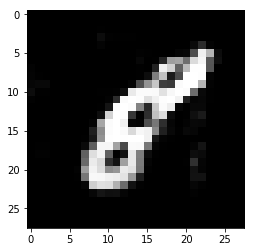

Epoch: 2/2... d_loss: 1.3364... g_loss: 0.7230...


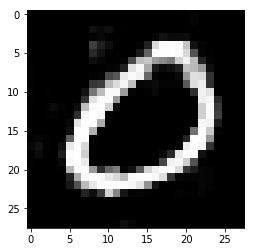

In [17]:
batch_size = 32
z_dim = 128
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch: 1/50... d_loss: 2.1665... g_loss: 0.2095...


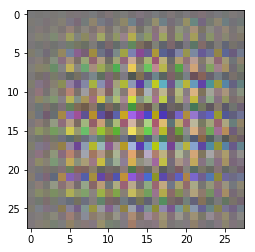

Epoch: 1/50... d_loss: 1.3958... g_loss: 0.7467...


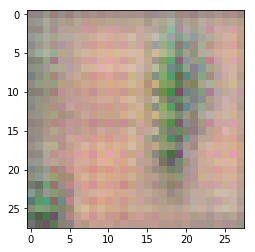

Epoch: 1/50... d_loss: 1.2991... g_loss: 0.8505...


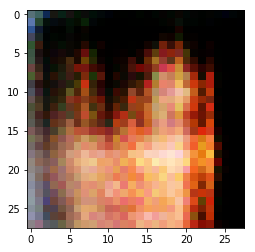

Epoch: 1/50... d_loss: 1.2790... g_loss: 0.8696...


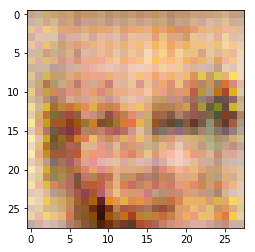

Epoch: 1/50... d_loss: 1.4421... g_loss: 0.7285...


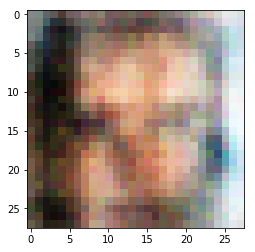

Epoch: 1/50... d_loss: 1.3529... g_loss: 0.7847...


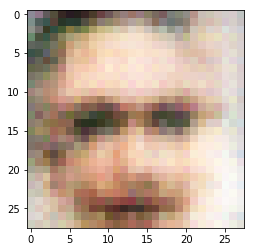

Epoch: 1/50... d_loss: 1.3314... g_loss: 0.7757...


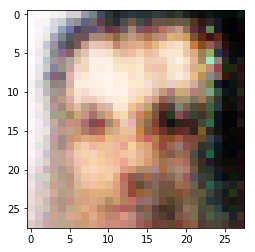

Epoch: 1/50... d_loss: 1.3778... g_loss: 0.8289...


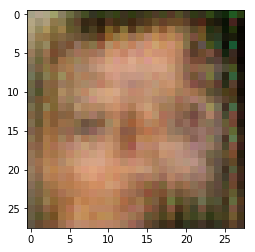

Epoch: 1/50... d_loss: 1.4438... g_loss: 0.8219...


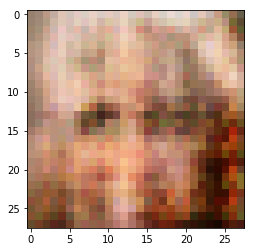

Epoch: 1/50... d_loss: 1.3085... g_loss: 0.8121...


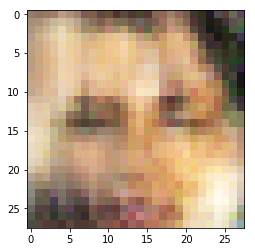

Epoch: 1/50... d_loss: 1.3726... g_loss: 0.8029...


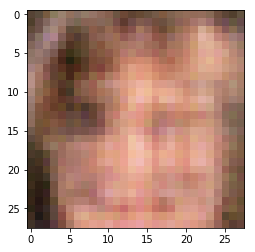

Epoch: 1/50... d_loss: 1.3950... g_loss: 0.7163...


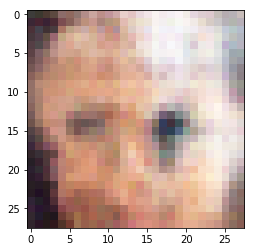

Epoch: 1/50... d_loss: 1.3346... g_loss: 0.7447...


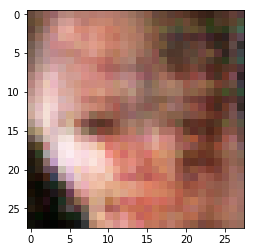

Epoch: 1/50... d_loss: 1.4286... g_loss: 0.7540...


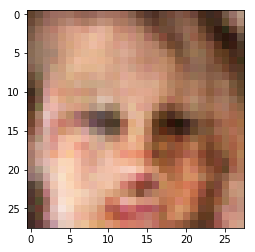

Epoch: 1/50... d_loss: 1.5642... g_loss: 0.6540...


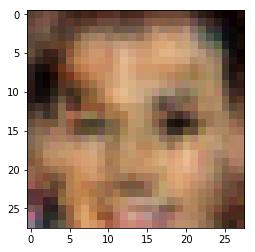

Epoch: 1/50... d_loss: 1.3366... g_loss: 0.8332...


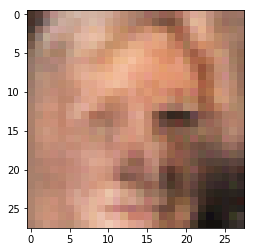

Epoch: 1/50... d_loss: 1.3644... g_loss: 0.7583...


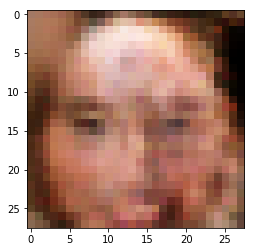

Epoch: 1/50... d_loss: 1.4091... g_loss: 0.7040...


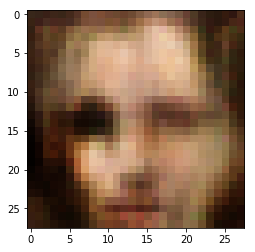

Epoch: 1/50... d_loss: 1.4617... g_loss: 0.6706...


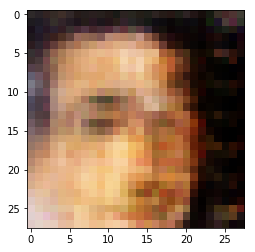

Epoch: 1/50... d_loss: 1.4065... g_loss: 0.7047...


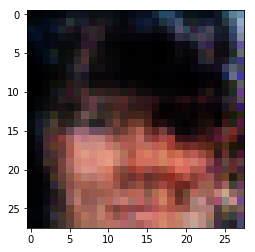

Epoch: 1/50... d_loss: 1.4064... g_loss: 0.7026...


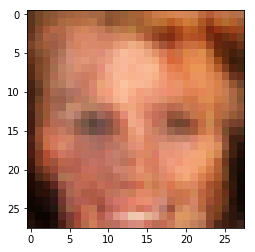

Epoch: 1/50... d_loss: 1.3627... g_loss: 0.8241...


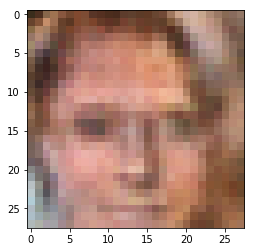

Epoch: 1/50... d_loss: 1.3248... g_loss: 0.7556...


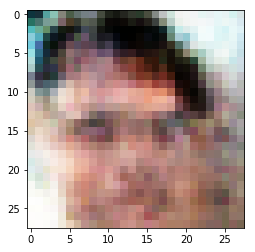

Epoch: 1/50... d_loss: 1.3442... g_loss: 0.7603...


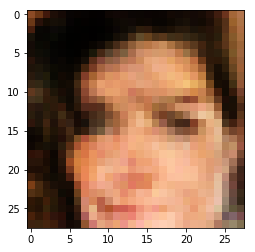

Epoch: 1/50... d_loss: 1.4066... g_loss: 0.7514...


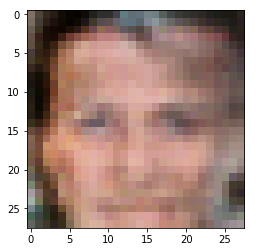

Epoch: 1/50... d_loss: 1.3818... g_loss: 0.8549...


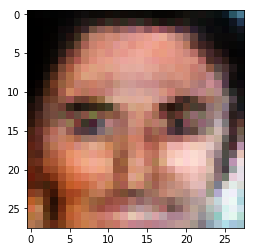

Epoch: 1/50... d_loss: 1.5098... g_loss: 0.6616...


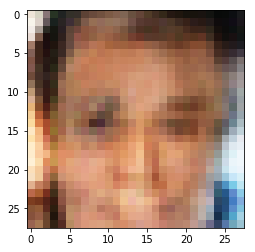

Epoch: 1/50... d_loss: 1.4653... g_loss: 0.8746...


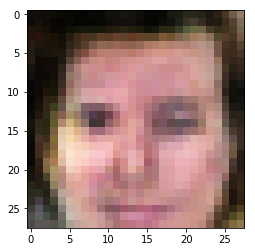

Epoch: 1/50... d_loss: 1.3765... g_loss: 0.7634...


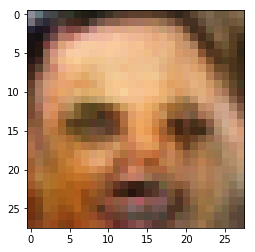

Epoch: 1/50... d_loss: 1.4878... g_loss: 0.6399...


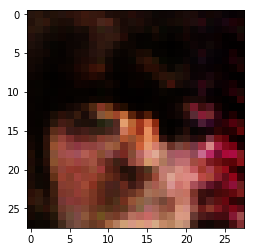

Epoch: 1/50... d_loss: 1.5089... g_loss: 0.7435...


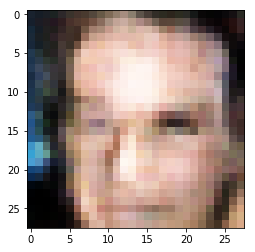

Epoch: 1/50... d_loss: 1.3653... g_loss: 0.7857...


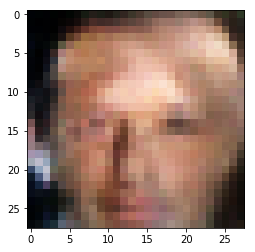

Epoch: 2/50... d_loss: 1.4506... g_loss: 0.7463...


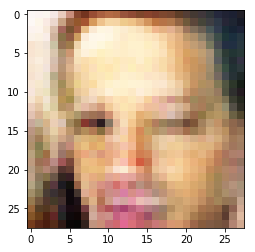

Epoch: 2/50... d_loss: 1.3178... g_loss: 0.7623...


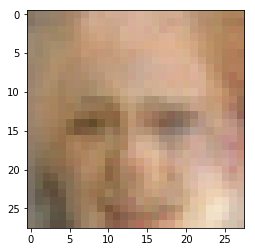

Epoch: 2/50... d_loss: 1.3336... g_loss: 0.7808...


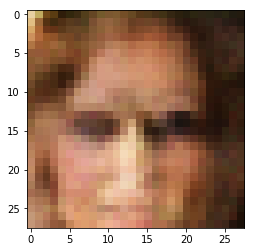

Epoch: 2/50... d_loss: 1.3722... g_loss: 0.8362...


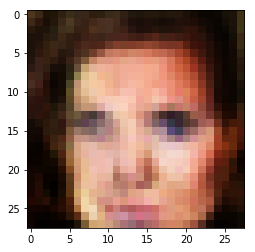

Epoch: 2/50... d_loss: 1.3200... g_loss: 0.7762...


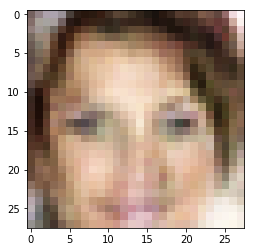

Epoch: 2/50... d_loss: 1.4204... g_loss: 0.7428...


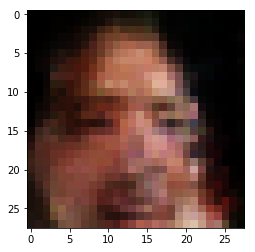

Epoch: 2/50... d_loss: 1.4345... g_loss: 0.7407...


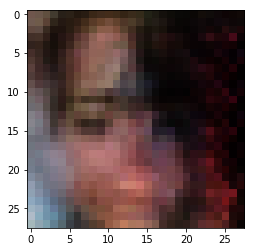

Epoch: 2/50... d_loss: 1.5675... g_loss: 1.2668...


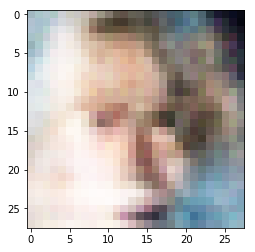

Epoch: 2/50... d_loss: 1.4116... g_loss: 0.7382...


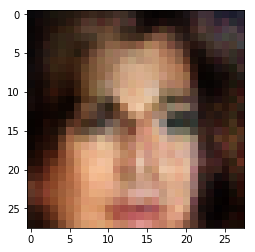

Epoch: 2/50... d_loss: 1.4026... g_loss: 0.8436...


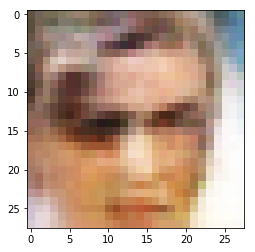

Epoch: 2/50... d_loss: 1.4531... g_loss: 0.7465...


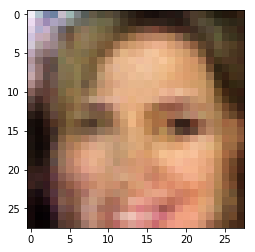

Epoch: 2/50... d_loss: 1.4048... g_loss: 0.7346...


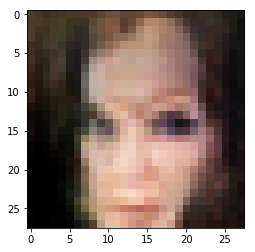

Epoch: 2/50... d_loss: 1.3801... g_loss: 0.8299...


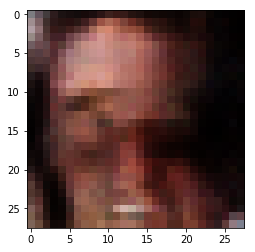

Epoch: 2/50... d_loss: 1.3956... g_loss: 0.7813...


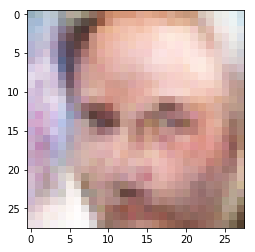

Epoch: 2/50... d_loss: 1.3548... g_loss: 0.7536...


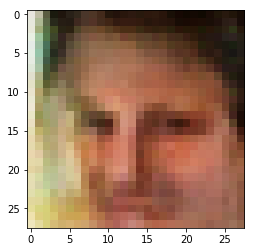

Epoch: 2/50... d_loss: 1.3009... g_loss: 0.7728...


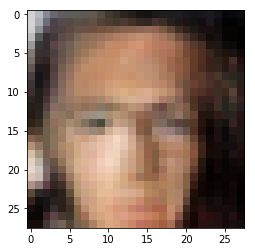

Epoch: 2/50... d_loss: 1.4213... g_loss: 0.7168...


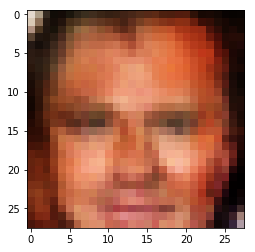

Epoch: 2/50... d_loss: 1.4045... g_loss: 0.7537...


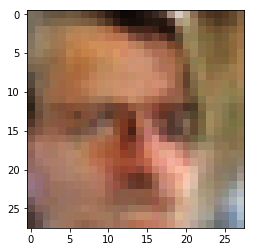

Epoch: 2/50... d_loss: 1.4275... g_loss: 0.8010...


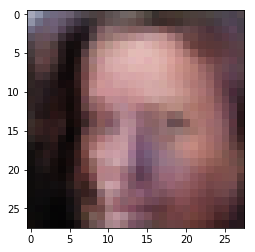

Epoch: 2/50... d_loss: 1.4149... g_loss: 0.8782...


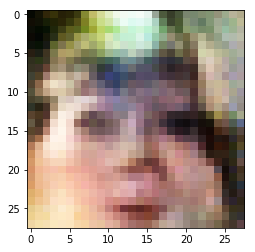

Epoch: 2/50... d_loss: 1.4169... g_loss: 0.7522...


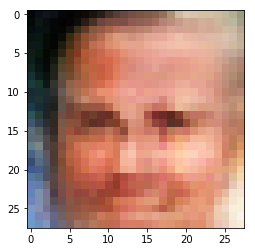

Epoch: 2/50... d_loss: 1.4145... g_loss: 0.8103...


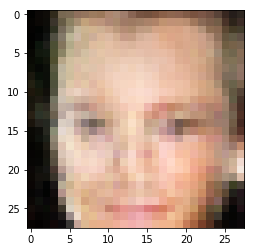

Epoch: 2/50... d_loss: 1.4966... g_loss: 0.7180...


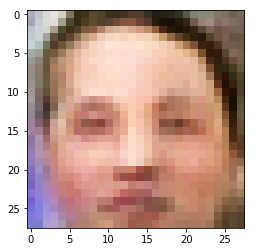

Epoch: 2/50... d_loss: 1.3836... g_loss: 0.7917...


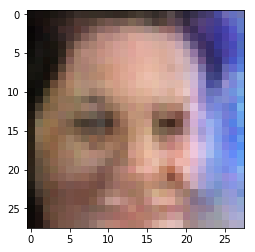

Epoch: 2/50... d_loss: 1.4417... g_loss: 0.7463...


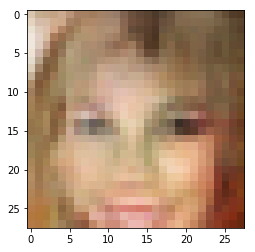

Epoch: 2/50... d_loss: 1.3906... g_loss: 0.8164...


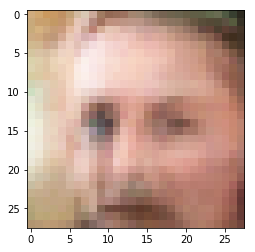

Epoch: 2/50... d_loss: 1.4132... g_loss: 0.7822...


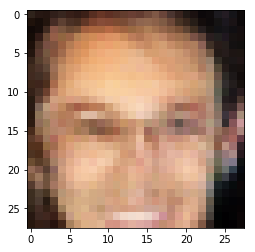

Epoch: 2/50... d_loss: 1.4153... g_loss: 0.8050...


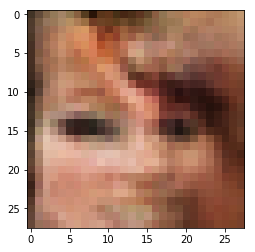

Epoch: 2/50... d_loss: 1.4139... g_loss: 0.7452...


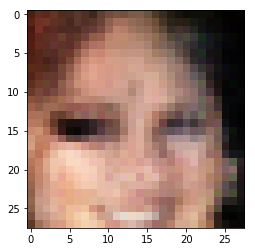

Epoch: 2/50... d_loss: 1.3753... g_loss: 0.7667...


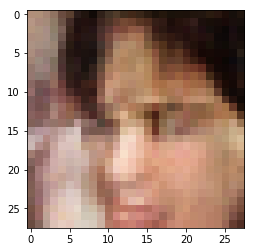

Epoch: 2/50... d_loss: 1.4129... g_loss: 0.7240...


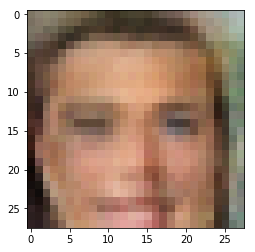

Epoch: 2/50... d_loss: 1.4477... g_loss: 0.7130...


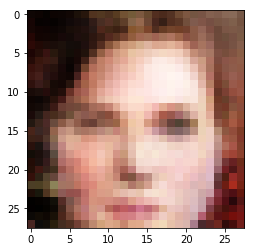

Epoch: 3/50... d_loss: 1.4411... g_loss: 0.7443...


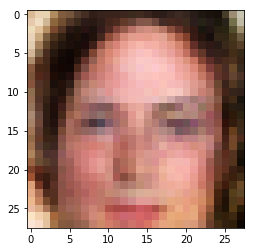

Epoch: 3/50... d_loss: 1.3859... g_loss: 0.7572...


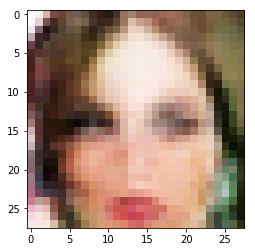

Epoch: 3/50... d_loss: 1.3931... g_loss: 0.7384...


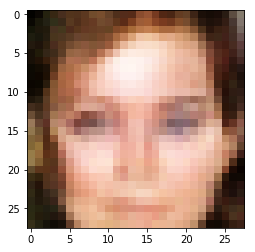

Epoch: 3/50... d_loss: 1.4439... g_loss: 0.7351...


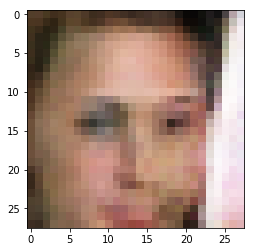

Epoch: 3/50... d_loss: 1.3940... g_loss: 0.7081...


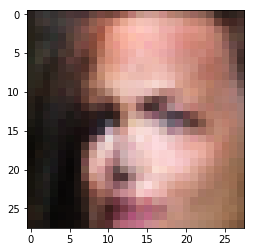

Epoch: 3/50... d_loss: 1.3938... g_loss: 0.7357...


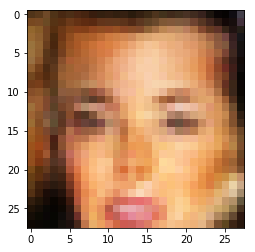

Epoch: 3/50... d_loss: 1.4745... g_loss: 0.6693...


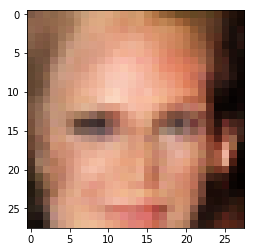

Epoch: 3/50... d_loss: 1.3924... g_loss: 0.6829...


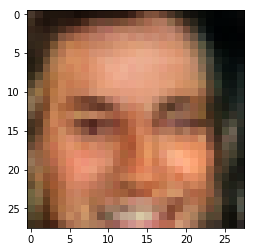

Epoch: 3/50... d_loss: 1.4124... g_loss: 0.8164...


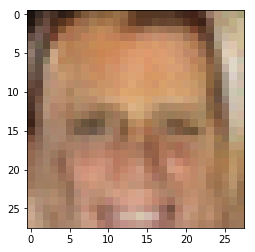

Epoch: 3/50... d_loss: 1.4031... g_loss: 0.7576...


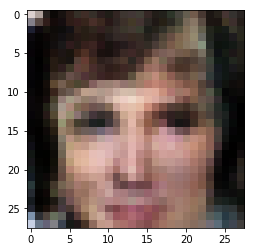

Epoch: 3/50... d_loss: 1.3802... g_loss: 0.7464...


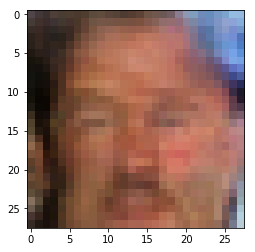

Epoch: 3/50... d_loss: 1.3730... g_loss: 0.7878...


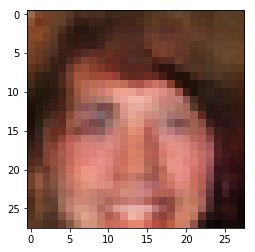

Epoch: 3/50... d_loss: 1.3842... g_loss: 0.7807...


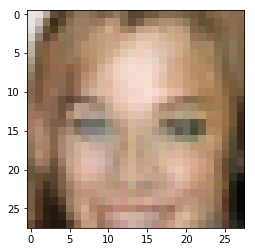

Epoch: 3/50... d_loss: 1.4267... g_loss: 0.6755...


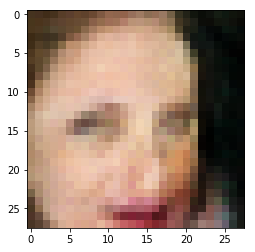

Epoch: 3/50... d_loss: 1.3933... g_loss: 0.7819...


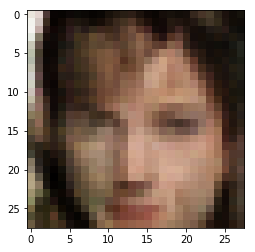

Epoch: 3/50... d_loss: 1.4024... g_loss: 0.7571...


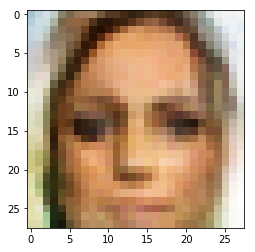

Epoch: 3/50... d_loss: 1.3793... g_loss: 0.8043...


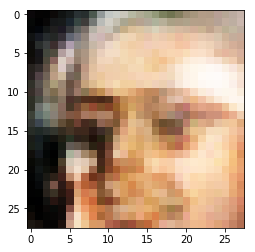

Epoch: 3/50... d_loss: 1.3871... g_loss: 0.7288...


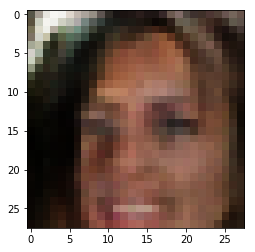

Epoch: 3/50... d_loss: 1.4097... g_loss: 0.7774...


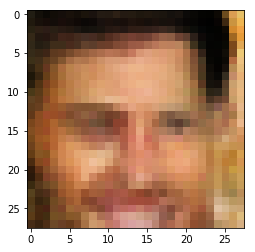

Epoch: 3/50... d_loss: 1.4002... g_loss: 0.7560...


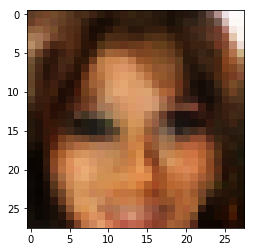

Epoch: 3/50... d_loss: 1.4455... g_loss: 0.9418...


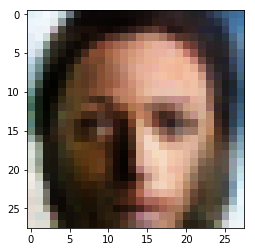

Epoch: 3/50... d_loss: 1.3394... g_loss: 0.7796...


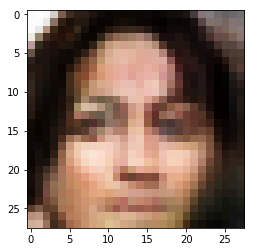

Epoch: 3/50... d_loss: 1.3971... g_loss: 0.7308...


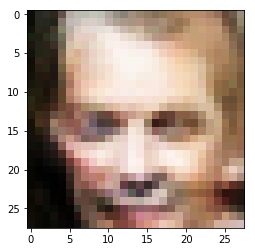

Epoch: 3/50... d_loss: 1.3256... g_loss: 0.7943...


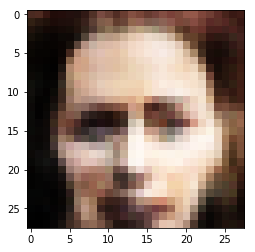

Epoch: 3/50... d_loss: 1.4202... g_loss: 0.6582...


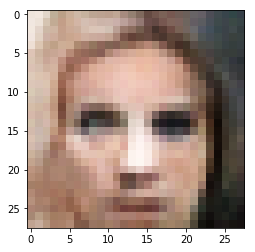

Epoch: 3/50... d_loss: 1.4026... g_loss: 0.7576...


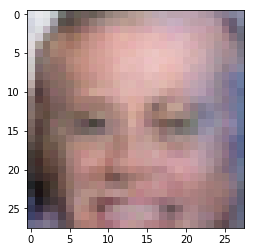

Epoch: 3/50... d_loss: 1.4044... g_loss: 0.7348...


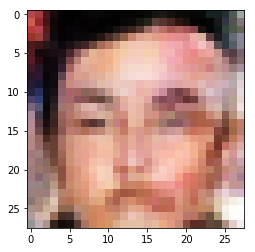

Epoch: 3/50... d_loss: 1.3935... g_loss: 0.7848...


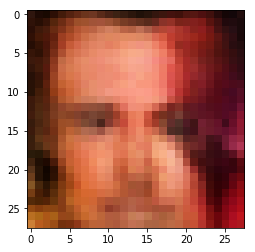

Epoch: 3/50... d_loss: 1.3894... g_loss: 0.7924...


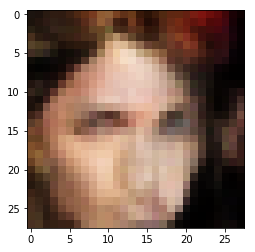

Epoch: 3/50... d_loss: 1.4226... g_loss: 0.7809...


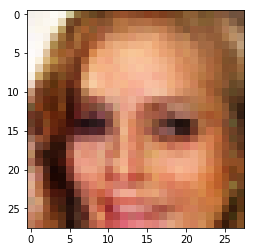

Epoch: 3/50... d_loss: 1.4121... g_loss: 0.7512...


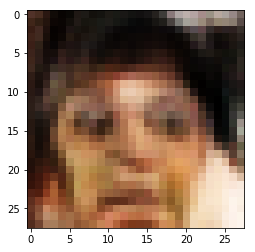

Epoch: 3/50... d_loss: 1.4068... g_loss: 0.7881...


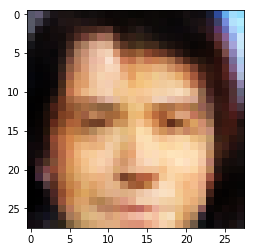

Epoch: 4/50... d_loss: 1.3868... g_loss: 0.7030...


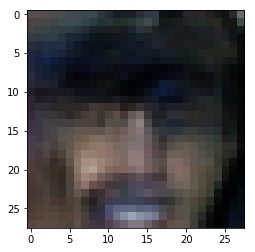

Epoch: 4/50... d_loss: 1.3971... g_loss: 0.6868...


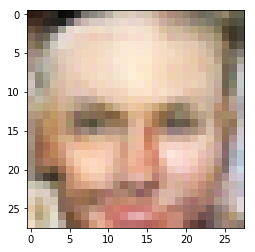

Epoch: 4/50... d_loss: 1.3790... g_loss: 0.7557...


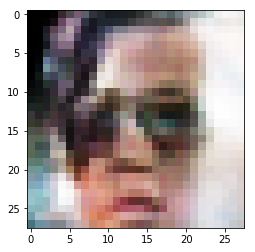

Epoch: 4/50... d_loss: 1.3837... g_loss: 0.7385...


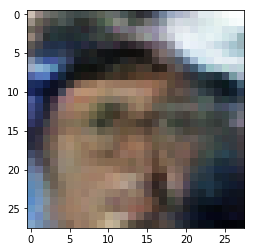

Epoch: 4/50... d_loss: 1.3901... g_loss: 0.7193...


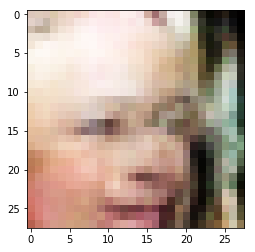

Epoch: 4/50... d_loss: 1.4174... g_loss: 0.7157...


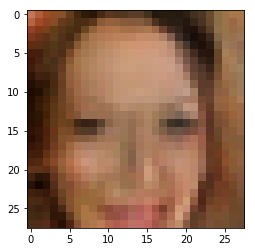

Epoch: 4/50... d_loss: 1.4101... g_loss: 0.7246...


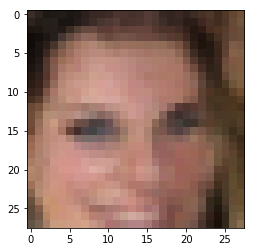

Epoch: 4/50... d_loss: 1.3934... g_loss: 0.7698...


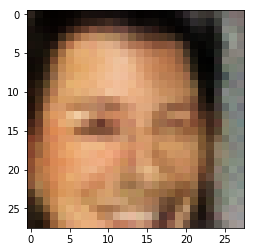

Epoch: 4/50... d_loss: 1.3762... g_loss: 0.7528...


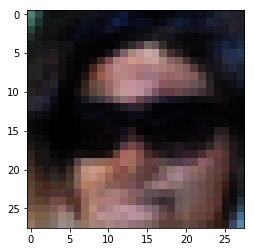

Epoch: 4/50... d_loss: 1.3625... g_loss: 0.7843...


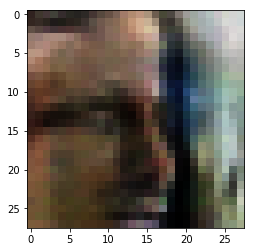

Epoch: 4/50... d_loss: 1.4114... g_loss: 0.7638...


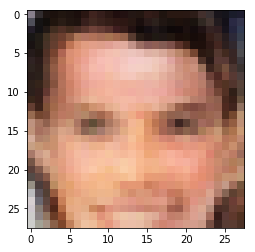

Epoch: 4/50... d_loss: 1.4255... g_loss: 0.7336...


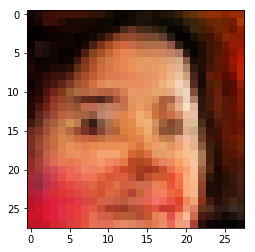

Epoch: 4/50... d_loss: 1.3807... g_loss: 0.7614...


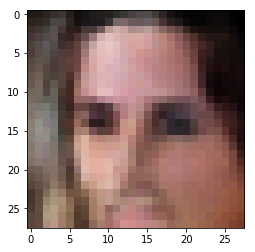

Epoch: 4/50... d_loss: 2.6927... g_loss: 0.1659...


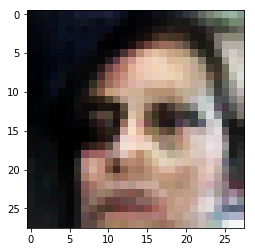

Epoch: 4/50... d_loss: 1.3774... g_loss: 0.7891...


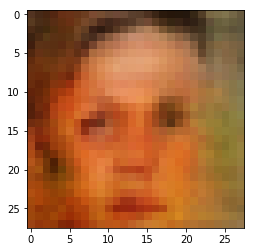

Epoch: 4/50... d_loss: 1.3811... g_loss: 0.7888...


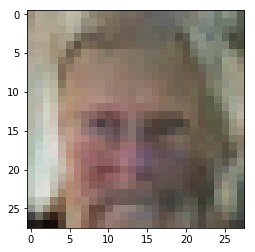

Epoch: 4/50... d_loss: 1.3828... g_loss: 0.7580...


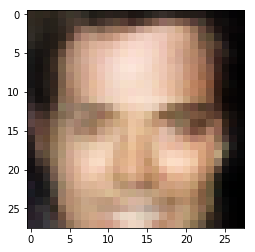

Epoch: 4/50... d_loss: 1.3870... g_loss: 0.7511...


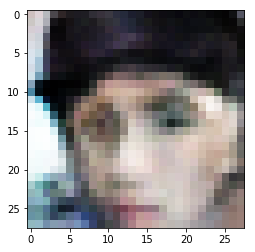

Epoch: 4/50... d_loss: 1.3536... g_loss: 0.7890...


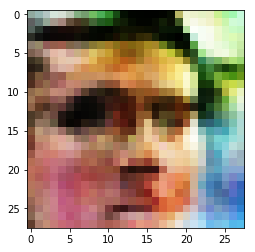

Epoch: 4/50... d_loss: 1.4016... g_loss: 0.7553...


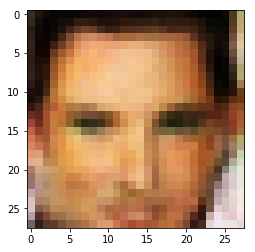

Epoch: 4/50... d_loss: 1.5026... g_loss: 0.7423...


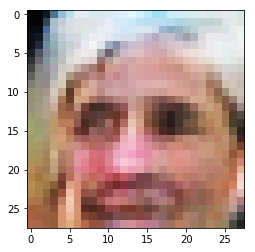

Epoch: 4/50... d_loss: 1.3494... g_loss: 0.7799...


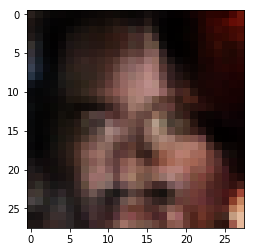

Epoch: 4/50... d_loss: 1.4056... g_loss: 0.7894...


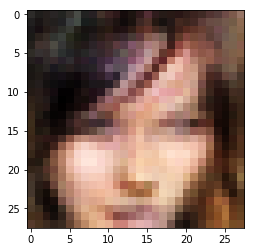

Epoch: 4/50... d_loss: 1.3332... g_loss: 0.7953...


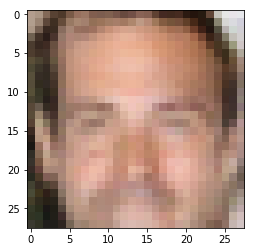

Epoch: 4/50... d_loss: 1.3491... g_loss: 0.7353...


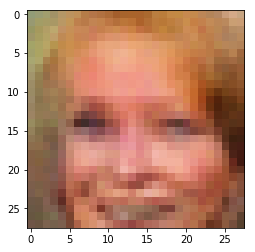

Epoch: 4/50... d_loss: 1.3859... g_loss: 0.7548...


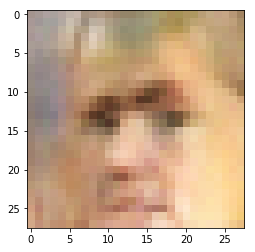

Epoch: 4/50... d_loss: 1.3922... g_loss: 0.8022...


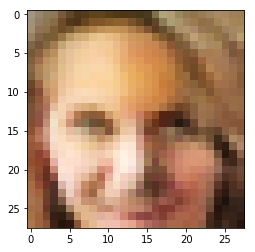

Epoch: 4/50... d_loss: 1.3422... g_loss: 0.8479...


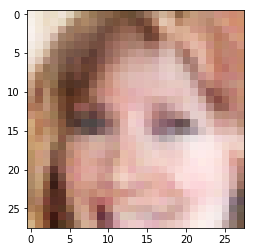

Epoch: 4/50... d_loss: 1.3451... g_loss: 0.7385...


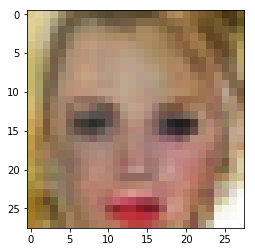

Epoch: 4/50... d_loss: 1.4041... g_loss: 0.8054...


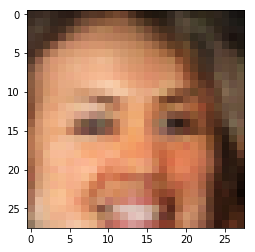

Epoch: 4/50... d_loss: 1.4166... g_loss: 0.7699...


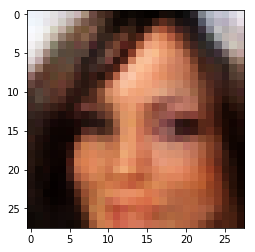

Epoch: 4/50... d_loss: 1.4190... g_loss: 0.6804...


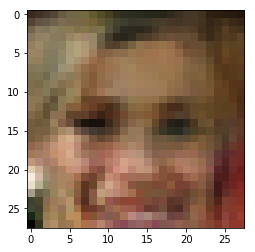

Epoch: 5/50... d_loss: 1.3910... g_loss: 0.7352...


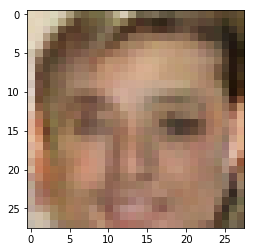

Epoch: 5/50... d_loss: 1.4244... g_loss: 0.6704...


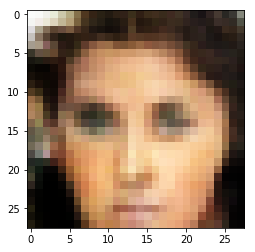

Epoch: 5/50... d_loss: 1.4398... g_loss: 0.5940...


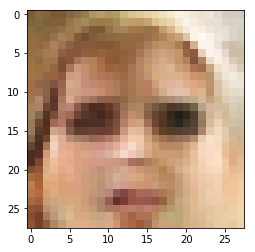

Epoch: 5/50... d_loss: 1.4157... g_loss: 0.6809...


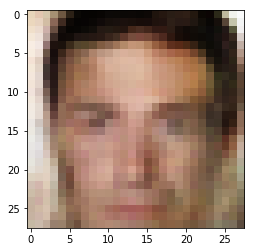

Epoch: 5/50... d_loss: 1.4563... g_loss: 0.6830...


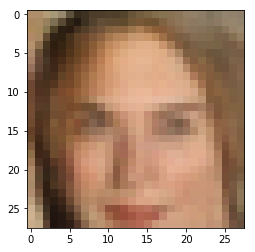

Epoch: 5/50... d_loss: 1.3745... g_loss: 0.7140...


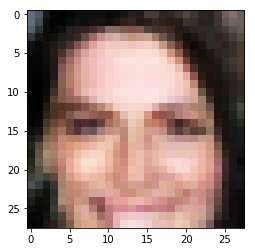

Epoch: 5/50... d_loss: 1.3178... g_loss: 0.7216...


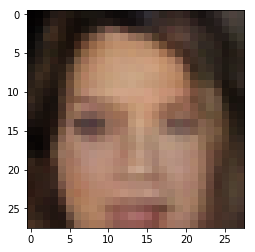

Epoch: 5/50... d_loss: 1.3868... g_loss: 0.7234...


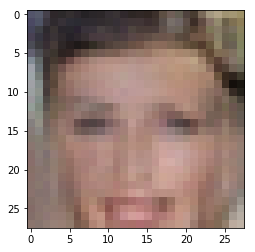

Epoch: 5/50... d_loss: 1.3555... g_loss: 0.8135...


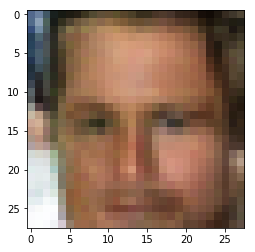

Epoch: 5/50... d_loss: 1.3714... g_loss: 0.7986...


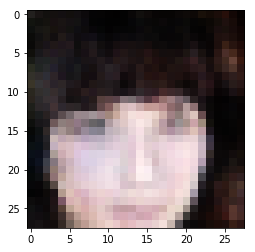

Epoch: 5/50... d_loss: 1.3974... g_loss: 0.8827...


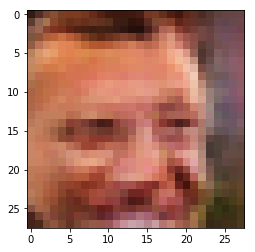

Epoch: 5/50... d_loss: 1.4036... g_loss: 0.6786...


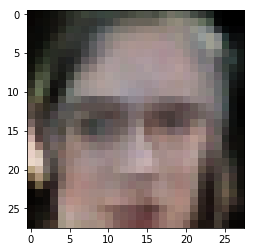

Epoch: 5/50... d_loss: 1.4273... g_loss: 0.6783...


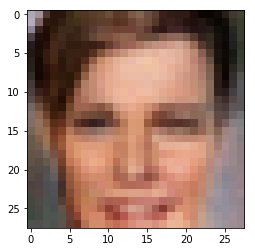

Epoch: 5/50... d_loss: 1.3895... g_loss: 0.7358...


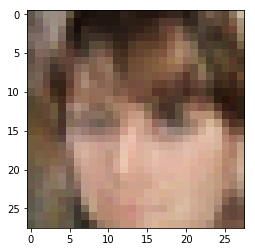

Epoch: 5/50... d_loss: 1.4354... g_loss: 0.7693...


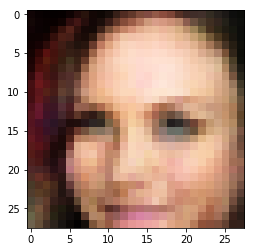

Epoch: 5/50... d_loss: 1.4040... g_loss: 0.7729...


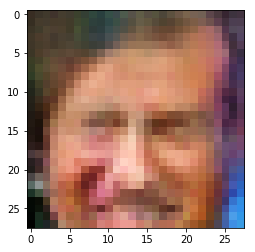

Epoch: 5/50... d_loss: 1.3277... g_loss: 0.7382...


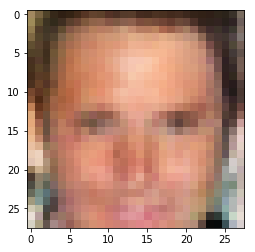

Epoch: 5/50... d_loss: 1.3523... g_loss: 0.7286...


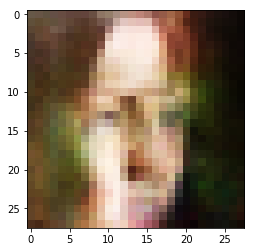

Epoch: 5/50... d_loss: 1.3770... g_loss: 0.7738...


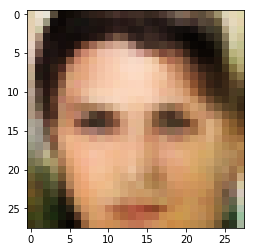

Epoch: 5/50... d_loss: 1.4294... g_loss: 0.8717...


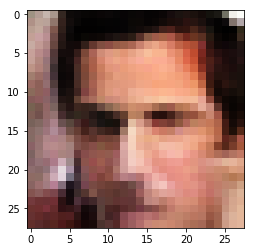

Epoch: 5/50... d_loss: 1.4177... g_loss: 0.6856...


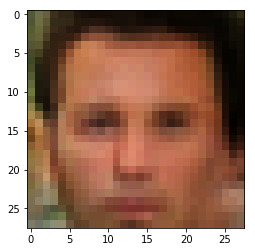

Epoch: 5/50... d_loss: 1.3691... g_loss: 0.7276...


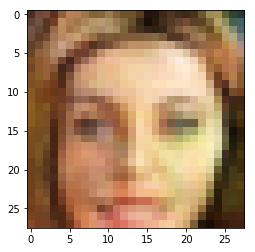

Epoch: 5/50... d_loss: 1.4012... g_loss: 0.7593...


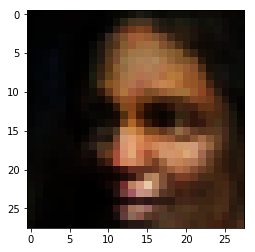

Epoch: 5/50... d_loss: 1.3616... g_loss: 0.8469...


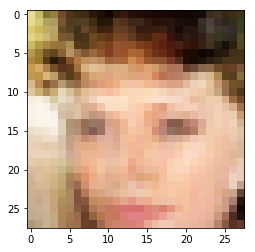

Epoch: 5/50... d_loss: 1.4120... g_loss: 0.8445...


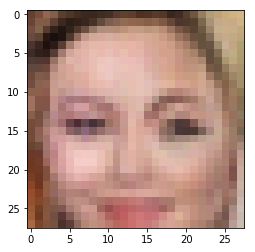

Epoch: 5/50... d_loss: 1.4357... g_loss: 0.7498...


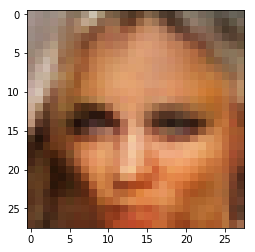

Epoch: 5/50... d_loss: 1.3726... g_loss: 0.7536...


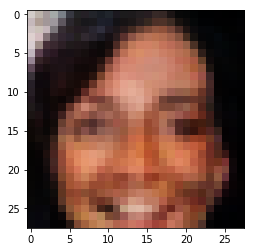

Epoch: 5/50... d_loss: 1.3885... g_loss: 0.7487...


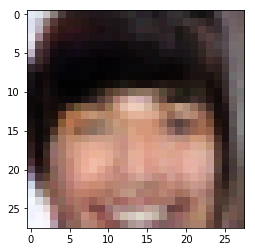

Epoch: 5/50... d_loss: 1.3554... g_loss: 0.7164...


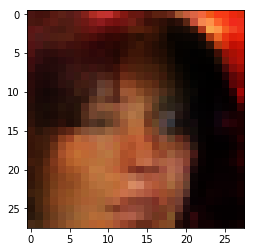

Epoch: 5/50... d_loss: 1.4200... g_loss: 0.7820...


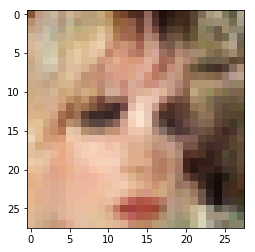

Epoch: 5/50... d_loss: 1.3896... g_loss: 0.7302...


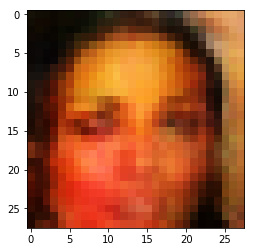

Epoch: 5/50... d_loss: 1.3907... g_loss: 0.7552...


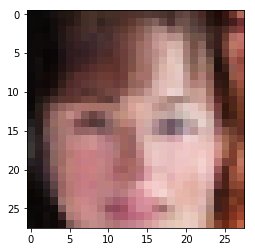

Epoch: 6/50... d_loss: 1.4108... g_loss: 0.6395...


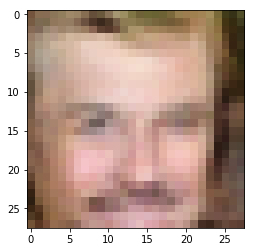

Epoch: 6/50... d_loss: 1.3978... g_loss: 0.6354...


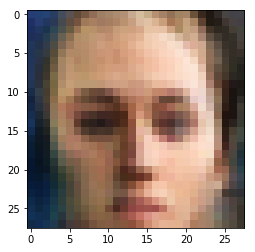

Epoch: 6/50... d_loss: 1.3951... g_loss: 0.6669...


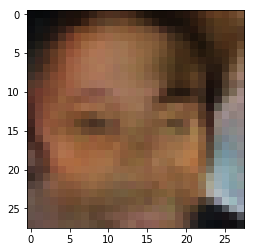

Epoch: 6/50... d_loss: 1.3419... g_loss: 0.7931...


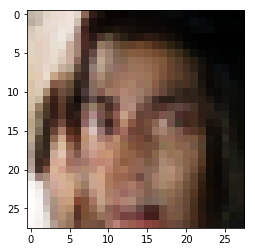

Epoch: 6/50... d_loss: 1.3692... g_loss: 0.8383...


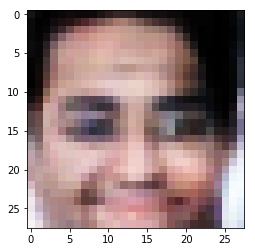

Epoch: 6/50... d_loss: 1.3891... g_loss: 0.6573...


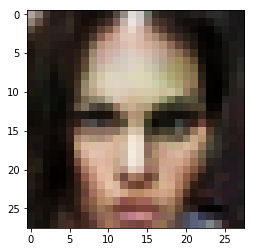

Epoch: 6/50... d_loss: 1.3658... g_loss: 0.6801...


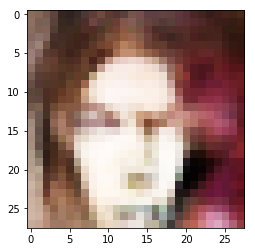

Epoch: 6/50... d_loss: 1.3900... g_loss: 0.7828...


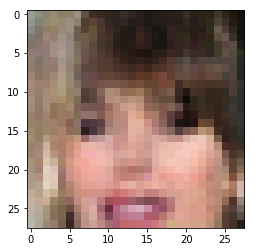

Epoch: 6/50... d_loss: 1.3737... g_loss: 0.8047...


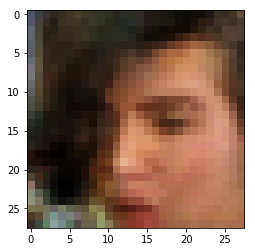

Epoch: 6/50... d_loss: 1.3172... g_loss: 0.7676...


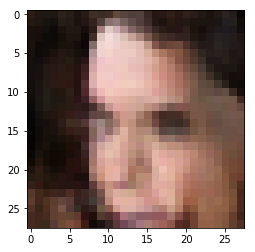

Epoch: 6/50... d_loss: 1.3860... g_loss: 0.8379...


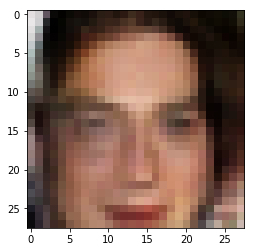

Epoch: 6/50... d_loss: 1.4057... g_loss: 0.8052...


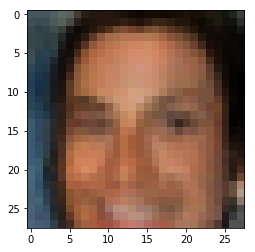

Epoch: 6/50... d_loss: 1.3955... g_loss: 0.7043...


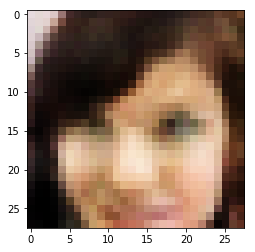

Epoch: 6/50... d_loss: 1.4063... g_loss: 0.7552...


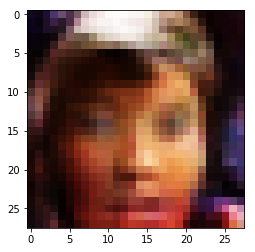

Epoch: 6/50... d_loss: 1.3588... g_loss: 0.7468...


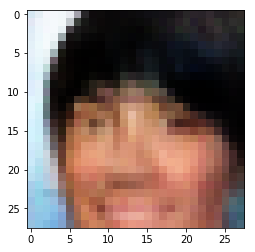

Epoch: 6/50... d_loss: 1.6836... g_loss: 0.4280...


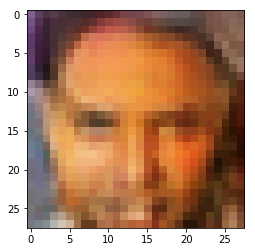

Epoch: 6/50... d_loss: 1.3894... g_loss: 0.8150...


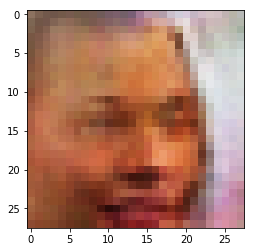

Epoch: 6/50... d_loss: 1.3011... g_loss: 0.9245...


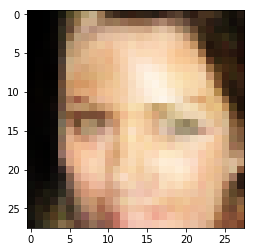

Epoch: 6/50... d_loss: 1.3465... g_loss: 0.8011...


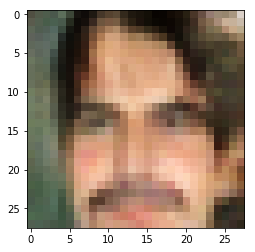

Epoch: 6/50... d_loss: 1.3435... g_loss: 0.7569...


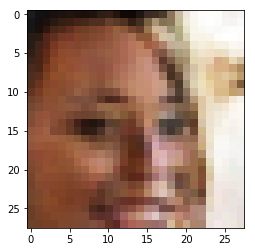

Epoch: 6/50... d_loss: 1.3977... g_loss: 0.7599...


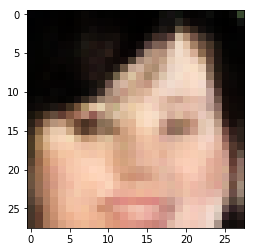

Epoch: 6/50... d_loss: 1.3436... g_loss: 0.7732...


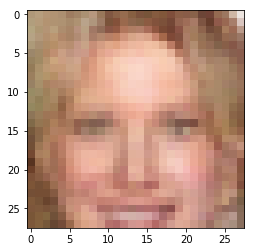

Epoch: 6/50... d_loss: 1.3306... g_loss: 0.7360...


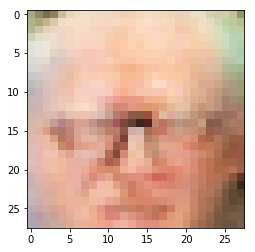

Epoch: 6/50... d_loss: 1.3569... g_loss: 0.6951...


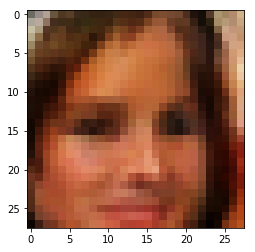

Epoch: 6/50... d_loss: 1.4352... g_loss: 0.7264...


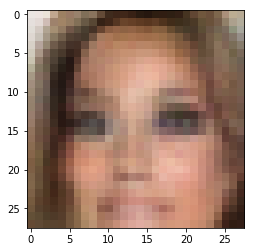

Epoch: 6/50... d_loss: 1.4357... g_loss: 0.6564...


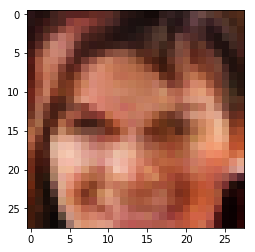

Epoch: 6/50... d_loss: 1.4047... g_loss: 0.6419...


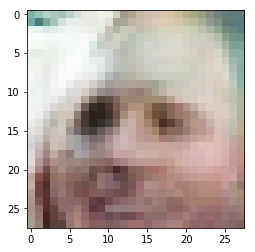

Epoch: 6/50... d_loss: 1.3974... g_loss: 0.8754...


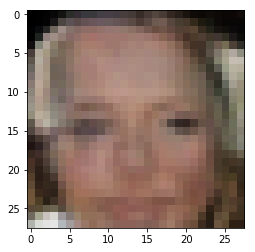

Epoch: 6/50... d_loss: 1.4148... g_loss: 1.1317...


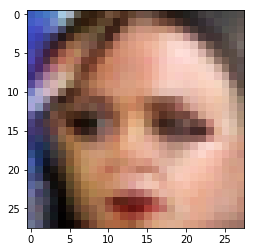

Epoch: 6/50... d_loss: 1.3621... g_loss: 0.7405...


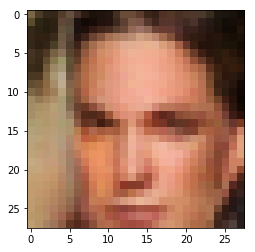

Epoch: 6/50... d_loss: 1.4450... g_loss: 0.7469...


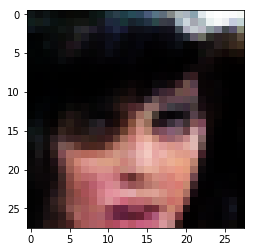

Epoch: 6/50... d_loss: 1.3482... g_loss: 0.7241...


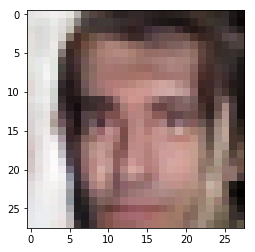

Epoch: 7/50... d_loss: 1.3514... g_loss: 0.9409...


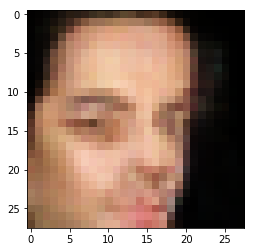

Epoch: 7/50... d_loss: 1.3532... g_loss: 0.9836...


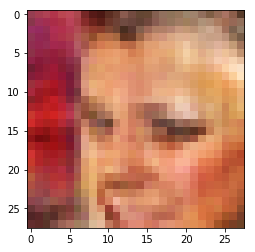

Epoch: 7/50... d_loss: 1.3450... g_loss: 0.7487...


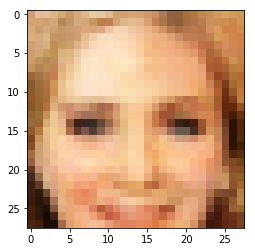

Epoch: 7/50... d_loss: 1.3729... g_loss: 0.7600...


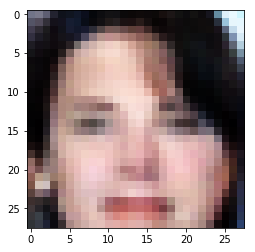

Epoch: 7/50... d_loss: 1.3824... g_loss: 0.7130...


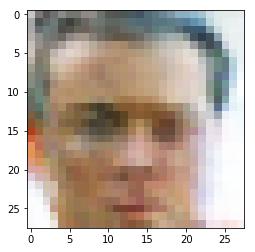

Epoch: 7/50... d_loss: 1.2829... g_loss: 0.9033...


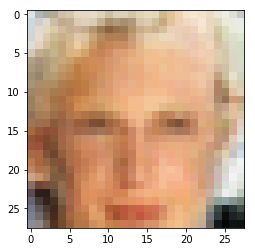

Epoch: 7/50... d_loss: 1.3845... g_loss: 0.6668...


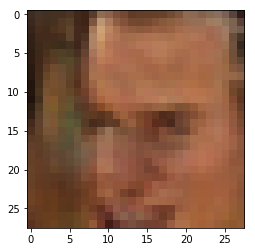

Epoch: 7/50... d_loss: 1.3106... g_loss: 0.9743...


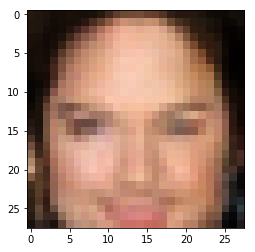

Epoch: 7/50... d_loss: 1.3224... g_loss: 0.7494...


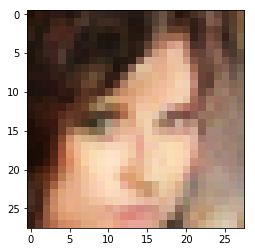

Epoch: 7/50... d_loss: 1.4269... g_loss: 0.6876...


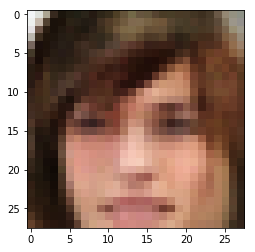

Epoch: 7/50... d_loss: 1.3903... g_loss: 0.8048...


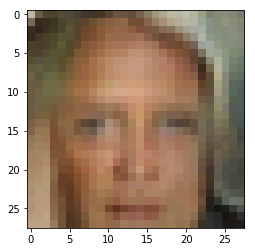

Epoch: 7/50... d_loss: 1.3913... g_loss: 0.7729...


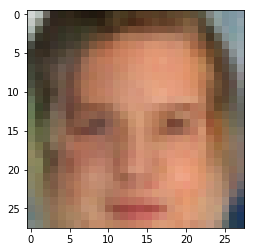

Epoch: 7/50... d_loss: 1.4035... g_loss: 1.0069...


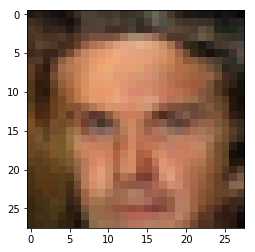

Epoch: 7/50... d_loss: 1.3972... g_loss: 0.7738...


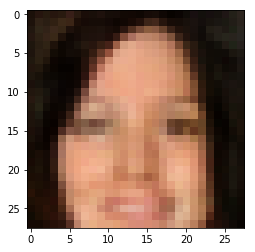

Epoch: 7/50... d_loss: 1.3465... g_loss: 0.7167...


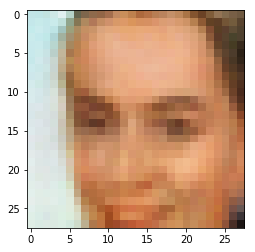

Epoch: 7/50... d_loss: 1.3666... g_loss: 0.8775...


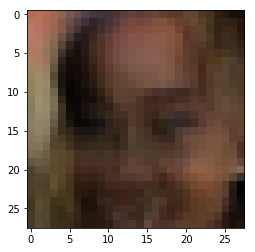

Epoch: 7/50... d_loss: 1.3505... g_loss: 0.6139...


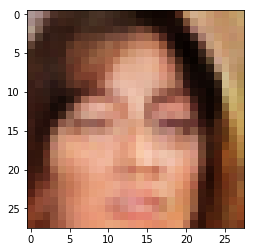

Epoch: 7/50... d_loss: 1.3932... g_loss: 0.7486...


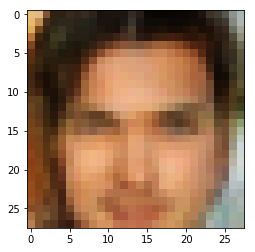

Epoch: 7/50... d_loss: 1.3142... g_loss: 0.8221...


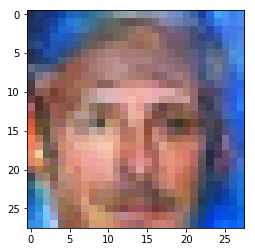

Epoch: 7/50... d_loss: 1.3490... g_loss: 0.7034...


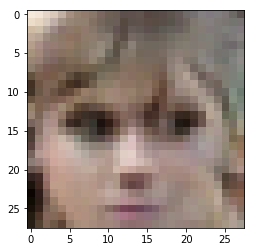

Epoch: 7/50... d_loss: 1.5815... g_loss: 0.5959...


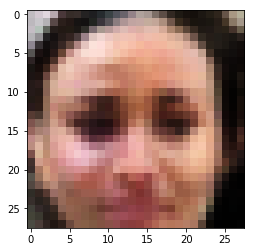

Epoch: 7/50... d_loss: 1.5192... g_loss: 0.6887...


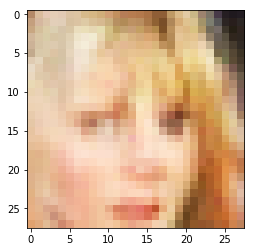

Epoch: 7/50... d_loss: 1.4075... g_loss: 0.8166...


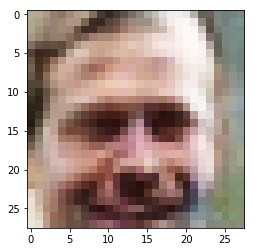

Epoch: 7/50... d_loss: 1.3620... g_loss: 0.8272...


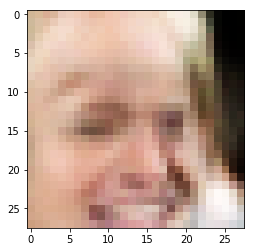

Epoch: 7/50... d_loss: 1.3550... g_loss: 0.7396...


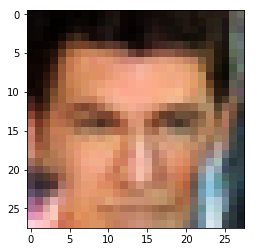

Epoch: 7/50... d_loss: 1.5736... g_loss: 0.5600...


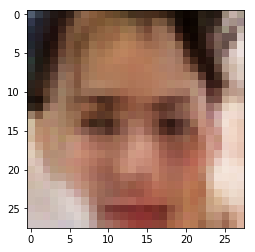

Epoch: 7/50... d_loss: 1.4218... g_loss: 0.7246...


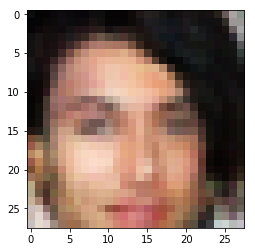

Epoch: 7/50... d_loss: 1.3256... g_loss: 0.8665...


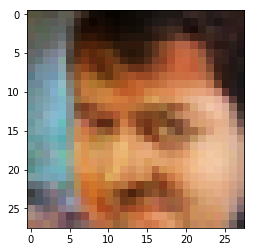

Epoch: 7/50... d_loss: 1.3454... g_loss: 0.8014...


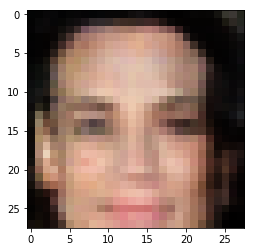

Epoch: 7/50... d_loss: 1.3125... g_loss: 0.8312...


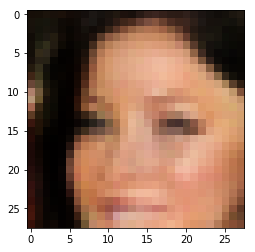

Epoch: 7/50... d_loss: 1.4777... g_loss: 0.9507...


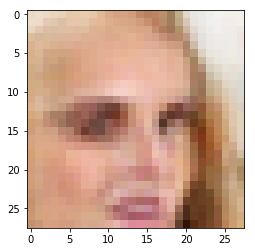

Epoch: 7/50... d_loss: 1.4288... g_loss: 0.9655...


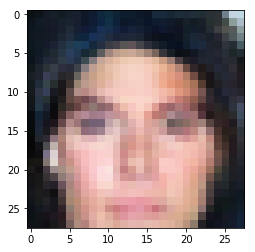

Epoch: 8/50... d_loss: 1.3824... g_loss: 0.7176...


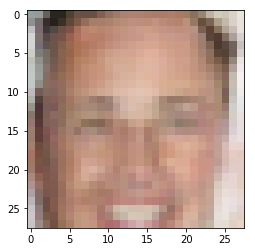

Epoch: 8/50... d_loss: 1.3506... g_loss: 0.9892...


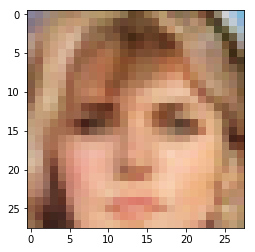

Epoch: 8/50... d_loss: 1.3087... g_loss: 0.8518...


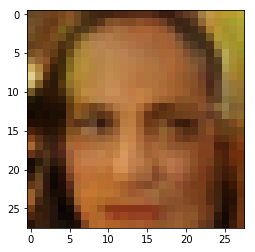

Epoch: 8/50... d_loss: 1.4515... g_loss: 0.7250...


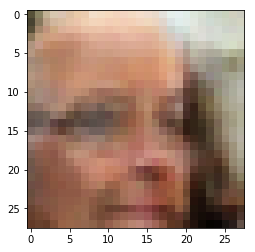

Epoch: 8/50... d_loss: 1.4495... g_loss: 0.6998...


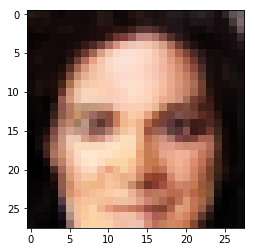

Epoch: 8/50... d_loss: 1.3436... g_loss: 0.7386...


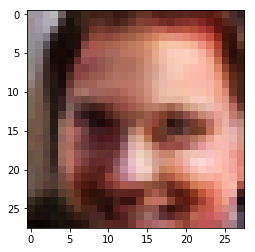

Epoch: 8/50... d_loss: 1.3421... g_loss: 0.7008...


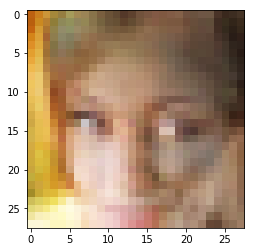

Epoch: 8/50... d_loss: 1.3083... g_loss: 0.9039...


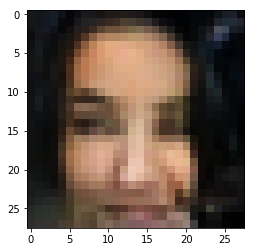

Epoch: 8/50... d_loss: 1.3849... g_loss: 0.6573...


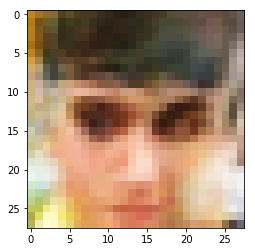

Epoch: 8/50... d_loss: 1.4040... g_loss: 0.6321...


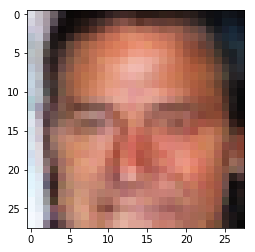

Epoch: 8/50... d_loss: 1.3911... g_loss: 0.7954...


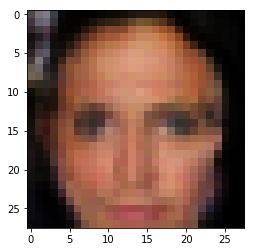

Epoch: 8/50... d_loss: 1.3882... g_loss: 0.7627...


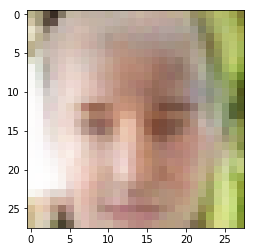

Epoch: 8/50... d_loss: 1.3751... g_loss: 0.7609...


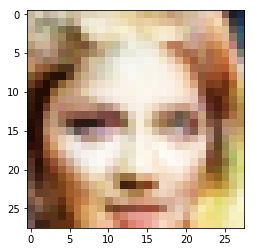

Epoch: 8/50... d_loss: 1.4998... g_loss: 1.1497...


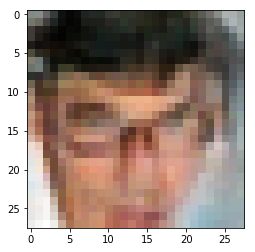

Epoch: 8/50... d_loss: 1.3300... g_loss: 0.8356...


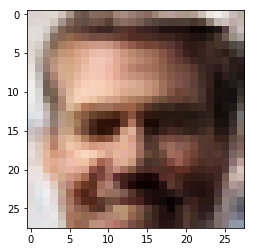

Epoch: 8/50... d_loss: 1.4971... g_loss: 0.5083...


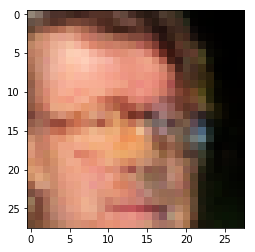

Epoch: 8/50... d_loss: 1.3415... g_loss: 0.7272...


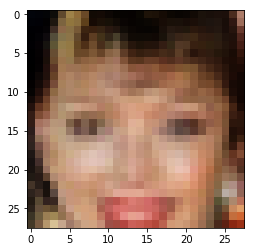

Epoch: 8/50... d_loss: 1.3744... g_loss: 0.8213...


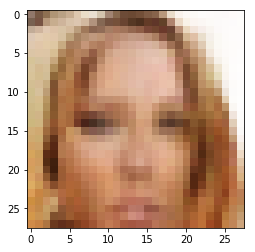

Epoch: 8/50... d_loss: 1.3273... g_loss: 0.8209...


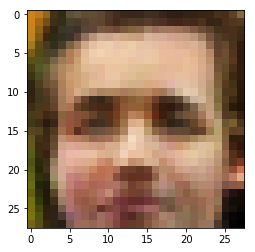

Epoch: 8/50... d_loss: 1.3123... g_loss: 1.0397...


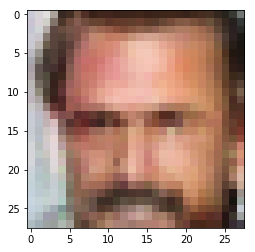

Epoch: 8/50... d_loss: 1.4838... g_loss: 0.8549...


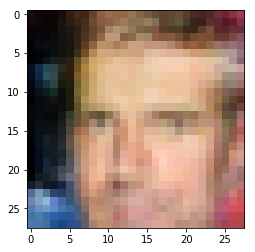

Epoch: 8/50... d_loss: 1.3672... g_loss: 0.7381...


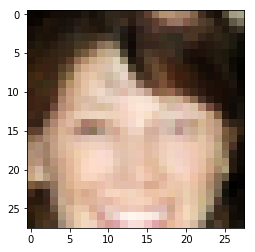

Epoch: 8/50... d_loss: 1.3573... g_loss: 0.7874...


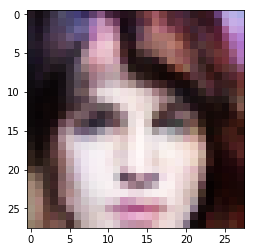

Epoch: 8/50... d_loss: 1.4411... g_loss: 0.7377...


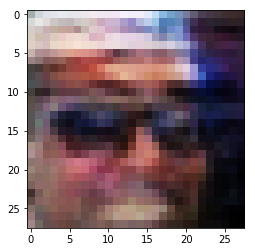

Epoch: 8/50... d_loss: 1.3671... g_loss: 0.7729...


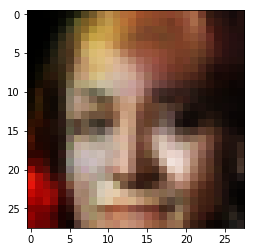

Epoch: 8/50... d_loss: 1.3757... g_loss: 0.7685...


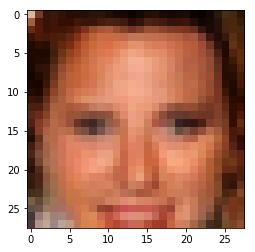

Epoch: 8/50... d_loss: 1.3457... g_loss: 0.7992...


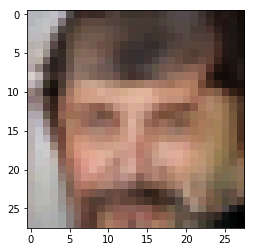

Epoch: 8/50... d_loss: 1.2902... g_loss: 0.9333...


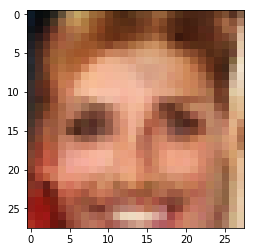

Epoch: 8/50... d_loss: 1.3292... g_loss: 0.9672...


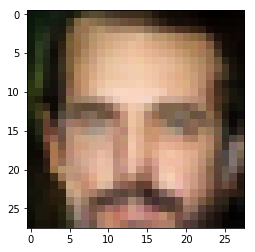

Epoch: 8/50... d_loss: 1.4360... g_loss: 0.6915...


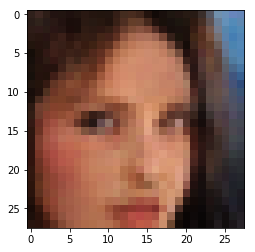

Epoch: 8/50... d_loss: 1.3402... g_loss: 0.7112...


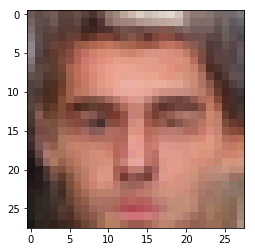

Epoch: 8/50... d_loss: 1.3299... g_loss: 0.8280...


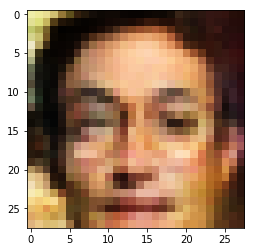

Epoch: 9/50... d_loss: 1.3426... g_loss: 0.7284...


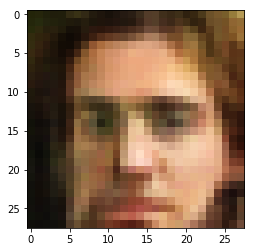

Epoch: 9/50... d_loss: 1.3651... g_loss: 0.7875...


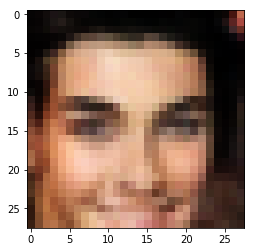

Epoch: 9/50... d_loss: 1.3097... g_loss: 0.6899...


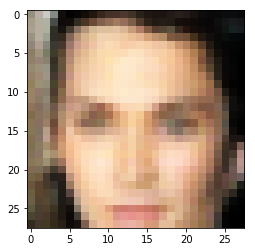

Epoch: 9/50... d_loss: 1.3895... g_loss: 0.6988...


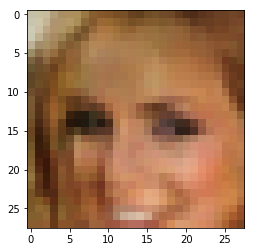

Epoch: 9/50... d_loss: 1.3056... g_loss: 0.7410...


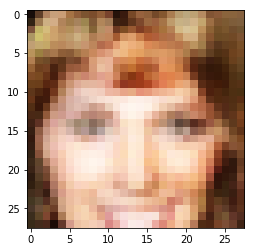

Epoch: 9/50... d_loss: 1.3172... g_loss: 1.0266...


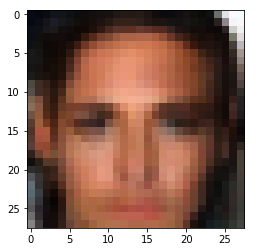

Epoch: 9/50... d_loss: 1.3196... g_loss: 0.7304...


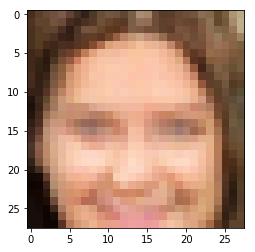

Epoch: 9/50... d_loss: 1.2800... g_loss: 0.8781...


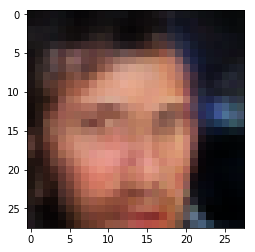

Epoch: 9/50... d_loss: 1.4169... g_loss: 0.6072...


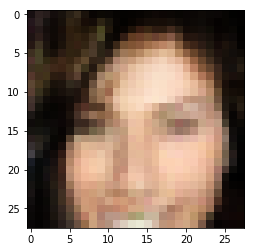

Epoch: 9/50... d_loss: 1.2624... g_loss: 0.7521...


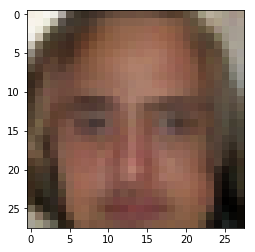

Epoch: 9/50... d_loss: 1.5250... g_loss: 0.5593...


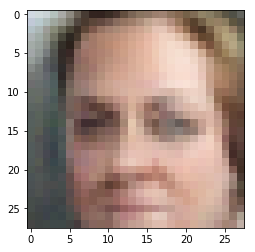

Epoch: 9/50... d_loss: 1.3213... g_loss: 0.8486...


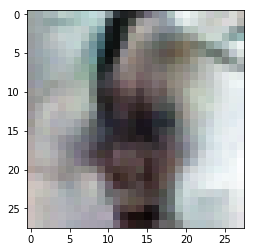

Epoch: 9/50... d_loss: 1.2655... g_loss: 0.8015...


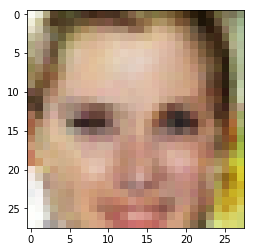

Epoch: 9/50... d_loss: 1.4228... g_loss: 0.7554...


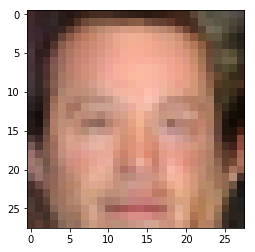

Epoch: 9/50... d_loss: 1.3898... g_loss: 0.7378...


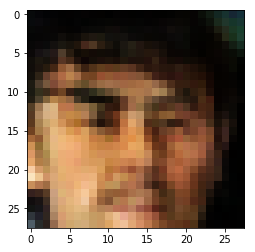

Epoch: 9/50... d_loss: 1.3017... g_loss: 0.7315...


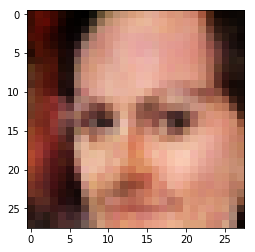

Epoch: 9/50... d_loss: 1.3213... g_loss: 0.7020...


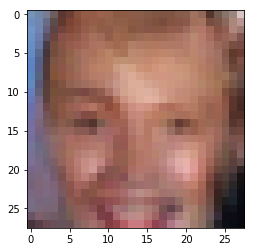

Epoch: 9/50... d_loss: 1.3444... g_loss: 0.7274...


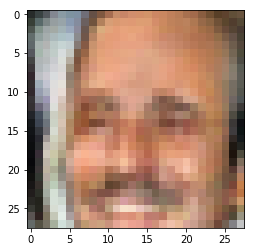

Epoch: 9/50... d_loss: 1.3684... g_loss: 0.8376...


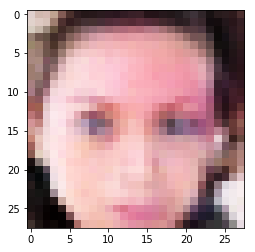

Epoch: 9/50... d_loss: 1.2612... g_loss: 0.7657...


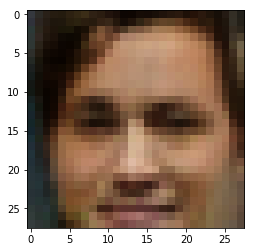

Epoch: 9/50... d_loss: 1.3449... g_loss: 0.9053...


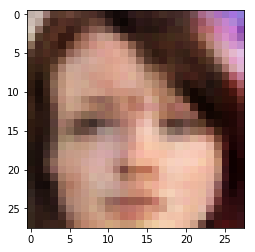

Epoch: 9/50... d_loss: 1.3018... g_loss: 0.8755...


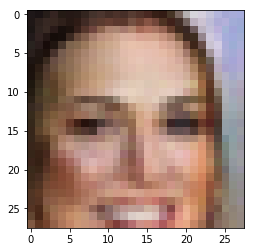

Epoch: 9/50... d_loss: 1.3196... g_loss: 0.7986...


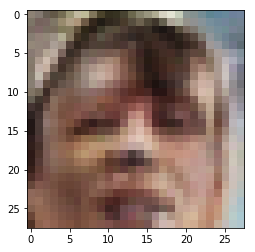

Epoch: 9/50... d_loss: 1.3415... g_loss: 0.9003...


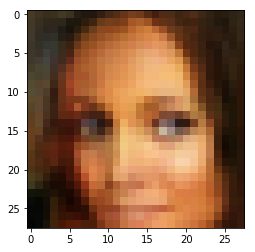

Epoch: 9/50... d_loss: 1.3216... g_loss: 0.9075...


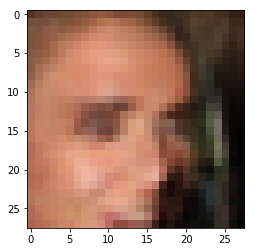

Epoch: 9/50... d_loss: 1.4054... g_loss: 0.7542...


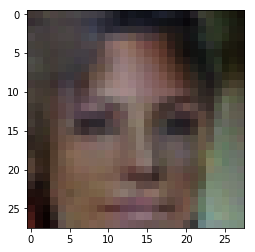

Epoch: 9/50... d_loss: 1.4056... g_loss: 0.7183...


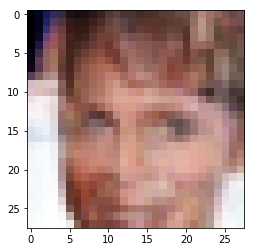

Epoch: 9/50... d_loss: 1.3634... g_loss: 0.9002...


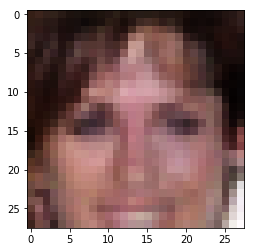

Epoch: 9/50... d_loss: 1.2827... g_loss: 0.8130...


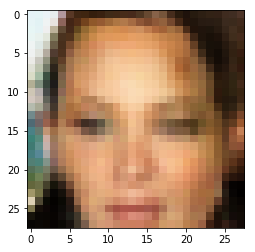

Epoch: 9/50... d_loss: 1.3106... g_loss: 0.8941...


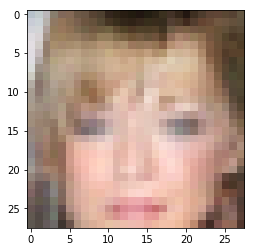

Epoch: 9/50... d_loss: 1.3822... g_loss: 0.6585...


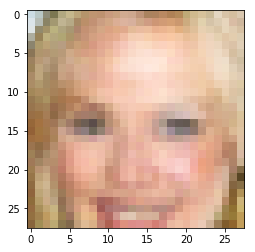

Epoch: 9/50... d_loss: 1.4959... g_loss: 1.4983...


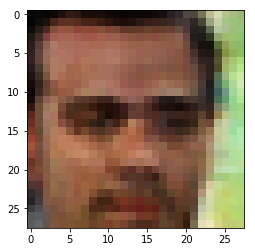

Epoch: 10/50... d_loss: 1.4206... g_loss: 0.6684...


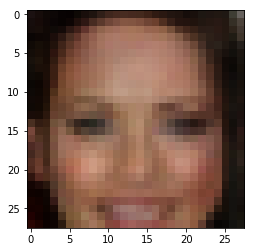

Epoch: 10/50... d_loss: 1.4455... g_loss: 1.2378...


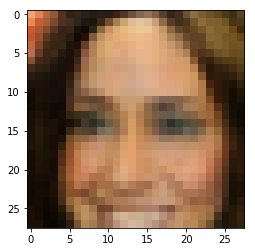

Epoch: 10/50... d_loss: 1.2798... g_loss: 0.7263...


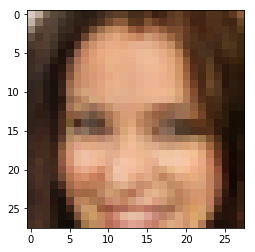

Epoch: 10/50... d_loss: 1.3740... g_loss: 0.7273...


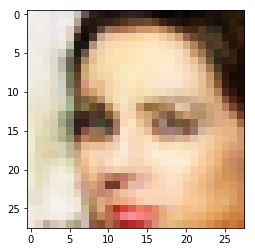

Epoch: 10/50... d_loss: 1.2936... g_loss: 0.8845...


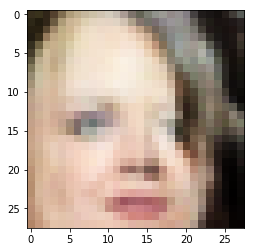

Epoch: 10/50... d_loss: 1.2991... g_loss: 0.7432...


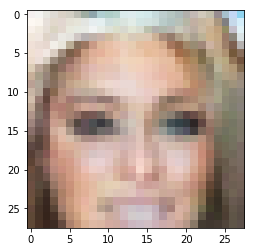

Epoch: 10/50... d_loss: 1.3711... g_loss: 0.7318...


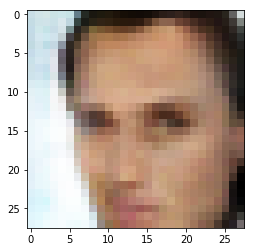

Epoch: 10/50... d_loss: 1.3979... g_loss: 0.7509...


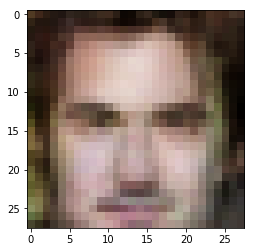

Epoch: 10/50... d_loss: 1.4235... g_loss: 0.6301...


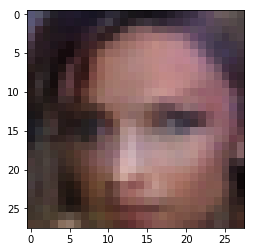

Epoch: 10/50... d_loss: 1.3307... g_loss: 0.7618...


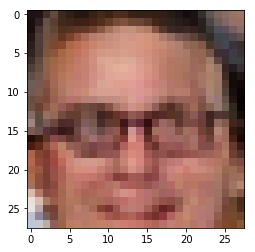

Epoch: 10/50... d_loss: 1.3641... g_loss: 0.6316...


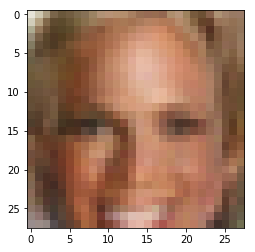

Epoch: 10/50... d_loss: 1.3786... g_loss: 0.8152...


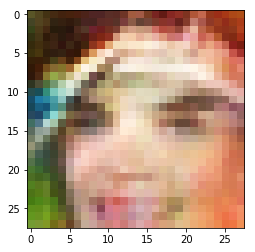

Epoch: 10/50... d_loss: 1.3364... g_loss: 0.7575...


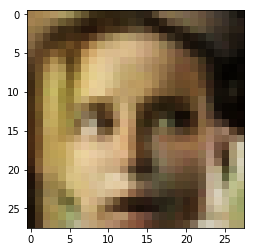

Epoch: 10/50... d_loss: 1.3885... g_loss: 0.8380...


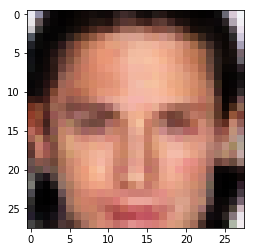

Epoch: 10/50... d_loss: 1.2516... g_loss: 0.8184...


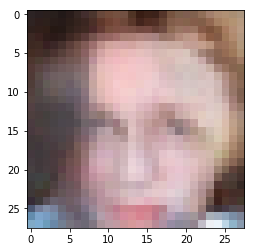

Epoch: 10/50... d_loss: 1.4880... g_loss: 0.5521...


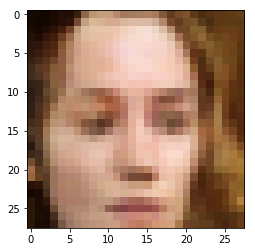

Epoch: 10/50... d_loss: 1.3081... g_loss: 0.7952...


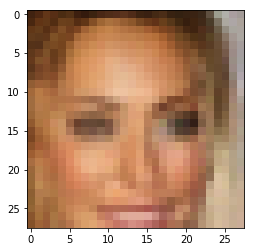

Epoch: 10/50... d_loss: 1.5051... g_loss: 0.7116...


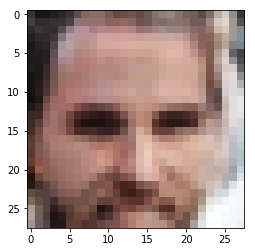

Epoch: 10/50... d_loss: 1.2358... g_loss: 0.8901...


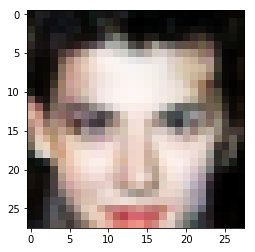

Epoch: 10/50... d_loss: 1.3330... g_loss: 0.9391...


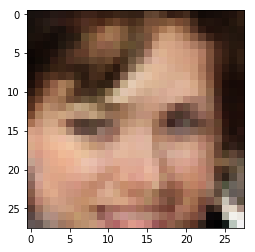

Epoch: 10/50... d_loss: 1.4893... g_loss: 0.5628...


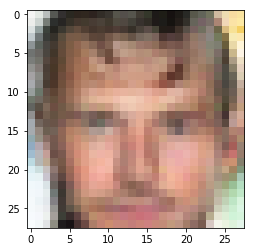

Epoch: 10/50... d_loss: 1.3673... g_loss: 0.8483...


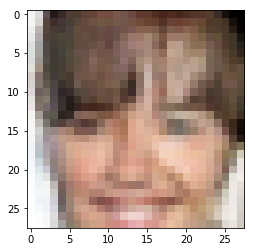

Epoch: 10/50... d_loss: 1.3101... g_loss: 0.8892...


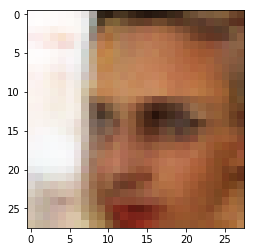

Epoch: 10/50... d_loss: 1.3883... g_loss: 0.7559...


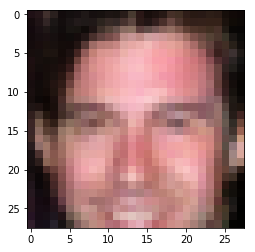

Epoch: 10/50... d_loss: 1.3973... g_loss: 0.7136...


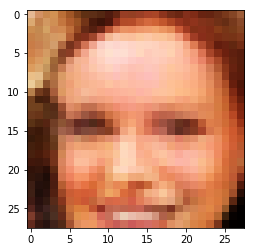

Epoch: 10/50... d_loss: 1.3862... g_loss: 0.7453...


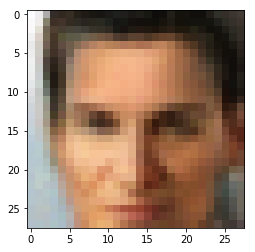

Epoch: 10/50... d_loss: 1.3021... g_loss: 0.7234...


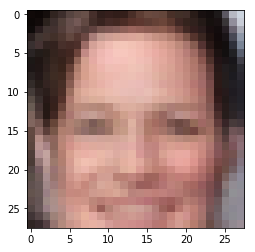

Epoch: 10/50... d_loss: 1.3680... g_loss: 0.7947...


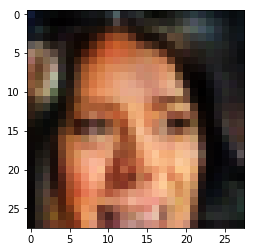

Epoch: 10/50... d_loss: 1.3098... g_loss: 0.8027...


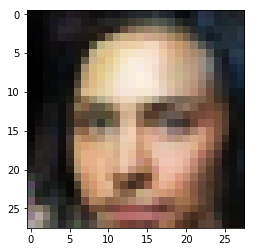

Epoch: 10/50... d_loss: 1.3807... g_loss: 0.6030...


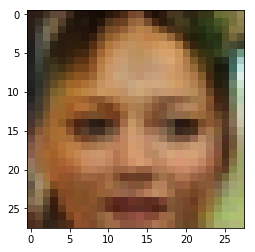

Epoch: 10/50... d_loss: 1.5246... g_loss: 1.2542...


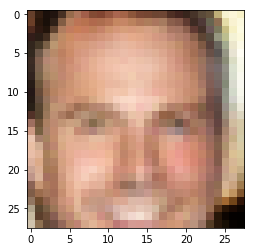

Epoch: 10/50... d_loss: 1.2997... g_loss: 0.7973...


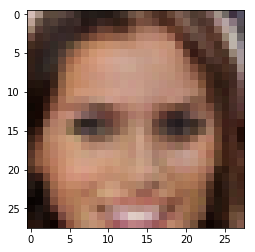

Epoch: 11/50... d_loss: 1.4136... g_loss: 0.5849...


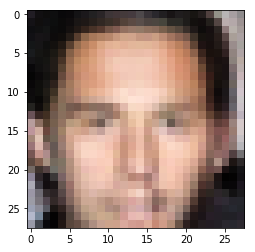

Epoch: 11/50... d_loss: 1.2904... g_loss: 0.7024...


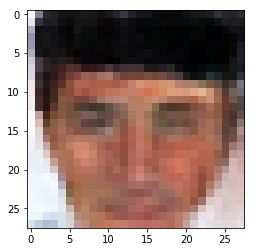

Epoch: 11/50... d_loss: 1.5901... g_loss: 0.4464...


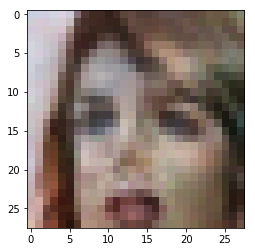

Epoch: 11/50... d_loss: 1.3575... g_loss: 0.6468...


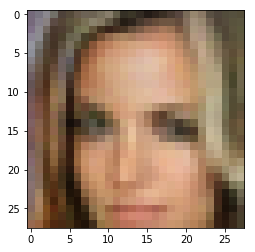

Epoch: 11/50... d_loss: 1.4151... g_loss: 0.7039...


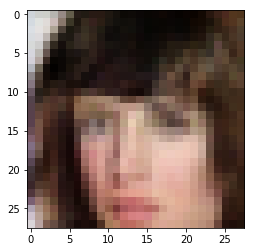

Epoch: 11/50... d_loss: 1.2609... g_loss: 0.8787...


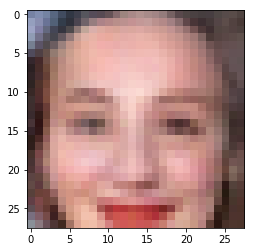

Epoch: 11/50... d_loss: 1.4071... g_loss: 1.2685...


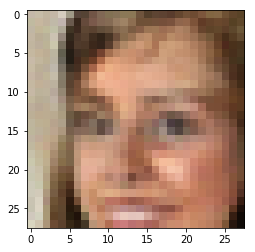

Epoch: 11/50... d_loss: 1.5665... g_loss: 0.7097...


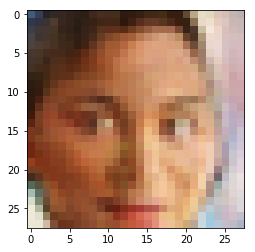

Epoch: 11/50... d_loss: 1.4837... g_loss: 0.5456...


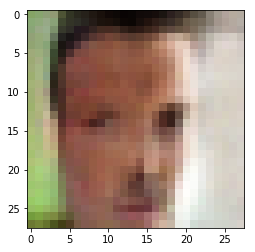

Epoch: 11/50... d_loss: 1.2269... g_loss: 0.8157...


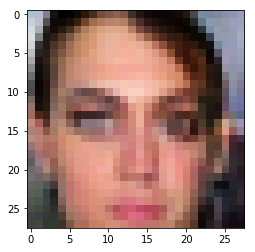

Epoch: 11/50... d_loss: 1.3407... g_loss: 0.7355...


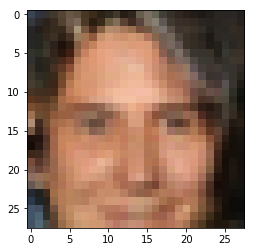

Epoch: 11/50... d_loss: 1.3702... g_loss: 0.7638...


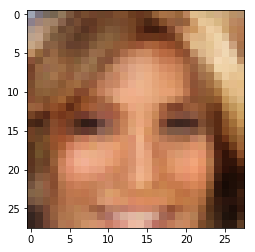

Epoch: 11/50... d_loss: 1.3346... g_loss: 0.7253...


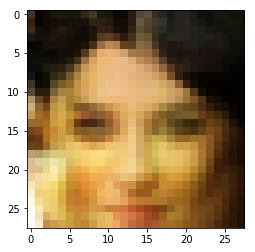

Epoch: 11/50... d_loss: 1.3139... g_loss: 1.0025...


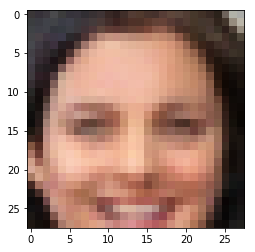

Epoch: 11/50... d_loss: 1.2701... g_loss: 0.8503...


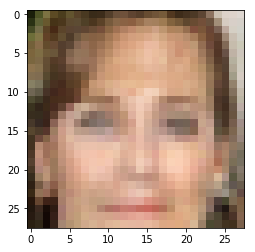

Epoch: 11/50... d_loss: 1.4167... g_loss: 0.7479...


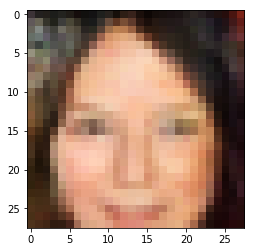

Epoch: 11/50... d_loss: 1.4758... g_loss: 0.5515...


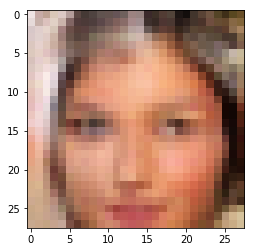

Epoch: 11/50... d_loss: 1.3515... g_loss: 0.7154...


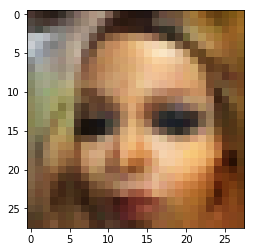

Epoch: 11/50... d_loss: 1.2453... g_loss: 0.7347...


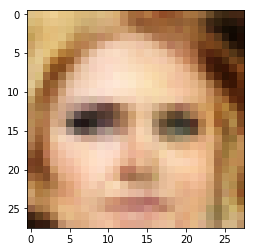

Epoch: 11/50... d_loss: 1.2646... g_loss: 1.0926...


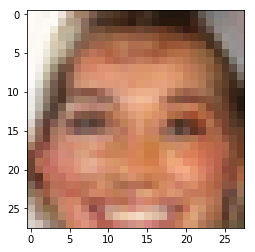

Epoch: 11/50... d_loss: 1.3672... g_loss: 0.8103...


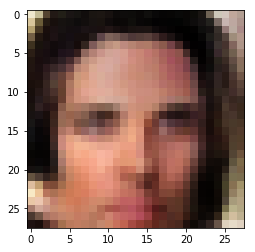

Epoch: 11/50... d_loss: 1.3493... g_loss: 0.6830...


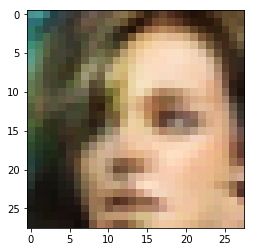

Epoch: 11/50... d_loss: 1.3471... g_loss: 0.7410...


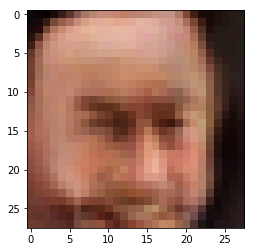

Epoch: 11/50... d_loss: 1.6150... g_loss: 1.5307...


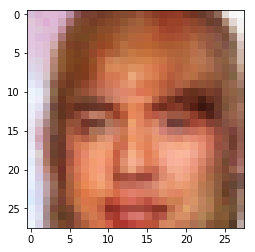

Epoch: 11/50... d_loss: 1.2574... g_loss: 0.7753...


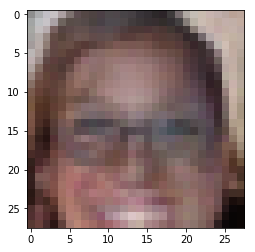

Epoch: 11/50... d_loss: 1.3443... g_loss: 0.7813...


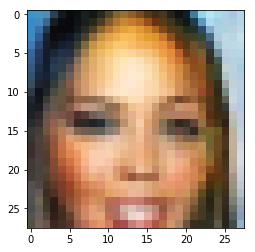

Epoch: 11/50... d_loss: 1.3681... g_loss: 0.6634...


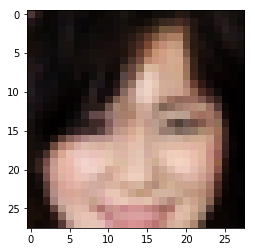

Epoch: 11/50... d_loss: 1.2462... g_loss: 0.8835...


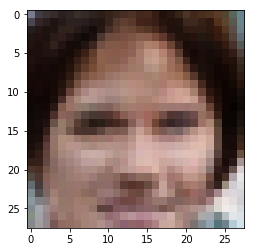

Epoch: 11/50... d_loss: 1.2177... g_loss: 0.9203...


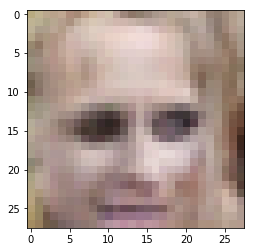

Epoch: 11/50... d_loss: 1.3078... g_loss: 0.7477...


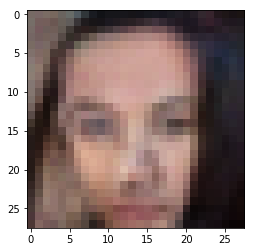

Epoch: 11/50... d_loss: 1.4044... g_loss: 0.7471...


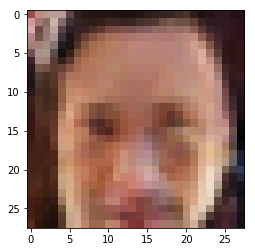

Epoch: 11/50... d_loss: 1.2681... g_loss: 0.7646...


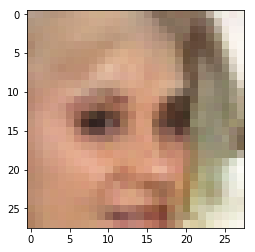

Epoch: 12/50... d_loss: 1.3982... g_loss: 0.7076...


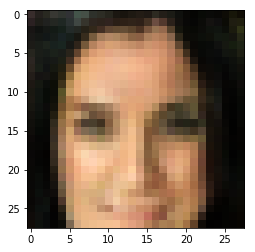

Epoch: 12/50... d_loss: 1.3541... g_loss: 0.7724...


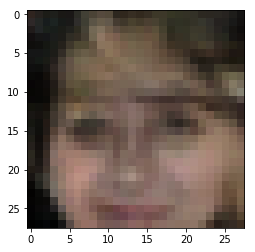

Epoch: 12/50... d_loss: 1.2788... g_loss: 0.7325...


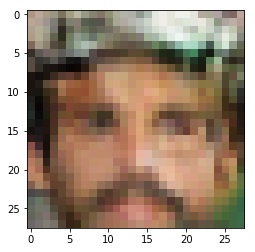

Epoch: 12/50... d_loss: 1.3027... g_loss: 0.8098...


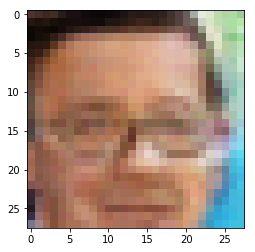

Epoch: 12/50... d_loss: 1.2822... g_loss: 0.9392...


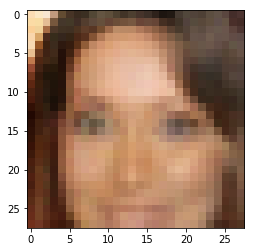

Epoch: 12/50... d_loss: 1.4285... g_loss: 0.5824...


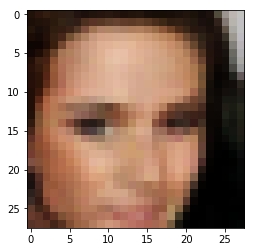

Epoch: 12/50... d_loss: 1.2479... g_loss: 0.8007...


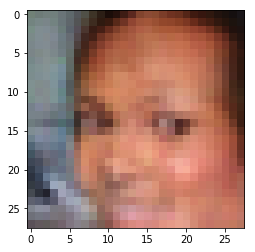

Epoch: 12/50... d_loss: 1.3043... g_loss: 1.1200...


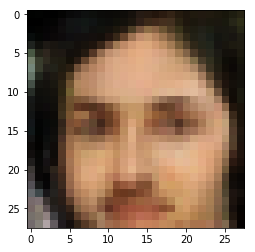

Epoch: 12/50... d_loss: 1.3783... g_loss: 0.7275...


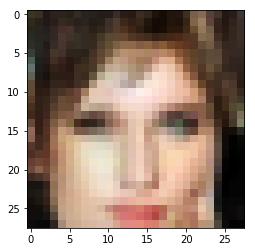

Epoch: 12/50... d_loss: 1.4042... g_loss: 0.6416...


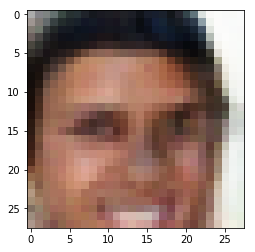

Epoch: 12/50... d_loss: 1.4224... g_loss: 1.3736...


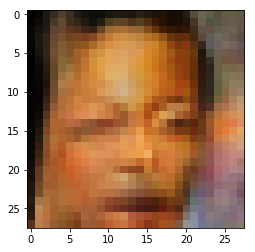

Epoch: 12/50... d_loss: 1.3991... g_loss: 0.6907...


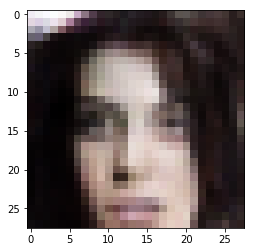

Epoch: 12/50... d_loss: 1.3043... g_loss: 0.7719...


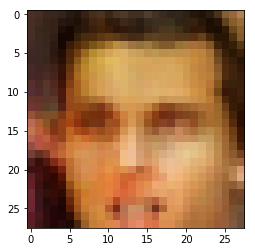

Epoch: 12/50... d_loss: 1.2610... g_loss: 1.0237...


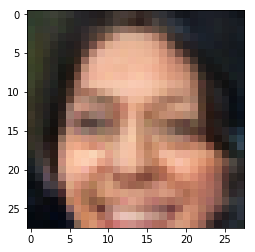

Epoch: 12/50... d_loss: 1.2322... g_loss: 0.7938...


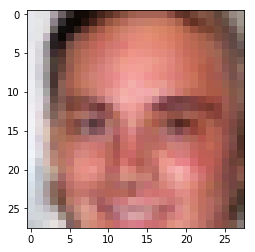

Epoch: 12/50... d_loss: 1.2515... g_loss: 0.7934...


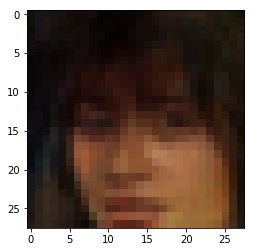

Epoch: 12/50... d_loss: 1.3666... g_loss: 0.6973...


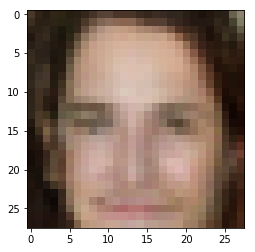

Epoch: 12/50... d_loss: 1.2634... g_loss: 0.8684...


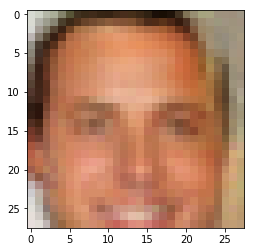

Epoch: 12/50... d_loss: 1.1923... g_loss: 1.0444...


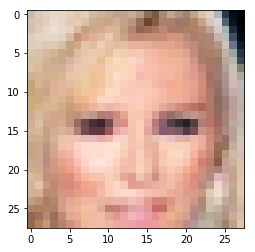

Epoch: 12/50... d_loss: 1.3450... g_loss: 0.9445...


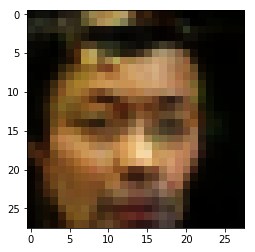

Epoch: 12/50... d_loss: 1.3352... g_loss: 0.9321...


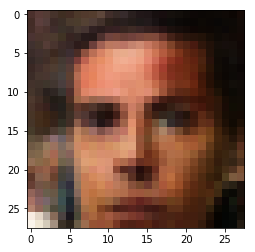

Epoch: 12/50... d_loss: 1.2983... g_loss: 0.8205...


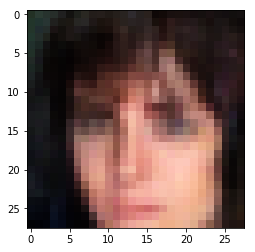

Epoch: 12/50... d_loss: 1.3358... g_loss: 0.8365...


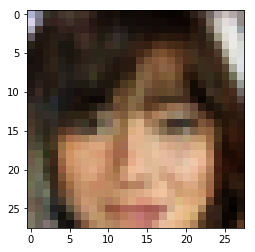

Epoch: 12/50... d_loss: 1.3448... g_loss: 0.7091...


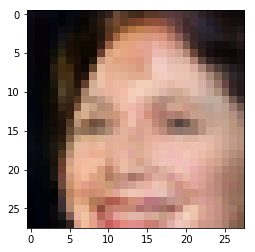

Epoch: 12/50... d_loss: 1.3596... g_loss: 1.0998...


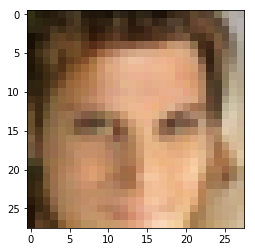

Epoch: 12/50... d_loss: 1.1830... g_loss: 0.8741...


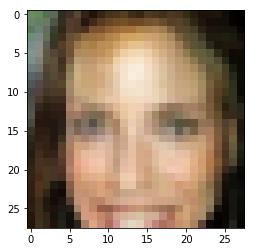

Epoch: 12/50... d_loss: 1.4669... g_loss: 0.5480...


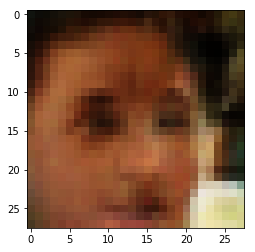

Epoch: 12/50... d_loss: 1.5392... g_loss: 0.5883...


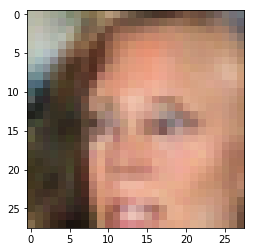

Epoch: 12/50... d_loss: 1.2332... g_loss: 0.9855...


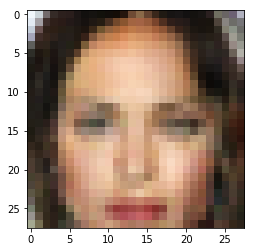

Epoch: 12/50... d_loss: 1.2064... g_loss: 0.9099...


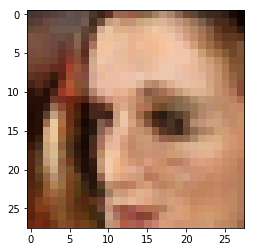

Epoch: 12/50... d_loss: 1.4314... g_loss: 0.6987...


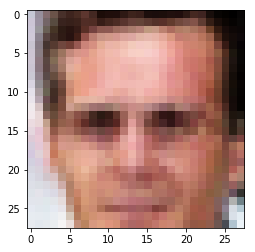

Epoch: 12/50... d_loss: 1.2736... g_loss: 0.9829...


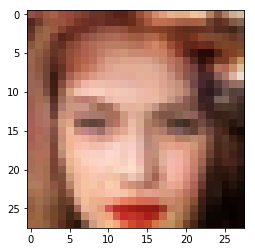

Epoch: 13/50... d_loss: 1.4460... g_loss: 0.5840...


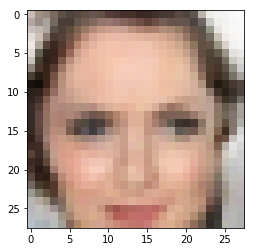

Epoch: 13/50... d_loss: 1.3519... g_loss: 0.7106...


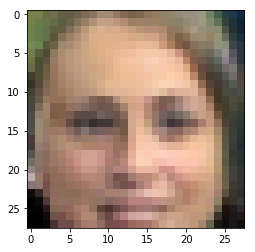

Epoch: 13/50... d_loss: 1.1632... g_loss: 0.9046...


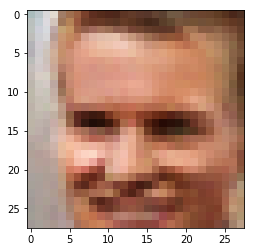

Epoch: 13/50... d_loss: 1.5170... g_loss: 1.5432...


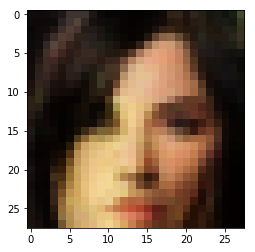

Epoch: 13/50... d_loss: 1.2577... g_loss: 0.7581...


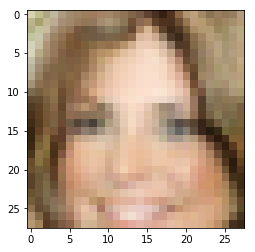

Epoch: 13/50... d_loss: 1.2060... g_loss: 0.9358...


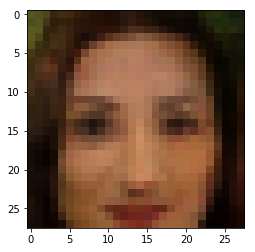

Epoch: 13/50... d_loss: 1.2644... g_loss: 0.9282...


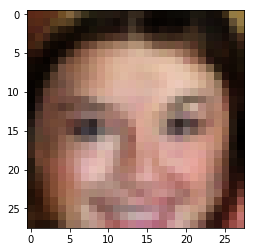

Epoch: 13/50... d_loss: 1.1982... g_loss: 0.9289...


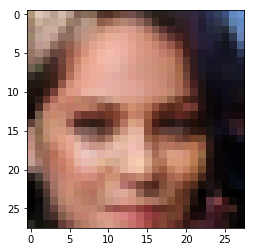

Epoch: 13/50... d_loss: 1.2738... g_loss: 0.7564...


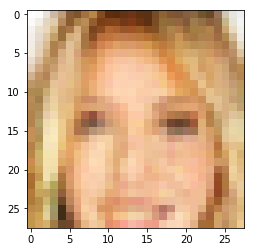

Epoch: 13/50... d_loss: 1.2740... g_loss: 0.7544...


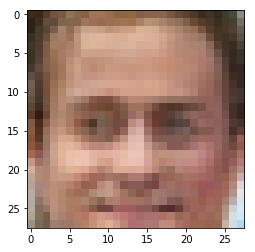

Epoch: 13/50... d_loss: 1.2782... g_loss: 0.8609...


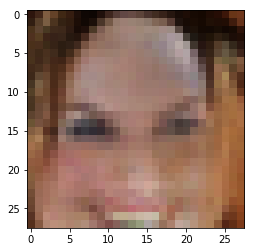

Epoch: 13/50... d_loss: 1.2309... g_loss: 1.0631...


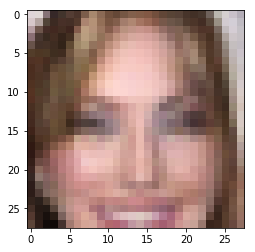

Epoch: 13/50... d_loss: 1.4316... g_loss: 0.6011...


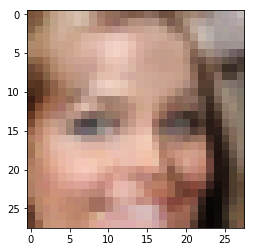

Epoch: 13/50... d_loss: 1.3428... g_loss: 0.6807...


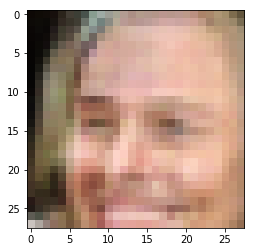

Epoch: 13/50... d_loss: 1.2436... g_loss: 0.8699...


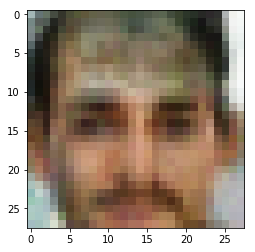

Epoch: 13/50... d_loss: 1.1965... g_loss: 0.8829...


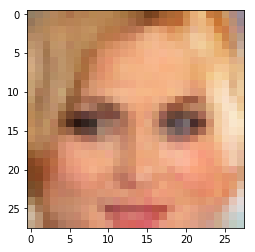

Epoch: 13/50... d_loss: 1.4705... g_loss: 0.5305...


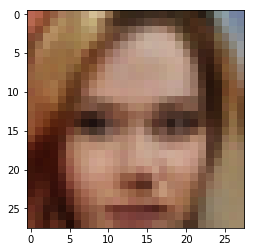

Epoch: 13/50... d_loss: 1.3005... g_loss: 0.8318...


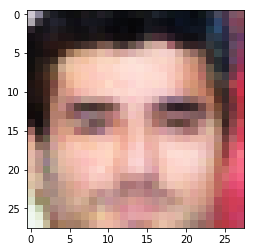

Epoch: 13/50... d_loss: 1.4293... g_loss: 0.5661...


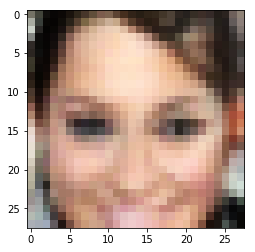

Epoch: 13/50... d_loss: 1.3581... g_loss: 0.7298...


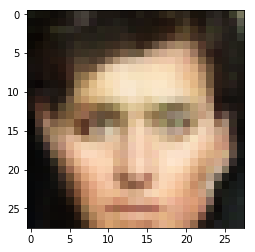

Epoch: 13/50... d_loss: 1.2055... g_loss: 0.8975...


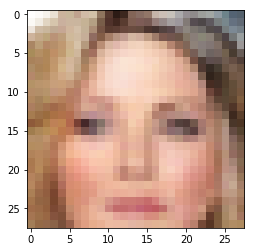

Epoch: 13/50... d_loss: 1.1780... g_loss: 0.8065...


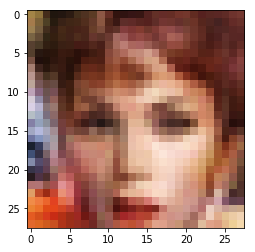

Epoch: 13/50... d_loss: 1.2945... g_loss: 0.7705...


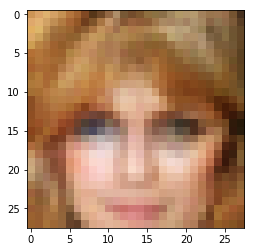

Epoch: 13/50... d_loss: 1.2830... g_loss: 1.0302...


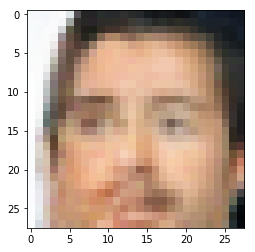

Epoch: 13/50... d_loss: 1.2949... g_loss: 0.8086...


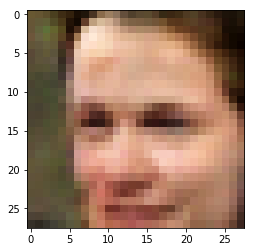

Epoch: 13/50... d_loss: 1.3108... g_loss: 1.0211...


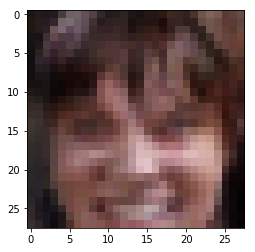

Epoch: 13/50... d_loss: 1.5876... g_loss: 1.5115...


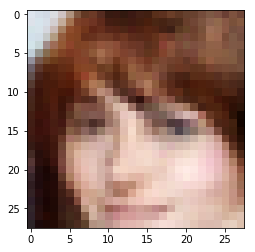

Epoch: 13/50... d_loss: 1.3285... g_loss: 0.8051...


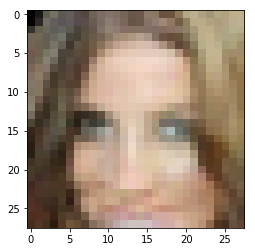

Epoch: 13/50... d_loss: 1.2984... g_loss: 1.4120...


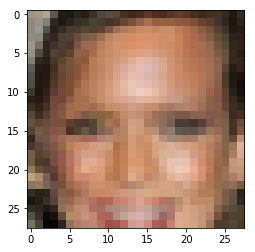

Epoch: 13/50... d_loss: 1.3265... g_loss: 0.6806...


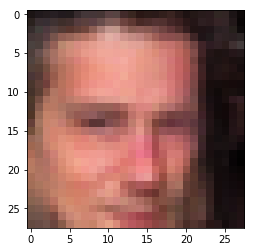

Epoch: 13/50... d_loss: 1.2910... g_loss: 0.7505...


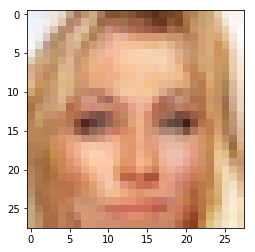

Epoch: 13/50... d_loss: 1.1544... g_loss: 0.7972...


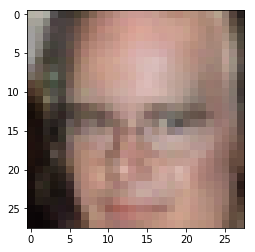

Epoch: 14/50... d_loss: 1.3330... g_loss: 1.2485...


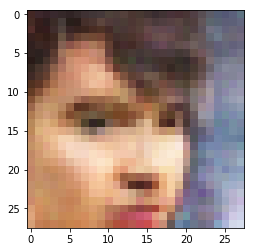

Epoch: 14/50... d_loss: 1.3198... g_loss: 0.8494...


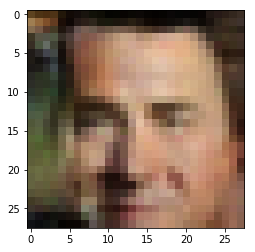

Epoch: 14/50... d_loss: 1.3165... g_loss: 0.6869...


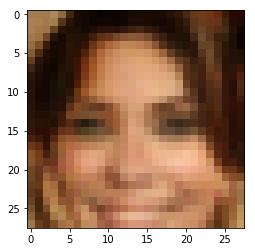

Epoch: 14/50... d_loss: 1.7503... g_loss: 0.3582...


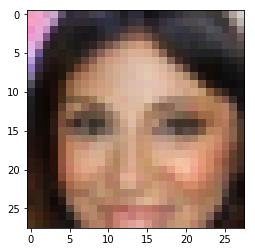

Epoch: 14/50... d_loss: 1.2899... g_loss: 0.7183...


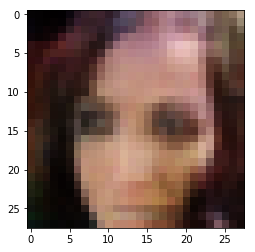

Epoch: 14/50... d_loss: 1.2082... g_loss: 0.8053...


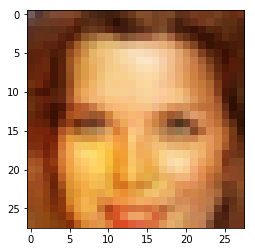

Epoch: 14/50... d_loss: 1.1758... g_loss: 0.9723...


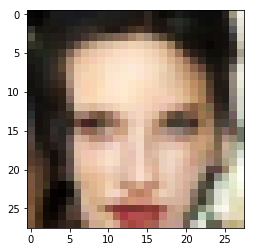

Epoch: 14/50... d_loss: 1.1738... g_loss: 0.9404...


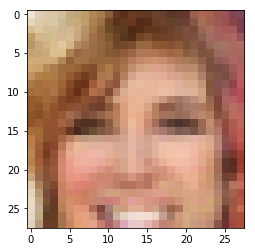

Epoch: 14/50... d_loss: 1.3963... g_loss: 1.1233...


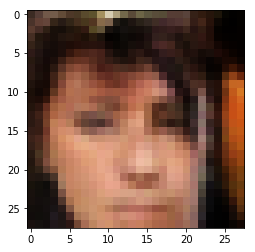

Epoch: 14/50... d_loss: 1.1571... g_loss: 0.8923...


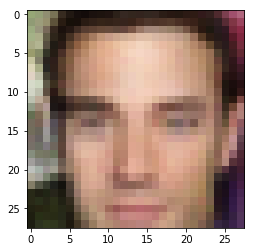

Epoch: 14/50... d_loss: 1.2850... g_loss: 0.7766...


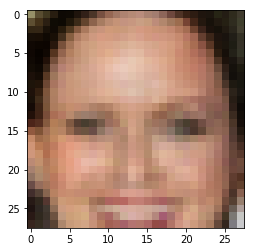

Epoch: 14/50... d_loss: 1.2140... g_loss: 0.8584...


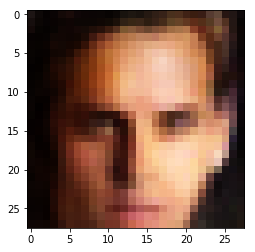

Epoch: 14/50... d_loss: 1.2916... g_loss: 0.7119...


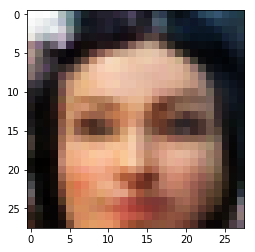

Epoch: 14/50... d_loss: 1.3032... g_loss: 0.8286...


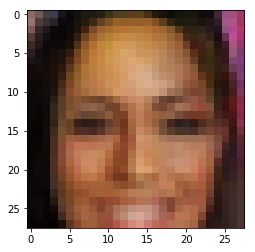

Epoch: 14/50... d_loss: 1.2623... g_loss: 0.8238...


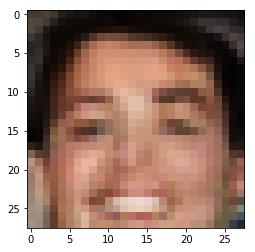

Epoch: 14/50... d_loss: 1.2576... g_loss: 0.7254...


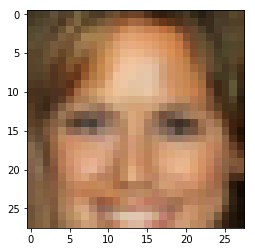

Epoch: 14/50... d_loss: 1.2049... g_loss: 1.0605...


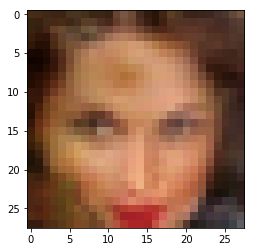

Epoch: 14/50... d_loss: 1.3309... g_loss: 0.6540...


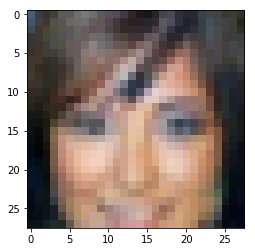

Epoch: 14/50... d_loss: 1.1023... g_loss: 0.9029...


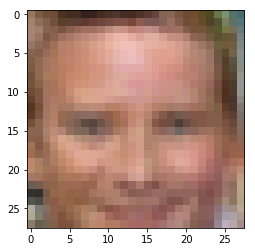

Epoch: 14/50... d_loss: 1.2043... g_loss: 0.9611...


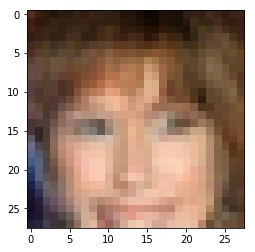

Epoch: 14/50... d_loss: 1.3127... g_loss: 0.8192...


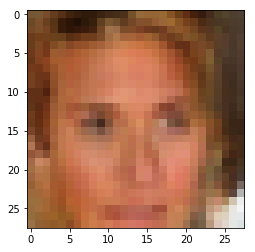

Epoch: 14/50... d_loss: 1.2958... g_loss: 0.7897...


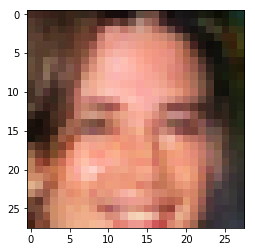

Epoch: 14/50... d_loss: 1.2925... g_loss: 0.8073...


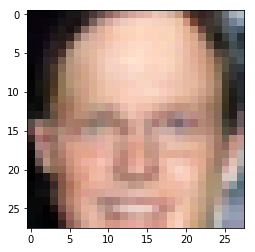

Epoch: 14/50... d_loss: 1.2541... g_loss: 0.8212...


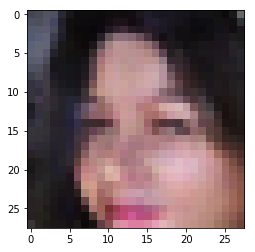

Epoch: 14/50... d_loss: 1.3176... g_loss: 0.8913...


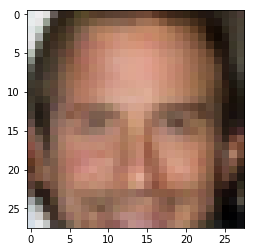

Epoch: 14/50... d_loss: 1.2932... g_loss: 0.9147...


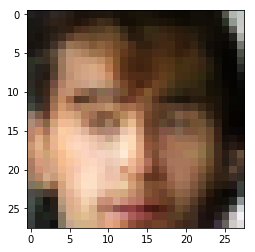

Epoch: 14/50... d_loss: 1.1641... g_loss: 0.9228...


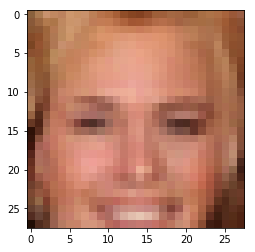

Epoch: 14/50... d_loss: 1.3059... g_loss: 0.6740...


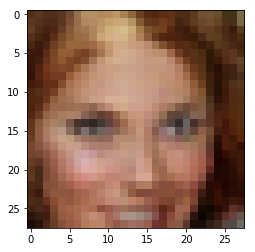

Epoch: 14/50... d_loss: 1.2983... g_loss: 0.9993...


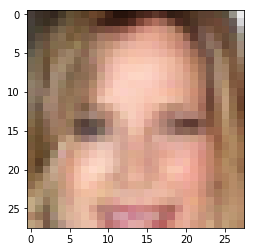

Epoch: 14/50... d_loss: 1.3864... g_loss: 0.6164...


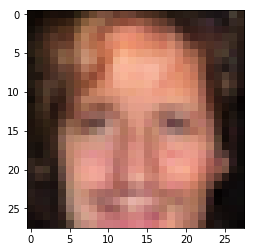

Epoch: 14/50... d_loss: 1.4132... g_loss: 0.8001...


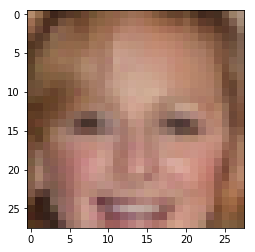

Epoch: 14/50... d_loss: 1.2855... g_loss: 1.3886...


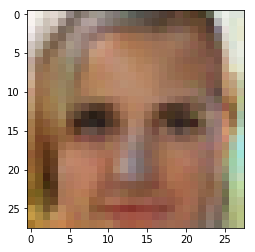

Epoch: 15/50... d_loss: 1.3821... g_loss: 0.5703...


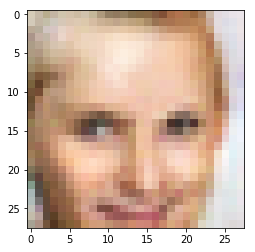

Epoch: 15/50... d_loss: 1.3016... g_loss: 0.9204...


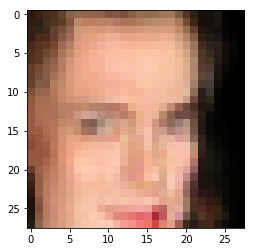

Epoch: 15/50... d_loss: 1.2343... g_loss: 1.0192...


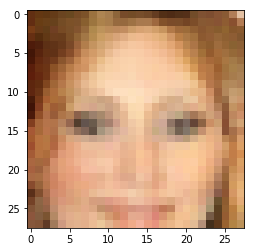

Epoch: 15/50... d_loss: 1.2568... g_loss: 0.7580...


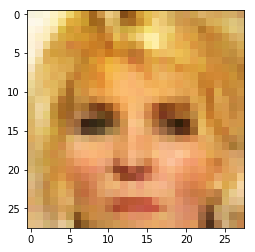

Epoch: 15/50... d_loss: 1.3566... g_loss: 1.3358...


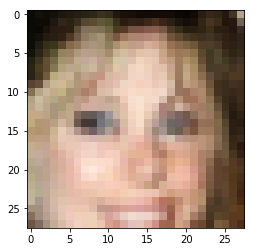

Epoch: 15/50... d_loss: 1.1287... g_loss: 0.8299...


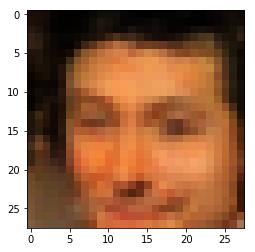

Epoch: 15/50... d_loss: 1.1760... g_loss: 0.9194...


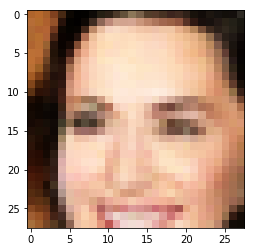

Epoch: 15/50... d_loss: 1.3637... g_loss: 0.6541...


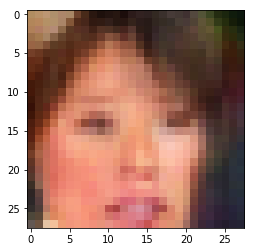

Epoch: 15/50... d_loss: 1.2707... g_loss: 0.6865...


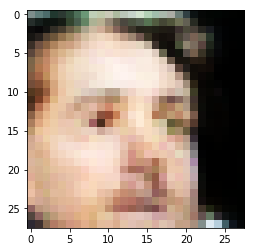

Epoch: 15/50... d_loss: 1.2877... g_loss: 0.7163...


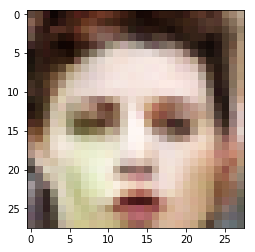

Epoch: 15/50... d_loss: 1.2609... g_loss: 0.7738...


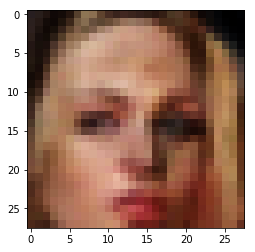

Epoch: 15/50... d_loss: 1.2721... g_loss: 0.9105...


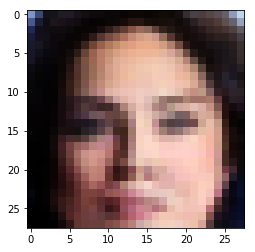

Epoch: 15/50... d_loss: 1.3981... g_loss: 0.6945...


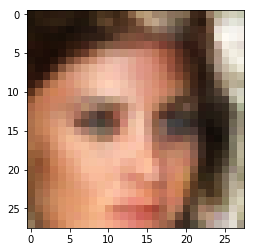

Epoch: 15/50... d_loss: 2.3474... g_loss: 0.2369...


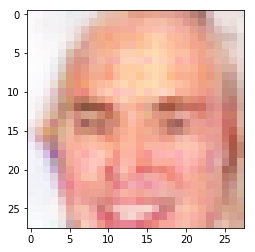

Epoch: 15/50... d_loss: 1.2698... g_loss: 0.7934...


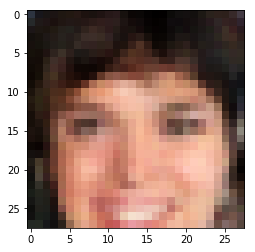

Epoch: 15/50... d_loss: 1.2072... g_loss: 1.0734...


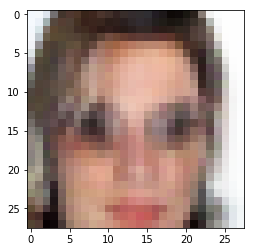

Epoch: 15/50... d_loss: 1.2401... g_loss: 0.8245...


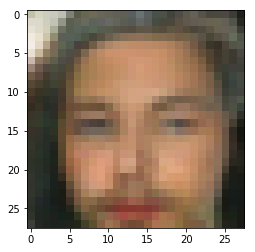

Epoch: 15/50... d_loss: 1.2719... g_loss: 1.1675...


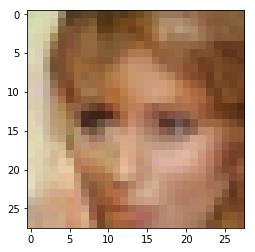

Epoch: 15/50... d_loss: 1.2309... g_loss: 0.7974...


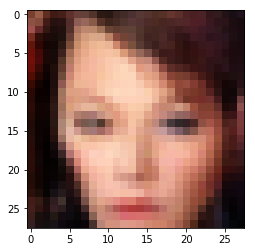

Epoch: 15/50... d_loss: 1.3015... g_loss: 0.6482...


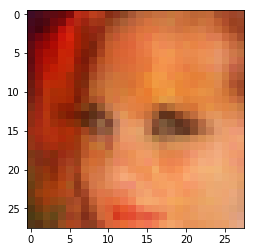

Epoch: 15/50... d_loss: 1.3341... g_loss: 0.6742...


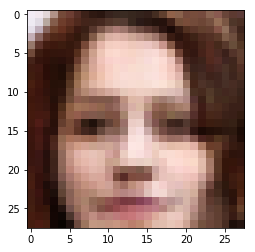

Epoch: 15/50... d_loss: 1.1481... g_loss: 0.8176...


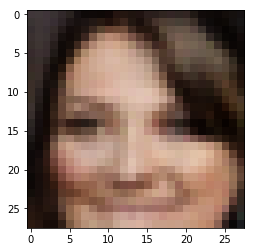

Epoch: 15/50... d_loss: 1.2605... g_loss: 0.9107...


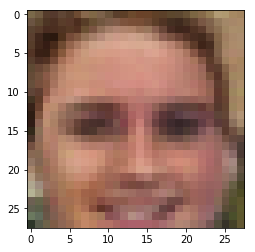

Epoch: 15/50... d_loss: 1.2156... g_loss: 0.8676...


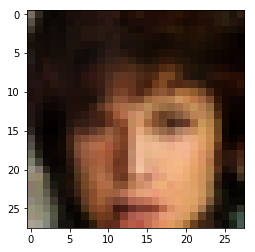

Epoch: 15/50... d_loss: 1.3630... g_loss: 0.8560...


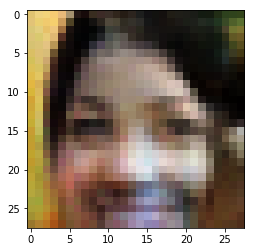

Epoch: 15/50... d_loss: 1.2992... g_loss: 0.7826...


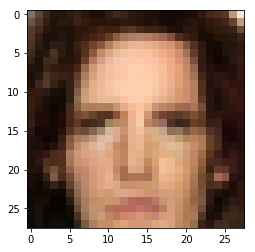

Epoch: 15/50... d_loss: 1.1737... g_loss: 1.0024...


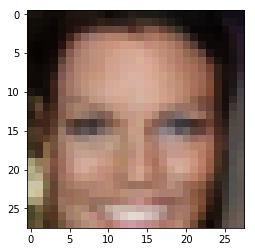

Epoch: 15/50... d_loss: 1.2385... g_loss: 0.7658...


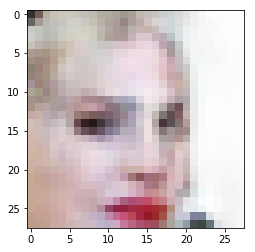

Epoch: 15/50... d_loss: 1.2044... g_loss: 0.8580...


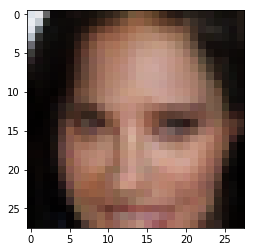

Epoch: 15/50... d_loss: 1.2605... g_loss: 1.2663...


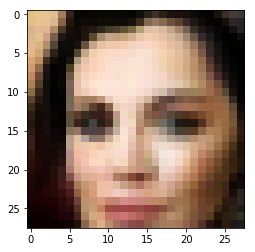

Epoch: 15/50... d_loss: 1.2698... g_loss: 0.8024...


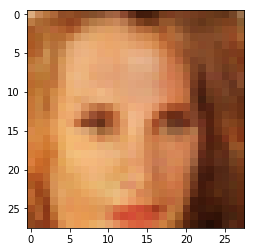

Epoch: 15/50... d_loss: 1.2540... g_loss: 0.8092...


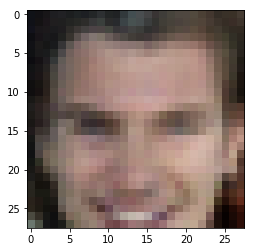

Epoch: 16/50... d_loss: 1.2586... g_loss: 1.1086...


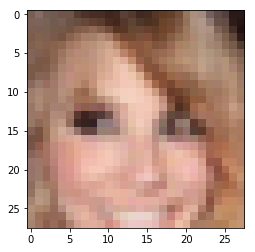

Epoch: 16/50... d_loss: 1.3524... g_loss: 0.6828...


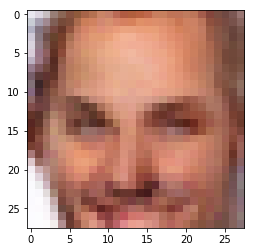

Epoch: 16/50... d_loss: 1.4601... g_loss: 1.5145...


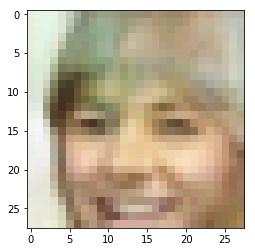

Epoch: 16/50... d_loss: 1.3280... g_loss: 0.7231...


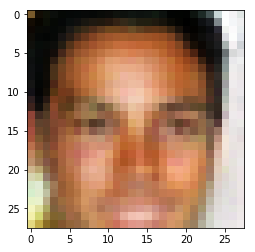

Epoch: 16/50... d_loss: 1.2070... g_loss: 0.8817...


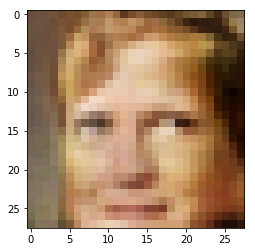

Epoch: 16/50... d_loss: 1.3024... g_loss: 1.4741...


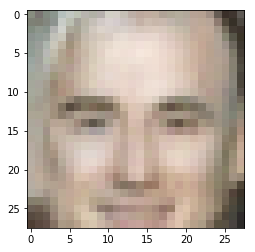

Epoch: 16/50... d_loss: 1.1815... g_loss: 0.8183...


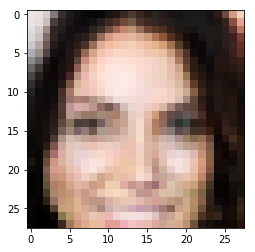

Epoch: 16/50... d_loss: 1.1320... g_loss: 1.0142...


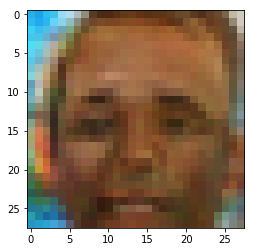

Epoch: 16/50... d_loss: 1.4895... g_loss: 0.5391...


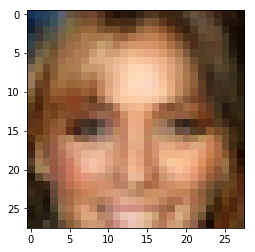

Epoch: 16/50... d_loss: 1.1811... g_loss: 0.8050...


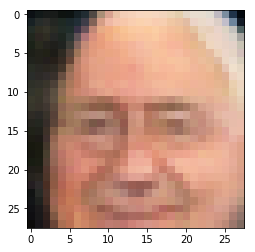

Epoch: 16/50... d_loss: 1.2999... g_loss: 0.9832...


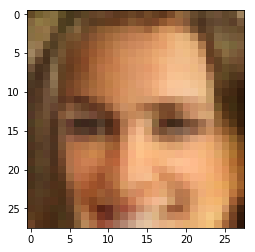

Epoch: 16/50... d_loss: 1.2208... g_loss: 1.0454...


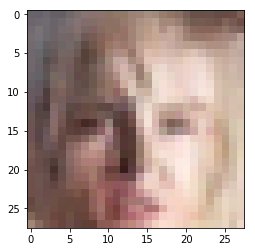

Epoch: 16/50... d_loss: 1.4262... g_loss: 0.5334...


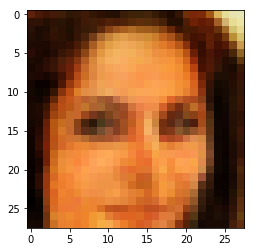

Epoch: 16/50... d_loss: 1.3190... g_loss: 0.7342...


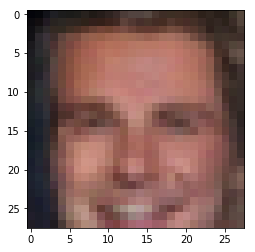

Epoch: 16/50... d_loss: 1.2235... g_loss: 1.0197...


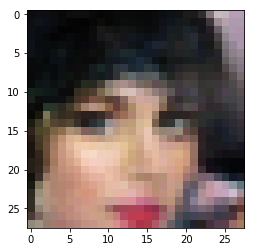

Epoch: 16/50... d_loss: 1.2527... g_loss: 0.7364...


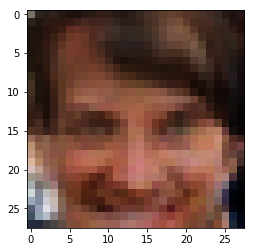

Epoch: 16/50... d_loss: 1.1508... g_loss: 0.9850...


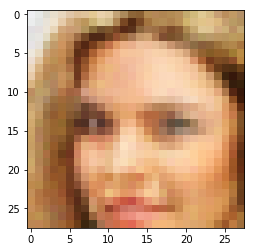

Epoch: 16/50... d_loss: 1.2245... g_loss: 0.8964...


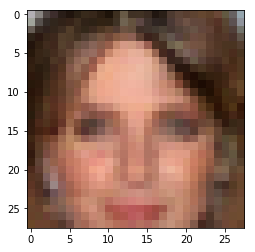

Epoch: 16/50... d_loss: 1.1794... g_loss: 0.8806...


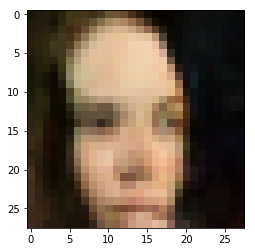

Epoch: 16/50... d_loss: 1.1987... g_loss: 0.9939...


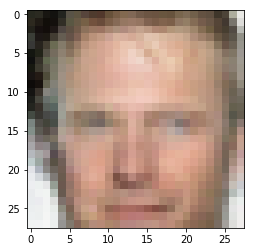

Epoch: 16/50... d_loss: 1.3321... g_loss: 0.6638...


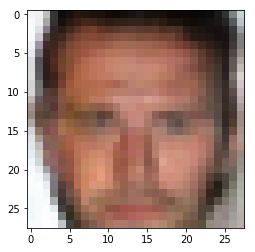

Epoch: 16/50... d_loss: 1.1603... g_loss: 1.0051...


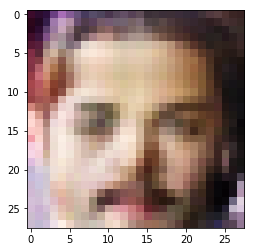

Epoch: 16/50... d_loss: 1.2819... g_loss: 1.3723...


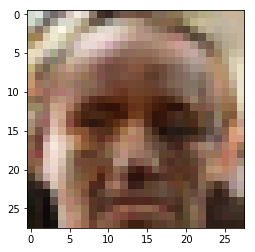

Epoch: 16/50... d_loss: 1.2170... g_loss: 1.2735...


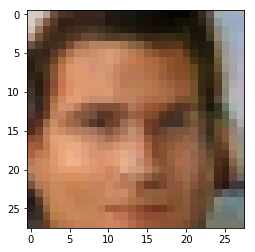

Epoch: 16/50... d_loss: 1.3608... g_loss: 0.6500...


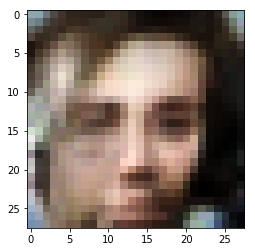

Epoch: 16/50... d_loss: 1.2840... g_loss: 0.9178...


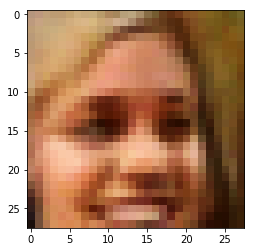

Epoch: 16/50... d_loss: 1.1604... g_loss: 0.8583...


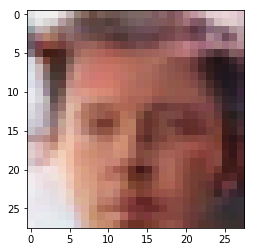

Epoch: 16/50... d_loss: 1.3213... g_loss: 0.9328...


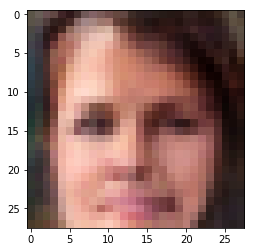

Epoch: 16/50... d_loss: 1.3434... g_loss: 0.6701...


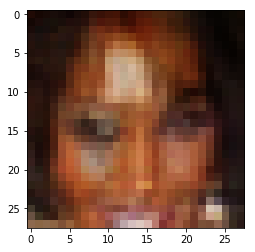

Epoch: 16/50... d_loss: 1.1645... g_loss: 0.9698...


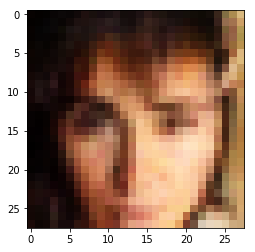

Epoch: 16/50... d_loss: 1.0820... g_loss: 1.0175...


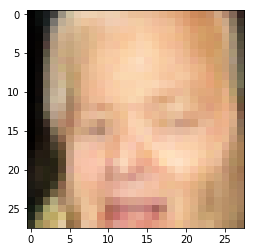

Epoch: 16/50... d_loss: 1.0925... g_loss: 1.0013...


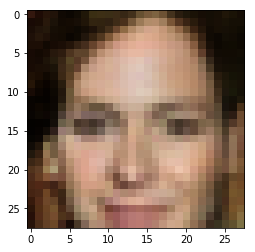

Epoch: 17/50... d_loss: 1.2653... g_loss: 0.9804...


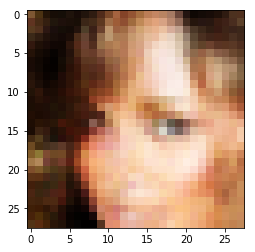

Epoch: 17/50... d_loss: 1.2947... g_loss: 0.7375...


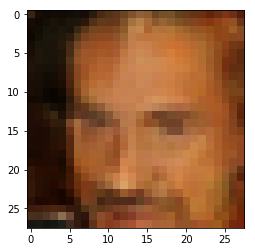

Epoch: 17/50... d_loss: 1.2637... g_loss: 0.9366...


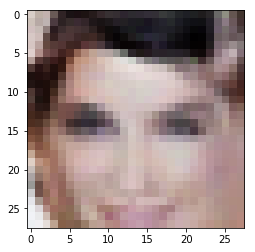

Epoch: 17/50... d_loss: 1.2143... g_loss: 0.9450...


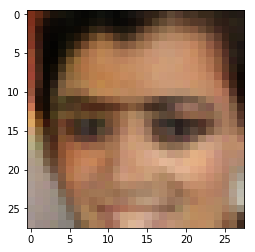

Epoch: 17/50... d_loss: 1.3569... g_loss: 0.8056...


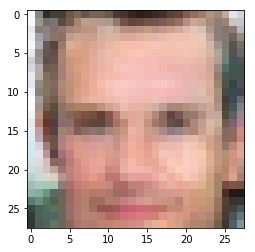

Epoch: 17/50... d_loss: 1.1390... g_loss: 1.0898...


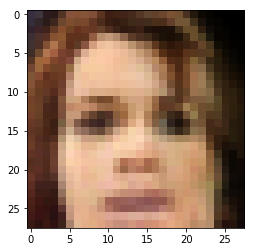

Epoch: 17/50... d_loss: 1.1598... g_loss: 1.1763...


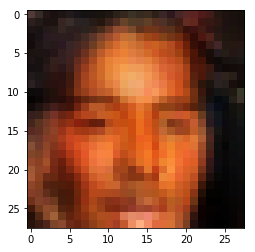

Epoch: 17/50... d_loss: 1.1113... g_loss: 0.9236...


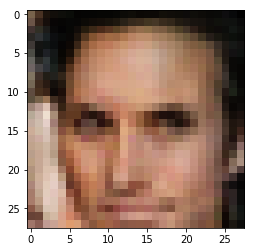

Epoch: 17/50... d_loss: 1.1955... g_loss: 0.9423...


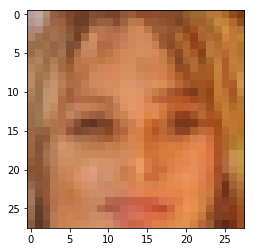

Epoch: 17/50... d_loss: 1.2088... g_loss: 0.9862...


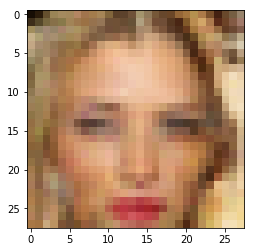

Epoch: 17/50... d_loss: 1.2392... g_loss: 0.7634...


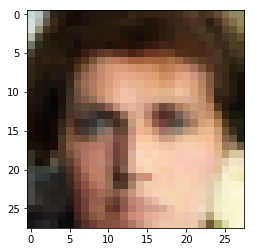

Epoch: 17/50... d_loss: 1.4370... g_loss: 1.5768...


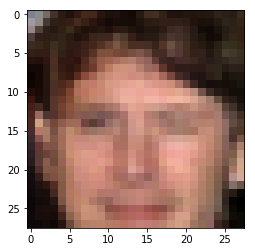

Epoch: 17/50... d_loss: 1.3433... g_loss: 0.6678...


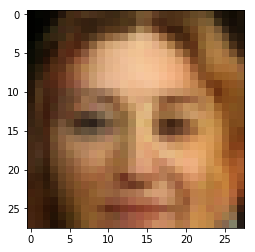

Epoch: 17/50... d_loss: 1.3416... g_loss: 1.3372...


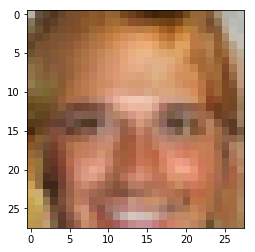

Epoch: 17/50... d_loss: 1.1796... g_loss: 1.0197...


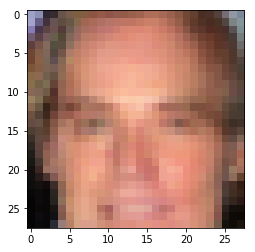

Epoch: 17/50... d_loss: 1.2307... g_loss: 0.7528...


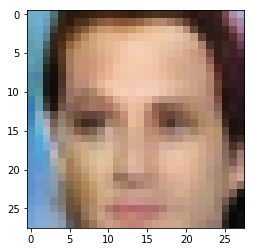

Epoch: 17/50... d_loss: 1.1894... g_loss: 0.7502...


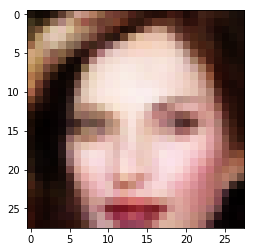

Epoch: 17/50... d_loss: 1.2660... g_loss: 0.7574...


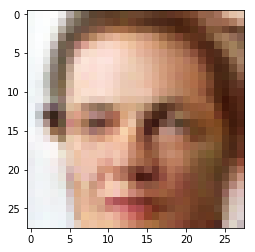

Epoch: 17/50... d_loss: 1.4095... g_loss: 0.6185...


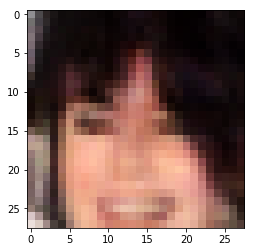

Epoch: 17/50... d_loss: 1.2158... g_loss: 0.7980...


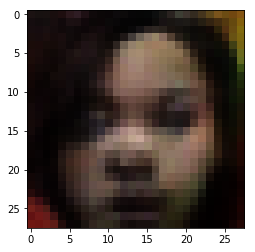

Epoch: 17/50... d_loss: 1.2271... g_loss: 0.7880...


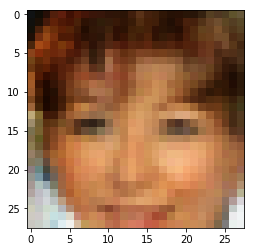

Epoch: 17/50... d_loss: 1.2648... g_loss: 0.8320...


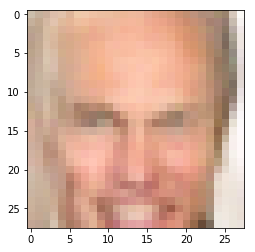

Epoch: 17/50... d_loss: 1.2464... g_loss: 1.0387...


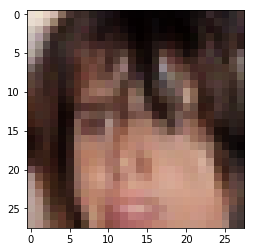

Epoch: 17/50... d_loss: 1.2925... g_loss: 0.8656...


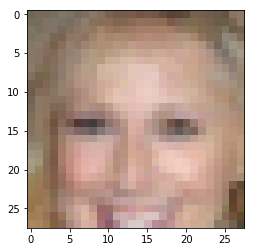

Epoch: 17/50... d_loss: 1.1582... g_loss: 1.0479...


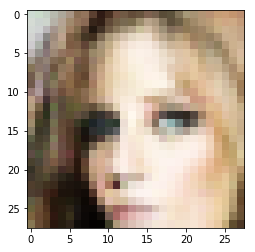

Epoch: 17/50... d_loss: 1.2782... g_loss: 0.7248...


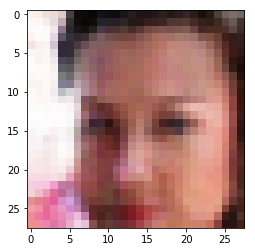

Epoch: 17/50... d_loss: 1.2028... g_loss: 0.9166...


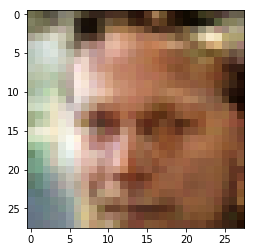

Epoch: 17/50... d_loss: 1.2839... g_loss: 0.9551...


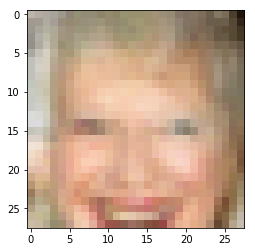

Epoch: 17/50... d_loss: 1.2252... g_loss: 0.7292...


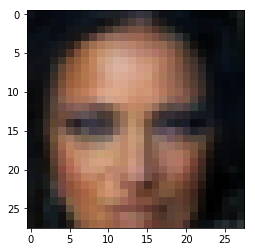

Epoch: 17/50... d_loss: 1.2718... g_loss: 0.7751...


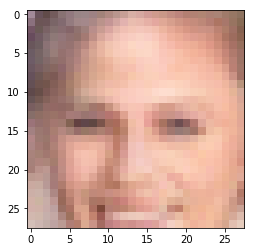

Epoch: 17/50... d_loss: 1.3684... g_loss: 0.6307...


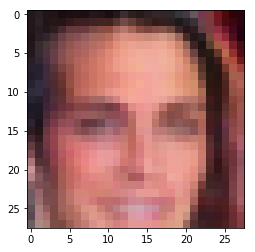

Epoch: 17/50... d_loss: 1.1602... g_loss: 1.1169...


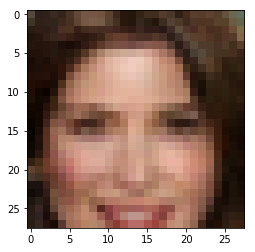

Epoch: 18/50... d_loss: 1.4582... g_loss: 0.6182...


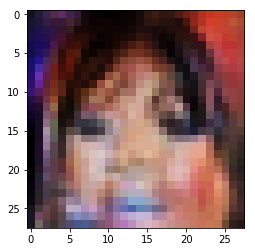

Epoch: 18/50... d_loss: 1.2006... g_loss: 0.9103...


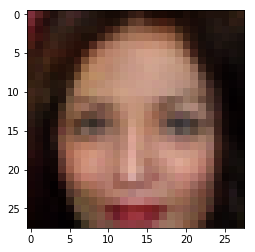

Epoch: 18/50... d_loss: 1.2336... g_loss: 1.0187...


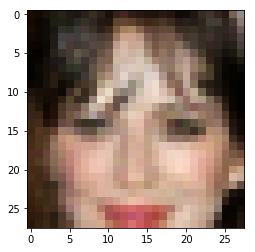

Epoch: 18/50... d_loss: 1.5877... g_loss: 0.4583...


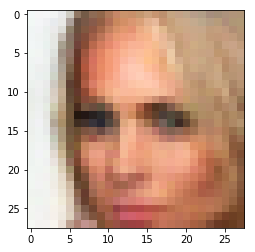

Epoch: 18/50... d_loss: 1.1867... g_loss: 1.1282...


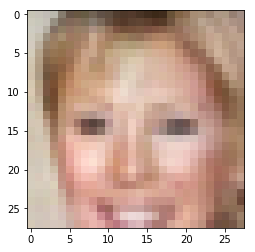

Epoch: 18/50... d_loss: 1.1554... g_loss: 1.3190...


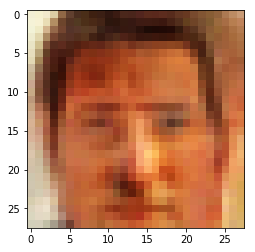

Epoch: 18/50... d_loss: 1.1522... g_loss: 0.9130...


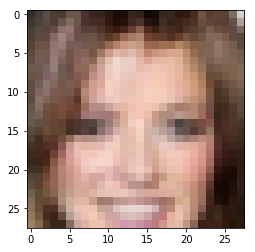

Epoch: 18/50... d_loss: 1.1632... g_loss: 0.9366...


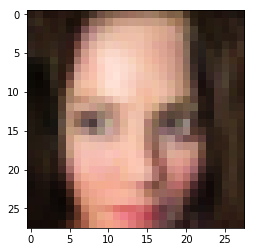

Epoch: 18/50... d_loss: 1.1043... g_loss: 1.1883...


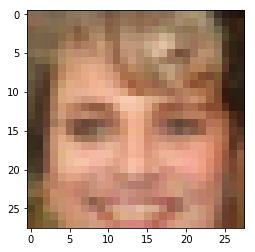

Epoch: 18/50... d_loss: 1.2428... g_loss: 1.1826...


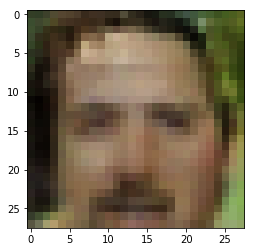

Epoch: 18/50... d_loss: 1.2919... g_loss: 0.7187...


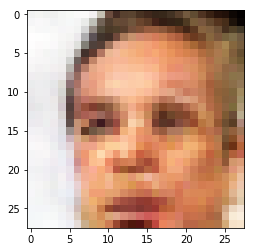

Epoch: 18/50... d_loss: 1.2417... g_loss: 0.7954...


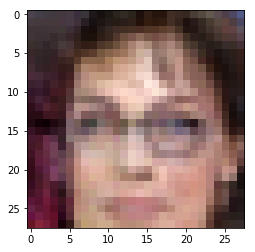

Epoch: 18/50... d_loss: 1.1180... g_loss: 0.9264...


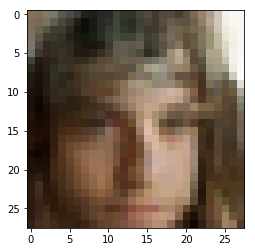

Epoch: 18/50... d_loss: 1.3490... g_loss: 0.6368...


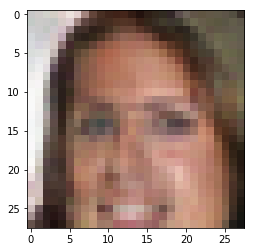

Epoch: 18/50... d_loss: 1.1571... g_loss: 0.8691...


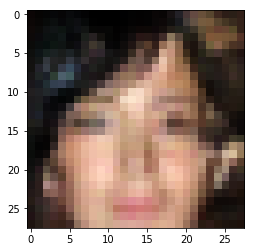

Epoch: 18/50... d_loss: 1.0467... g_loss: 1.3017...


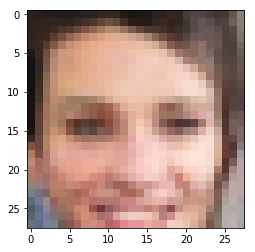

Epoch: 18/50... d_loss: 1.4012... g_loss: 0.5836...


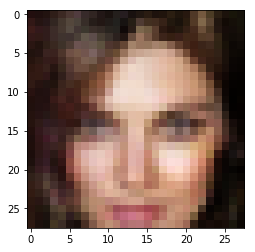

Epoch: 18/50... d_loss: 1.1920... g_loss: 1.3687...


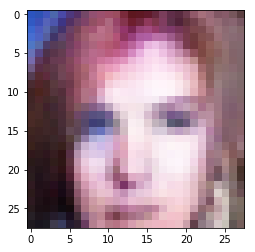

Epoch: 18/50... d_loss: 1.1104... g_loss: 0.9842...


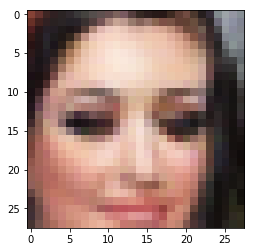

Epoch: 18/50... d_loss: 1.3456... g_loss: 0.8773...


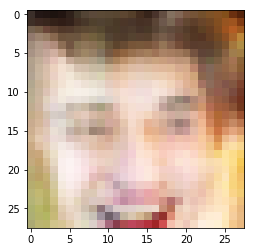

Epoch: 18/50... d_loss: 1.4049... g_loss: 0.5562...


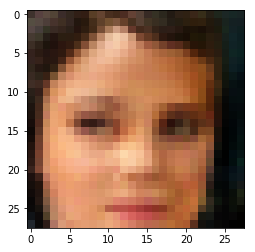

Epoch: 18/50... d_loss: 1.1127... g_loss: 1.0460...


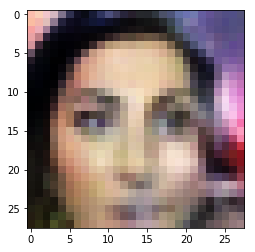

Epoch: 18/50... d_loss: 1.1924... g_loss: 0.9847...


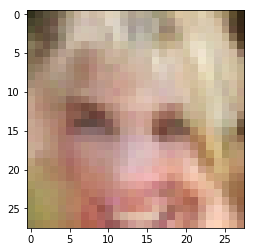

Epoch: 18/50... d_loss: 1.4139... g_loss: 0.5538...


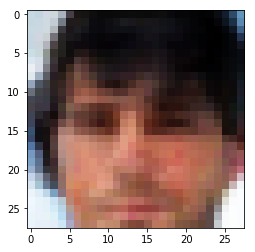

Epoch: 18/50... d_loss: 1.2568... g_loss: 1.3113...


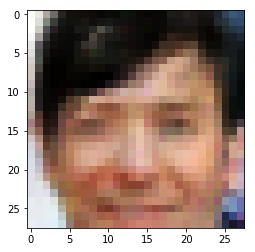

Epoch: 18/50... d_loss: 1.0268... g_loss: 1.0778...


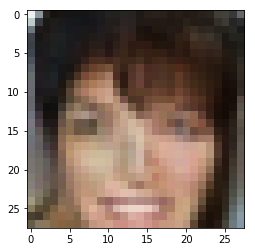

Epoch: 18/50... d_loss: 1.2126... g_loss: 0.7521...


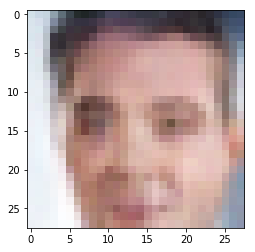

Epoch: 18/50... d_loss: 1.2066... g_loss: 0.9459...


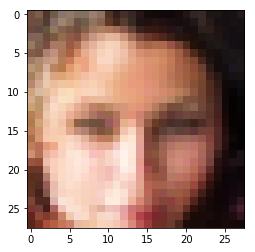

Epoch: 18/50... d_loss: 1.1324... g_loss: 0.8643...


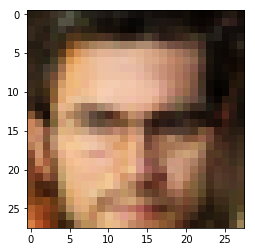

Epoch: 18/50... d_loss: 1.2059... g_loss: 1.0017...


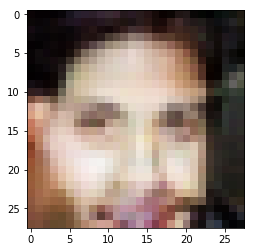

Epoch: 18/50... d_loss: 1.1314... g_loss: 1.2821...


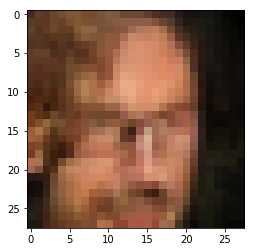

Epoch: 18/50... d_loss: 1.2983... g_loss: 0.7781...


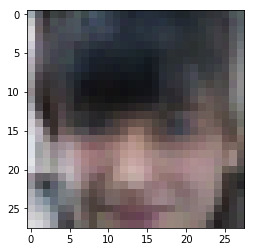

Epoch: 19/50... d_loss: 1.3053... g_loss: 0.7334...


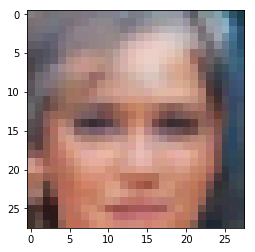

Epoch: 19/50... d_loss: 1.2659... g_loss: 0.7942...


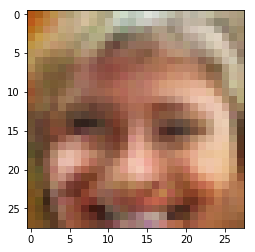

Epoch: 19/50... d_loss: 1.1210... g_loss: 1.1685...


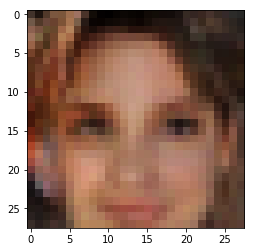

Epoch: 19/50... d_loss: 1.4829... g_loss: 0.5505...


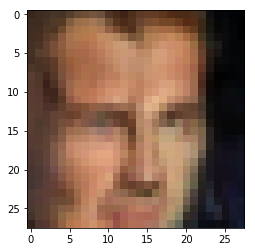

Epoch: 19/50... d_loss: 1.0903... g_loss: 1.1147...


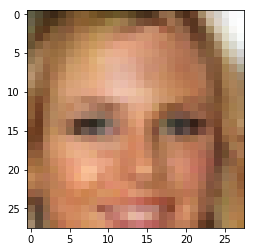

Epoch: 19/50... d_loss: 1.2162... g_loss: 0.8972...


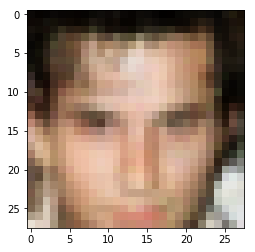

Epoch: 19/50... d_loss: 1.1268... g_loss: 0.9345...


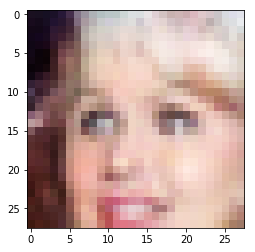

Epoch: 19/50... d_loss: 1.0776... g_loss: 1.1139...


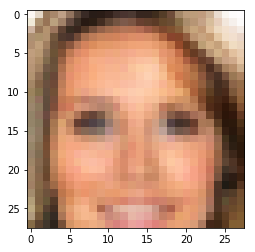

Epoch: 19/50... d_loss: 1.3902... g_loss: 0.6073...


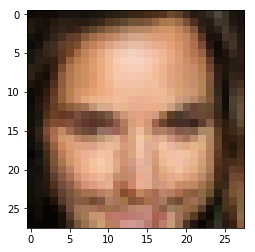

Epoch: 19/50... d_loss: 1.1804... g_loss: 1.1901...


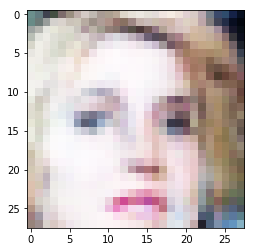

Epoch: 19/50... d_loss: 1.1222... g_loss: 1.0950...


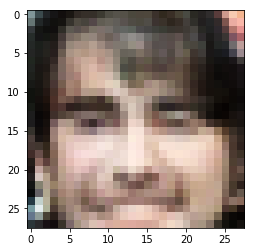

Epoch: 19/50... d_loss: 1.1678... g_loss: 1.4412...


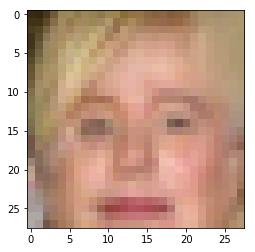

Epoch: 19/50... d_loss: 1.1994... g_loss: 0.8179...


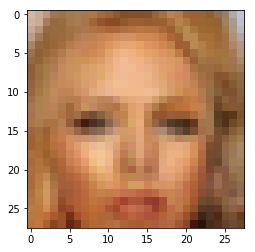

Epoch: 19/50... d_loss: 1.4825... g_loss: 0.5289...


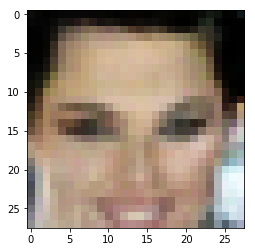

Epoch: 19/50... d_loss: 1.2823... g_loss: 0.8186...


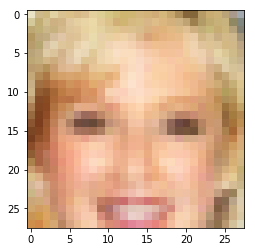

Epoch: 19/50... d_loss: 1.3459... g_loss: 0.6855...


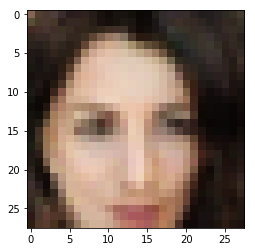

Epoch: 19/50... d_loss: 1.1075... g_loss: 0.8745...


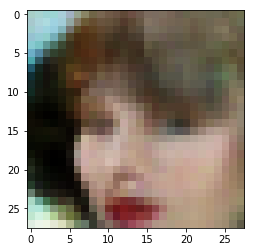

Epoch: 19/50... d_loss: 1.2691... g_loss: 1.4718...


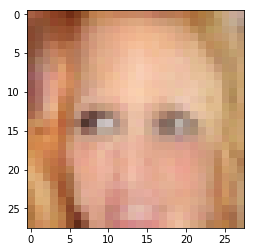

Epoch: 19/50... d_loss: 1.2127... g_loss: 0.8219...


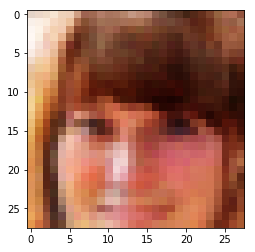

Epoch: 19/50... d_loss: 1.1394... g_loss: 0.9678...


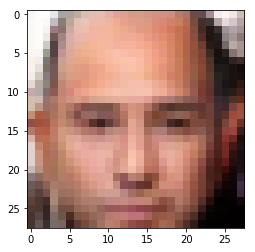

Epoch: 19/50... d_loss: 1.2247... g_loss: 0.8925...


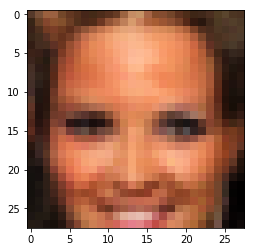

Epoch: 19/50... d_loss: 1.2701... g_loss: 0.7167...


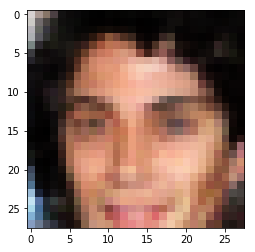

Epoch: 19/50... d_loss: 1.3118... g_loss: 1.4478...


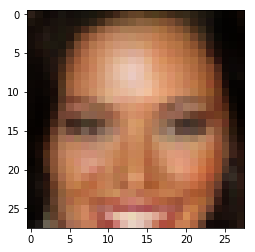

Epoch: 19/50... d_loss: 1.2624... g_loss: 1.5106...


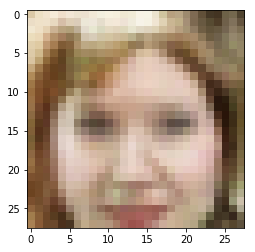

Epoch: 19/50... d_loss: 1.2758... g_loss: 0.8463...


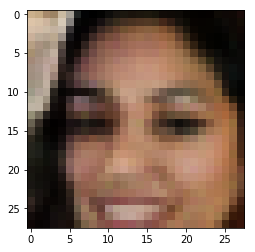

Epoch: 19/50... d_loss: 1.0666... g_loss: 1.1833...


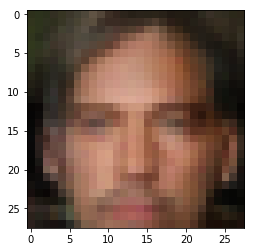

Epoch: 19/50... d_loss: 1.2097... g_loss: 0.7981...


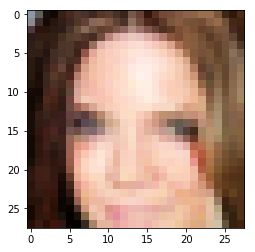

Epoch: 19/50... d_loss: 1.2033... g_loss: 0.8778...


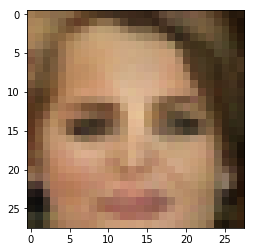

Epoch: 19/50... d_loss: 1.3541... g_loss: 0.8286...


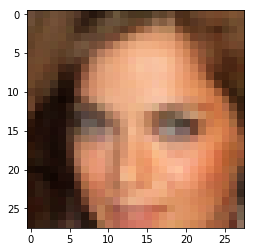

Epoch: 19/50... d_loss: 1.1235... g_loss: 0.9911...


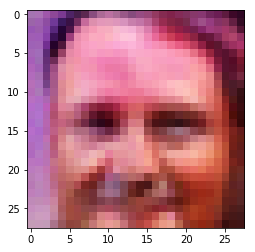

Epoch: 19/50... d_loss: 1.5811... g_loss: 0.4502...


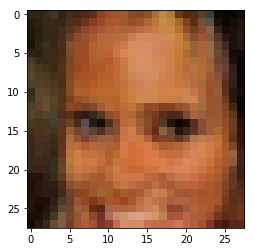

Epoch: 19/50... d_loss: 1.1392... g_loss: 0.9189...


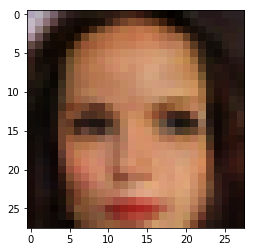

Epoch: 20/50... d_loss: 1.2812... g_loss: 1.7251...


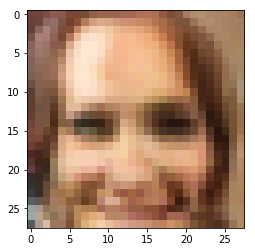

Epoch: 20/50... d_loss: 1.1896... g_loss: 1.0848...


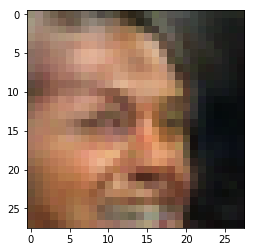

Epoch: 20/50... d_loss: 1.1893... g_loss: 0.9260...


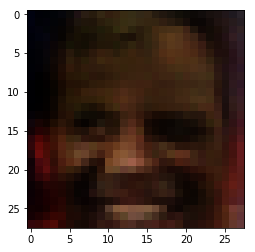

Epoch: 20/50... d_loss: 1.2945... g_loss: 0.6719...


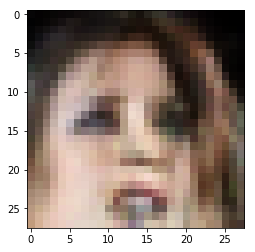

Epoch: 20/50... d_loss: 1.2588... g_loss: 0.8240...


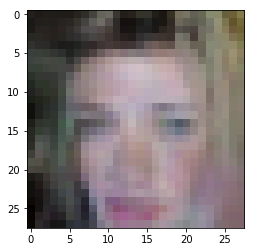

Epoch: 20/50... d_loss: 1.1225... g_loss: 0.9569...


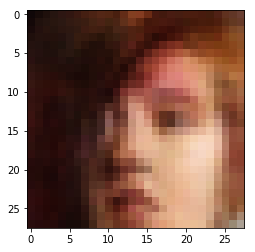

Epoch: 20/50... d_loss: 1.0455... g_loss: 1.1411...


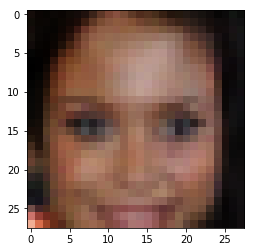

Epoch: 20/50... d_loss: 1.1348... g_loss: 1.0632...


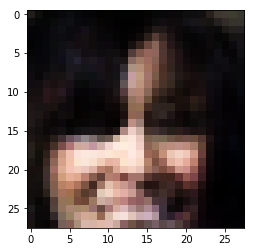

Epoch: 20/50... d_loss: 1.2677... g_loss: 0.7241...


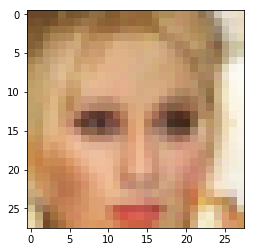

Epoch: 20/50... d_loss: 1.0786... g_loss: 1.1162...


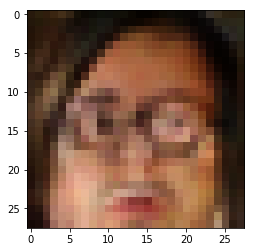

Epoch: 20/50... d_loss: 1.2058... g_loss: 0.8469...


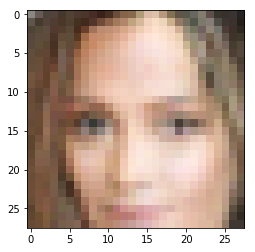

Epoch: 20/50... d_loss: 1.1968... g_loss: 1.0827...


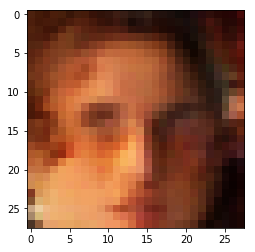

Epoch: 20/50... d_loss: 1.0266... g_loss: 1.0064...


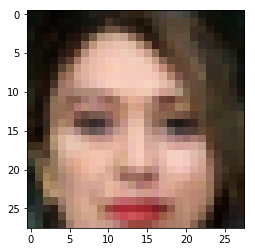

Epoch: 20/50... d_loss: 1.3379... g_loss: 0.7744...


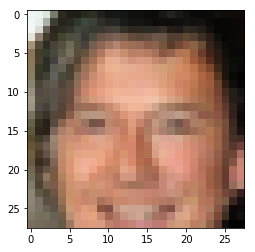

Epoch: 20/50... d_loss: 1.1208... g_loss: 0.9145...


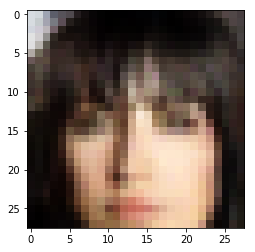

Epoch: 20/50... d_loss: 1.2166... g_loss: 0.9016...


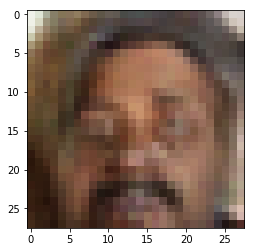

Epoch: 20/50... d_loss: 1.1044... g_loss: 1.0852...


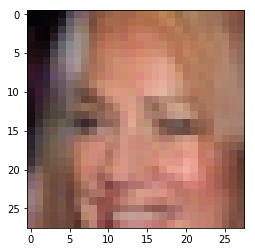

Epoch: 20/50... d_loss: 1.0951... g_loss: 1.2871...


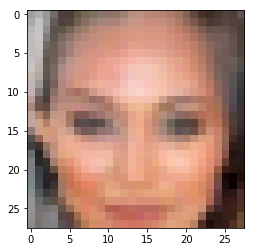

Epoch: 20/50... d_loss: 1.4278... g_loss: 0.5597...


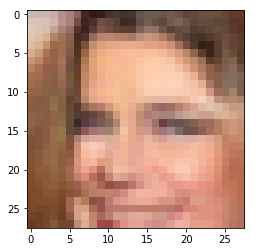

Epoch: 20/50... d_loss: 1.2201... g_loss: 0.9859...


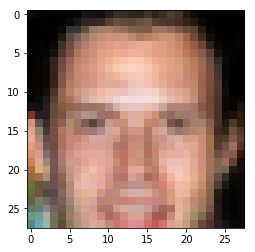

Epoch: 20/50... d_loss: 1.4358... g_loss: 1.4209...


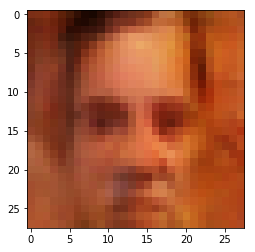

Epoch: 20/50... d_loss: 1.0828... g_loss: 1.0789...


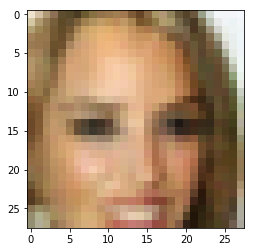

Epoch: 20/50... d_loss: 1.2565... g_loss: 1.4180...


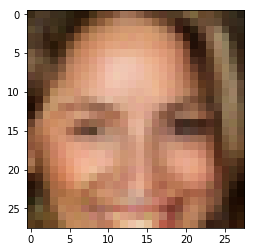

Epoch: 20/50... d_loss: 1.2530... g_loss: 1.0713...


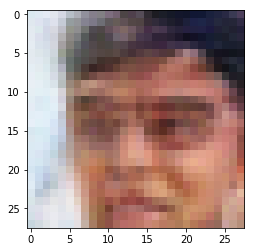

Epoch: 20/50... d_loss: 1.2167... g_loss: 0.7803...


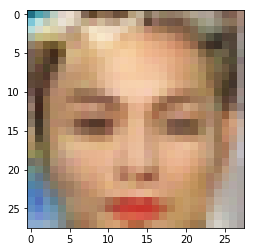

Epoch: 20/50... d_loss: 1.2584... g_loss: 0.9417...


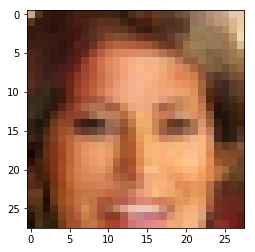

Epoch: 20/50... d_loss: 1.2202... g_loss: 0.9095...


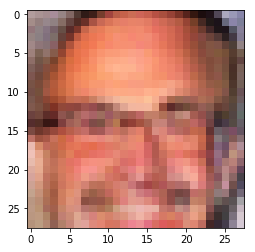

Epoch: 20/50... d_loss: 1.1217... g_loss: 1.0163...


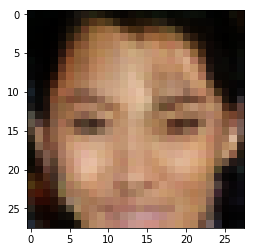

Epoch: 20/50... d_loss: 1.1360... g_loss: 0.8431...


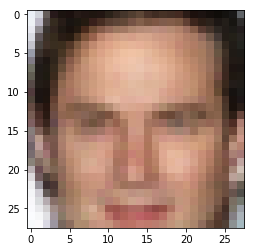

Epoch: 20/50... d_loss: 1.2096... g_loss: 1.2202...


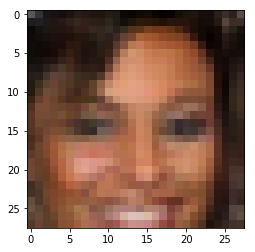

Epoch: 20/50... d_loss: 1.0552... g_loss: 1.3431...


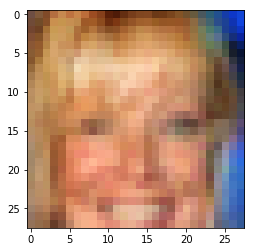

Epoch: 20/50... d_loss: 1.1269... g_loss: 1.1683...


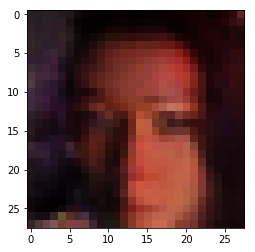

Epoch: 21/50... d_loss: 1.1543... g_loss: 1.0880...


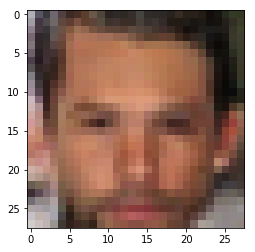

Epoch: 21/50... d_loss: 1.2508... g_loss: 1.1192...


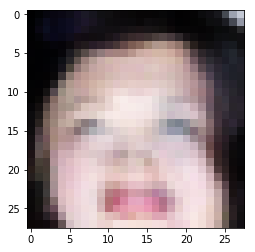

Epoch: 21/50... d_loss: 1.1334... g_loss: 0.9406...


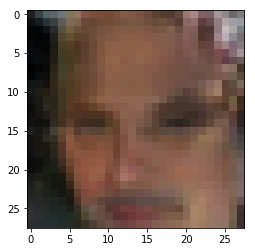

Epoch: 21/50... d_loss: 1.3630... g_loss: 0.6626...


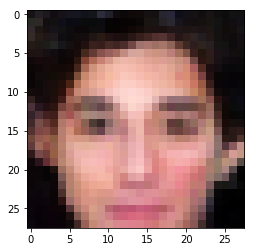

Epoch: 21/50... d_loss: 1.2352... g_loss: 0.9004...


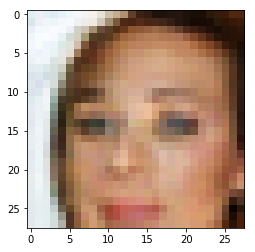

Epoch: 21/50... d_loss: 1.0656... g_loss: 0.9521...


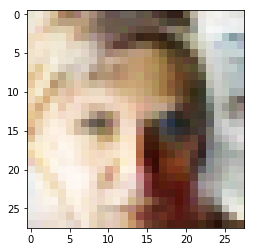

Epoch: 21/50... d_loss: 1.2537... g_loss: 0.9393...


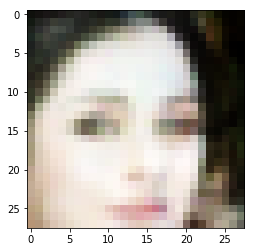

Epoch: 21/50... d_loss: 1.2173... g_loss: 0.8933...


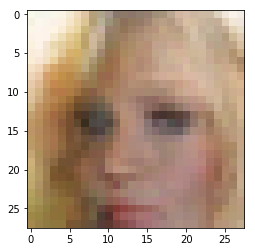

Epoch: 21/50... d_loss: 1.2311... g_loss: 0.9921...


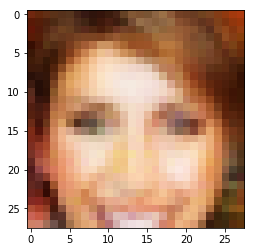

Epoch: 21/50... d_loss: 1.2464... g_loss: 0.7017...


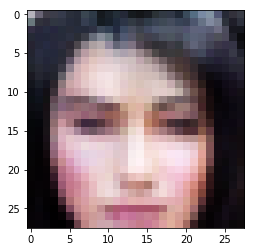

Epoch: 21/50... d_loss: 1.2074... g_loss: 0.9325...


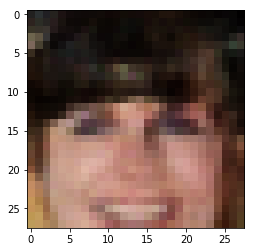

Epoch: 21/50... d_loss: 1.1254... g_loss: 1.0830...


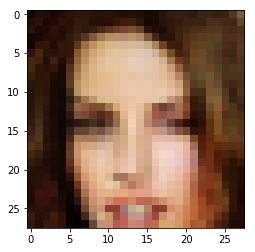

Epoch: 21/50... d_loss: 1.0567... g_loss: 0.9822...


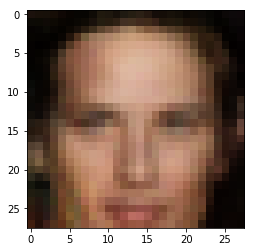

Epoch: 21/50... d_loss: 1.2191... g_loss: 1.1948...


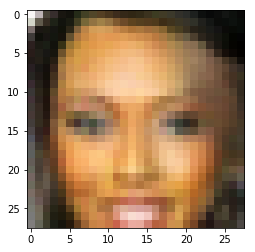

Epoch: 21/50... d_loss: 1.0326... g_loss: 1.0871...


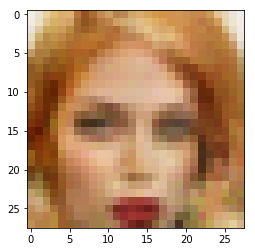

Epoch: 21/50... d_loss: 1.3102... g_loss: 0.7117...


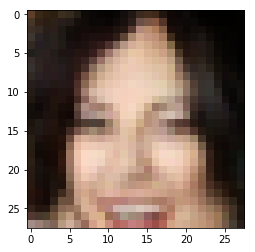

Epoch: 21/50... d_loss: 1.4234... g_loss: 0.5591...


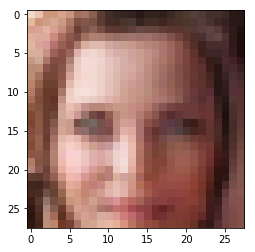

Epoch: 21/50... d_loss: 1.5199... g_loss: 0.5942...


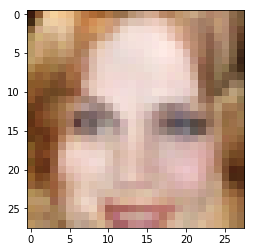

Epoch: 21/50... d_loss: 1.1425... g_loss: 0.8354...


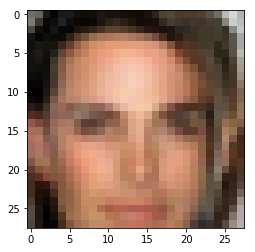

Epoch: 21/50... d_loss: 1.0422... g_loss: 1.1619...


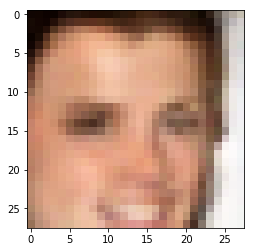

Epoch: 21/50... d_loss: 1.3919... g_loss: 0.6195...


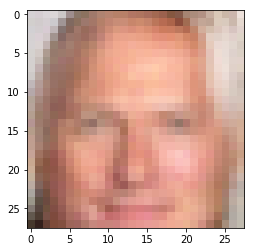

Epoch: 21/50... d_loss: 1.3566... g_loss: 0.7560...


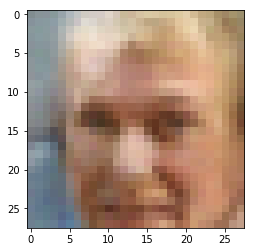

Epoch: 21/50... d_loss: 1.2015... g_loss: 0.8728...


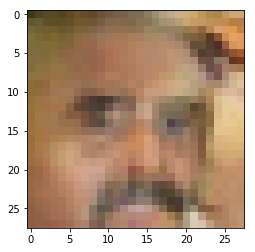

Epoch: 21/50... d_loss: 1.0797... g_loss: 1.2048...


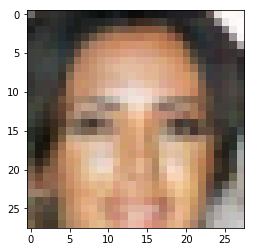

Epoch: 21/50... d_loss: 1.2607... g_loss: 0.8553...


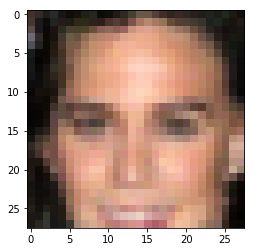

Epoch: 21/50... d_loss: 1.1684... g_loss: 1.5256...


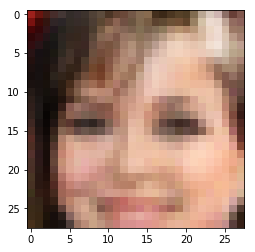

Epoch: 21/50... d_loss: 1.3590... g_loss: 0.5946...


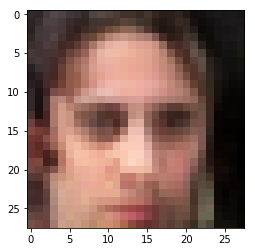

Epoch: 21/50... d_loss: 1.1685... g_loss: 1.0788...


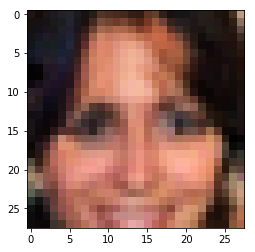

Epoch: 21/50... d_loss: 1.2165... g_loss: 0.7736...


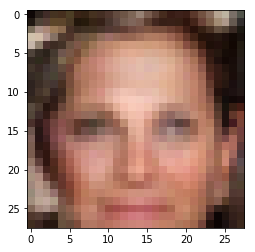

Epoch: 21/50... d_loss: 1.3022... g_loss: 0.6811...


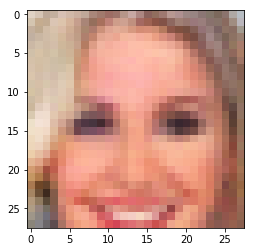

Epoch: 21/50... d_loss: 1.2124... g_loss: 0.8485...


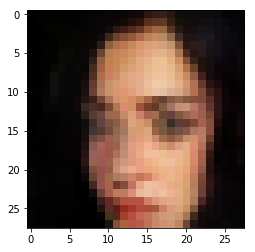

Epoch: 21/50... d_loss: 1.1880... g_loss: 0.9734...


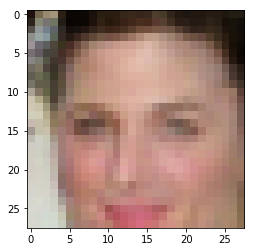

Epoch: 22/50... d_loss: 1.3616... g_loss: 0.6098...


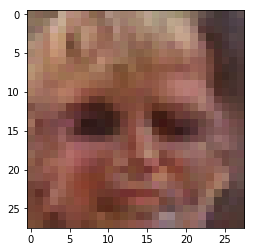

Epoch: 22/50... d_loss: 1.1442... g_loss: 1.3053...


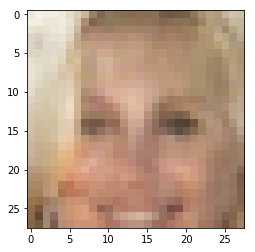

Epoch: 22/50... d_loss: 1.1425... g_loss: 0.8329...


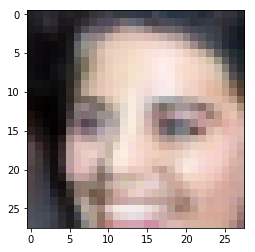

Epoch: 22/50... d_loss: 1.5002... g_loss: 0.4997...


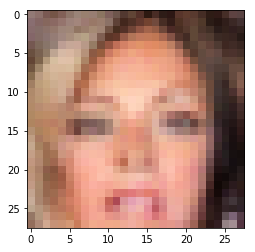

Epoch: 22/50... d_loss: 1.1674... g_loss: 0.9625...


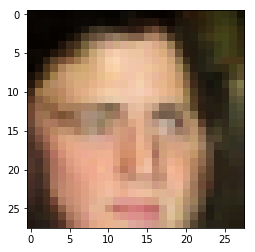

Epoch: 22/50... d_loss: 1.2570... g_loss: 0.7129...


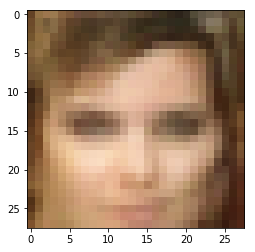

Epoch: 22/50... d_loss: 1.1065... g_loss: 1.0451...


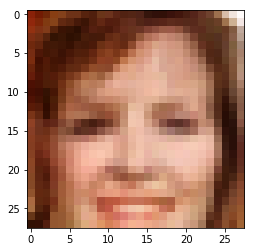

Epoch: 22/50... d_loss: 1.1133... g_loss: 1.2288...


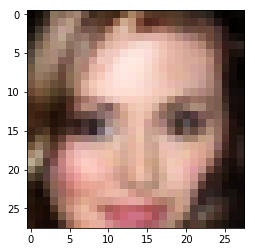

Epoch: 22/50... d_loss: 1.1702... g_loss: 0.8715...


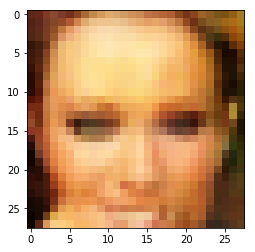

Epoch: 22/50... d_loss: 1.1000... g_loss: 0.9423...


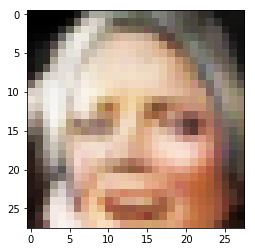

Epoch: 22/50... d_loss: 1.1567... g_loss: 1.4805...


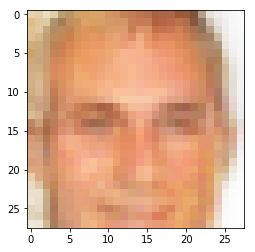

Epoch: 22/50... d_loss: 1.1181... g_loss: 0.9394...


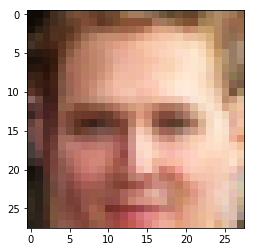

Epoch: 22/50... d_loss: 0.9742... g_loss: 1.3970...


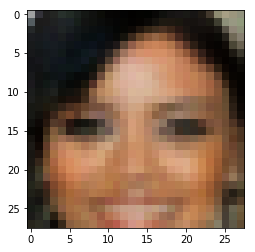

Epoch: 22/50... d_loss: 1.3672... g_loss: 0.5734...


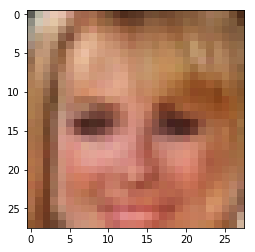

Epoch: 22/50... d_loss: 1.1516... g_loss: 0.8500...


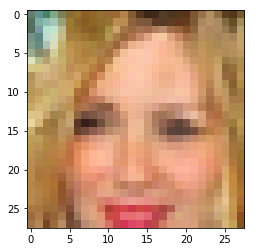

Epoch: 22/50... d_loss: 1.2859... g_loss: 0.6838...


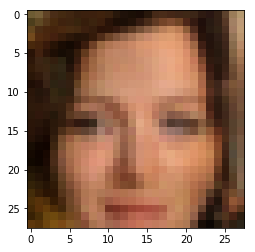

Epoch: 22/50... d_loss: 1.3146... g_loss: 0.6225...


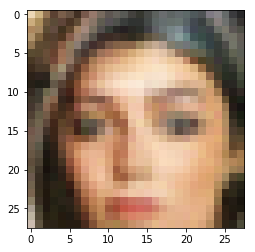

Epoch: 22/50... d_loss: 1.1404... g_loss: 0.9730...


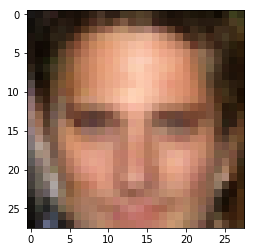

Epoch: 22/50... d_loss: 1.1058... g_loss: 0.9677...


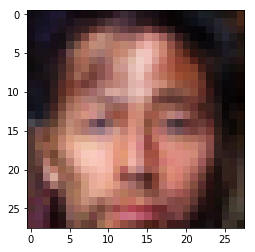

Epoch: 22/50... d_loss: 1.1301... g_loss: 1.0796...


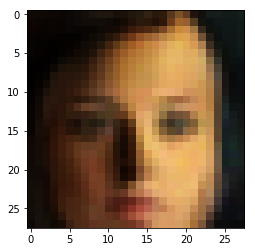

Epoch: 22/50... d_loss: 1.5714... g_loss: 0.4389...


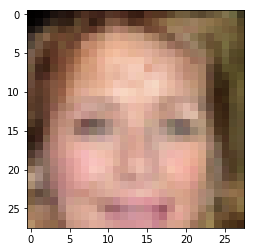

Epoch: 22/50... d_loss: 1.2204... g_loss: 0.7612...


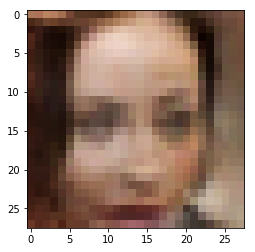

Epoch: 22/50... d_loss: 1.1190... g_loss: 1.2397...


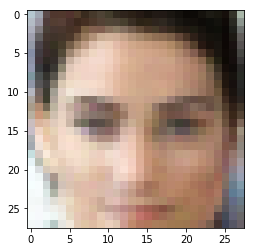

Epoch: 22/50... d_loss: 1.0435... g_loss: 1.2442...


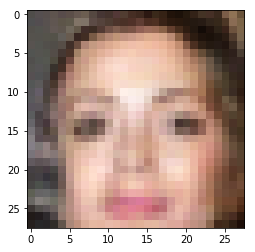

Epoch: 22/50... d_loss: 1.0637... g_loss: 1.1009...


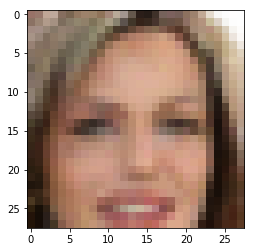

Epoch: 22/50... d_loss: 0.9827... g_loss: 1.2214...


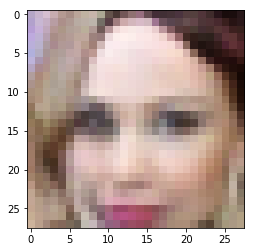

Epoch: 22/50... d_loss: 1.5249... g_loss: 0.4800...


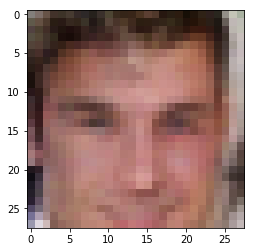

Epoch: 22/50... d_loss: 1.1801... g_loss: 0.7934...


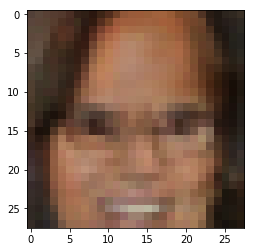

Epoch: 22/50... d_loss: 1.0981... g_loss: 0.9332...


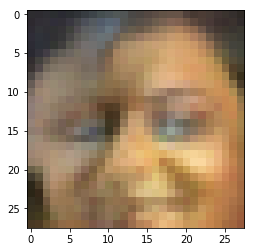

Epoch: 22/50... d_loss: 1.1860... g_loss: 1.0766...


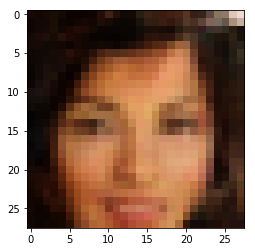

Epoch: 22/50... d_loss: 0.9733... g_loss: 1.2888...


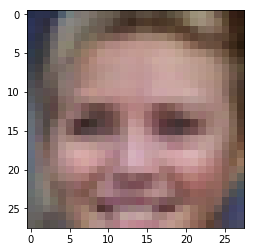

Epoch: 22/50... d_loss: 1.2258... g_loss: 0.8642...


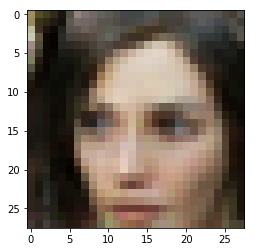

Epoch: 23/50... d_loss: 1.3389... g_loss: 0.7110...


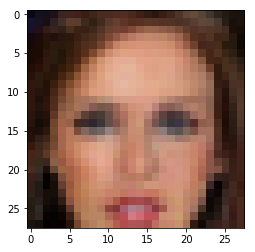

Epoch: 23/50... d_loss: 1.2145... g_loss: 0.9388...


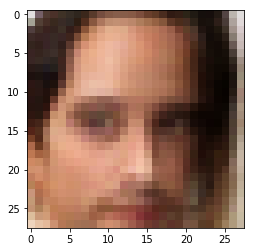

Epoch: 23/50... d_loss: 1.0101... g_loss: 1.1409...


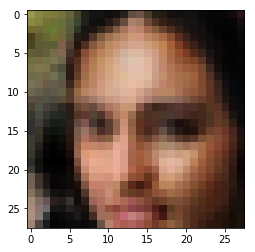

Epoch: 23/50... d_loss: 1.3153... g_loss: 0.7162...


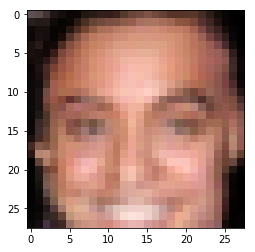

Epoch: 23/50... d_loss: 1.1445... g_loss: 1.0008...


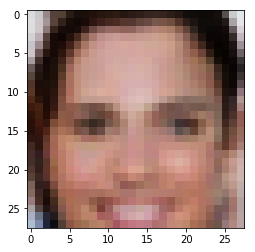

Epoch: 23/50... d_loss: 1.2593... g_loss: 0.6950...


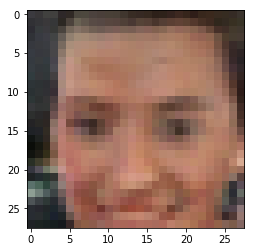

Epoch: 23/50... d_loss: 0.9658... g_loss: 1.1078...


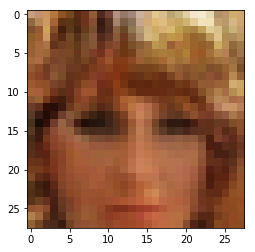

Epoch: 23/50... d_loss: 1.3255... g_loss: 0.6577...


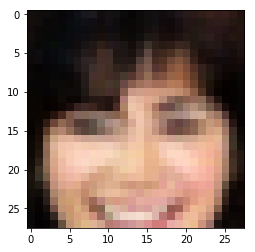

Epoch: 23/50... d_loss: 1.3844... g_loss: 0.6668...


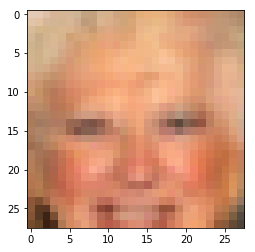

Epoch: 23/50... d_loss: 1.0586... g_loss: 1.0417...


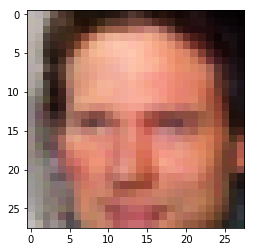

Epoch: 23/50... d_loss: 1.0927... g_loss: 1.5085...


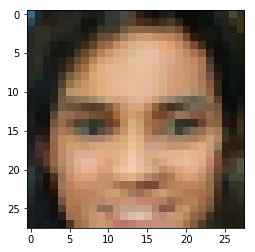

Epoch: 23/50... d_loss: 1.0956... g_loss: 1.0217...


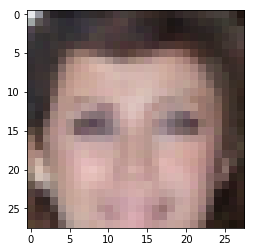

Epoch: 23/50... d_loss: 1.1160... g_loss: 1.1805...


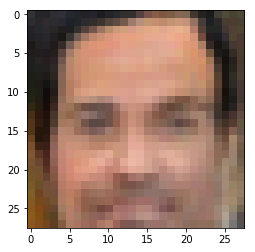

Epoch: 23/50... d_loss: 1.1596... g_loss: 1.0406...


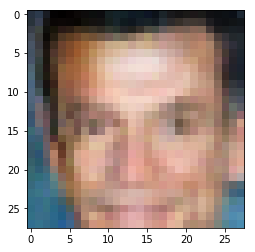

Epoch: 23/50... d_loss: 1.0302... g_loss: 1.0812...


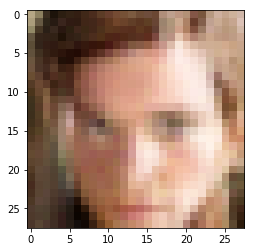

Epoch: 23/50... d_loss: 1.0962... g_loss: 1.0101...


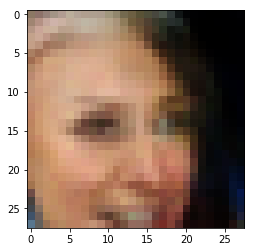

Epoch: 23/50... d_loss: 0.9782... g_loss: 1.1858...


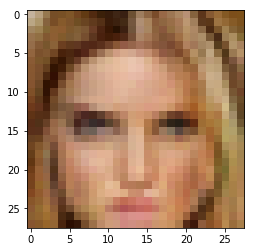

Epoch: 23/50... d_loss: 0.9936... g_loss: 1.0871...


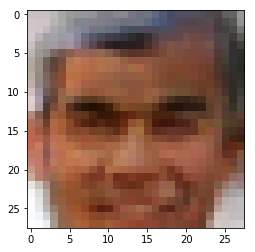

Epoch: 23/50... d_loss: 1.2041... g_loss: 0.8607...


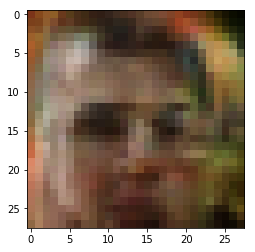

Epoch: 23/50... d_loss: 1.1197... g_loss: 0.9501...


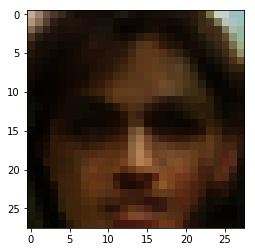

Epoch: 23/50... d_loss: 1.6311... g_loss: 0.4021...


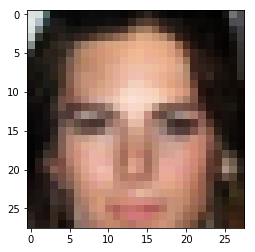

Epoch: 23/50... d_loss: 0.9998... g_loss: 1.2573...


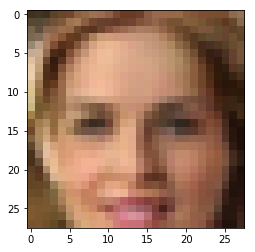

Epoch: 23/50... d_loss: 1.1155... g_loss: 1.2898...


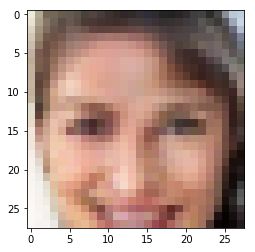

Epoch: 23/50... d_loss: 1.0321... g_loss: 1.3553...


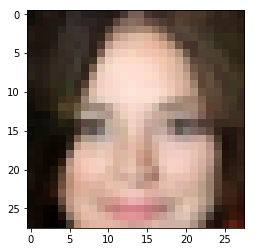

Epoch: 23/50... d_loss: 1.5184... g_loss: 0.7573...


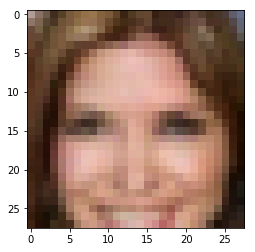

Epoch: 23/50... d_loss: 1.1783... g_loss: 1.0721...


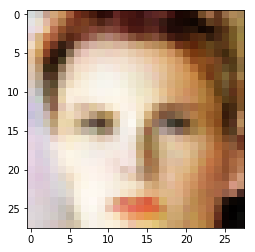

Epoch: 23/50... d_loss: 1.1575... g_loss: 0.8540...


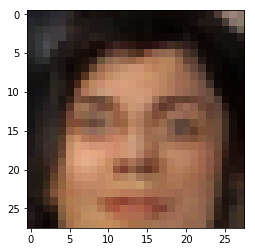

Epoch: 23/50... d_loss: 1.0912... g_loss: 0.9461...


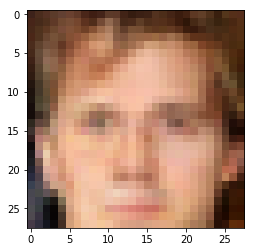

Epoch: 23/50... d_loss: 1.2187... g_loss: 0.8003...


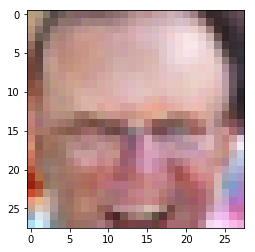

Epoch: 23/50... d_loss: 1.1475... g_loss: 0.9881...


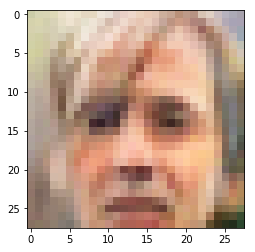

Epoch: 23/50... d_loss: 1.2614... g_loss: 0.7114...


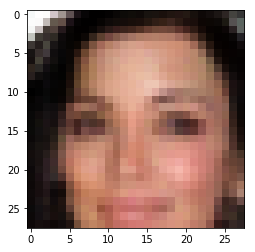

Epoch: 23/50... d_loss: 1.1408... g_loss: 1.6159...


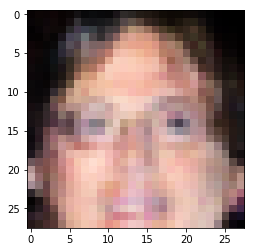

Epoch: 24/50... d_loss: 1.1373... g_loss: 0.8957...


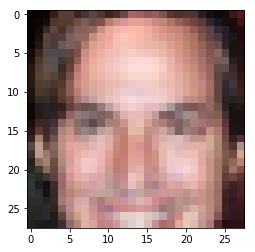

Epoch: 24/50... d_loss: 1.0452... g_loss: 1.3127...


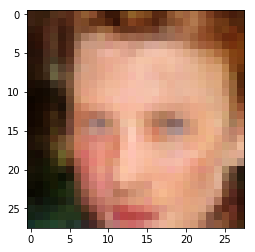

Epoch: 24/50... d_loss: 1.0311... g_loss: 1.1970...


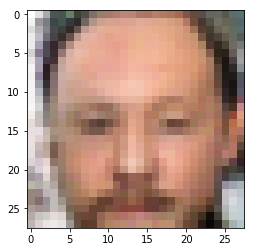

Epoch: 24/50... d_loss: 1.2097... g_loss: 0.7277...


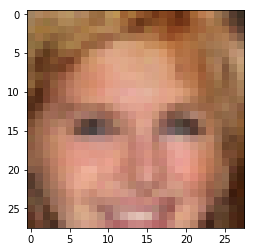

Epoch: 24/50... d_loss: 1.0876... g_loss: 1.4807...


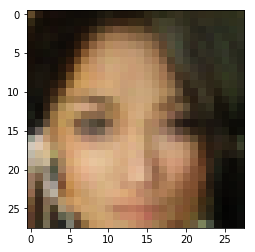

Epoch: 24/50... d_loss: 1.0927... g_loss: 1.4915...


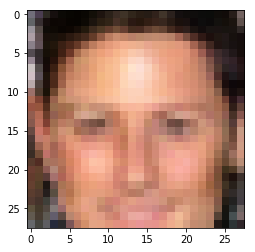

Epoch: 24/50... d_loss: 1.0961... g_loss: 1.0017...


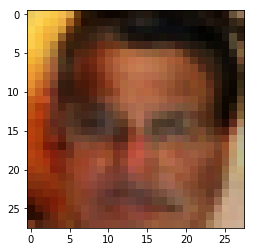

Epoch: 24/50... d_loss: 1.1131... g_loss: 1.3844...


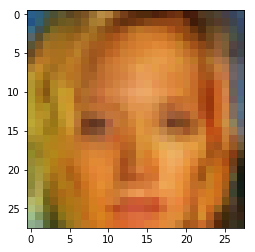

Epoch: 24/50... d_loss: 1.2444... g_loss: 1.9803...


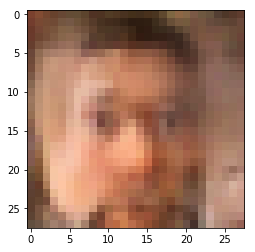

Epoch: 24/50... d_loss: 0.9569... g_loss: 1.1595...


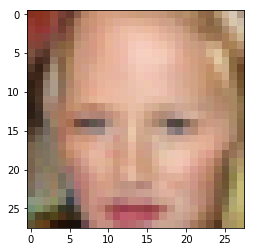

Epoch: 24/50... d_loss: 1.0456... g_loss: 1.1014...


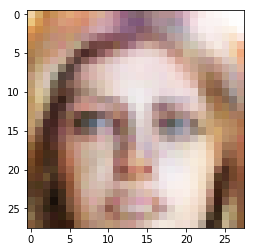

Epoch: 24/50... d_loss: 1.2058... g_loss: 1.1334...


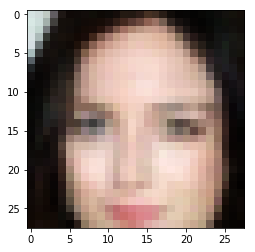

Epoch: 24/50... d_loss: 1.0613... g_loss: 1.0033...


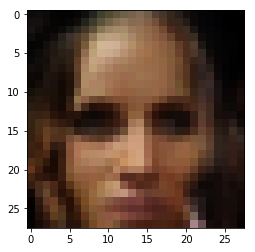

Epoch: 24/50... d_loss: 1.3180... g_loss: 0.7501...


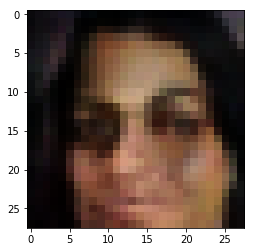

Epoch: 24/50... d_loss: 1.0785... g_loss: 1.0167...


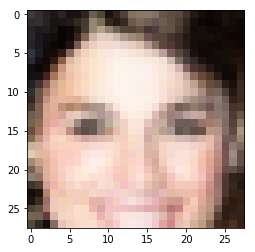

Epoch: 24/50... d_loss: 1.0184... g_loss: 1.2208...


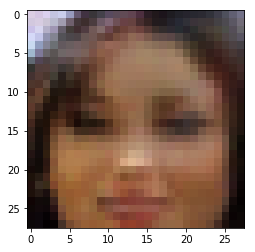

Epoch: 24/50... d_loss: 1.2471... g_loss: 0.7402...


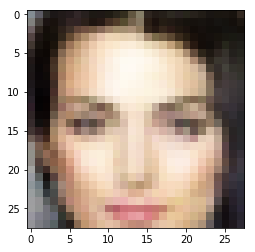

Epoch: 24/50... d_loss: 1.0571... g_loss: 1.0778...


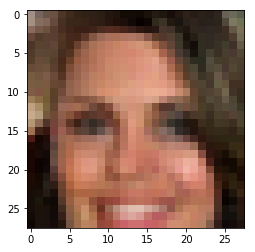

Epoch: 24/50... d_loss: 1.1396... g_loss: 1.2799...


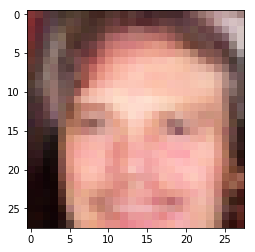

Epoch: 24/50... d_loss: 1.2901... g_loss: 0.7135...


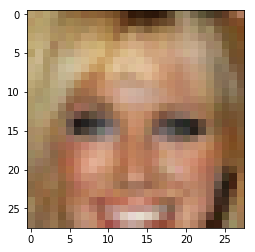

Epoch: 24/50... d_loss: 1.3137... g_loss: 0.6799...


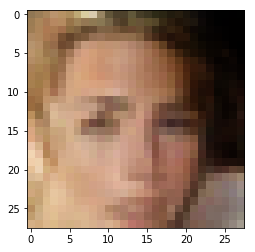

Epoch: 24/50... d_loss: 1.0268... g_loss: 1.0574...


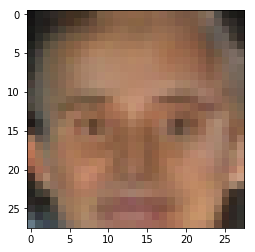

Epoch: 24/50... d_loss: 1.1400... g_loss: 1.0030...


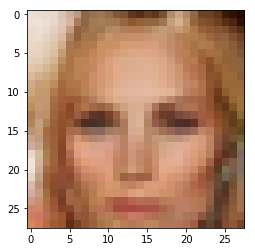

Epoch: 24/50... d_loss: 1.1351... g_loss: 0.9980...


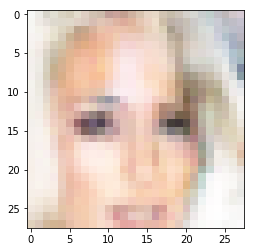

Epoch: 24/50... d_loss: 1.3015... g_loss: 0.7124...


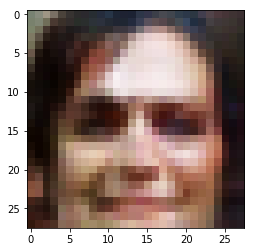

Epoch: 24/50... d_loss: 1.1312... g_loss: 1.0123...


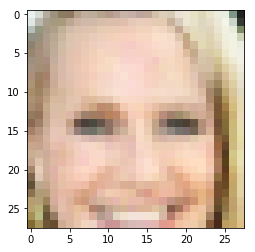

Epoch: 24/50... d_loss: 1.4633... g_loss: 0.5333...


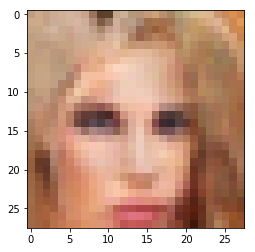

Epoch: 24/50... d_loss: 1.1119... g_loss: 0.9710...


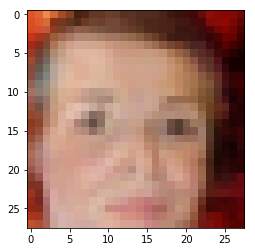

Epoch: 24/50... d_loss: 0.9849... g_loss: 1.5976...


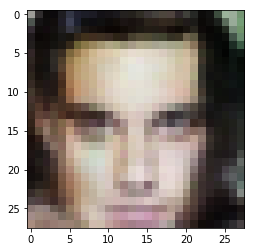

Epoch: 24/50... d_loss: 1.2641... g_loss: 0.7115...


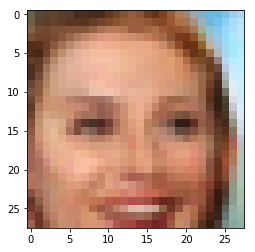

Epoch: 24/50... d_loss: 1.7361... g_loss: 0.3605...


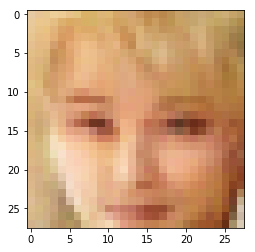

Epoch: 24/50... d_loss: 1.1209... g_loss: 1.1474...


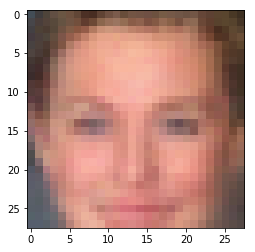

Epoch: 25/50... d_loss: 1.2668... g_loss: 1.3240...


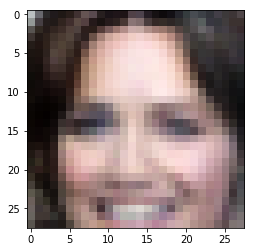

Epoch: 25/50... d_loss: 1.0815... g_loss: 1.1401...


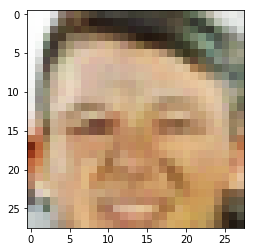

Epoch: 25/50... d_loss: 1.0933... g_loss: 1.0083...


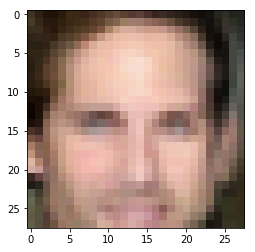

Epoch: 25/50... d_loss: 1.2314... g_loss: 0.7611...


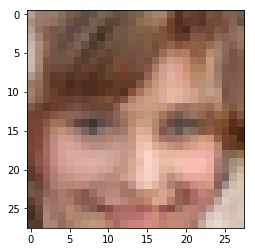

Epoch: 25/50... d_loss: 1.0360... g_loss: 1.1446...


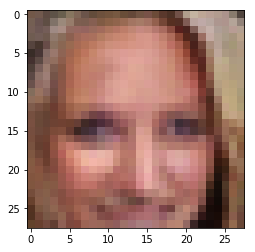

Epoch: 25/50... d_loss: 1.0540... g_loss: 0.9821...


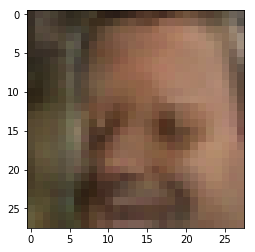

Epoch: 25/50... d_loss: 1.0415... g_loss: 1.0609...


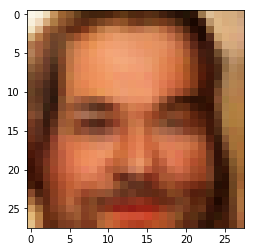

Epoch: 25/50... d_loss: 1.1505... g_loss: 0.8057...


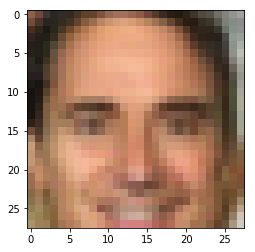

Epoch: 25/50... d_loss: 1.2024... g_loss: 0.7584...


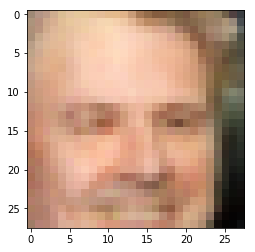

Epoch: 25/50... d_loss: 1.2496... g_loss: 0.6944...


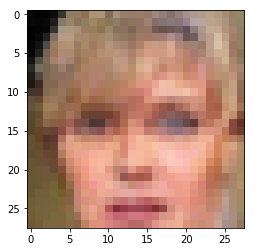

Epoch: 25/50... d_loss: 1.1064... g_loss: 0.9748...


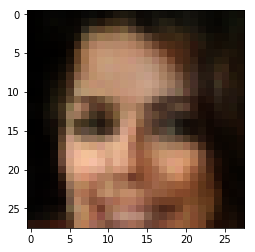

Epoch: 25/50... d_loss: 1.1117... g_loss: 0.9874...


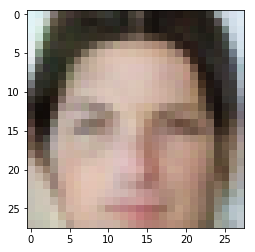

Epoch: 25/50... d_loss: 1.1079... g_loss: 1.0388...


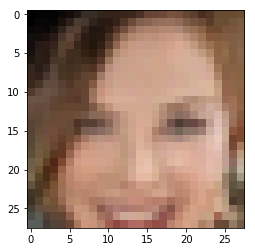

Epoch: 25/50... d_loss: 1.0601... g_loss: 1.2177...


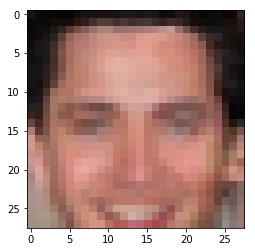

Epoch: 25/50... d_loss: 0.9273... g_loss: 1.2294...


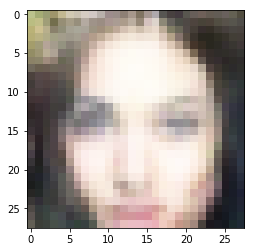

Epoch: 25/50... d_loss: 1.2262... g_loss: 0.8642...


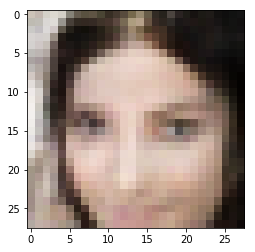

Epoch: 25/50... d_loss: 0.8675... g_loss: 1.3244...


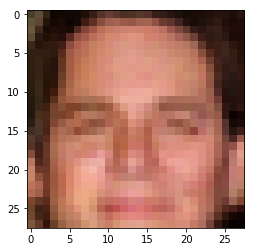

Epoch: 25/50... d_loss: 1.2638... g_loss: 0.7440...


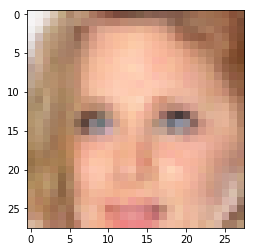

Epoch: 25/50... d_loss: 1.1593... g_loss: 0.8153...


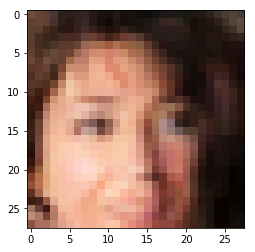

Epoch: 25/50... d_loss: 1.2387... g_loss: 1.0779...


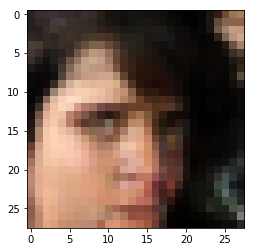

Epoch: 25/50... d_loss: 1.4331... g_loss: 0.5276...


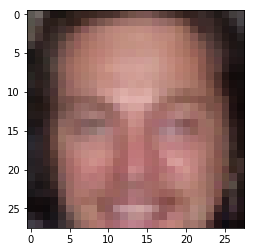

Epoch: 25/50... d_loss: 1.0449... g_loss: 1.0140...


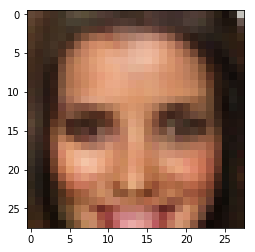

Epoch: 25/50... d_loss: 1.3525... g_loss: 2.2264...


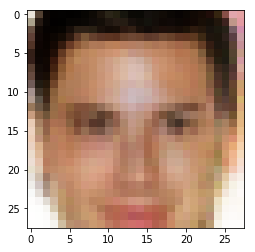

Epoch: 25/50... d_loss: 1.0992... g_loss: 0.9319...


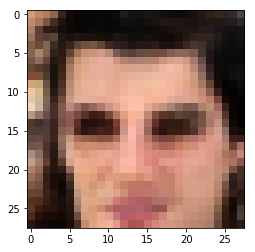

Epoch: 25/50... d_loss: 1.3689... g_loss: 0.6614...


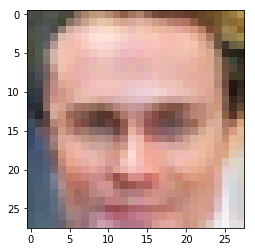

Epoch: 25/50... d_loss: 1.1561... g_loss: 0.9328...


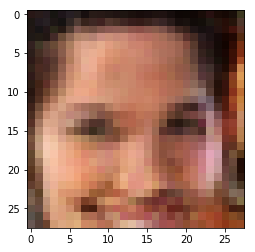

Epoch: 25/50... d_loss: 1.1282... g_loss: 1.0478...


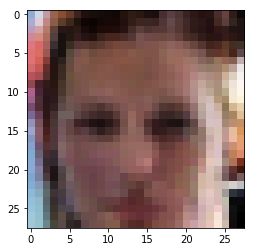

Epoch: 25/50... d_loss: 1.1954... g_loss: 0.7959...


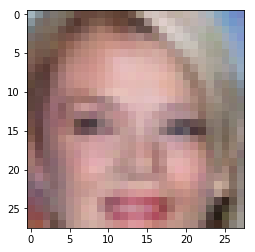

Epoch: 25/50... d_loss: 1.0201... g_loss: 1.0525...


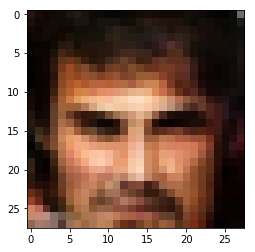

Epoch: 25/50... d_loss: 1.1300... g_loss: 1.1939...


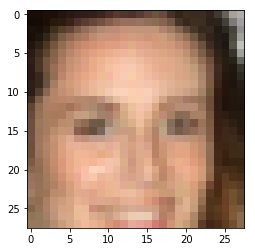

Epoch: 25/50... d_loss: 1.2399... g_loss: 0.7115...


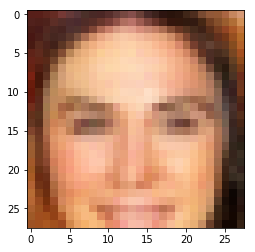

Epoch: 25/50... d_loss: 0.9250... g_loss: 1.4202...


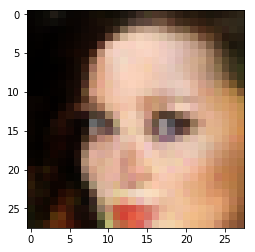

Epoch: 26/50... d_loss: 1.3867... g_loss: 1.6170...


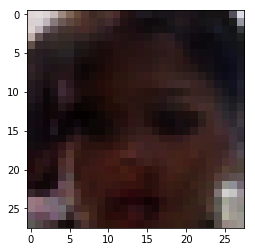

Epoch: 26/50... d_loss: 1.1132... g_loss: 0.9509...


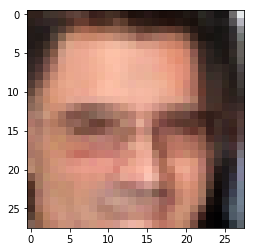

Epoch: 26/50... d_loss: 1.0583... g_loss: 1.0765...


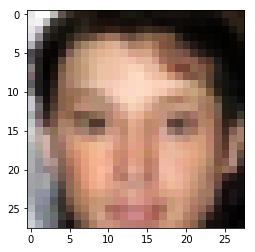

Epoch: 26/50... d_loss: 1.1259... g_loss: 0.8897...


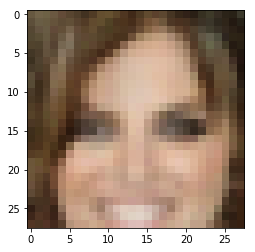

Epoch: 26/50... d_loss: 1.0058... g_loss: 1.1299...


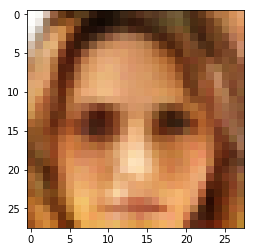

Epoch: 26/50... d_loss: 1.1023... g_loss: 1.2830...


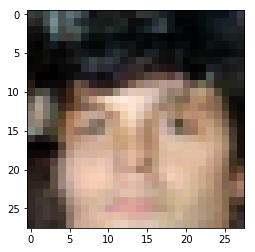

Epoch: 26/50... d_loss: 0.9706... g_loss: 1.0837...


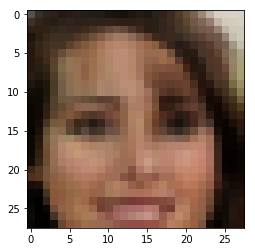

Epoch: 26/50... d_loss: 1.0584... g_loss: 1.1951...


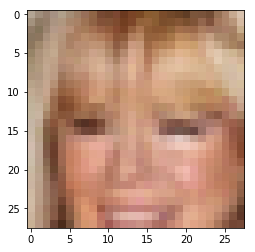

Epoch: 26/50... d_loss: 1.1517... g_loss: 0.9047...


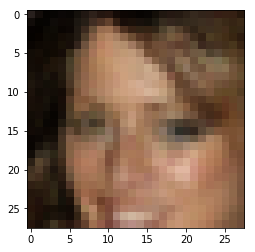

Epoch: 26/50... d_loss: 1.0804... g_loss: 1.1967...


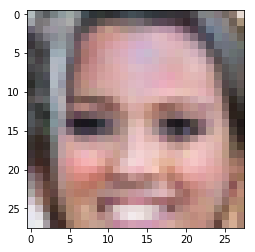

Epoch: 26/50... d_loss: 1.0113... g_loss: 1.0320...


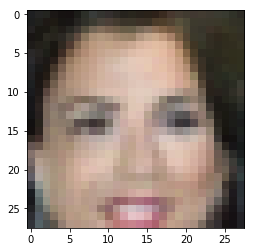

Epoch: 26/50... d_loss: 0.9715... g_loss: 1.1488...


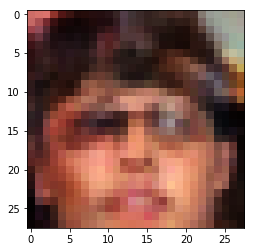

Epoch: 26/50... d_loss: 1.0640... g_loss: 1.0904...


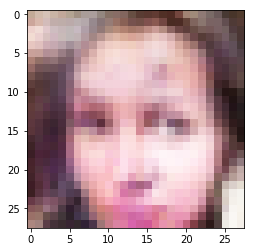

Epoch: 26/50... d_loss: 1.4983... g_loss: 0.6218...


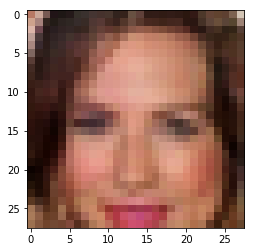

Epoch: 26/50... d_loss: 1.0434... g_loss: 0.9895...


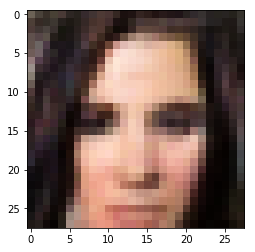

Epoch: 26/50... d_loss: 0.9330... g_loss: 1.2529...


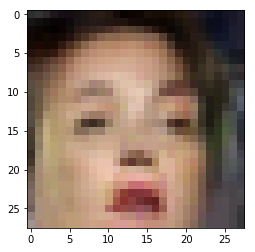

Epoch: 26/50... d_loss: 0.9196... g_loss: 1.5487...


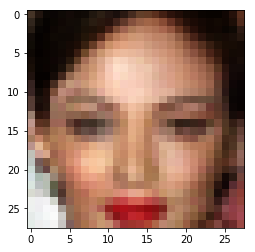

Epoch: 26/50... d_loss: 1.3872... g_loss: 0.6245...


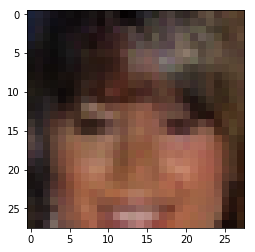

Epoch: 26/50... d_loss: 1.1572... g_loss: 0.8411...


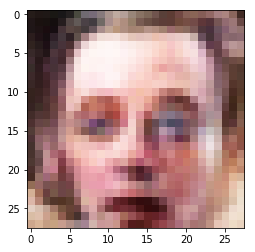

Epoch: 26/50... d_loss: 0.9847... g_loss: 1.4786...


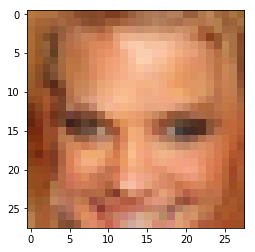

Epoch: 26/50... d_loss: 1.3278... g_loss: 0.6262...


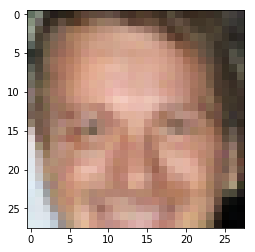

Epoch: 26/50... d_loss: 1.0971... g_loss: 1.0191...


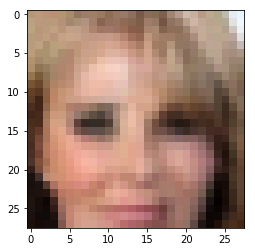

Epoch: 26/50... d_loss: 1.1800... g_loss: 1.3004...


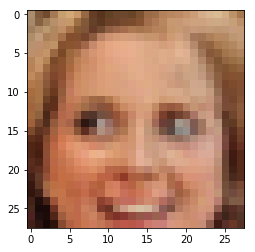

Epoch: 26/50... d_loss: 0.9864... g_loss: 1.2797...


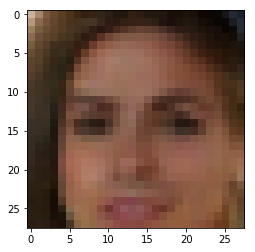

Epoch: 26/50... d_loss: 1.0166... g_loss: 1.0849...


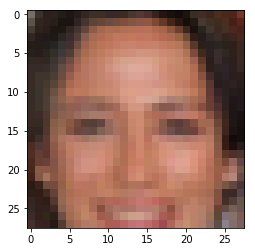

Epoch: 26/50... d_loss: 1.1925... g_loss: 0.7738...


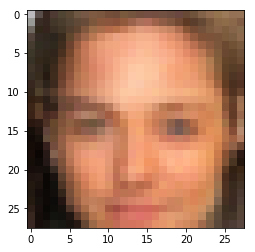

Epoch: 26/50... d_loss: 1.2730... g_loss: 0.7212...


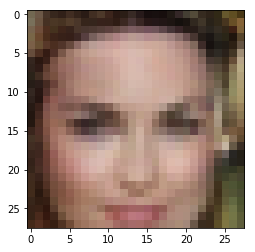

Epoch: 26/50... d_loss: 1.1093... g_loss: 1.1681...


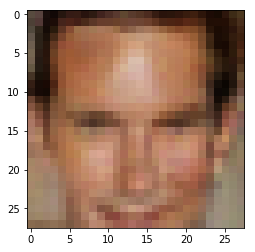

Epoch: 26/50... d_loss: 0.9761... g_loss: 1.1727...


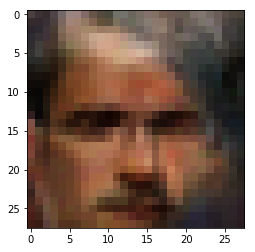

Epoch: 26/50... d_loss: 1.1699... g_loss: 1.5120...


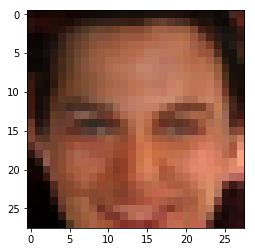

Epoch: 26/50... d_loss: 1.0741... g_loss: 1.0275...


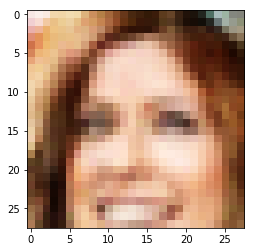

Epoch: 26/50... d_loss: 1.0137... g_loss: 1.3915...


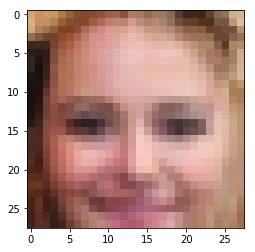

Epoch: 27/50... d_loss: 1.0963... g_loss: 1.2776...


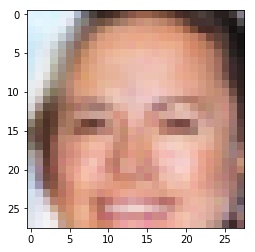

Epoch: 27/50... d_loss: 1.1286... g_loss: 1.9936...


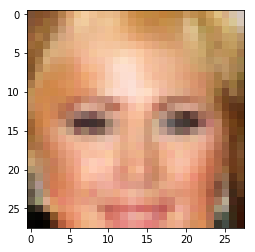

Epoch: 27/50... d_loss: 0.9785... g_loss: 1.4838...


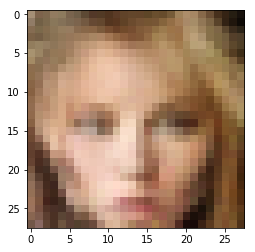

Epoch: 27/50... d_loss: 1.0222... g_loss: 0.9787...


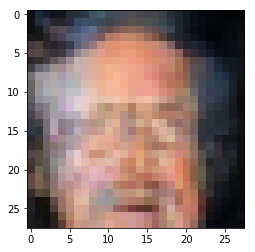

Epoch: 27/50... d_loss: 1.1308... g_loss: 0.9098...


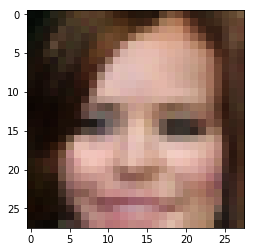

Epoch: 27/50... d_loss: 1.3289... g_loss: 0.6550...


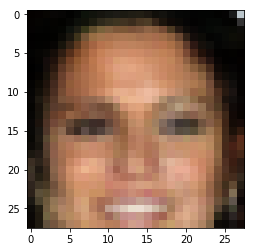

Epoch: 27/50... d_loss: 1.0713... g_loss: 0.8710...


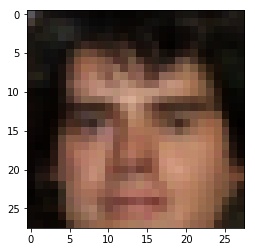

Epoch: 27/50... d_loss: 1.1334... g_loss: 1.3180...


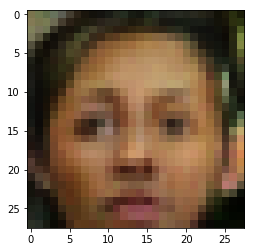

Epoch: 27/50... d_loss: 1.1094... g_loss: 0.9941...


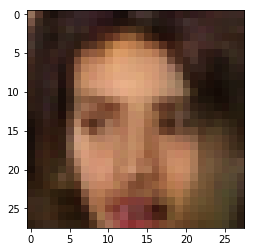

Epoch: 27/50... d_loss: 0.9725... g_loss: 1.1581...


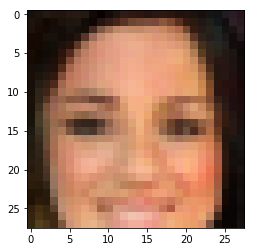

Epoch: 27/50... d_loss: 1.0261... g_loss: 1.1078...


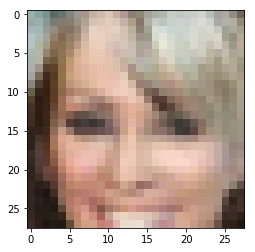

Epoch: 27/50... d_loss: 1.1586... g_loss: 1.6456...


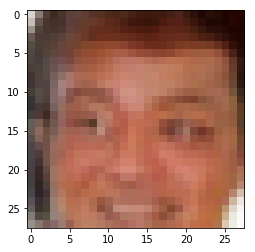

Epoch: 27/50... d_loss: 1.1137... g_loss: 0.9221...


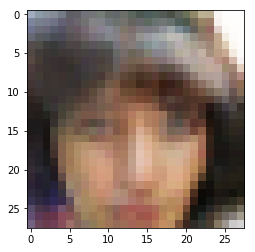

Epoch: 27/50... d_loss: 1.3930... g_loss: 0.6241...


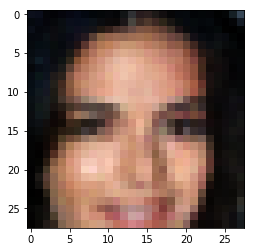

Epoch: 27/50... d_loss: 1.0328... g_loss: 1.0570...


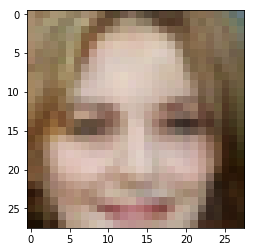

Epoch: 27/50... d_loss: 1.2380... g_loss: 0.6873...


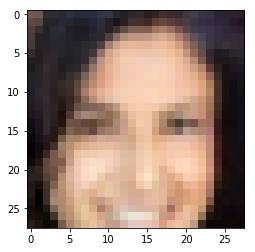

Epoch: 27/50... d_loss: 1.0809... g_loss: 0.8722...


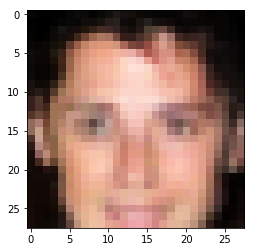

Epoch: 27/50... d_loss: 1.3026... g_loss: 0.7187...


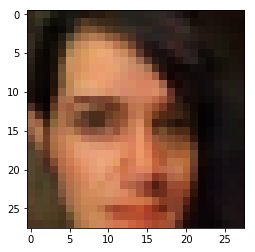

Epoch: 27/50... d_loss: 0.9615... g_loss: 1.2144...


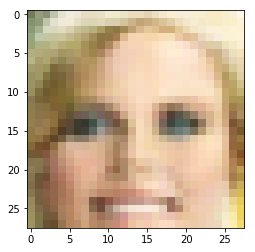

Epoch: 27/50... d_loss: 1.0064... g_loss: 1.3916...


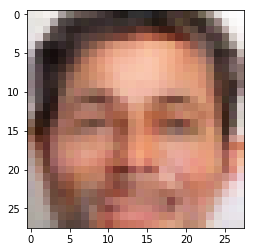

Epoch: 27/50... d_loss: 1.2983... g_loss: 0.7003...


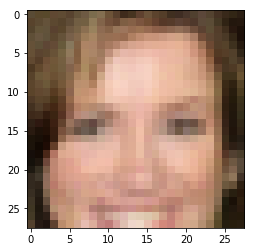

Epoch: 27/50... d_loss: 1.1036... g_loss: 0.9485...


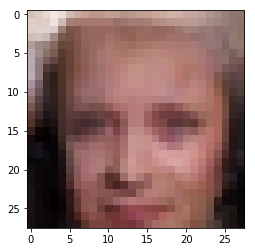

Epoch: 27/50... d_loss: 0.8608... g_loss: 1.5709...


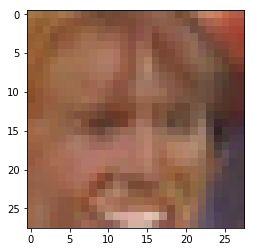

Epoch: 27/50... d_loss: 1.1349... g_loss: 0.8543...


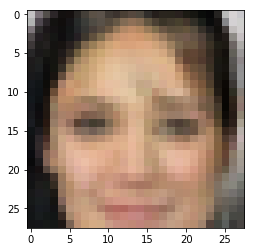

Epoch: 27/50... d_loss: 1.5058... g_loss: 0.5230...


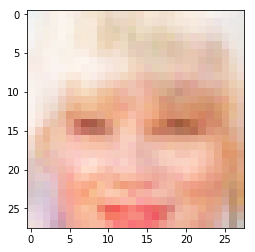

Epoch: 27/50... d_loss: 1.0275... g_loss: 1.2121...


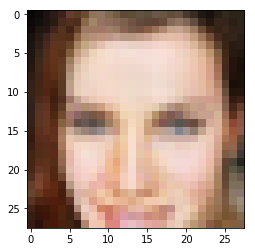

Epoch: 27/50... d_loss: 1.0691... g_loss: 1.0172...


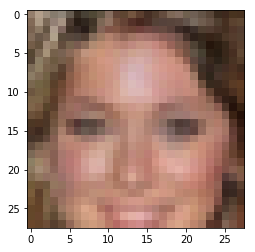

Epoch: 27/50... d_loss: 1.1563... g_loss: 0.9507...


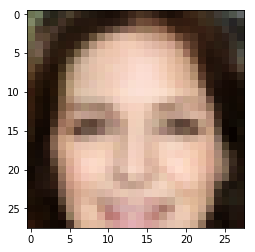

Epoch: 27/50... d_loss: 1.0639... g_loss: 1.0146...


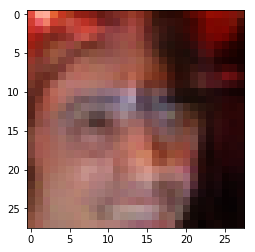

Epoch: 27/50... d_loss: 1.1418... g_loss: 1.0656...


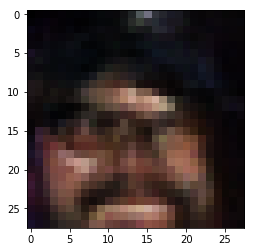

Epoch: 27/50... d_loss: 1.1523... g_loss: 1.2348...


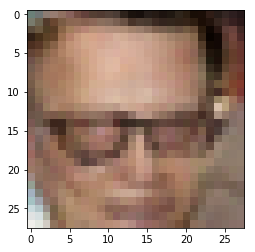

Epoch: 27/50... d_loss: 0.9710... g_loss: 1.2075...


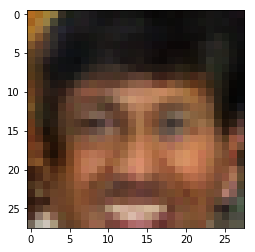

Epoch: 28/50... d_loss: 1.0491... g_loss: 1.0299...


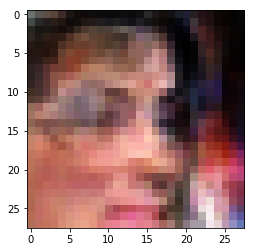

Epoch: 28/50... d_loss: 1.0830... g_loss: 1.1860...


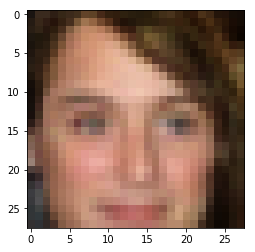

Epoch: 28/50... d_loss: 1.0961... g_loss: 1.1041...


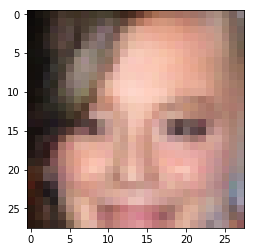

Epoch: 28/50... d_loss: 1.2066... g_loss: 0.7673...


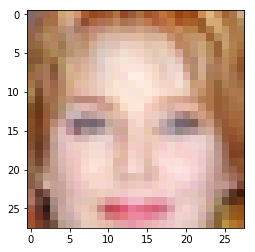

Epoch: 28/50... d_loss: 1.0869... g_loss: 1.0017...


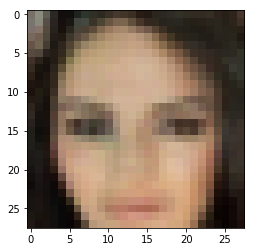

Epoch: 28/50... d_loss: 1.1732... g_loss: 0.8236...


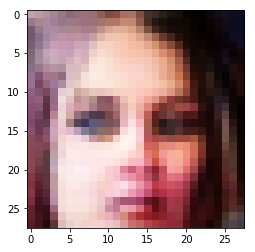

Epoch: 28/50... d_loss: 1.0200... g_loss: 1.1533...


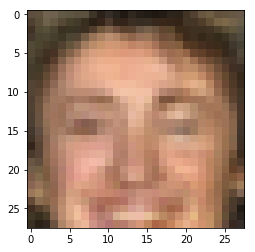

Epoch: 28/50... d_loss: 1.0695... g_loss: 1.1440...


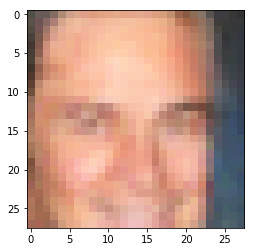

Epoch: 28/50... d_loss: 0.9170... g_loss: 1.5385...


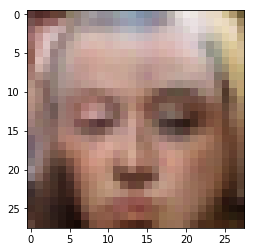

Epoch: 28/50... d_loss: 0.9781... g_loss: 1.0464...


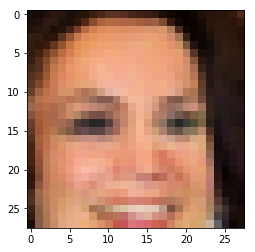

Epoch: 28/50... d_loss: 0.9913... g_loss: 1.4945...


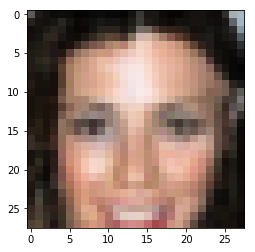

Epoch: 28/50... d_loss: 1.0061... g_loss: 1.1278...


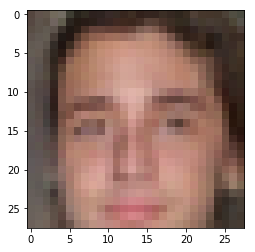

Epoch: 28/50... d_loss: 0.9792... g_loss: 1.2663...


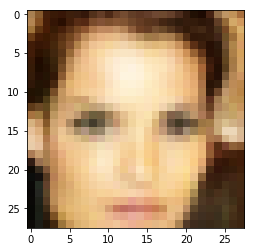

Epoch: 28/50... d_loss: 1.4508... g_loss: 0.6021...


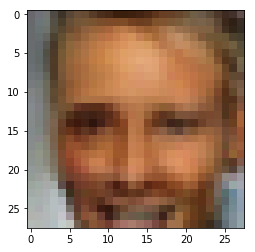

Epoch: 28/50... d_loss: 1.0144... g_loss: 1.0640...


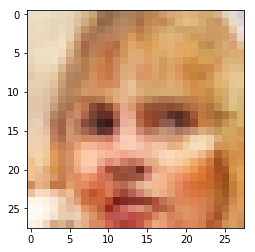

Epoch: 28/50... d_loss: 1.2337... g_loss: 0.8080...


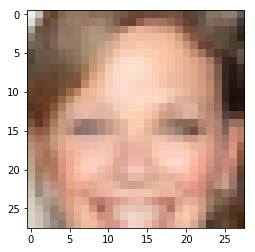

Epoch: 28/50... d_loss: 1.4681... g_loss: 0.5412...


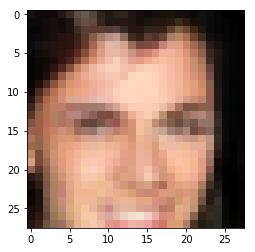

Epoch: 28/50... d_loss: 1.2877... g_loss: 0.7627...


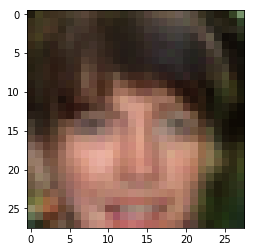

Epoch: 28/50... d_loss: 1.2073... g_loss: 0.8189...


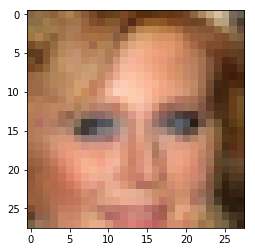

Epoch: 28/50... d_loss: 1.4122... g_loss: 0.6165...


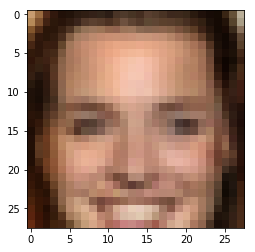

Epoch: 28/50... d_loss: 1.1301... g_loss: 0.9250...


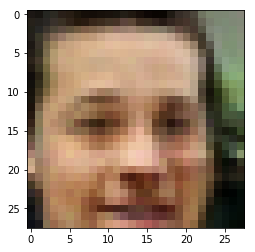

Epoch: 28/50... d_loss: 1.0840... g_loss: 0.9207...


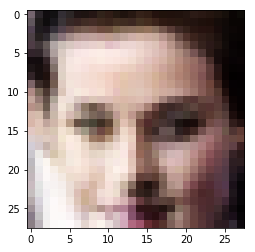

Epoch: 28/50... d_loss: 1.0386... g_loss: 1.3416...


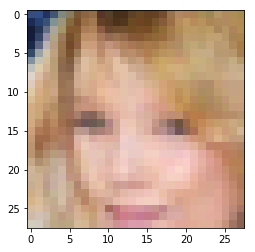

Epoch: 28/50... d_loss: 0.9730... g_loss: 1.2282...


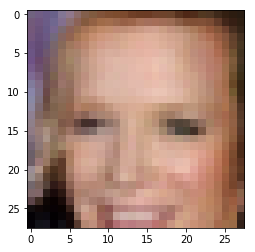

Epoch: 28/50... d_loss: 1.2137... g_loss: 0.7672...


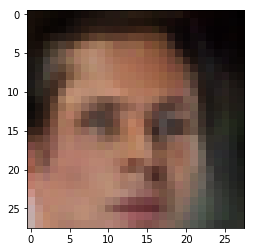

Epoch: 28/50... d_loss: 1.0754... g_loss: 1.6539...


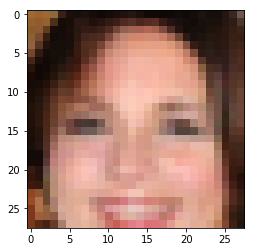

Epoch: 28/50... d_loss: 1.3314... g_loss: 0.6240...


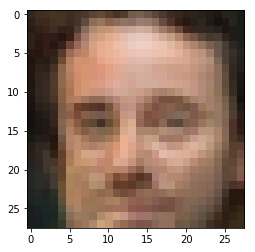

Epoch: 28/50... d_loss: 1.0909... g_loss: 0.9802...


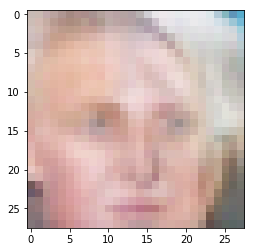

Epoch: 28/50... d_loss: 0.9437... g_loss: 1.2169...


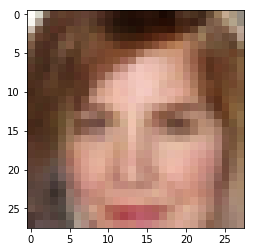

Epoch: 28/50... d_loss: 1.1662... g_loss: 0.9032...


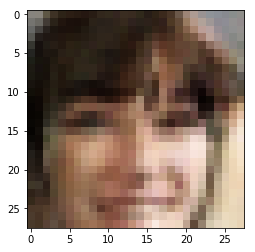

Epoch: 28/50... d_loss: 1.0543... g_loss: 1.1344...


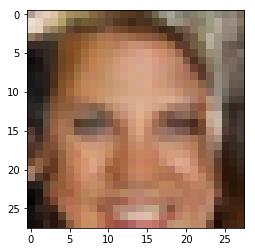

Epoch: 28/50... d_loss: 1.1186... g_loss: 1.0939...


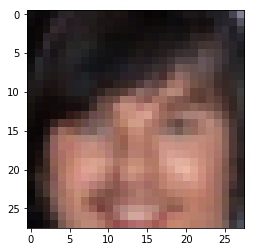

Epoch: 29/50... d_loss: 1.2070... g_loss: 0.7650...


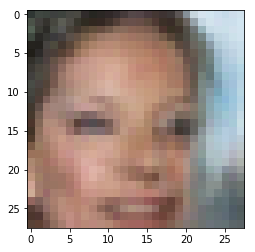

Epoch: 29/50... d_loss: 0.9935... g_loss: 1.2072...


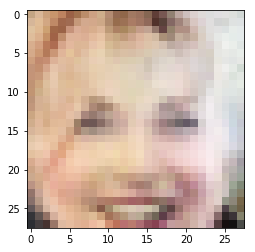

Epoch: 29/50... d_loss: 1.0833... g_loss: 0.9694...


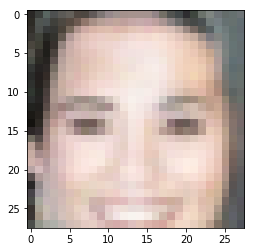

Epoch: 29/50... d_loss: 1.3196... g_loss: 0.6786...


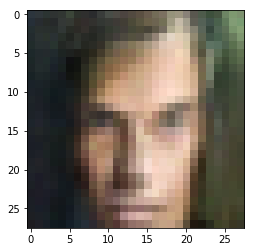

Epoch: 29/50... d_loss: 0.9498... g_loss: 1.3743...


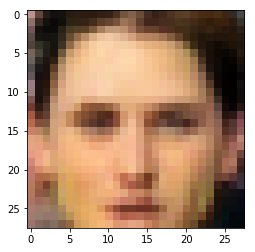

Epoch: 29/50... d_loss: 1.0401... g_loss: 0.9805...


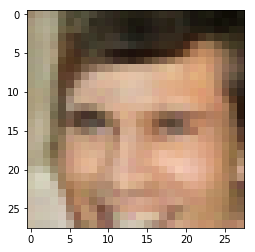

Epoch: 29/50... d_loss: 1.0073... g_loss: 1.0941...


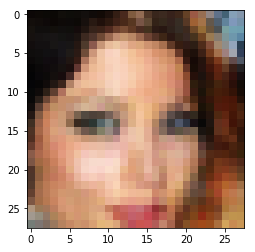

Epoch: 29/50... d_loss: 1.0513... g_loss: 1.7133...


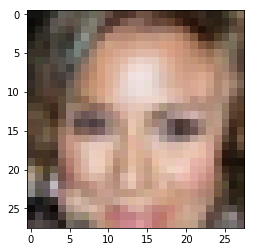

Epoch: 29/50... d_loss: 1.1071... g_loss: 0.9335...


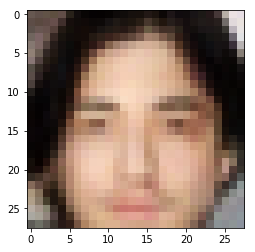

Epoch: 29/50... d_loss: 1.1240... g_loss: 0.9144...


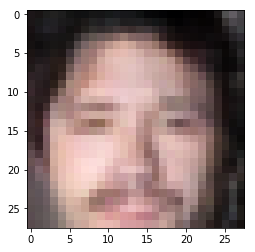

Epoch: 29/50... d_loss: 1.0760... g_loss: 0.9876...


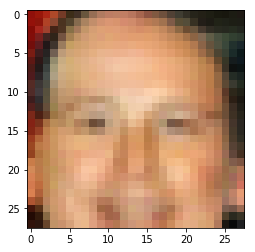

Epoch: 29/50... d_loss: 1.0102... g_loss: 1.2556...


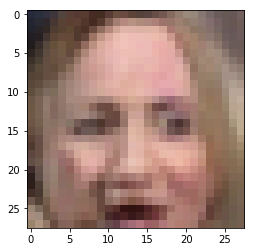

Epoch: 29/50... d_loss: 0.9303... g_loss: 1.1506...


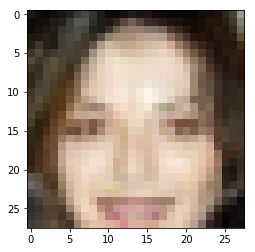

Epoch: 29/50... d_loss: 1.1884... g_loss: 0.8801...


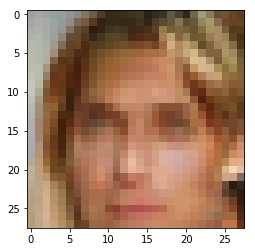

Epoch: 29/50... d_loss: 1.0031... g_loss: 1.1057...


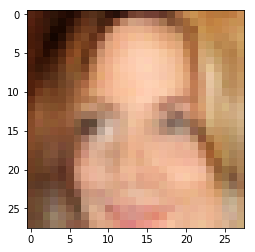

Epoch: 29/50... d_loss: 1.0925... g_loss: 0.9410...


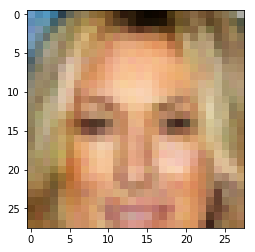

Epoch: 29/50... d_loss: 0.9938... g_loss: 1.1754...


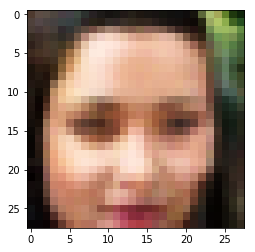

Epoch: 29/50... d_loss: 1.2765... g_loss: 0.7480...


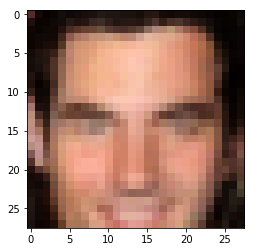

Epoch: 29/50... d_loss: 1.3518... g_loss: 0.7197...


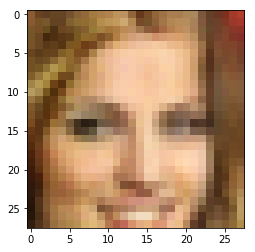

Epoch: 29/50... d_loss: 1.0415... g_loss: 1.0015...


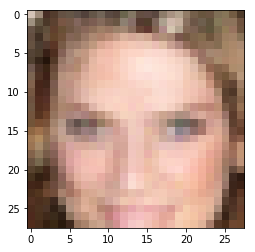

Epoch: 29/50... d_loss: 1.2577... g_loss: 0.6819...


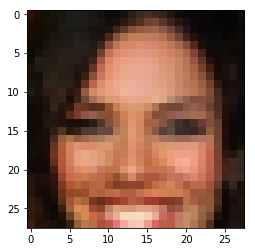

Epoch: 29/50... d_loss: 0.8932... g_loss: 1.6917...


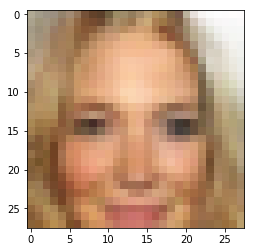

Epoch: 29/50... d_loss: 0.8923... g_loss: 1.3753...


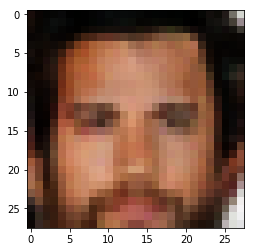

Epoch: 29/50... d_loss: 1.0176... g_loss: 1.0487...


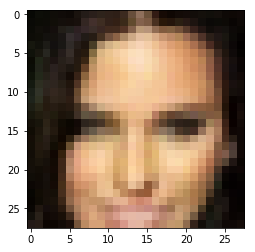

Epoch: 29/50... d_loss: 1.0683... g_loss: 1.0100...


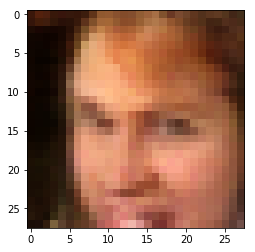

Epoch: 29/50... d_loss: 0.9782... g_loss: 1.2552...


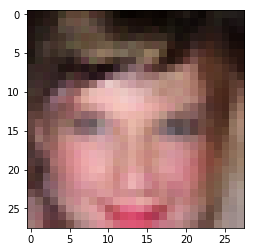

Epoch: 29/50... d_loss: 1.3469... g_loss: 0.6065...


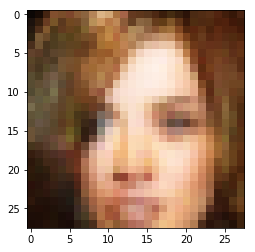

Epoch: 29/50... d_loss: 1.1296... g_loss: 0.9801...


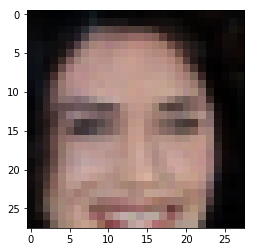

Epoch: 29/50... d_loss: 1.1209... g_loss: 0.9605...


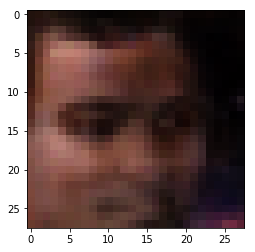

Epoch: 29/50... d_loss: 1.2149... g_loss: 0.8181...


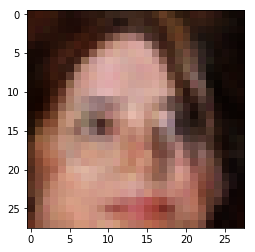

Epoch: 29/50... d_loss: 1.1398... g_loss: 1.1354...


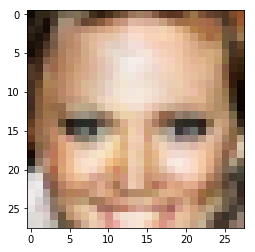

Epoch: 29/50... d_loss: 1.0040... g_loss: 1.3824...


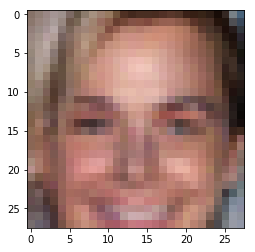

Epoch: 30/50... d_loss: 1.2183... g_loss: 0.8038...


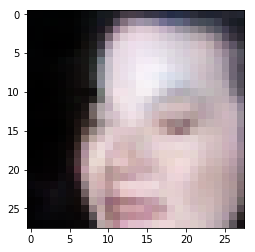

Epoch: 30/50... d_loss: 1.0734... g_loss: 1.3100...


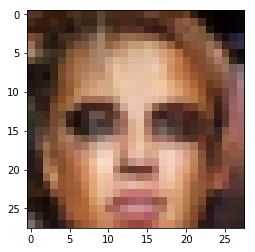

Epoch: 30/50... d_loss: 1.1601... g_loss: 2.0096...


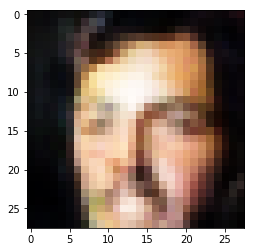

Epoch: 30/50... d_loss: 1.4620... g_loss: 0.5420...


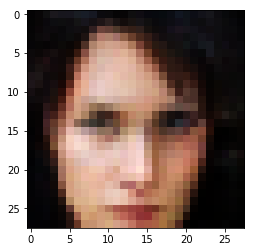

Epoch: 30/50... d_loss: 1.1108... g_loss: 1.0265...


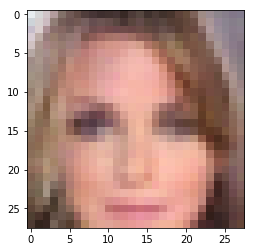

Epoch: 30/50... d_loss: 0.7634... g_loss: 1.5011...


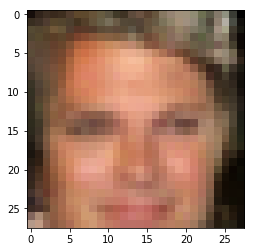

Epoch: 30/50... d_loss: 1.0750... g_loss: 1.0990...


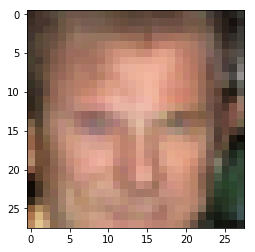

Epoch: 30/50... d_loss: 0.9846... g_loss: 1.1916...


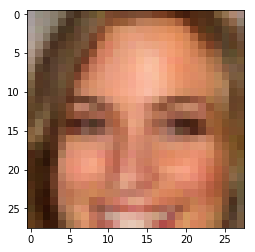

Epoch: 30/50... d_loss: 0.9310... g_loss: 1.3232...


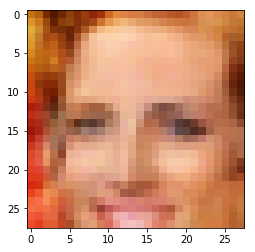

Epoch: 30/50... d_loss: 0.9303... g_loss: 1.1042...


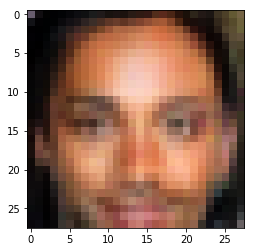

Epoch: 30/50... d_loss: 1.0158... g_loss: 1.1418...


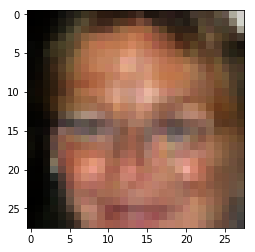

Epoch: 30/50... d_loss: 1.0368... g_loss: 1.6496...


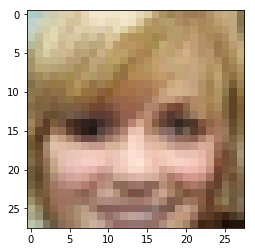

Epoch: 30/50... d_loss: 1.1269... g_loss: 0.8960...


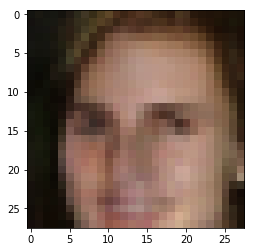

Epoch: 30/50... d_loss: 1.1965... g_loss: 0.9866...


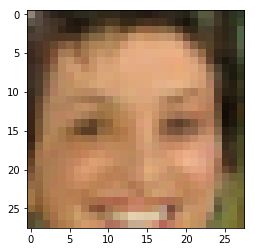

Epoch: 30/50... d_loss: 1.0562... g_loss: 1.1053...


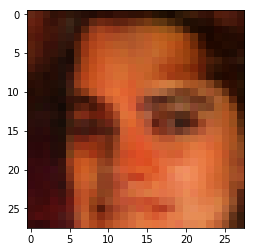

Epoch: 30/50... d_loss: 1.1622... g_loss: 0.9520...


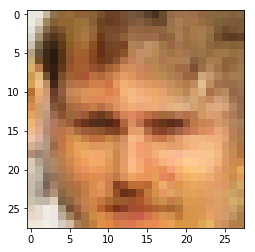

Epoch: 30/50... d_loss: 1.1736... g_loss: 0.7907...


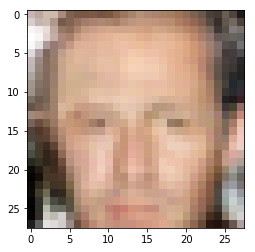

Epoch: 30/50... d_loss: 1.1726... g_loss: 0.9578...


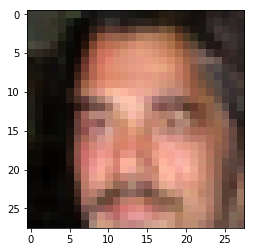

Epoch: 30/50... d_loss: 0.9781... g_loss: 1.1007...


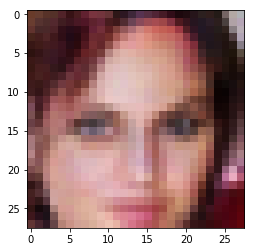

Epoch: 30/50... d_loss: 1.0399... g_loss: 1.0507...


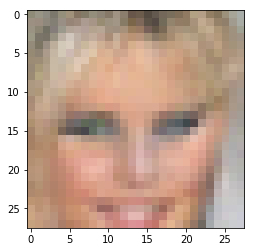

Epoch: 30/50... d_loss: 1.3158... g_loss: 0.7200...


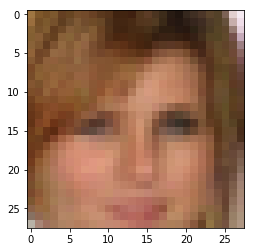

Epoch: 30/50... d_loss: 0.9975... g_loss: 1.4313...


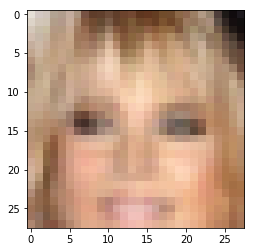

Epoch: 30/50... d_loss: 1.0217... g_loss: 1.3439...


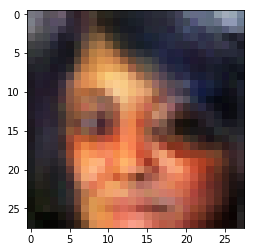

Epoch: 30/50... d_loss: 1.6474... g_loss: 2.6161...


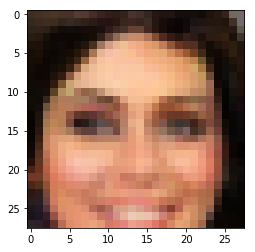

Epoch: 30/50... d_loss: 1.2767... g_loss: 0.6719...


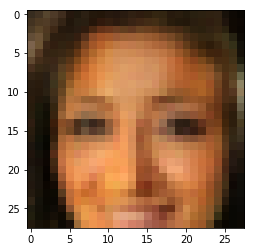

Epoch: 30/50... d_loss: 0.9784... g_loss: 1.1818...


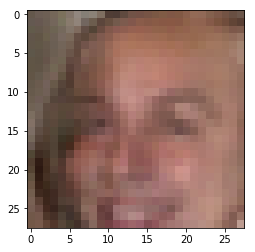

Epoch: 30/50... d_loss: 1.3145... g_loss: 0.6941...


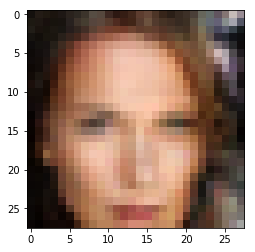

Epoch: 30/50... d_loss: 0.9541... g_loss: 1.2856...


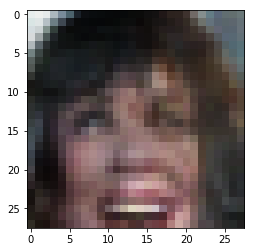

Epoch: 30/50... d_loss: 1.1188... g_loss: 0.8690...


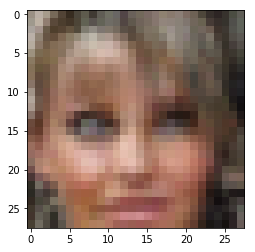

Epoch: 30/50... d_loss: 1.2720... g_loss: 0.6974...


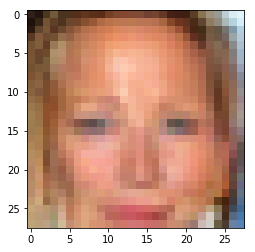

Epoch: 30/50... d_loss: 0.9957... g_loss: 1.4134...


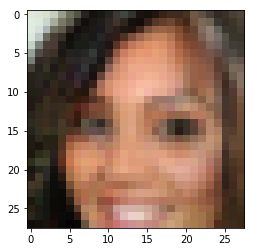

Epoch: 30/50... d_loss: 0.9990... g_loss: 1.3660...


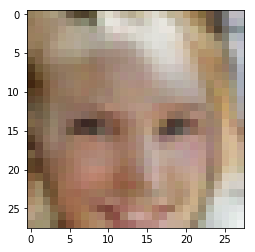

Epoch: 31/50... d_loss: 1.2148... g_loss: 0.8662...


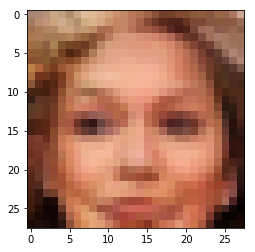

Epoch: 31/50... d_loss: 1.0141... g_loss: 1.0214...


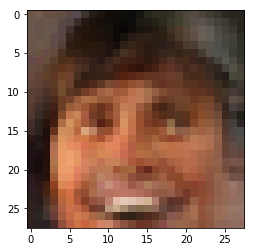

Epoch: 31/50... d_loss: 1.0247... g_loss: 1.4057...


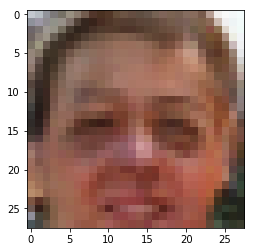

Epoch: 31/50... d_loss: 1.6034... g_loss: 0.5057...


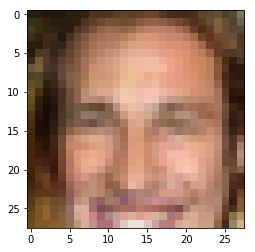

Epoch: 31/50... d_loss: 1.0026... g_loss: 1.1480...


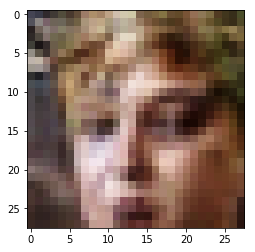

Epoch: 31/50... d_loss: 1.0941... g_loss: 1.0130...


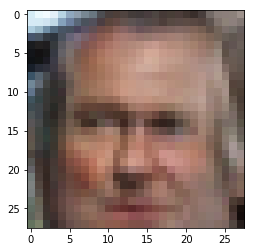

Epoch: 31/50... d_loss: 0.8967... g_loss: 1.2691...


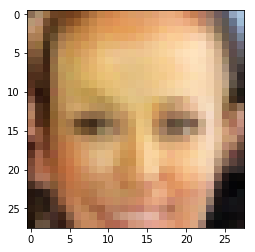

Epoch: 31/50... d_loss: 1.0482... g_loss: 1.0818...


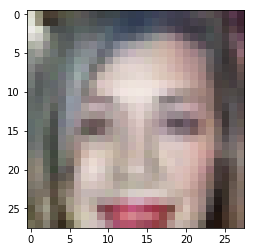

Epoch: 31/50... d_loss: 1.3022... g_loss: 0.7052...


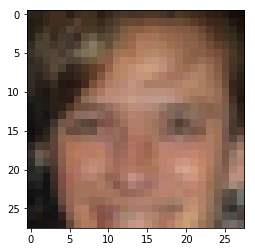

Epoch: 31/50... d_loss: 1.0355... g_loss: 0.9954...


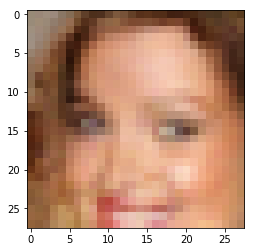

Epoch: 31/50... d_loss: 0.8918... g_loss: 1.5104...


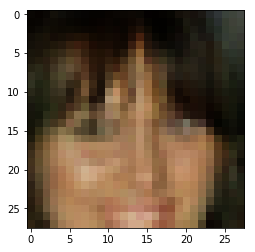

Epoch: 31/50... d_loss: 1.3056... g_loss: 0.6593...


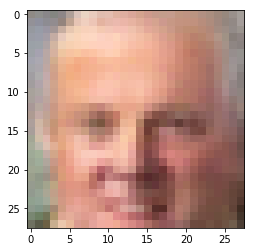

Epoch: 31/50... d_loss: 1.2468... g_loss: 1.7820...


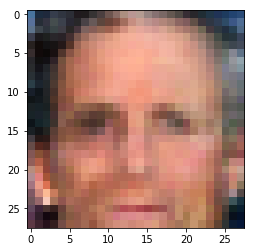

Epoch: 31/50... d_loss: 1.1968... g_loss: 0.8790...


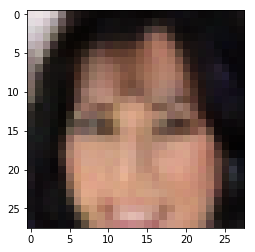

Epoch: 31/50... d_loss: 0.9383... g_loss: 1.1780...


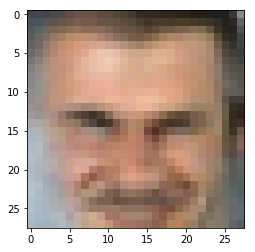

Epoch: 31/50... d_loss: 1.1559... g_loss: 0.9499...


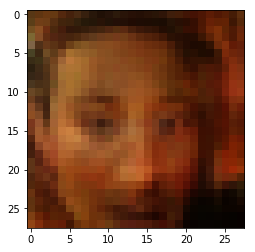

Epoch: 31/50... d_loss: 0.9705... g_loss: 1.2370...


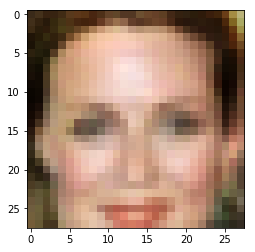

Epoch: 31/50... d_loss: 1.3432... g_loss: 0.6639...


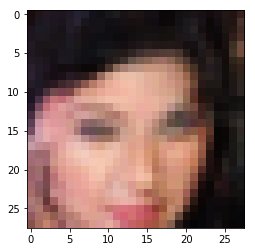

Epoch: 31/50... d_loss: 1.0119... g_loss: 1.2179...


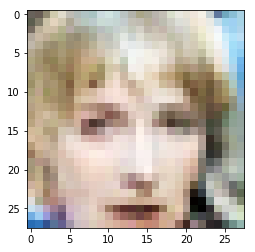

Epoch: 31/50... d_loss: 1.1872... g_loss: 0.8598...


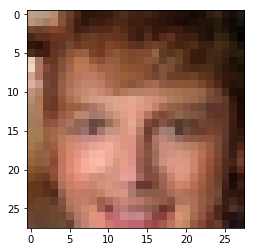

Epoch: 31/50... d_loss: 1.0835... g_loss: 0.9936...


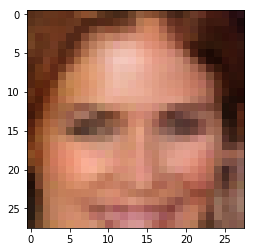

Epoch: 31/50... d_loss: 0.9396... g_loss: 1.3647...


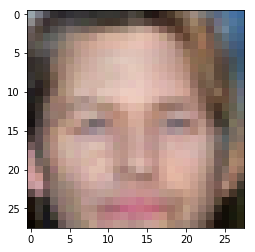

Epoch: 31/50... d_loss: 1.1315... g_loss: 0.9216...


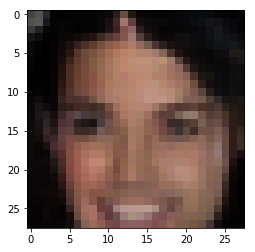

Epoch: 31/50... d_loss: 0.9638... g_loss: 1.1678...


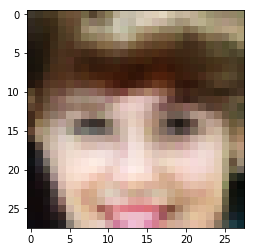

Epoch: 31/50... d_loss: 1.0200... g_loss: 1.1091...


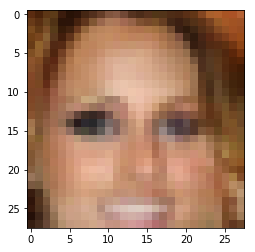

Epoch: 31/50... d_loss: 0.9897... g_loss: 1.1241...


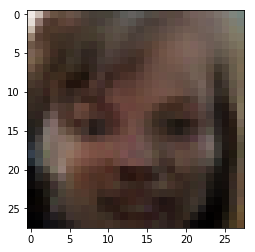

Epoch: 31/50... d_loss: 1.2083... g_loss: 0.8892...


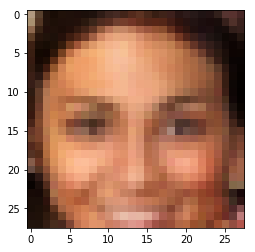

Epoch: 31/50... d_loss: 1.1590... g_loss: 0.9207...


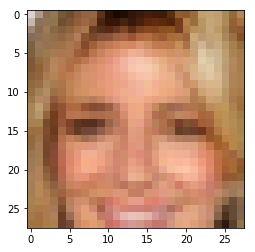

Epoch: 31/50... d_loss: 0.9569... g_loss: 1.2007...


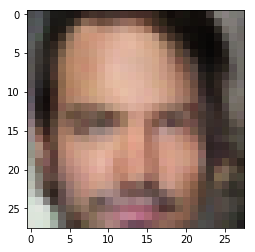

Epoch: 31/50... d_loss: 0.8909... g_loss: 1.5040...


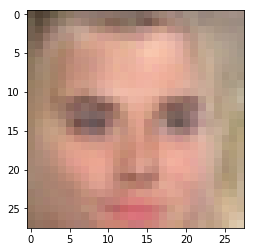

Epoch: 31/50... d_loss: 1.1203... g_loss: 0.9362...


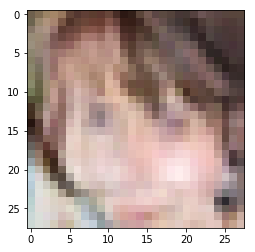

Epoch: 31/50... d_loss: 1.2134... g_loss: 0.8162...


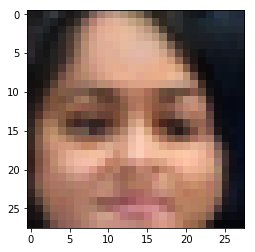

Epoch: 32/50... d_loss: 1.3627... g_loss: 0.6051...


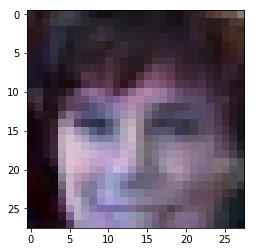

Epoch: 32/50... d_loss: 1.0524... g_loss: 1.2345...


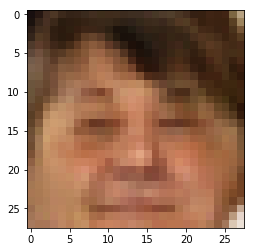

Epoch: 32/50... d_loss: 1.0090... g_loss: 1.2854...


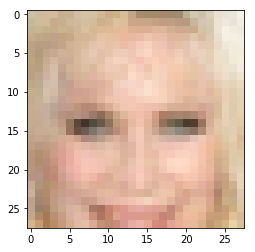

Epoch: 32/50... d_loss: 0.9762... g_loss: 1.4743...


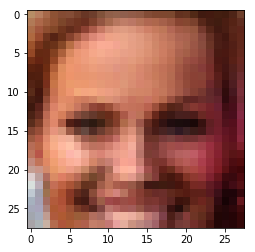

Epoch: 32/50... d_loss: 0.8730... g_loss: 1.4859...


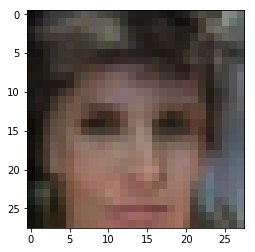

Epoch: 32/50... d_loss: 1.1651... g_loss: 0.7638...


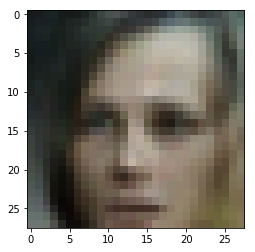

Epoch: 32/50... d_loss: 1.0356... g_loss: 1.0559...


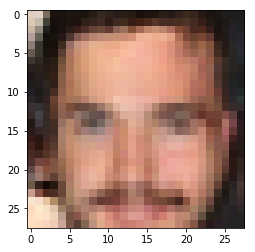

Epoch: 32/50... d_loss: 0.9287... g_loss: 1.3439...


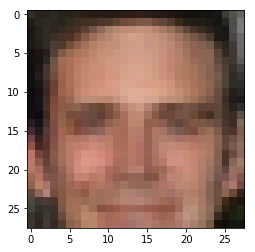

Epoch: 32/50... d_loss: 1.0608... g_loss: 0.9769...


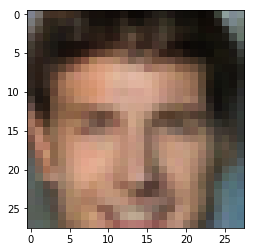

Epoch: 32/50... d_loss: 1.0040... g_loss: 1.1207...


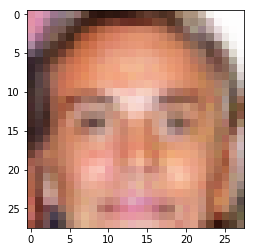

Epoch: 32/50... d_loss: 0.9766... g_loss: 1.2201...


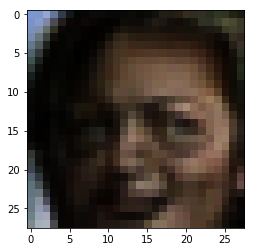

Epoch: 32/50... d_loss: 0.9722... g_loss: 1.1000...


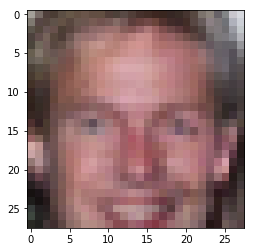

Epoch: 32/50... d_loss: 0.9616... g_loss: 0.9986...


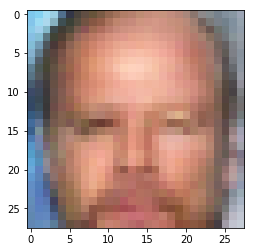

Epoch: 32/50... d_loss: 1.2328... g_loss: 0.7762...


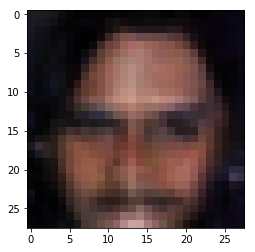

Epoch: 32/50... d_loss: 1.0555... g_loss: 0.9019...


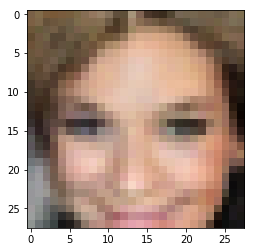

Epoch: 32/50... d_loss: 1.0600... g_loss: 1.0185...


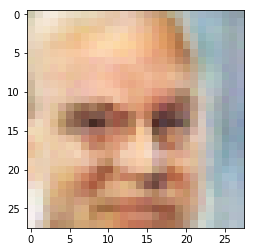

Epoch: 32/50... d_loss: 1.0423... g_loss: 1.0379...


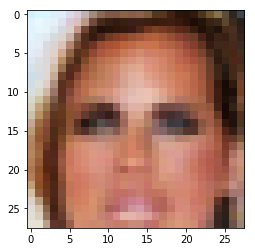

Epoch: 32/50... d_loss: 1.3008... g_loss: 0.6777...


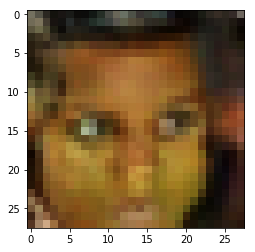

Epoch: 32/50... d_loss: 0.8265... g_loss: 1.4513...


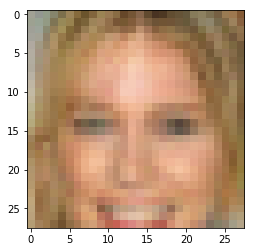

Epoch: 32/50... d_loss: 1.1233... g_loss: 0.9368...


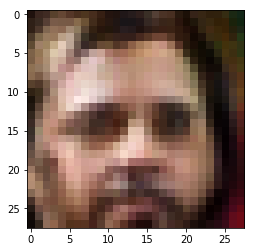

Epoch: 32/50... d_loss: 1.2017... g_loss: 1.0353...


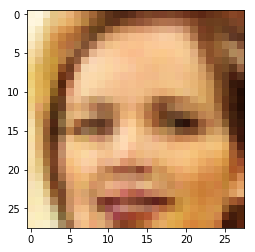

Epoch: 32/50... d_loss: 1.0206... g_loss: 1.0206...


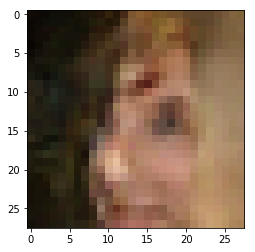

Epoch: 32/50... d_loss: 1.0661... g_loss: 1.5244...


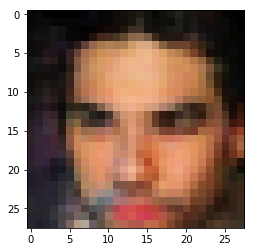

Epoch: 32/50... d_loss: 1.1657... g_loss: 1.9127...


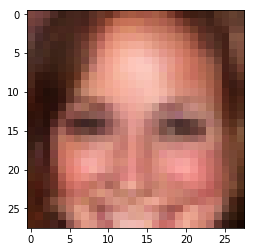

Epoch: 32/50... d_loss: 1.2229... g_loss: 0.7545...


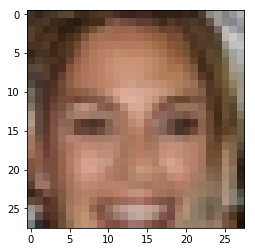

Epoch: 32/50... d_loss: 1.0008... g_loss: 1.2909...


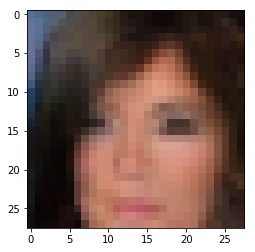

Epoch: 32/50... d_loss: 1.0390... g_loss: 1.2836...


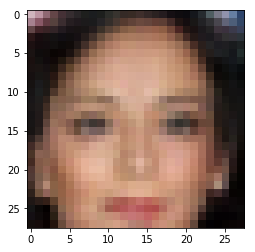

Epoch: 32/50... d_loss: 1.1328... g_loss: 0.9324...


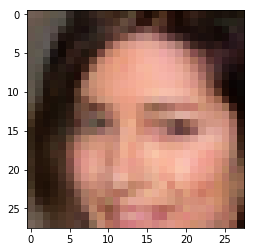

Epoch: 32/50... d_loss: 0.9791... g_loss: 1.3570...


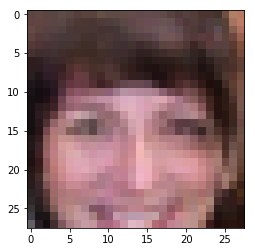

Epoch: 32/50... d_loss: 1.1601... g_loss: 0.8489...


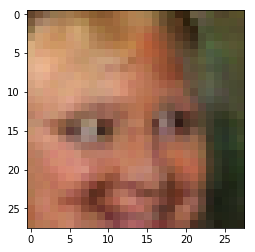

Epoch: 32/50... d_loss: 1.2040... g_loss: 0.8210...


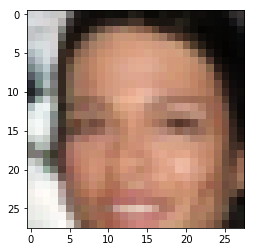

Epoch: 32/50... d_loss: 0.9834... g_loss: 1.2782...


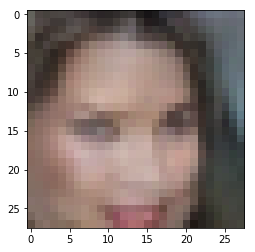

Epoch: 33/50... d_loss: 1.1341... g_loss: 1.7487...


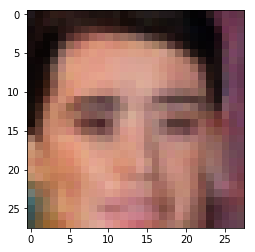

Epoch: 33/50... d_loss: 1.2546... g_loss: 2.4269...


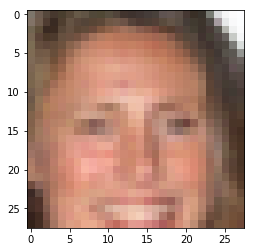

Epoch: 33/50... d_loss: 0.9103... g_loss: 1.5355...


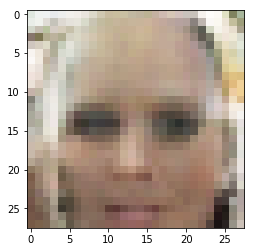

Epoch: 33/50... d_loss: 1.5189... g_loss: 0.5296...


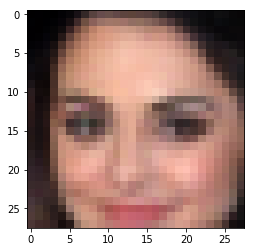

Epoch: 33/50... d_loss: 0.8036... g_loss: 1.7008...


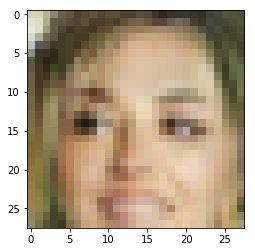

Epoch: 33/50... d_loss: 1.0335... g_loss: 0.9554...


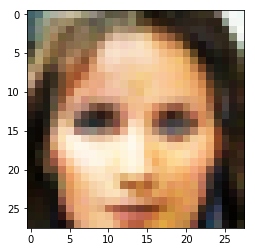

Epoch: 33/50... d_loss: 0.8617... g_loss: 1.2909...


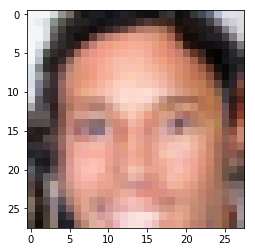

Epoch: 33/50... d_loss: 1.1017... g_loss: 1.8336...


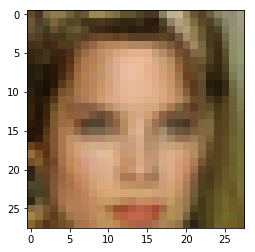

Epoch: 33/50... d_loss: 1.2559... g_loss: 0.7177...


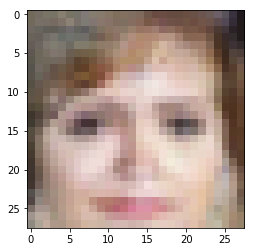

Epoch: 33/50... d_loss: 0.9880... g_loss: 1.2981...


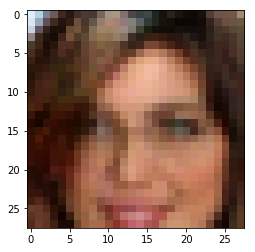

Epoch: 33/50... d_loss: 0.9169... g_loss: 1.2077...


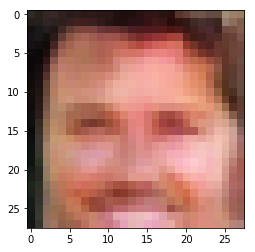

Epoch: 33/50... d_loss: 1.0249... g_loss: 0.9992...


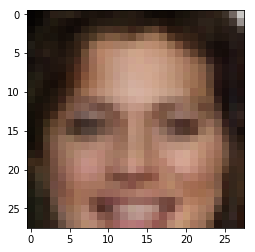

Epoch: 33/50... d_loss: 0.8216... g_loss: 1.5296...


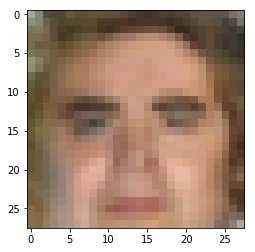

Epoch: 33/50... d_loss: 1.2356... g_loss: 0.7373...


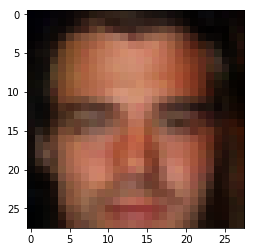

Epoch: 33/50... d_loss: 0.9648... g_loss: 1.0926...


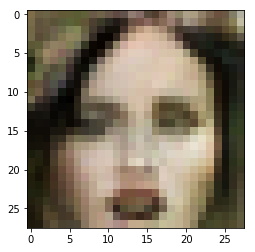

Epoch: 33/50... d_loss: 1.2570... g_loss: 0.8179...


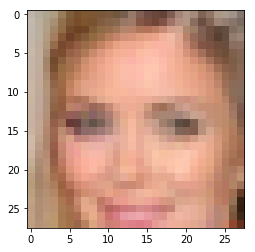

Epoch: 33/50... d_loss: 1.0529... g_loss: 1.0397...


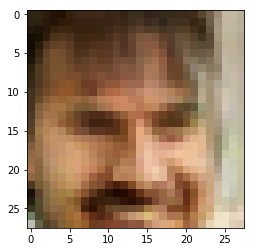

Epoch: 33/50... d_loss: 1.1993... g_loss: 1.8453...


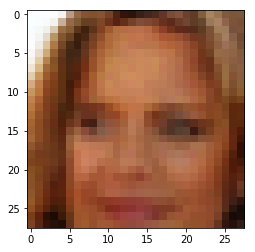

Epoch: 33/50... d_loss: 0.8219... g_loss: 1.4773...


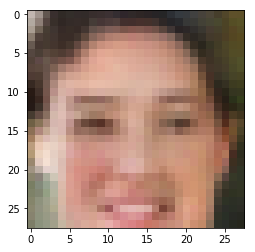

Epoch: 33/50... d_loss: 1.1185... g_loss: 0.8961...


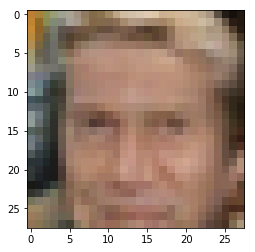

Epoch: 33/50... d_loss: 0.9634... g_loss: 1.1522...


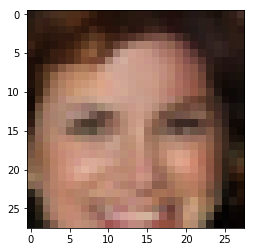

Epoch: 33/50... d_loss: 0.8864... g_loss: 1.3164...


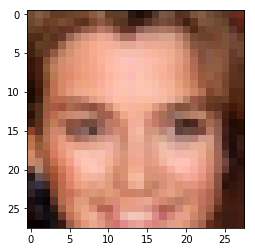

Epoch: 33/50... d_loss: 1.0836... g_loss: 0.9686...


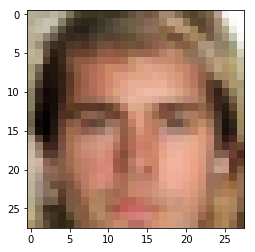

Epoch: 33/50... d_loss: 1.0818... g_loss: 1.1418...


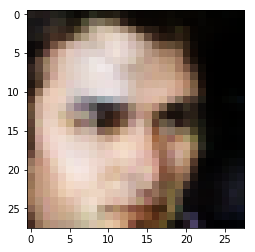

Epoch: 33/50... d_loss: 0.9064... g_loss: 1.7632...


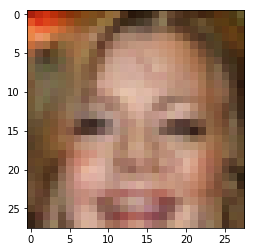

Epoch: 33/50... d_loss: 1.1155... g_loss: 0.9366...


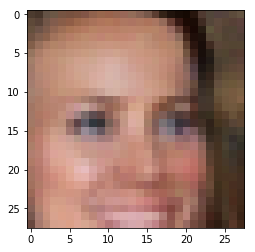

Epoch: 33/50... d_loss: 1.3502... g_loss: 0.7140...


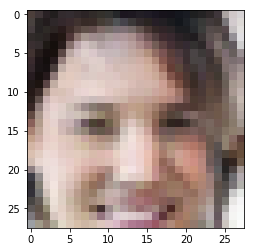

Epoch: 33/50... d_loss: 1.0959... g_loss: 0.9359...


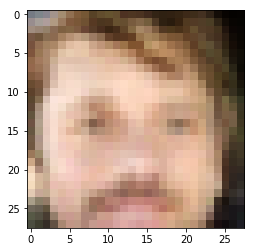

Epoch: 33/50... d_loss: 0.8939... g_loss: 1.3850...


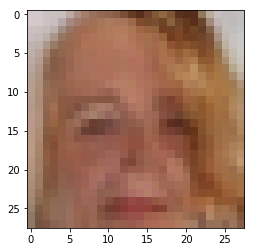

Epoch: 33/50... d_loss: 1.1572... g_loss: 1.0388...


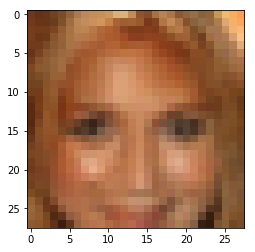

Epoch: 33/50... d_loss: 1.2089... g_loss: 0.8805...


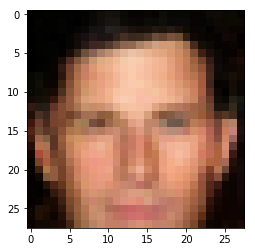

Epoch: 33/50... d_loss: 1.0891... g_loss: 1.2247...


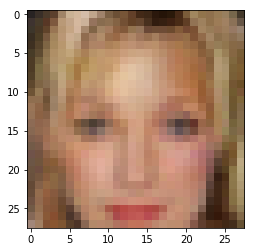

Epoch: 34/50... d_loss: 1.1333... g_loss: 1.0061...


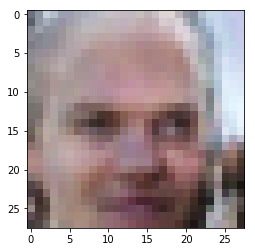

Epoch: 34/50... d_loss: 1.0758... g_loss: 1.2948...


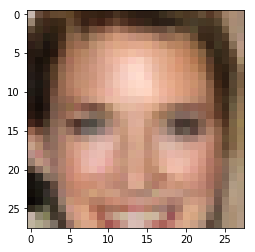

Epoch: 34/50... d_loss: 1.0748... g_loss: 0.9913...


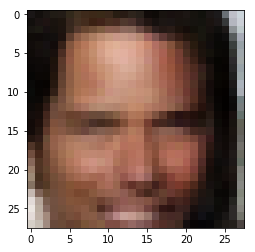

Epoch: 34/50... d_loss: 1.1968... g_loss: 0.7994...


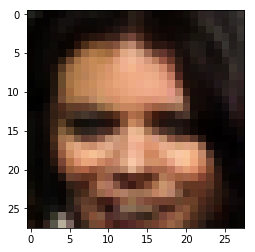

Epoch: 34/50... d_loss: 1.0665... g_loss: 0.9620...


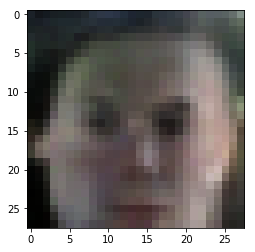

Epoch: 34/50... d_loss: 1.0440... g_loss: 1.2209...


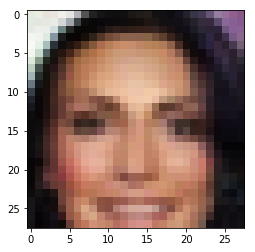

Epoch: 34/50... d_loss: 0.9188... g_loss: 1.3638...


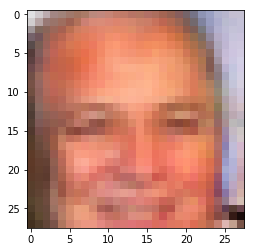

Epoch: 34/50... d_loss: 1.2091... g_loss: 0.8227...


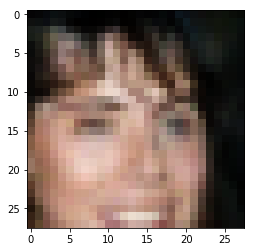

Epoch: 34/50... d_loss: 1.4527... g_loss: 0.5411...


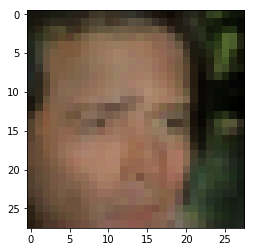

Epoch: 34/50... d_loss: 0.9925... g_loss: 1.2846...


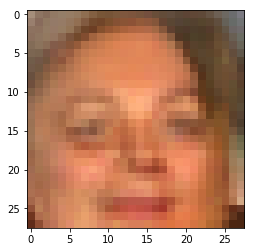

Epoch: 34/50... d_loss: 0.9766... g_loss: 1.0317...


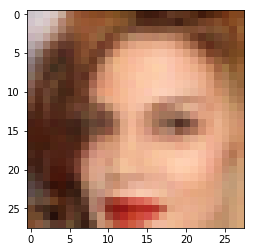

Epoch: 34/50... d_loss: 1.0264... g_loss: 0.9989...


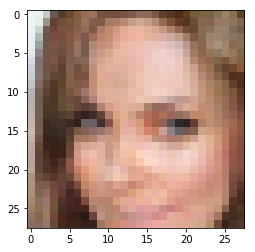

Epoch: 34/50... d_loss: 1.1769... g_loss: 0.9476...


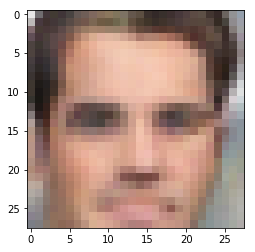

Epoch: 34/50... d_loss: 1.2082... g_loss: 0.7827...


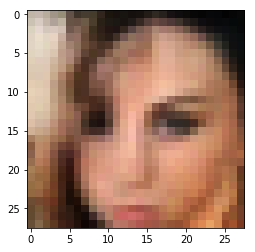

Epoch: 34/50... d_loss: 0.9291... g_loss: 1.2069...


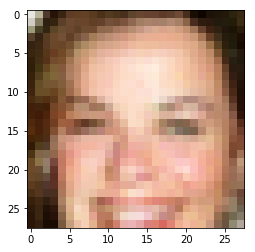

Epoch: 34/50... d_loss: 1.1886... g_loss: 0.7652...


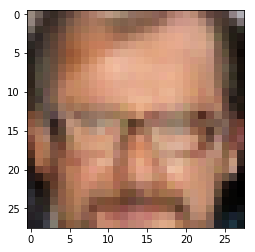

Epoch: 34/50... d_loss: 0.8619... g_loss: 1.6036...


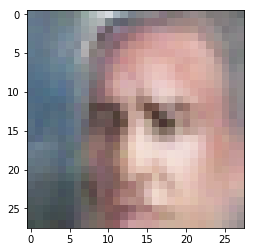

Epoch: 34/50... d_loss: 1.2989... g_loss: 0.7123...


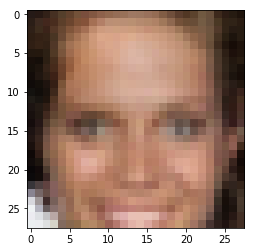

Epoch: 34/50... d_loss: 1.0056... g_loss: 1.0636...


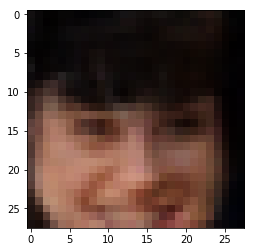

Epoch: 34/50... d_loss: 0.9973... g_loss: 1.1627...


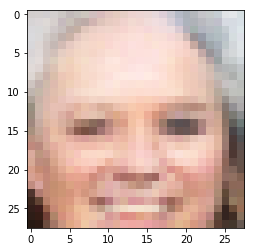

Epoch: 34/50... d_loss: 1.0750... g_loss: 1.0344...


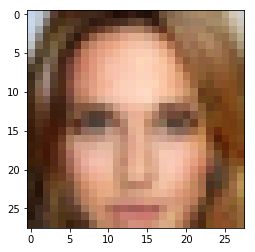

Epoch: 34/50... d_loss: 0.8370... g_loss: 1.5679...


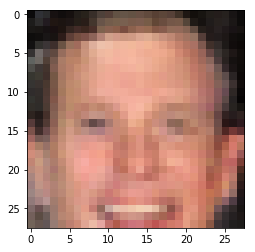

Epoch: 34/50... d_loss: 1.0256... g_loss: 1.1492...


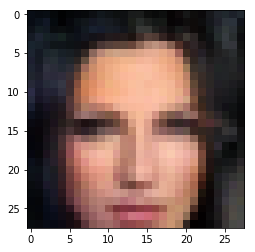

Epoch: 34/50... d_loss: 0.9701... g_loss: 1.9704...


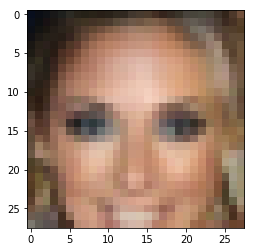

Epoch: 34/50... d_loss: 1.3848... g_loss: 0.6984...


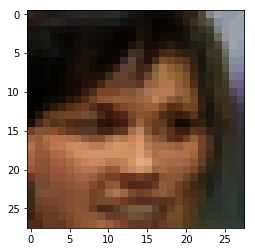

Epoch: 34/50... d_loss: 0.9933... g_loss: 1.3282...


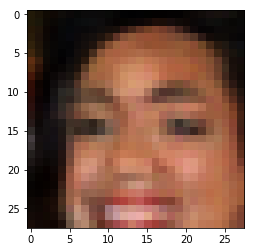

Epoch: 34/50... d_loss: 1.2541... g_loss: 0.7352...


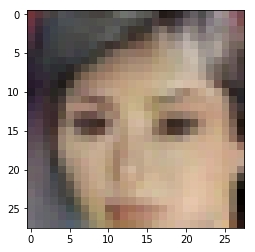

Epoch: 34/50... d_loss: 1.1063... g_loss: 0.9820...


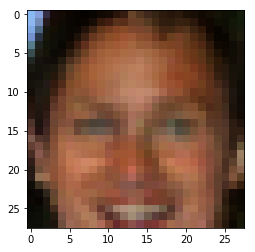

Epoch: 34/50... d_loss: 1.1407... g_loss: 0.9499...


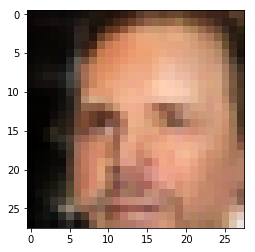

Epoch: 34/50... d_loss: 1.0049... g_loss: 1.1461...


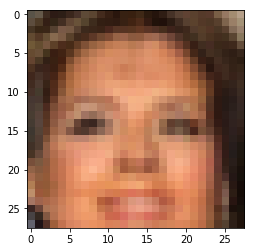

Epoch: 34/50... d_loss: 1.1004... g_loss: 1.3112...


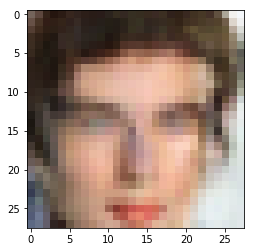

Epoch: 34/50... d_loss: 1.0104... g_loss: 1.5097...


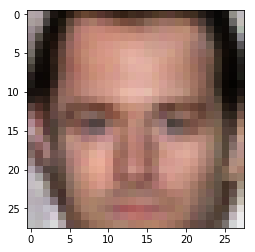

Epoch: 35/50... d_loss: 1.3969... g_loss: 0.6808...


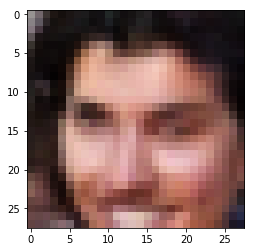

Epoch: 35/50... d_loss: 1.3220... g_loss: 0.6934...


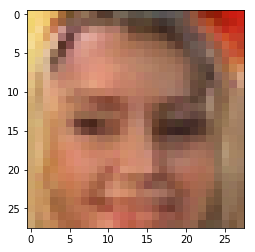

Epoch: 35/50... d_loss: 1.0131... g_loss: 1.0662...


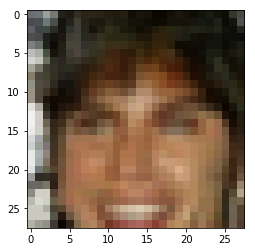

Epoch: 35/50... d_loss: 1.5991... g_loss: 0.4862...


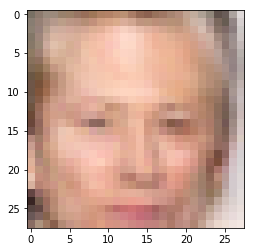

Epoch: 35/50... d_loss: 0.9980... g_loss: 1.0741...


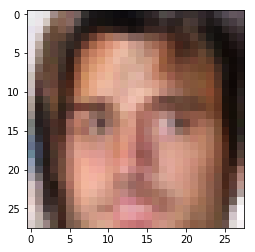

Epoch: 35/50... d_loss: 1.1910... g_loss: 0.7568...


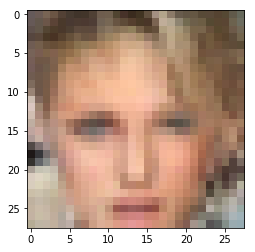

Epoch: 35/50... d_loss: 0.9523... g_loss: 1.2997...


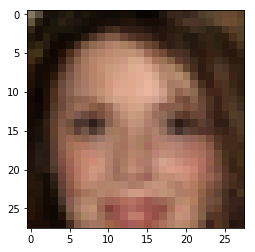

Epoch: 35/50... d_loss: 1.2477... g_loss: 0.7245...


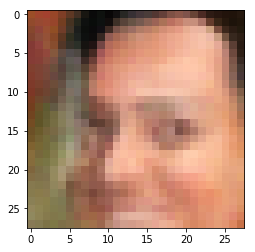

Epoch: 35/50... d_loss: 1.2213... g_loss: 0.7827...


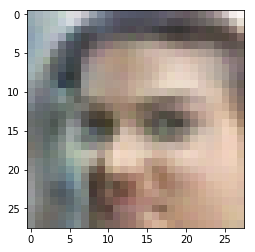

Epoch: 35/50... d_loss: 1.1343... g_loss: 0.9410...


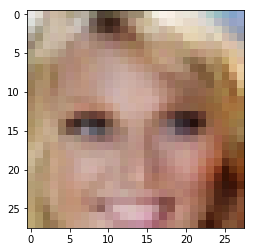

Epoch: 35/50... d_loss: 0.9754... g_loss: 1.4117...


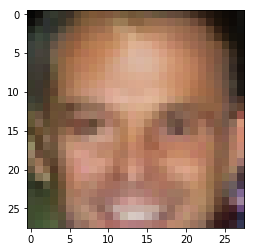

Epoch: 35/50... d_loss: 0.8404... g_loss: 1.5093...


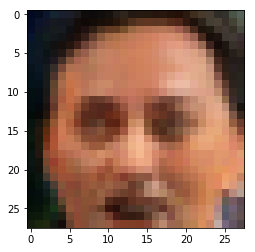

Epoch: 35/50... d_loss: 0.9609... g_loss: 1.5794...


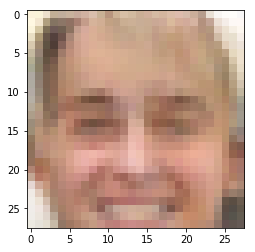

Epoch: 35/50... d_loss: 0.9897... g_loss: 1.5906...


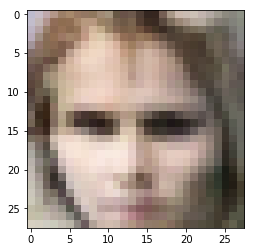

Epoch: 35/50... d_loss: 1.1750... g_loss: 0.8034...


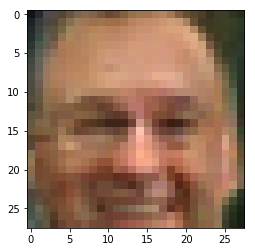

Epoch: 35/50... d_loss: 1.0289... g_loss: 1.0179...


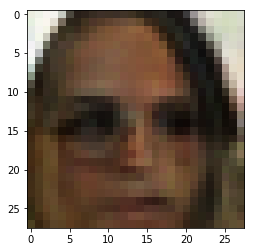

Epoch: 35/50... d_loss: 0.9383... g_loss: 1.3468...


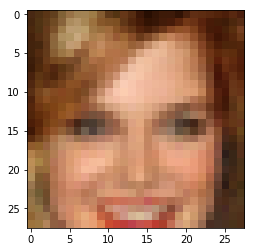

Epoch: 35/50... d_loss: 1.4256... g_loss: 0.5356...


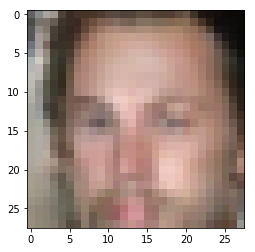

Epoch: 35/50... d_loss: 0.9826... g_loss: 1.2298...


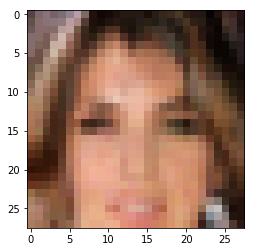

Epoch: 35/50... d_loss: 1.0528... g_loss: 1.3555...


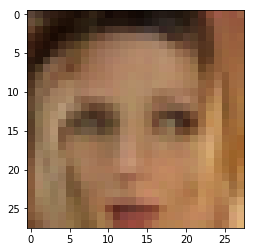

Epoch: 35/50... d_loss: 1.1657... g_loss: 1.6919...


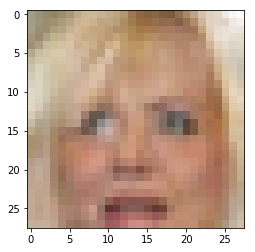

Epoch: 35/50... d_loss: 0.8836... g_loss: 1.4464...


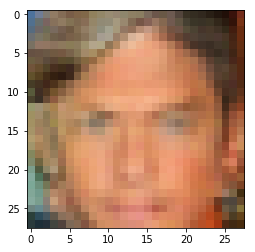

Epoch: 35/50... d_loss: 1.3513... g_loss: 2.0239...


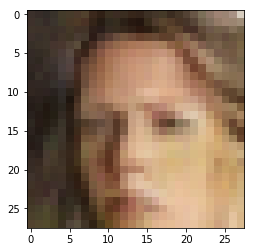

Epoch: 35/50... d_loss: 1.1407... g_loss: 0.8975...


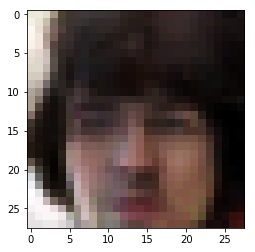

Epoch: 35/50... d_loss: 1.0541... g_loss: 1.1048...


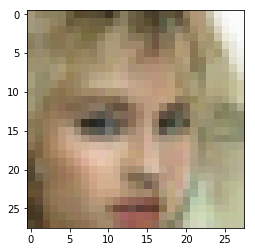

Epoch: 35/50... d_loss: 0.9991... g_loss: 1.8203...


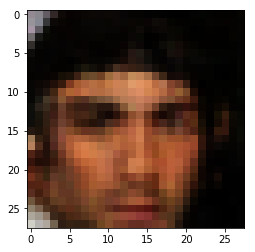

Epoch: 35/50... d_loss: 1.4084... g_loss: 0.6334...


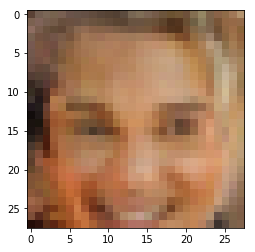

Epoch: 35/50... d_loss: 1.0375... g_loss: 1.0096...


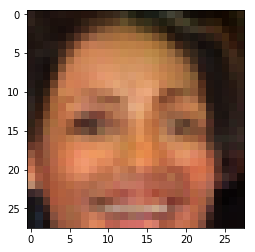

Epoch: 35/50... d_loss: 0.9466... g_loss: 1.3792...


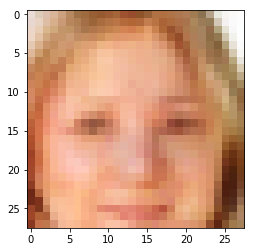

Epoch: 35/50... d_loss: 1.2005... g_loss: 0.7508...


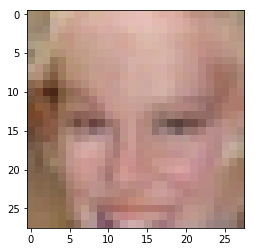

Epoch: 35/50... d_loss: 1.4818... g_loss: 0.5850...


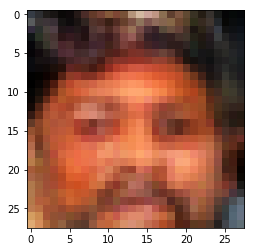

Epoch: 35/50... d_loss: 1.1095... g_loss: 0.9915...


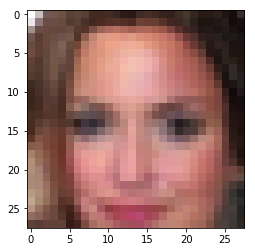

Epoch: 36/50... d_loss: 1.2229... g_loss: 0.9006...


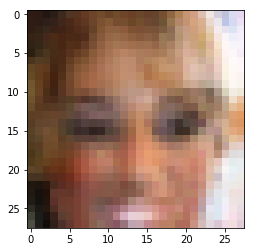

Epoch: 36/50... d_loss: 1.0790... g_loss: 1.1156...


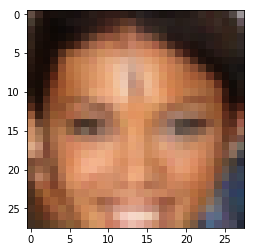

Epoch: 36/50... d_loss: 1.1122... g_loss: 0.9441...


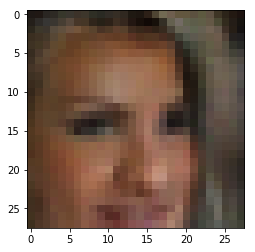

Epoch: 36/50... d_loss: 1.2692... g_loss: 0.6902...


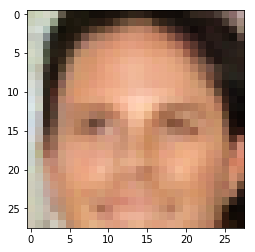

Epoch: 36/50... d_loss: 1.0746... g_loss: 0.9902...


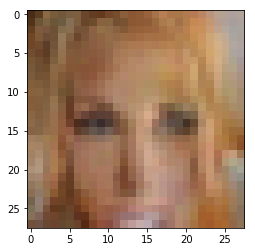

Epoch: 36/50... d_loss: 1.1253... g_loss: 0.9023...


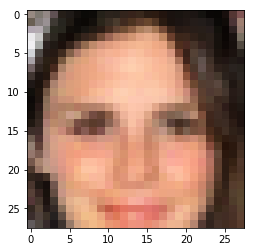

Epoch: 36/50... d_loss: 1.0564... g_loss: 1.0070...


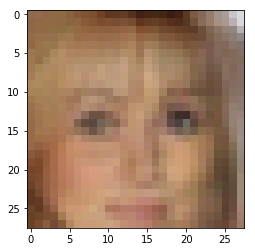

Epoch: 36/50... d_loss: 0.9923... g_loss: 1.5135...


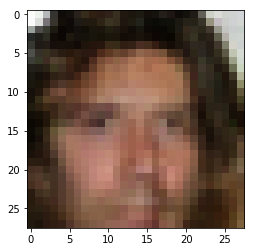

Epoch: 36/50... d_loss: 1.0582... g_loss: 1.0472...


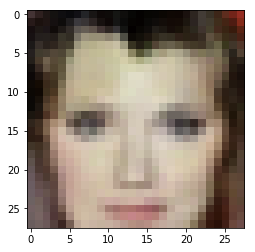

Epoch: 36/50... d_loss: 0.9412... g_loss: 1.4667...


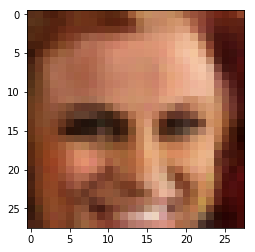

Epoch: 36/50... d_loss: 0.8877... g_loss: 1.7471...


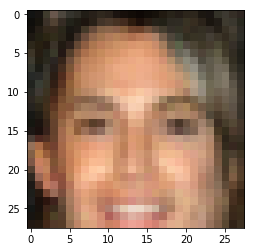

Epoch: 36/50... d_loss: 0.8883... g_loss: 1.2958...


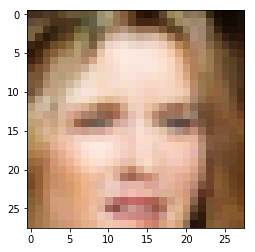

Epoch: 36/50... d_loss: 0.9764... g_loss: 1.3069...


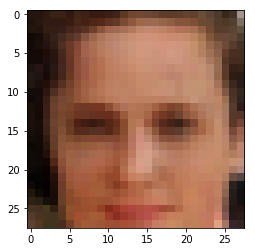

Epoch: 36/50... d_loss: 1.1003... g_loss: 0.9636...


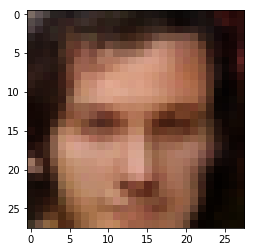

Epoch: 36/50... d_loss: 0.9341... g_loss: 1.4117...


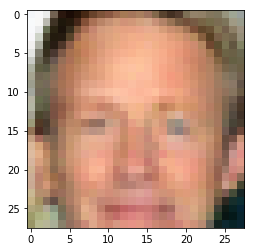

Epoch: 36/50... d_loss: 1.0402... g_loss: 1.2312...


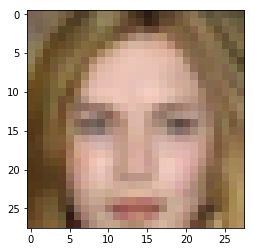

Epoch: 36/50... d_loss: 1.0205... g_loss: 0.9669...


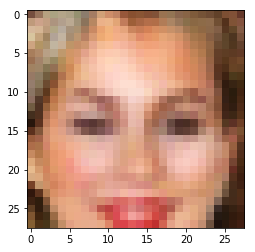

Epoch: 36/50... d_loss: 0.9891... g_loss: 1.3638...


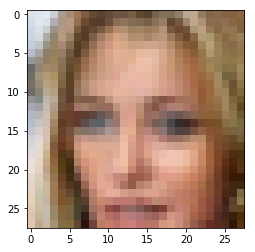

Epoch: 36/50... d_loss: 0.9943... g_loss: 1.0093...


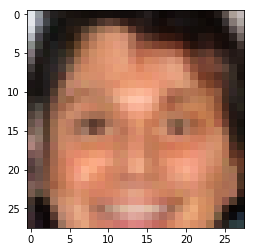

Epoch: 36/50... d_loss: 0.9319... g_loss: 1.3392...


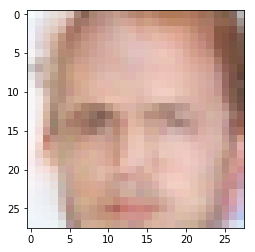

Epoch: 36/50... d_loss: 1.4449... g_loss: 0.6086...


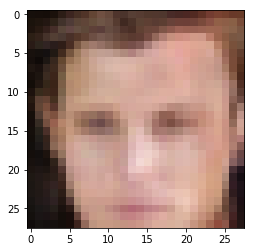

Epoch: 36/50... d_loss: 0.7595... g_loss: 1.7501...


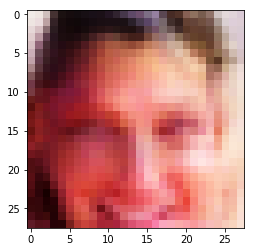

Epoch: 36/50... d_loss: 1.0474... g_loss: 0.9741...


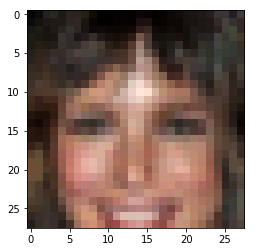

Epoch: 36/50... d_loss: 0.7812... g_loss: 1.6901...


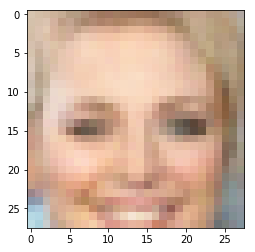

Epoch: 36/50... d_loss: 0.8747... g_loss: 1.2893...


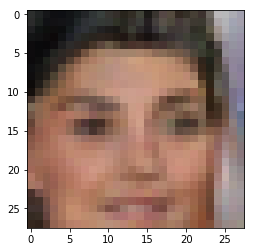

Epoch: 36/50... d_loss: 1.0732... g_loss: 1.0193...


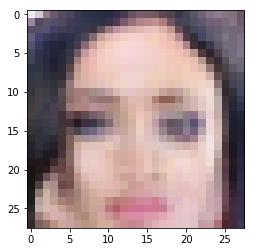

Epoch: 36/50... d_loss: 1.3014... g_loss: 0.7365...


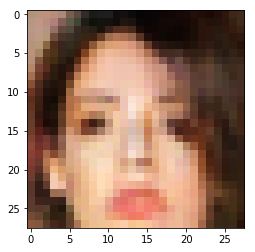

Epoch: 36/50... d_loss: 0.9403... g_loss: 1.3218...


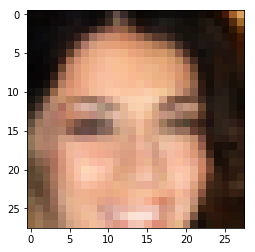

Epoch: 36/50... d_loss: 0.9596... g_loss: 1.4773...


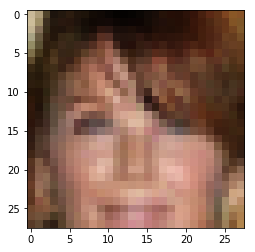

Epoch: 36/50... d_loss: 1.0371... g_loss: 1.2869...


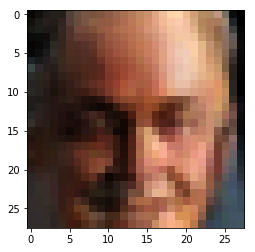

Epoch: 36/50... d_loss: 1.4324... g_loss: 0.6139...


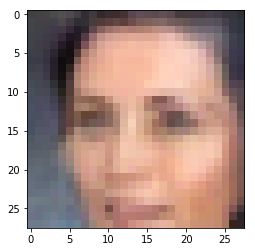

Epoch: 36/50... d_loss: 0.9240... g_loss: 1.6569...


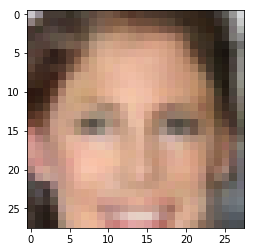

Epoch: 37/50... d_loss: 1.1383... g_loss: 0.9049...


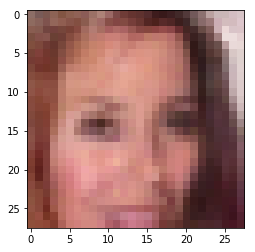

Epoch: 37/50... d_loss: 1.3114... g_loss: 0.6725...


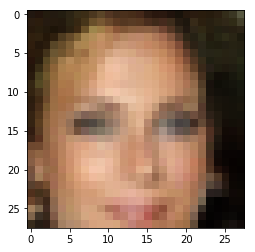

Epoch: 37/50... d_loss: 1.0397... g_loss: 1.2351...


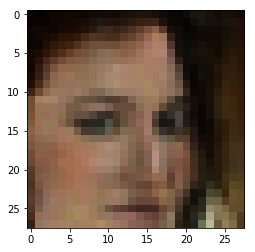

Epoch: 37/50... d_loss: 1.0400... g_loss: 1.1176...


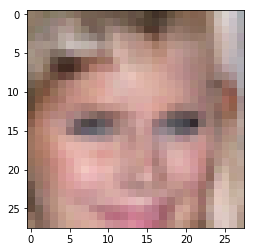

Epoch: 37/50... d_loss: 1.2139... g_loss: 1.9709...


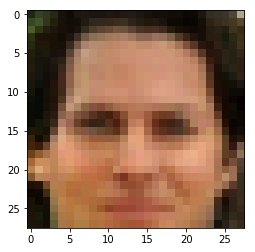

Epoch: 37/50... d_loss: 0.9581... g_loss: 1.2619...


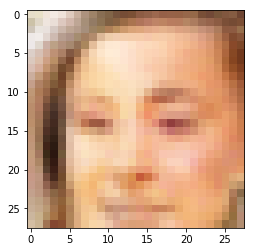

Epoch: 37/50... d_loss: 0.8932... g_loss: 1.2655...


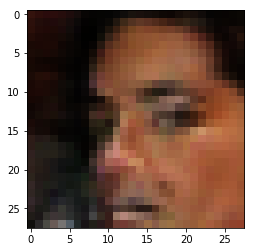

Epoch: 37/50... d_loss: 1.0506... g_loss: 1.2054...


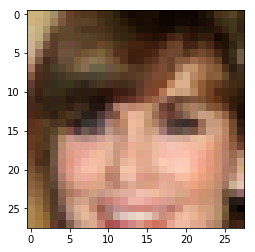

Epoch: 37/50... d_loss: 1.0240... g_loss: 1.1118...


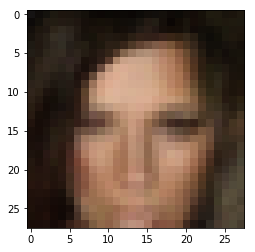

Epoch: 37/50... d_loss: 0.9890... g_loss: 1.2776...


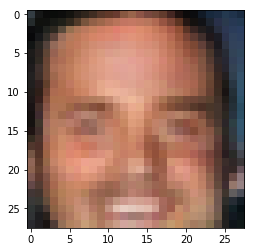

Epoch: 37/50... d_loss: 0.8684... g_loss: 1.8459...


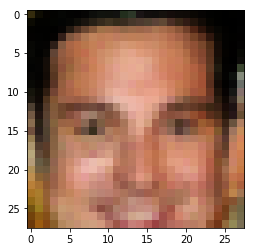

Epoch: 37/50... d_loss: 0.9176... g_loss: 1.3936...


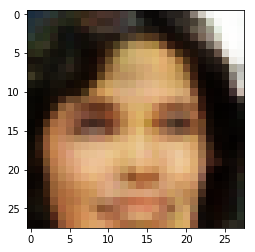

Epoch: 37/50... d_loss: 0.8568... g_loss: 1.8988...


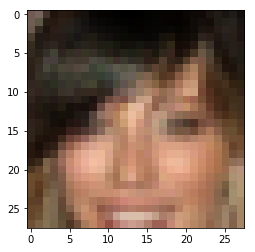

Epoch: 37/50... d_loss: 1.2215... g_loss: 0.7538...


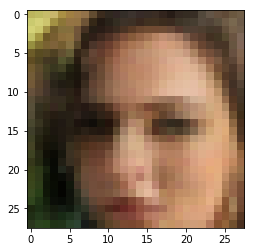

Epoch: 37/50... d_loss: 0.8511... g_loss: 1.3073...


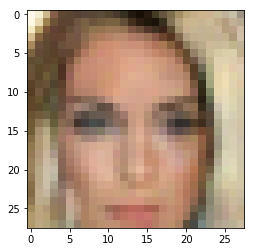

Epoch: 37/50... d_loss: 1.1173... g_loss: 0.8847...


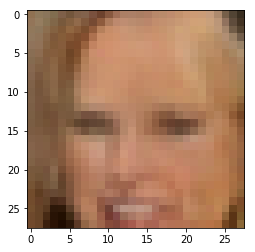

Epoch: 37/50... d_loss: 0.8476... g_loss: 1.6787...


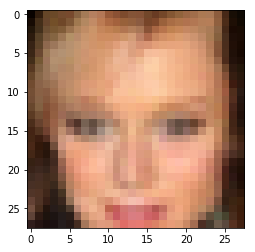

Epoch: 37/50... d_loss: 1.0484... g_loss: 1.1298...


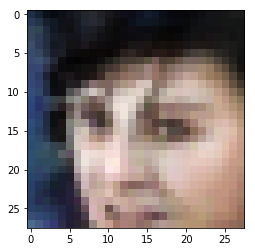

Epoch: 37/50... d_loss: 0.8326... g_loss: 1.5902...


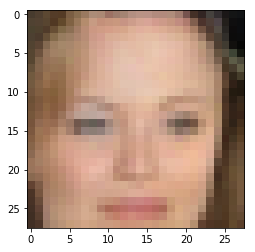

Epoch: 37/50... d_loss: 1.0664... g_loss: 0.8781...


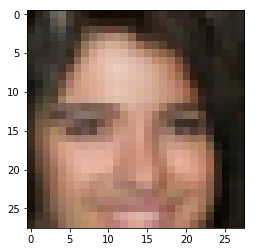

Epoch: 37/50... d_loss: 1.3620... g_loss: 0.5973...


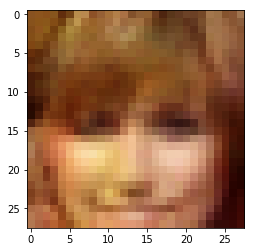

Epoch: 37/50... d_loss: 1.1449... g_loss: 0.8235...


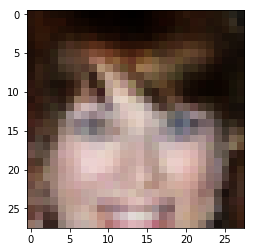

Epoch: 37/50... d_loss: 1.0015... g_loss: 1.0993...


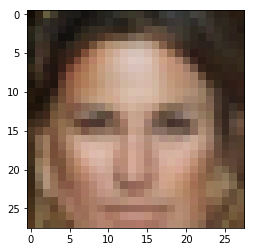

Epoch: 37/50... d_loss: 0.8958... g_loss: 1.5624...


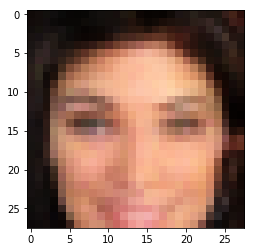

Epoch: 37/50... d_loss: 1.0471... g_loss: 1.1181...


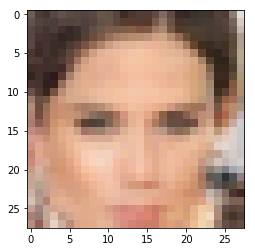

Epoch: 37/50... d_loss: 0.9969... g_loss: 1.3182...


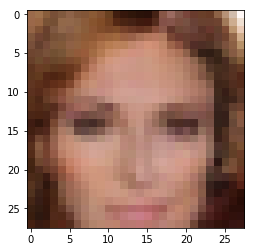

Epoch: 37/50... d_loss: 1.0519... g_loss: 1.0534...


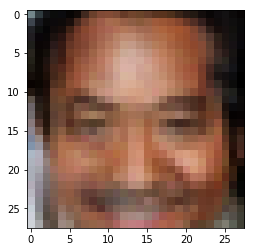

Epoch: 37/50... d_loss: 0.9988... g_loss: 1.1053...


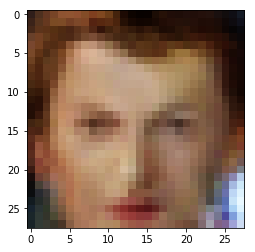

Epoch: 37/50... d_loss: 0.9970... g_loss: 1.0210...


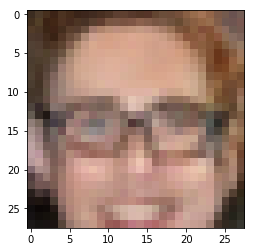

Epoch: 37/50... d_loss: 0.9772... g_loss: 1.4198...


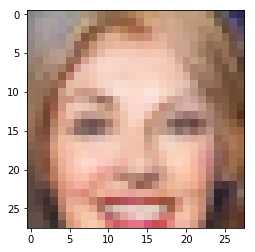

Epoch: 37/50... d_loss: 0.9069... g_loss: 1.3621...


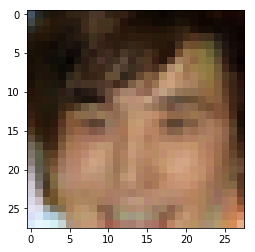

Epoch: 37/50... d_loss: 1.1180... g_loss: 0.9732...


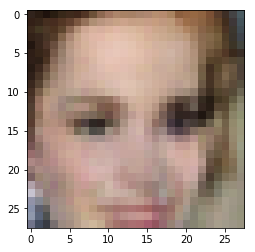

Epoch: 38/50... d_loss: 1.1515... g_loss: 0.9168...


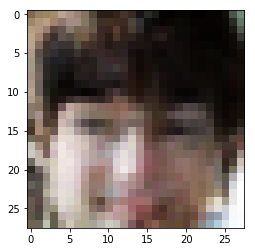

Epoch: 38/50... d_loss: 1.0829... g_loss: 1.2997...


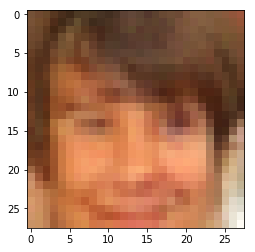

Epoch: 38/50... d_loss: 0.9504... g_loss: 1.4543...


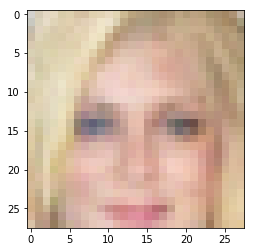

Epoch: 38/50... d_loss: 0.9675... g_loss: 1.2050...


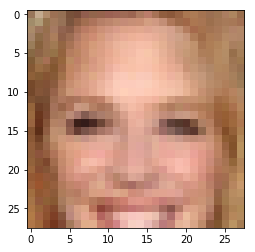

Epoch: 38/50... d_loss: 0.9672... g_loss: 1.4133...


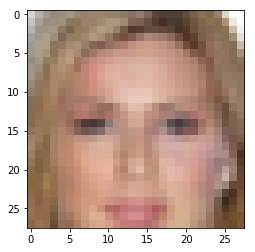

Epoch: 38/50... d_loss: 0.9588... g_loss: 1.6090...


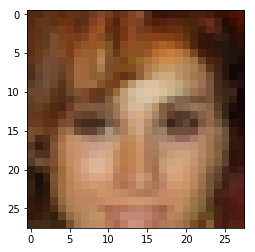

Epoch: 38/50... d_loss: 0.8841... g_loss: 1.7391...


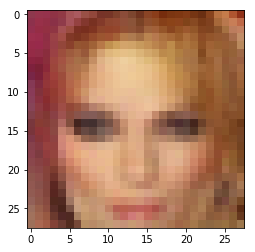

Epoch: 38/50... d_loss: 1.0512... g_loss: 1.1489...


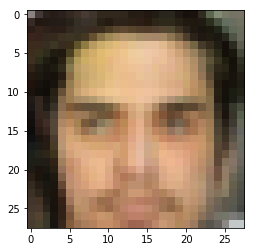

Epoch: 38/50... d_loss: 0.9571... g_loss: 1.3475...


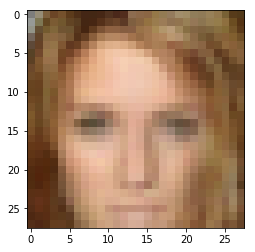

Epoch: 38/50... d_loss: 1.0016... g_loss: 1.1388...


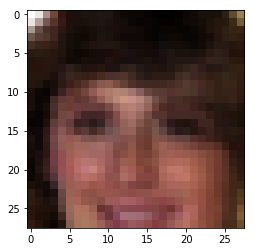

Epoch: 38/50... d_loss: 0.8957... g_loss: 1.4541...


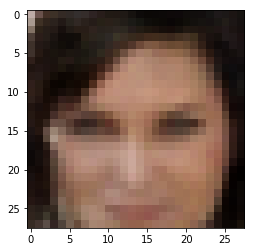

Epoch: 38/50... d_loss: 1.2870... g_loss: 0.6768...


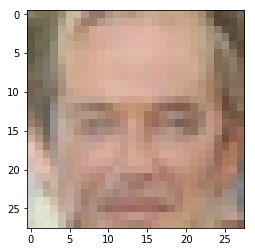

Epoch: 38/50... d_loss: 1.0708... g_loss: 0.9485...


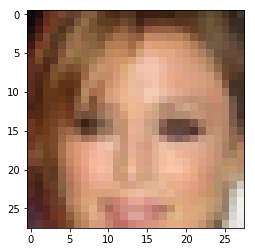

Epoch: 38/50... d_loss: 1.0858... g_loss: 1.0126...


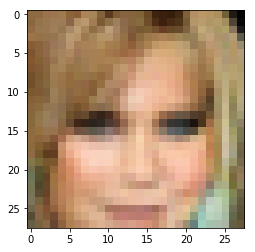

Epoch: 38/50... d_loss: 1.0703... g_loss: 1.3268...


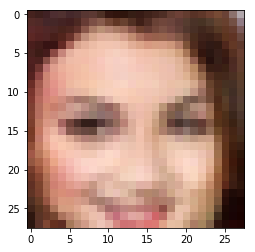

Epoch: 38/50... d_loss: 0.9625... g_loss: 1.1812...


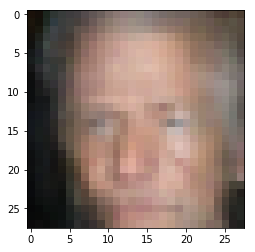

Epoch: 38/50... d_loss: 0.9210... g_loss: 1.3326...


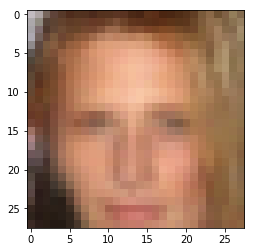

Epoch: 38/50... d_loss: 0.9122... g_loss: 1.3415...


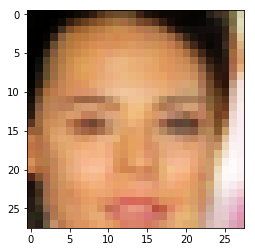

Epoch: 38/50... d_loss: 1.1020... g_loss: 0.9208...


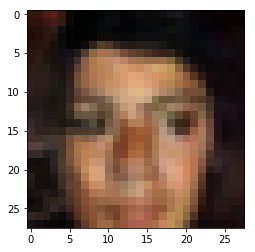

Epoch: 38/50... d_loss: 1.0089... g_loss: 1.3264...


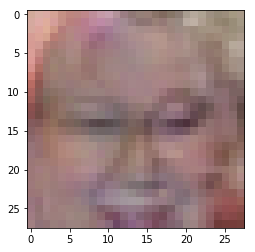

Epoch: 38/50... d_loss: 0.9754... g_loss: 1.0892...


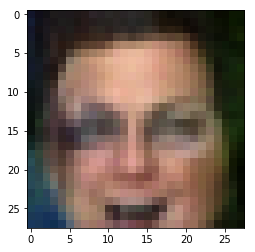

Epoch: 38/50... d_loss: 0.9519... g_loss: 1.1109...


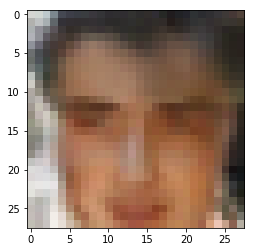

Epoch: 38/50... d_loss: 0.9184... g_loss: 1.2774...


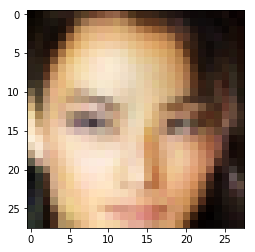

Epoch: 38/50... d_loss: 0.7537... g_loss: 1.8118...


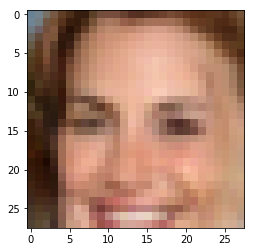

Epoch: 38/50... d_loss: 0.9877... g_loss: 1.0610...


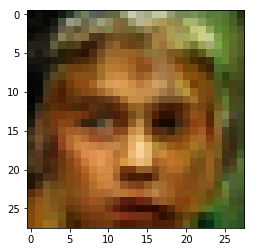

Epoch: 38/50... d_loss: 0.8908... g_loss: 1.6026...


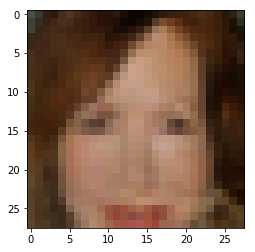

Epoch: 38/50... d_loss: 1.1391... g_loss: 0.9209...


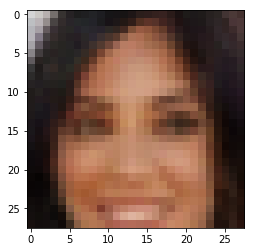

Epoch: 38/50... d_loss: 1.0148... g_loss: 1.1858...


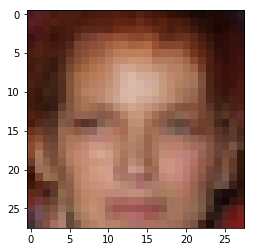

Epoch: 38/50... d_loss: 1.0942... g_loss: 0.8901...


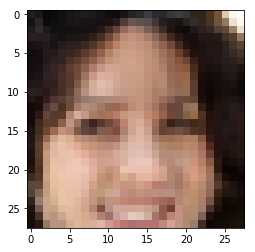

Epoch: 38/50... d_loss: 1.2471... g_loss: 0.7871...


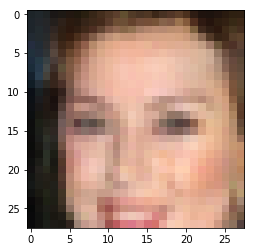

Epoch: 38/50... d_loss: 1.1321... g_loss: 0.9772...


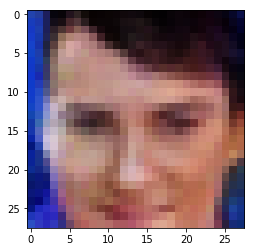

Epoch: 38/50... d_loss: 1.1936... g_loss: 0.8316...


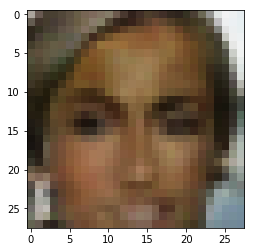

Epoch: 39/50... d_loss: 1.4965... g_loss: 0.5492...


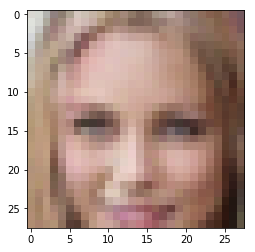

Epoch: 39/50... d_loss: 1.1419... g_loss: 0.8516...


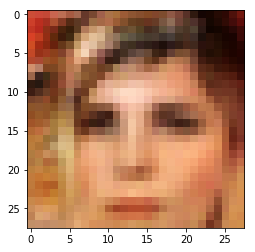

Epoch: 39/50... d_loss: 1.2160... g_loss: 0.8072...


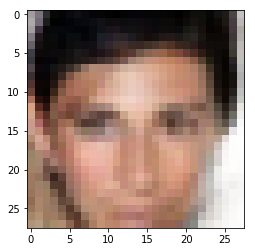

Epoch: 39/50... d_loss: 1.2452... g_loss: 0.8147...


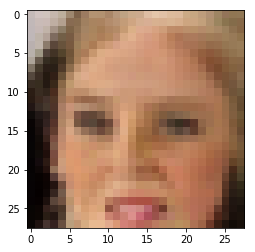

Epoch: 39/50... d_loss: 0.9766... g_loss: 1.1659...


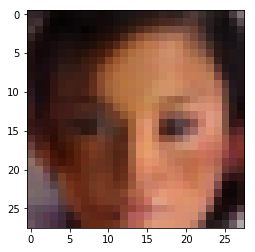

Epoch: 39/50... d_loss: 1.3448... g_loss: 0.6256...


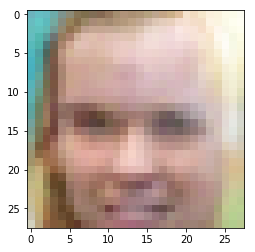

Epoch: 39/50... d_loss: 0.8461... g_loss: 1.4886...


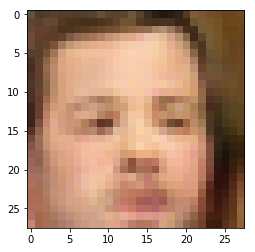

Epoch: 39/50... d_loss: 1.0837... g_loss: 1.0330...


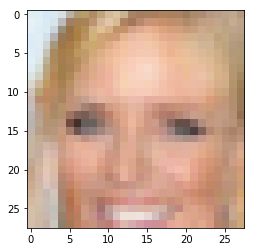

Epoch: 39/50... d_loss: 1.0907... g_loss: 1.0463...


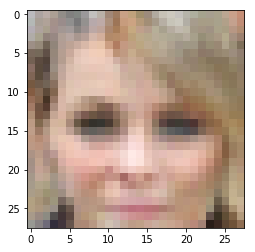

Epoch: 39/50... d_loss: 0.9818... g_loss: 1.0726...


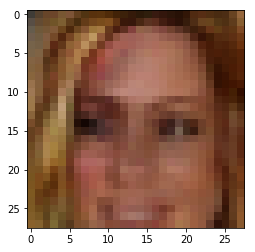

Epoch: 39/50... d_loss: 0.8858... g_loss: 1.2823...


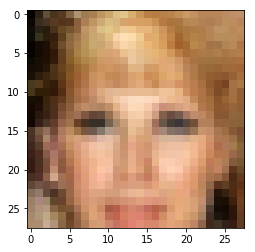

Epoch: 39/50... d_loss: 0.9051... g_loss: 1.2159...


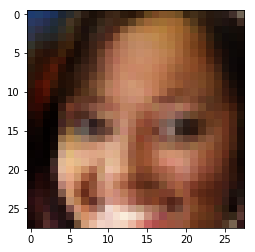

Epoch: 39/50... d_loss: 1.1728... g_loss: 2.1213...


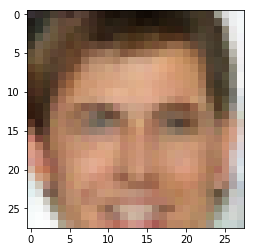

Epoch: 39/50... d_loss: 1.0428... g_loss: 1.1176...


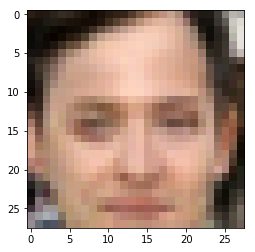

Epoch: 39/50... d_loss: 0.9509... g_loss: 1.2963...


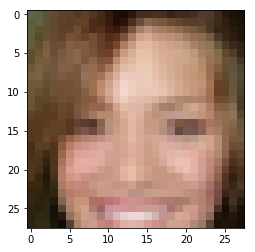

Epoch: 39/50... d_loss: 0.9799... g_loss: 1.3681...


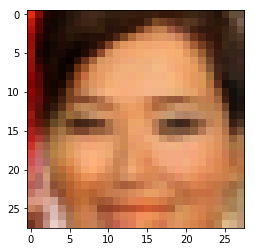

Epoch: 39/50... d_loss: 0.8773... g_loss: 1.3268...


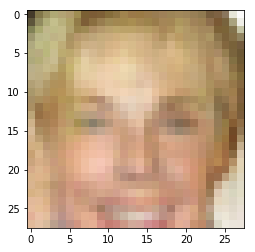

Epoch: 39/50... d_loss: 1.1779... g_loss: 0.8303...


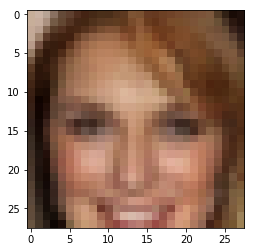

Epoch: 39/50... d_loss: 1.0829... g_loss: 0.9104...


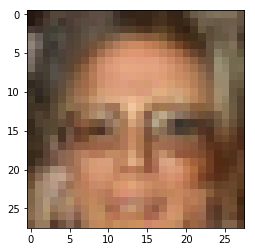

Epoch: 39/50... d_loss: 1.0887... g_loss: 1.0227...


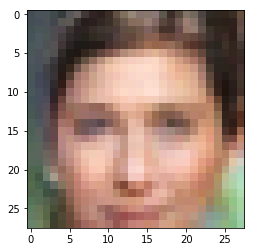

Epoch: 39/50... d_loss: 1.0689... g_loss: 0.9923...


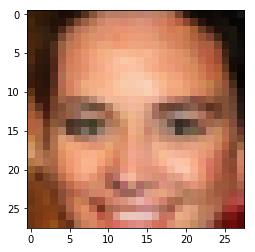

Epoch: 39/50... d_loss: 0.8275... g_loss: 1.7377...


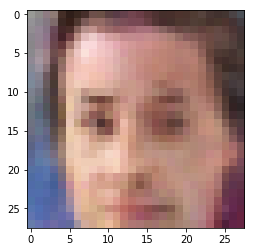

Epoch: 39/50... d_loss: 1.1053... g_loss: 1.8873...


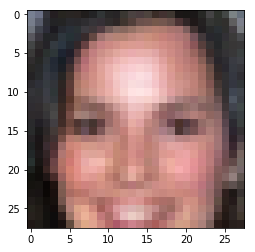

Epoch: 39/50... d_loss: 0.9409... g_loss: 1.7586...


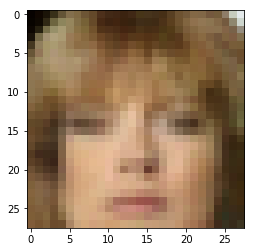

Epoch: 39/50... d_loss: 1.4796... g_loss: 0.6135...


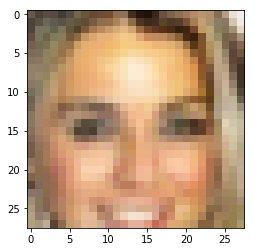

Epoch: 39/50... d_loss: 0.9022... g_loss: 1.5076...


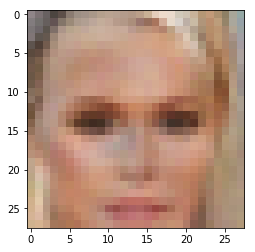

Epoch: 39/50... d_loss: 1.3180... g_loss: 0.7021...


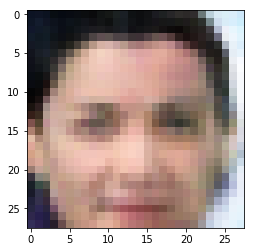

Epoch: 39/50... d_loss: 0.9775... g_loss: 1.1954...


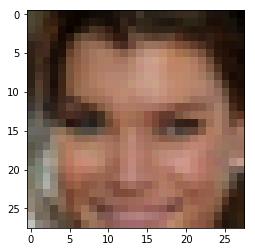

Epoch: 39/50... d_loss: 0.9831... g_loss: 1.2616...


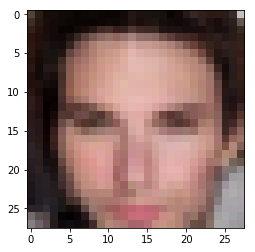

Epoch: 39/50... d_loss: 1.0910... g_loss: 0.9458...


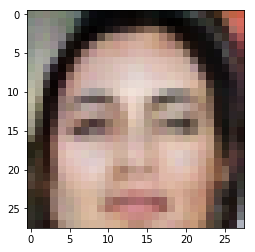

Epoch: 39/50... d_loss: 1.2057... g_loss: 0.9820...


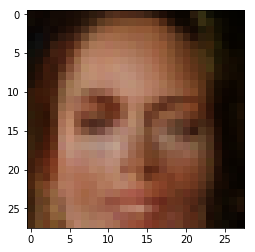

Epoch: 39/50... d_loss: 1.0163... g_loss: 1.1760...


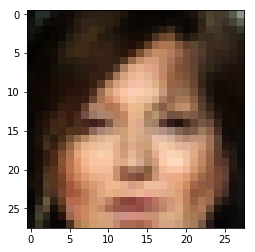

Epoch: 40/50... d_loss: 1.2270... g_loss: 0.8576...


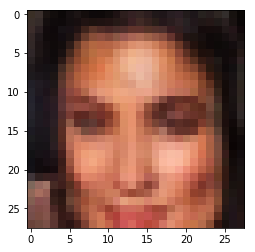

Epoch: 40/50... d_loss: 1.0402... g_loss: 2.0368...


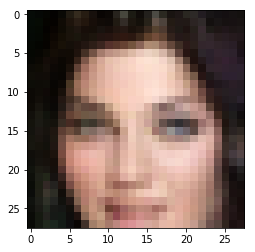

Epoch: 40/50... d_loss: 0.9869... g_loss: 1.2886...


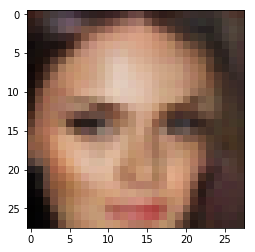

Epoch: 40/50... d_loss: 1.3239... g_loss: 0.6474...


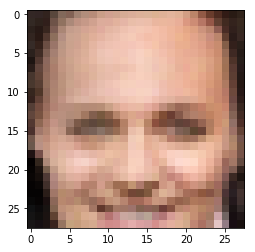

Epoch: 40/50... d_loss: 0.9745... g_loss: 1.5154...


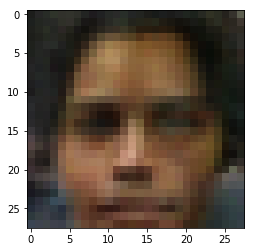

Epoch: 40/50... d_loss: 0.9715... g_loss: 1.0817...


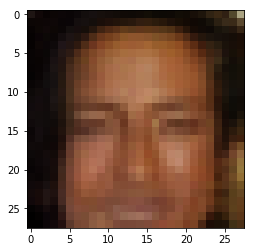

Epoch: 40/50... d_loss: 0.9113... g_loss: 1.5216...


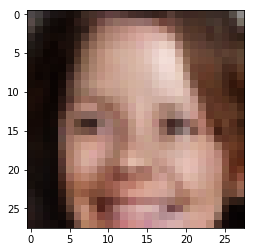

Epoch: 40/50... d_loss: 0.9960... g_loss: 1.6510...


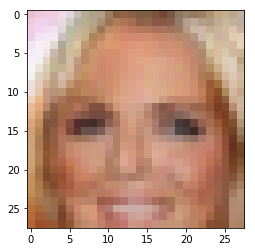

Epoch: 40/50... d_loss: 1.0192... g_loss: 1.2074...


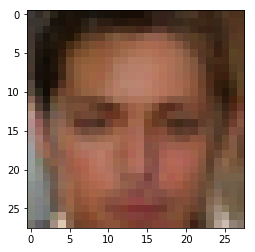

Epoch: 40/50... d_loss: 1.0246... g_loss: 0.9554...


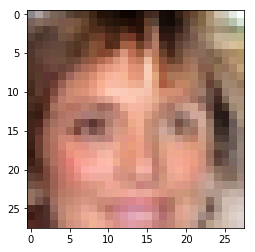

Epoch: 40/50... d_loss: 1.0095... g_loss: 0.9725...


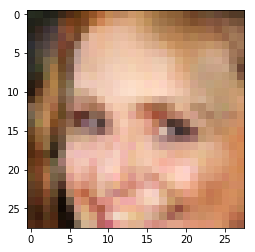

Epoch: 40/50... d_loss: 0.9959... g_loss: 1.0584...


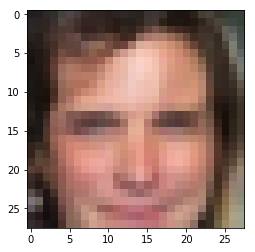

Epoch: 40/50... d_loss: 1.0759... g_loss: 1.1657...


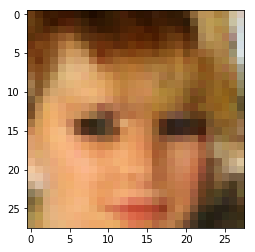

Epoch: 40/50... d_loss: 0.9982... g_loss: 1.1103...


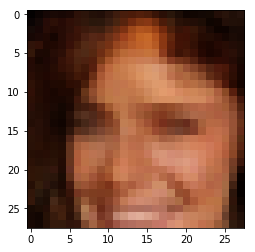

Epoch: 40/50... d_loss: 1.0482... g_loss: 1.6135...


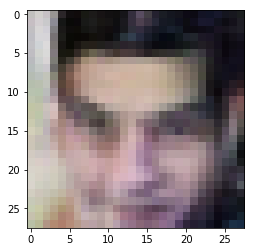

Epoch: 40/50... d_loss: 1.0496... g_loss: 1.5130...


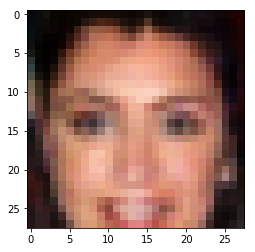

Epoch: 40/50... d_loss: 0.9727... g_loss: 1.0702...


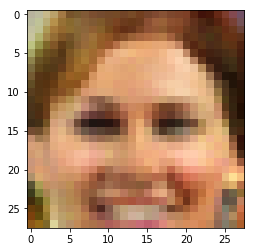

Epoch: 40/50... d_loss: 1.0266... g_loss: 1.2655...


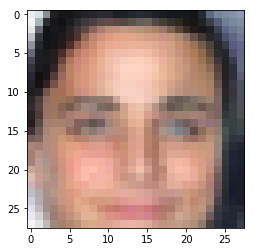

Epoch: 40/50... d_loss: 1.0306... g_loss: 0.9171...


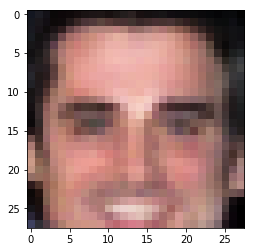

Epoch: 40/50... d_loss: 0.9219... g_loss: 1.5189...


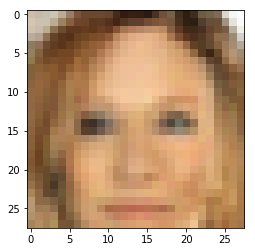

Epoch: 40/50... d_loss: 1.1306... g_loss: 0.8556...


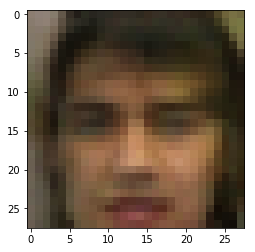

Epoch: 40/50... d_loss: 0.9127... g_loss: 1.6143...


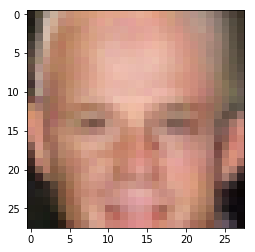

Epoch: 40/50... d_loss: 0.9997... g_loss: 1.6283...


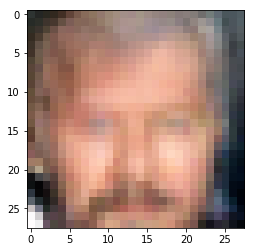

Epoch: 40/50... d_loss: 0.9129... g_loss: 1.7366...


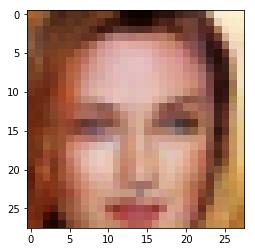

Epoch: 40/50... d_loss: 0.9819... g_loss: 1.1358...


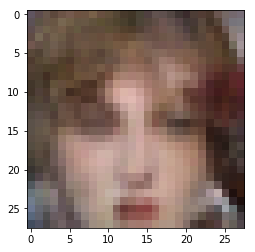

Epoch: 40/50... d_loss: 1.1414... g_loss: 0.8974...


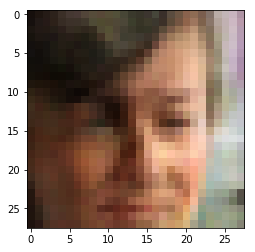

Epoch: 40/50... d_loss: 1.0411... g_loss: 1.0845...


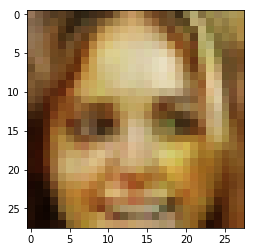

Epoch: 40/50... d_loss: 1.1408... g_loss: 0.9967...


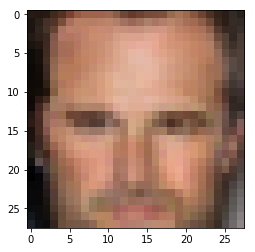

Epoch: 40/50... d_loss: 1.0537... g_loss: 0.9898...


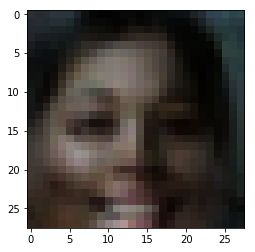

Epoch: 40/50... d_loss: 0.9443... g_loss: 1.3839...


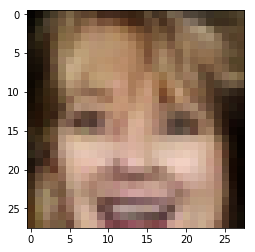

Epoch: 40/50... d_loss: 1.0912... g_loss: 1.2390...


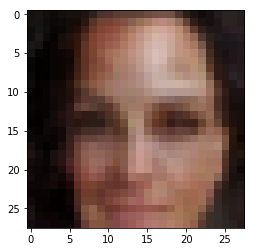

Epoch: 40/50... d_loss: 0.9033... g_loss: 1.5128...


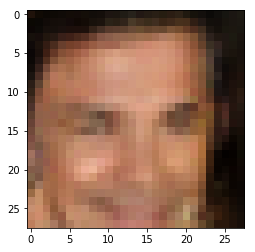

Epoch: 41/50... d_loss: 0.9367... g_loss: 1.9670...


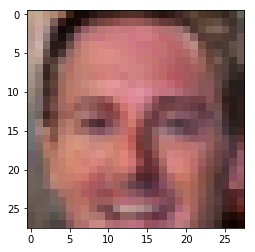

Epoch: 41/50... d_loss: 1.0464... g_loss: 1.1478...


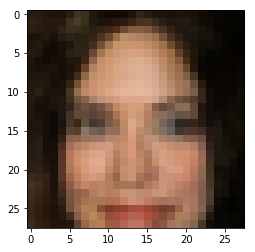

Epoch: 41/50... d_loss: 1.0065... g_loss: 1.3304...


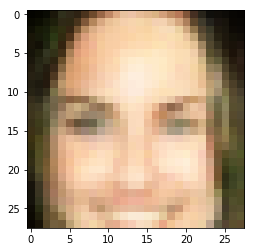

Epoch: 41/50... d_loss: 0.8517... g_loss: 1.5406...


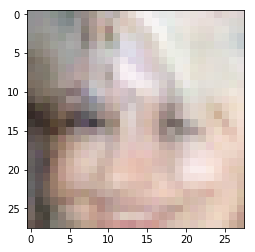

Epoch: 41/50... d_loss: 1.0378... g_loss: 1.0008...


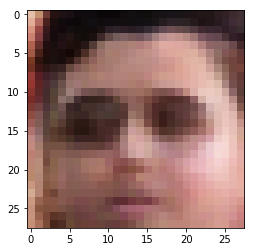

Epoch: 41/50... d_loss: 1.0887... g_loss: 0.8268...


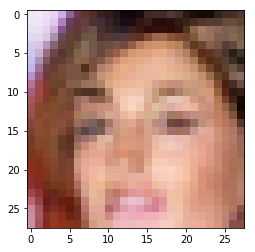

Epoch: 41/50... d_loss: 0.8407... g_loss: 1.6242...


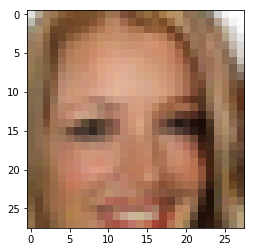

Epoch: 41/50... d_loss: 0.9312... g_loss: 1.3998...


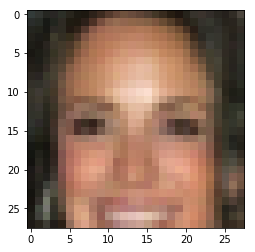

Epoch: 41/50... d_loss: 1.2227... g_loss: 0.8792...


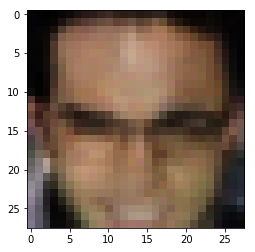

Epoch: 41/50... d_loss: 0.9170... g_loss: 1.2307...


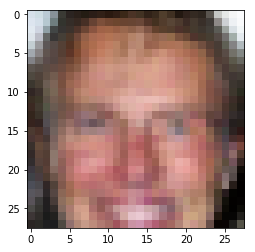

Epoch: 41/50... d_loss: 0.9165... g_loss: 1.3210...


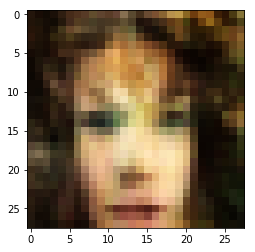

Epoch: 41/50... d_loss: 0.8740... g_loss: 1.5203...


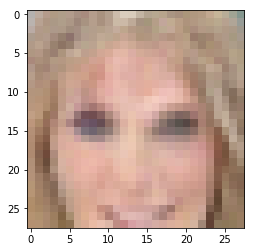

Epoch: 41/50... d_loss: 1.0201... g_loss: 1.0334...


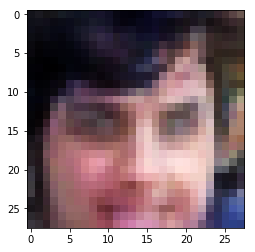

Epoch: 41/50... d_loss: 1.1144... g_loss: 0.9111...


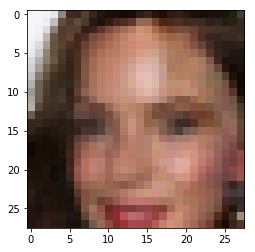

Epoch: 41/50... d_loss: 0.9624... g_loss: 1.2538...


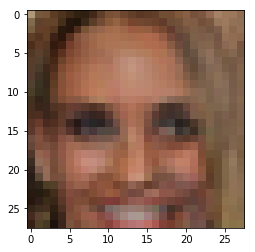

Epoch: 41/50... d_loss: 0.9817... g_loss: 1.0856...


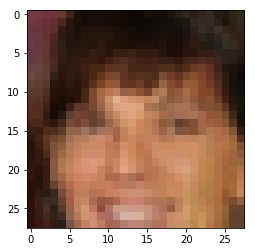

Epoch: 41/50... d_loss: 0.7296... g_loss: 1.6207...


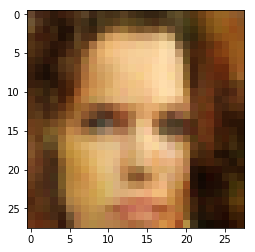

Epoch: 41/50... d_loss: 0.8082... g_loss: 1.8838...


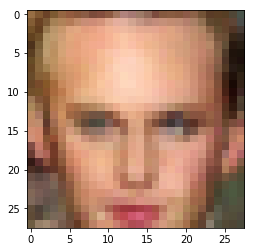

Epoch: 41/50... d_loss: 0.8434... g_loss: 2.0778...


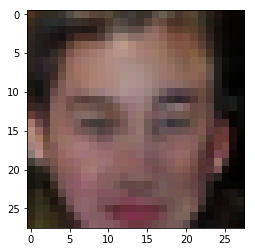

Epoch: 41/50... d_loss: 0.8818... g_loss: 1.2302...


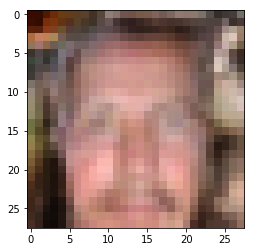

Epoch: 41/50... d_loss: 1.6494... g_loss: 0.5828...


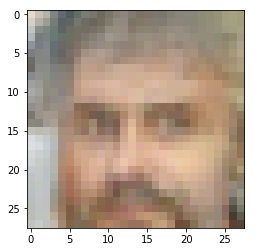

Epoch: 41/50... d_loss: 0.8887... g_loss: 1.4203...


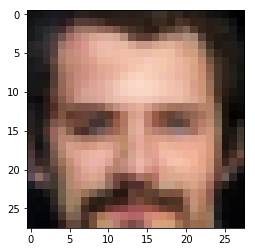

Epoch: 41/50... d_loss: 1.2401... g_loss: 0.7843...


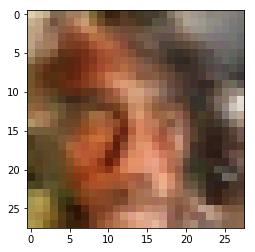

Epoch: 41/50... d_loss: 0.8040... g_loss: 1.6581...


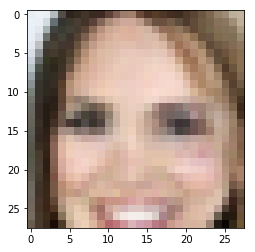

Epoch: 41/50... d_loss: 1.2177... g_loss: 0.8107...


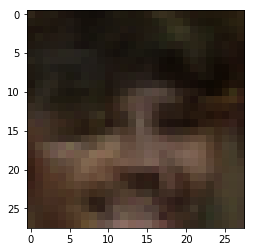

Epoch: 41/50... d_loss: 1.0862... g_loss: 0.8944...


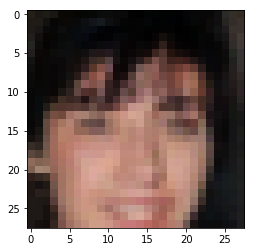

Epoch: 41/50... d_loss: 1.0263... g_loss: 1.4107...


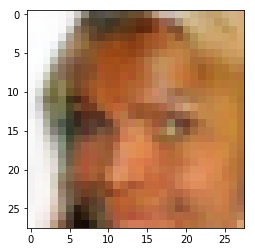

Epoch: 41/50... d_loss: 1.0513... g_loss: 1.1887...


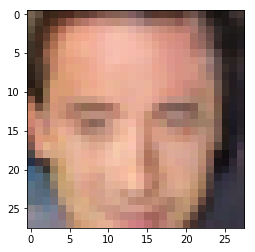

Epoch: 41/50... d_loss: 0.9108... g_loss: 1.6281...


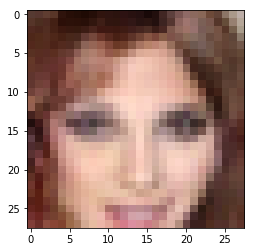

Epoch: 41/50... d_loss: 1.4834... g_loss: 0.5551...


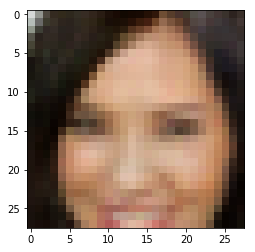

Epoch: 41/50... d_loss: 0.9964... g_loss: 1.0129...


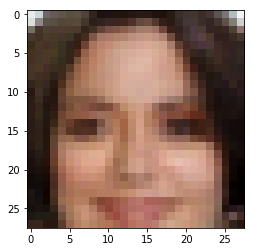

Epoch: 41/50... d_loss: 0.9042... g_loss: 1.7212...


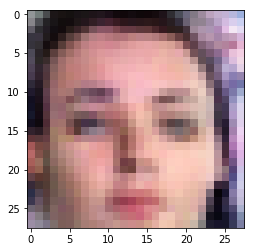

Epoch: 42/50... d_loss: 1.2825... g_loss: 0.7613...


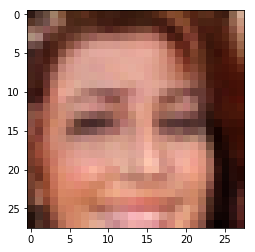

Epoch: 42/50... d_loss: 1.1728... g_loss: 1.1593...


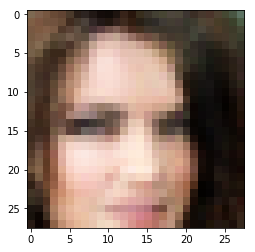

Epoch: 42/50... d_loss: 0.9293... g_loss: 1.2366...


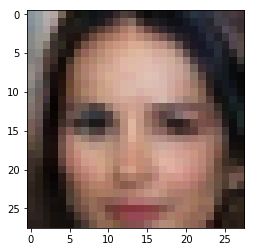

Epoch: 42/50... d_loss: 1.1237... g_loss: 0.9237...


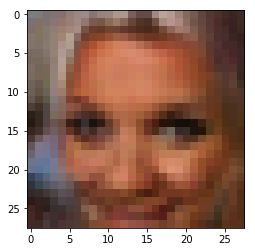

Epoch: 42/50... d_loss: 0.8211... g_loss: 1.5471...


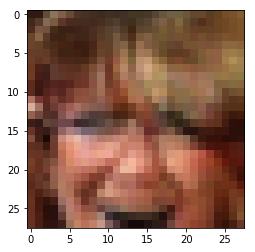

Epoch: 42/50... d_loss: 1.1274... g_loss: 0.8576...


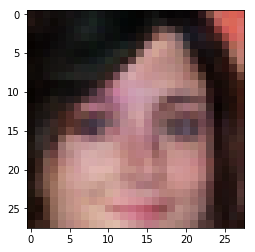

Epoch: 42/50... d_loss: 0.7864... g_loss: 1.6456...


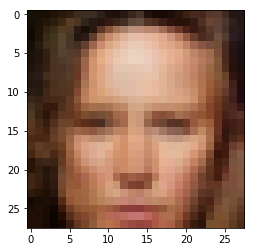

Epoch: 42/50... d_loss: 1.1111... g_loss: 0.9046...


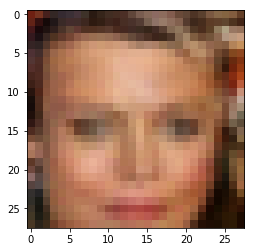

Epoch: 42/50... d_loss: 1.7033... g_loss: 0.4561...


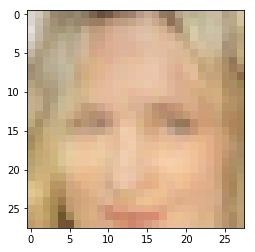

Epoch: 42/50... d_loss: 0.9101... g_loss: 1.3208...


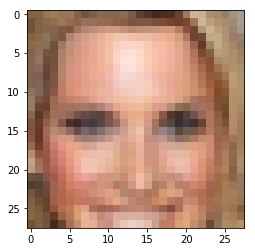

Epoch: 42/50... d_loss: 0.8418... g_loss: 1.5905...


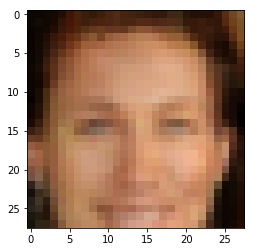

Epoch: 42/50... d_loss: 1.0055... g_loss: 1.1683...


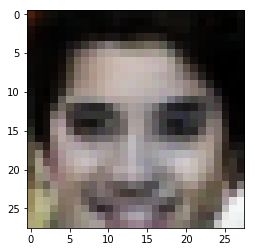

Epoch: 42/50... d_loss: 0.9796... g_loss: 1.2276...


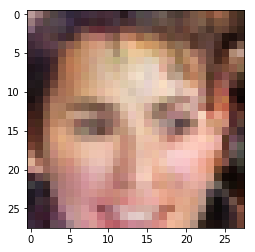

Epoch: 42/50... d_loss: 0.8982... g_loss: 1.4119...


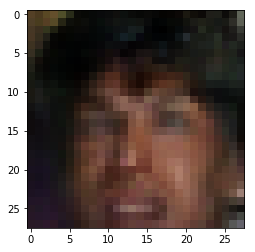

Epoch: 42/50... d_loss: 1.1126... g_loss: 0.9673...


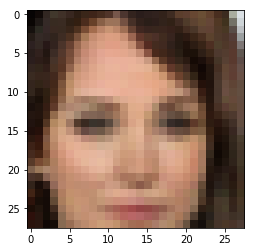

Epoch: 42/50... d_loss: 1.0117... g_loss: 1.1484...


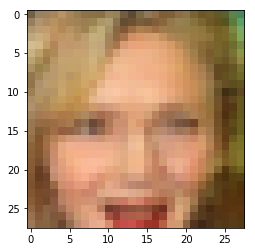

Epoch: 42/50... d_loss: 0.8782... g_loss: 1.7051...


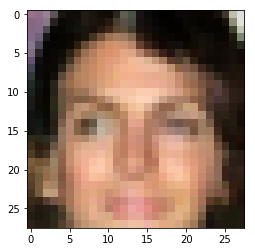

Epoch: 42/50... d_loss: 1.1682... g_loss: 0.9357...


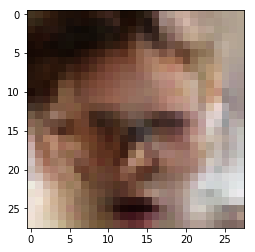

Epoch: 42/50... d_loss: 0.9097... g_loss: 1.3105...


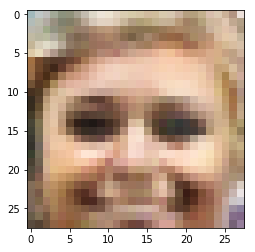

Epoch: 42/50... d_loss: 0.9198... g_loss: 1.3092...


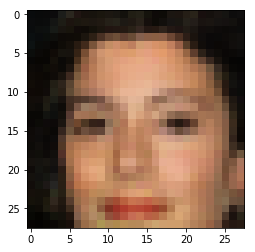

Epoch: 42/50... d_loss: 0.8467... g_loss: 1.7497...


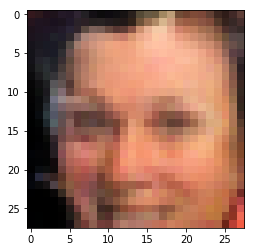

Epoch: 42/50... d_loss: 0.8809... g_loss: 1.3990...


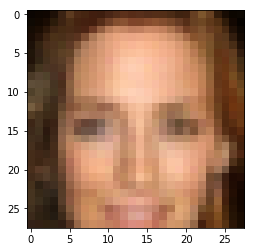

Epoch: 42/50... d_loss: 1.2459... g_loss: 0.8450...


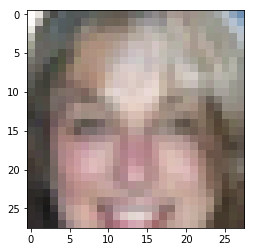

Epoch: 42/50... d_loss: 0.9294... g_loss: 1.0588...


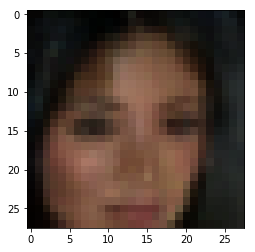

Epoch: 42/50... d_loss: 1.1637... g_loss: 0.8715...


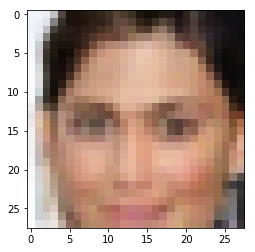

Epoch: 42/50... d_loss: 1.1998... g_loss: 0.8264...


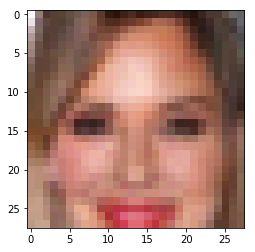

Epoch: 42/50... d_loss: 1.1667... g_loss: 0.8085...


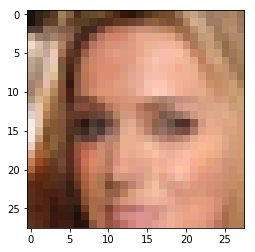

Epoch: 42/50... d_loss: 1.0990... g_loss: 1.0124...


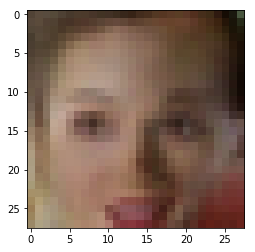

Epoch: 42/50... d_loss: 0.8754... g_loss: 1.3420...


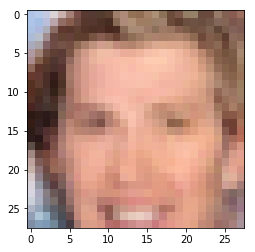

Epoch: 42/50... d_loss: 0.8923... g_loss: 1.3187...


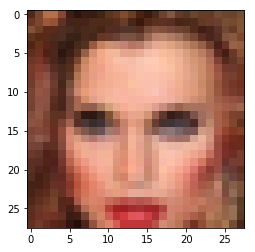

Epoch: 42/50... d_loss: 0.8991... g_loss: 1.5128...


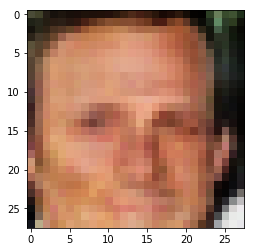

Epoch: 42/50... d_loss: 0.8844... g_loss: 1.7674...


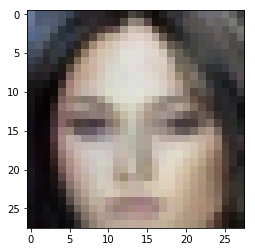

Epoch: 43/50... d_loss: 1.3729... g_loss: 0.7805...


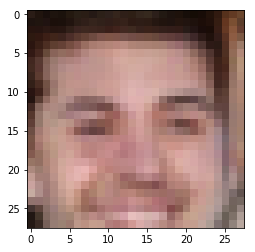

Epoch: 43/50... d_loss: 1.1159... g_loss: 0.9803...


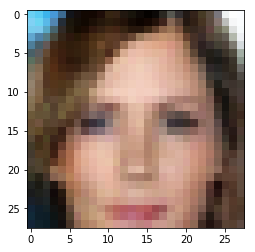

Epoch: 43/50... d_loss: 0.8896... g_loss: 1.6014...


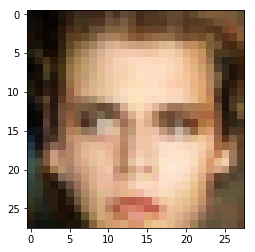

Epoch: 43/50... d_loss: 1.2895... g_loss: 0.6777...


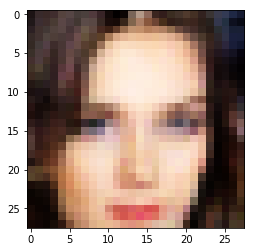

Epoch: 43/50... d_loss: 0.8314... g_loss: 1.9645...


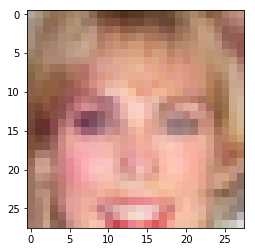

Epoch: 43/50... d_loss: 0.8561... g_loss: 1.2563...


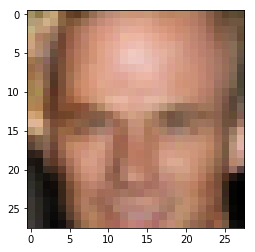

Epoch: 43/50... d_loss: 0.9058... g_loss: 1.2573...


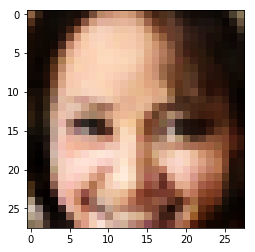

Epoch: 43/50... d_loss: 1.1310... g_loss: 0.8114...


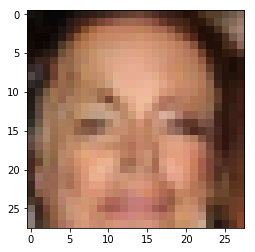

Epoch: 43/50... d_loss: 1.0387... g_loss: 1.3151...


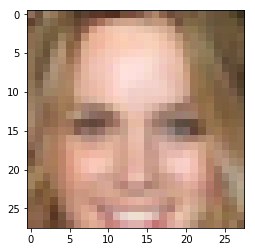

Epoch: 43/50... d_loss: 0.8754... g_loss: 1.2226...


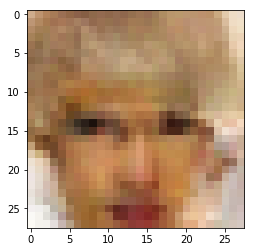

Epoch: 43/50... d_loss: 0.7536... g_loss: 1.6900...


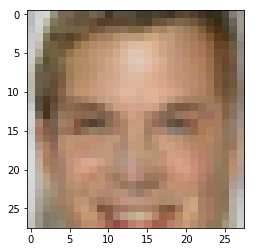

Epoch: 43/50... d_loss: 0.8615... g_loss: 2.0483...


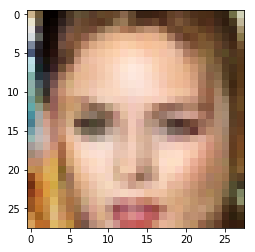

Epoch: 43/50... d_loss: 1.1605... g_loss: 0.8602...


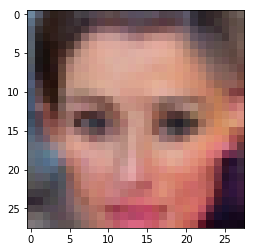

Epoch: 43/50... d_loss: 1.0363... g_loss: 0.9694...


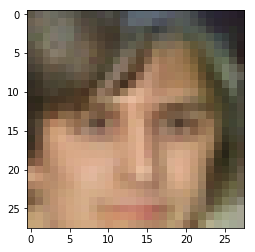

Epoch: 43/50... d_loss: 0.9773... g_loss: 1.1506...


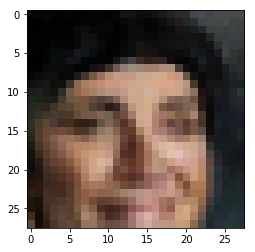

Epoch: 43/50... d_loss: 0.9570... g_loss: 1.1840...


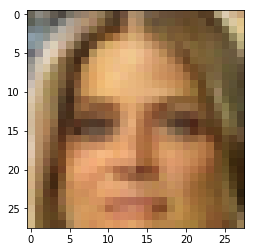

Epoch: 43/50... d_loss: 1.2093... g_loss: 0.8912...


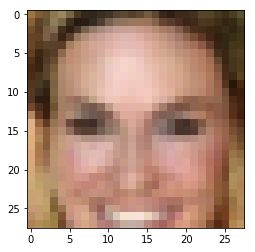

Epoch: 43/50... d_loss: 1.0957... g_loss: 0.9632...


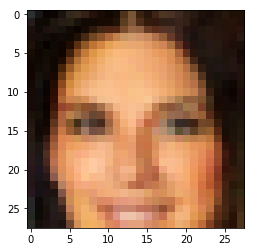

Epoch: 43/50... d_loss: 0.8171... g_loss: 1.8212...


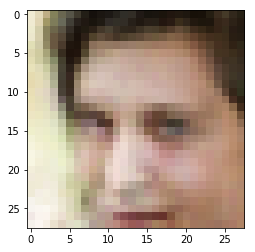

Epoch: 43/50... d_loss: 0.8173... g_loss: 1.6309...


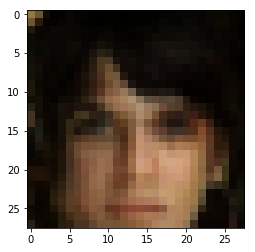

Epoch: 43/50... d_loss: 1.1397... g_loss: 0.8856...


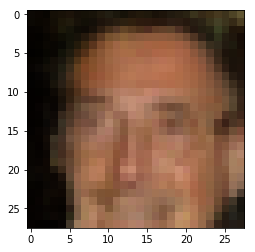

Epoch: 43/50... d_loss: 1.0024... g_loss: 1.0613...


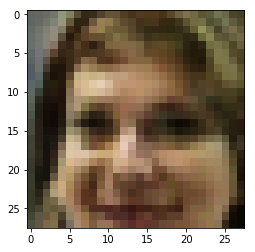

Epoch: 43/50... d_loss: 1.1389... g_loss: 0.8252...


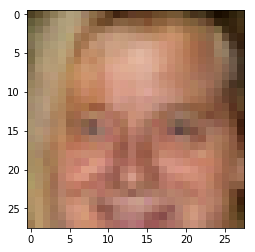

Epoch: 43/50... d_loss: 1.1086... g_loss: 2.1655...


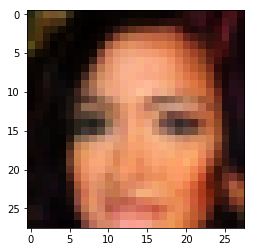

Epoch: 43/50... d_loss: 1.1070... g_loss: 0.8761...


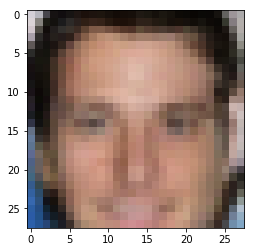

Epoch: 43/50... d_loss: 1.1718... g_loss: 0.8285...


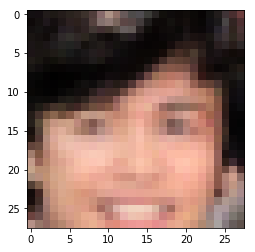

Epoch: 43/50... d_loss: 0.9891... g_loss: 1.0609...


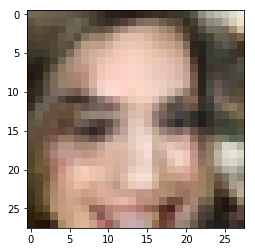

Epoch: 43/50... d_loss: 1.0467... g_loss: 1.2280...


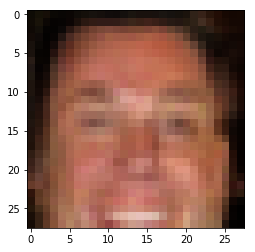

Epoch: 43/50... d_loss: 0.9758... g_loss: 1.0546...


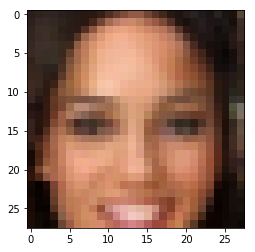

Epoch: 43/50... d_loss: 0.9665... g_loss: 1.2519...


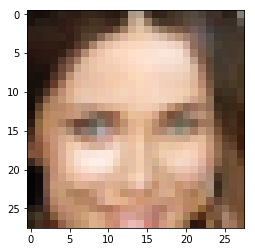

Epoch: 43/50... d_loss: 1.4061... g_loss: 0.5811...


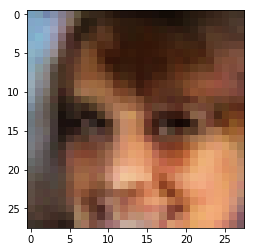

Epoch: 43/50... d_loss: 0.9609... g_loss: 1.1604...


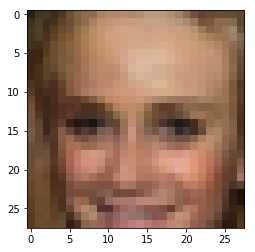

Epoch: 44/50... d_loss: 1.2145... g_loss: 0.7997...


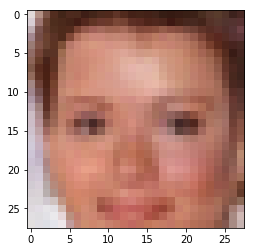

Epoch: 44/50... d_loss: 0.9135... g_loss: 1.6745...


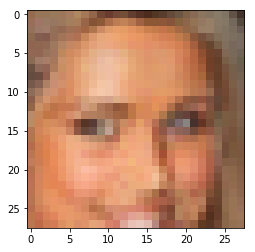

Epoch: 44/50... d_loss: 0.9846... g_loss: 1.4815...


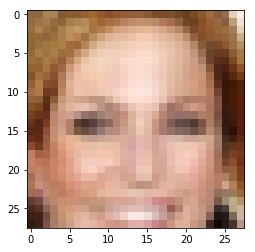

Epoch: 44/50... d_loss: 1.1166... g_loss: 0.8833...


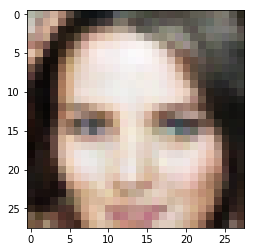

Epoch: 44/50... d_loss: 1.0516... g_loss: 1.0151...


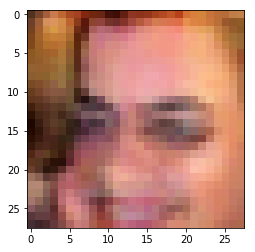

Epoch: 44/50... d_loss: 0.9785... g_loss: 1.0589...


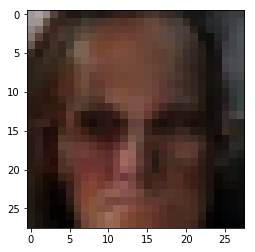

Epoch: 44/50... d_loss: 0.8339... g_loss: 1.4940...


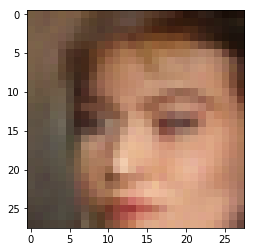

Epoch: 44/50... d_loss: 0.9522... g_loss: 1.5093...


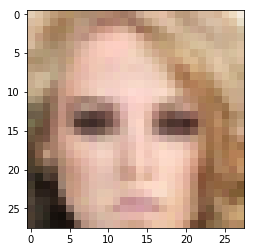

Epoch: 44/50... d_loss: 0.8804... g_loss: 1.7898...


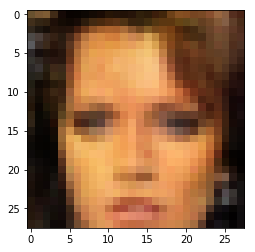

Epoch: 44/50... d_loss: 1.0929... g_loss: 0.8918...


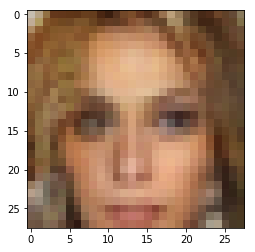

Epoch: 44/50... d_loss: 0.9724... g_loss: 1.0773...


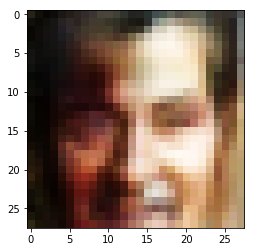

Epoch: 44/50... d_loss: 1.0072... g_loss: 1.0211...


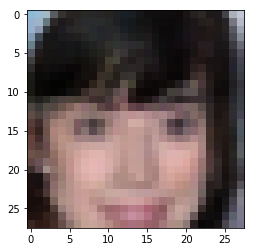

Epoch: 44/50... d_loss: 0.9081... g_loss: 1.2745...


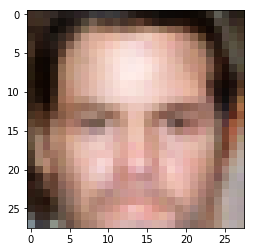

Epoch: 44/50... d_loss: 1.2293... g_loss: 0.7716...


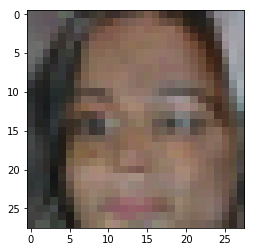

Epoch: 44/50... d_loss: 1.2047... g_loss: 0.8414...


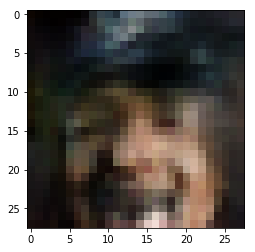

Epoch: 44/50... d_loss: 0.8748... g_loss: 1.3700...


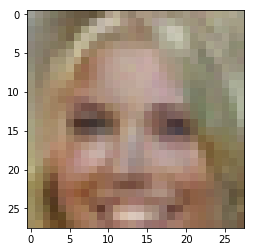

Epoch: 44/50... d_loss: 0.9050... g_loss: 1.2474...


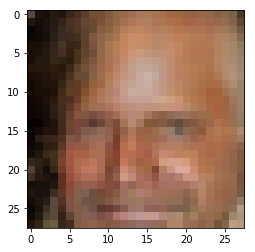

Epoch: 44/50... d_loss: 1.3578... g_loss: 0.6288...


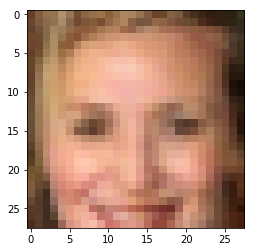

Epoch: 44/50... d_loss: 1.2333... g_loss: 0.7848...


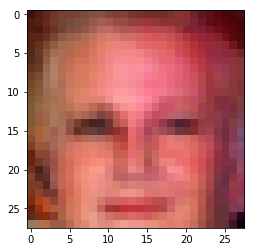

Epoch: 44/50... d_loss: 0.9163... g_loss: 1.3642...


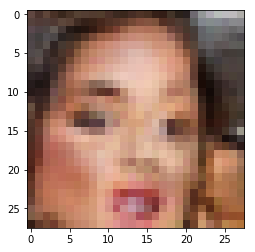

Epoch: 44/50... d_loss: 1.4795... g_loss: 0.5314...


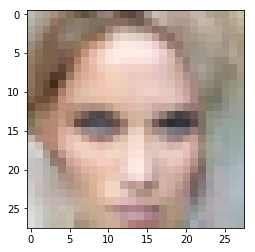

Epoch: 44/50... d_loss: 0.9420... g_loss: 1.1211...


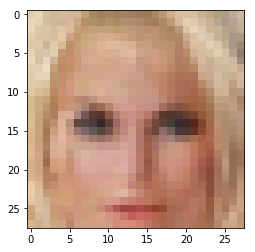

Epoch: 44/50... d_loss: 0.8697... g_loss: 1.6255...


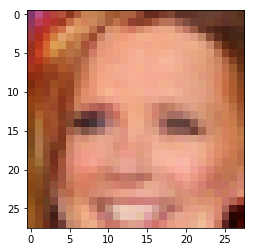

Epoch: 44/50... d_loss: 0.8885... g_loss: 1.2931...


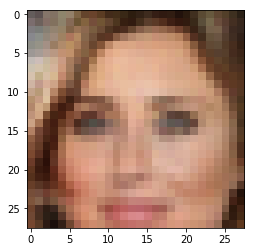

Epoch: 44/50... d_loss: 1.0128... g_loss: 1.2387...


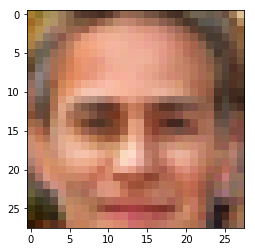

Epoch: 44/50... d_loss: 1.1113... g_loss: 0.9238...


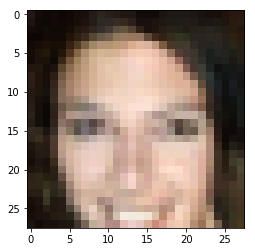

Epoch: 44/50... d_loss: 1.0711... g_loss: 1.0487...


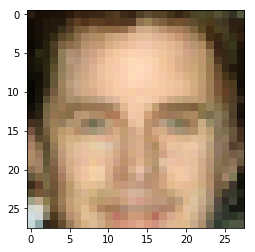

Epoch: 44/50... d_loss: 0.9708... g_loss: 1.1688...


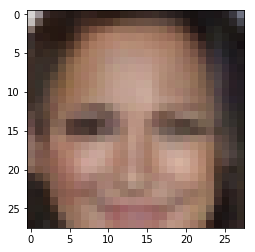

Epoch: 44/50... d_loss: 0.9316... g_loss: 1.5341...


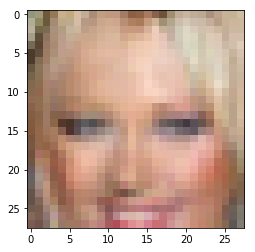

Epoch: 44/50... d_loss: 1.1421... g_loss: 0.9162...


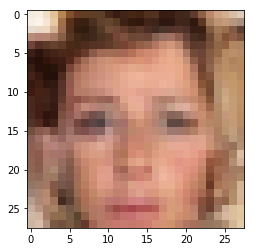

Epoch: 44/50... d_loss: 1.0913... g_loss: 1.1696...


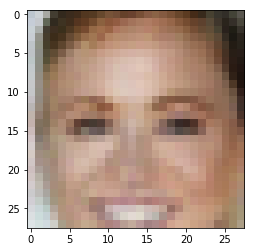

Epoch: 44/50... d_loss: 1.0970... g_loss: 1.0313...


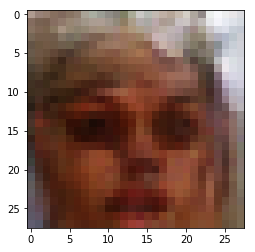

Epoch: 45/50... d_loss: 1.0001... g_loss: 3.1523...


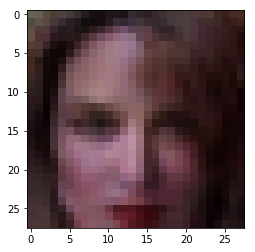

Epoch: 45/50... d_loss: 1.0702... g_loss: 1.3364...


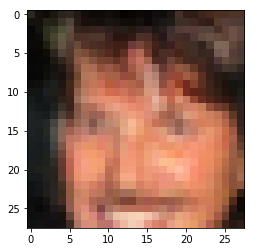

Epoch: 45/50... d_loss: 0.9383... g_loss: 1.2693...


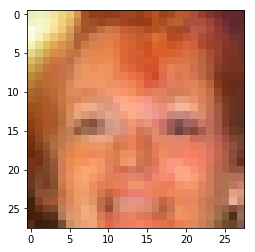

Epoch: 45/50... d_loss: 1.0130... g_loss: 1.2982...


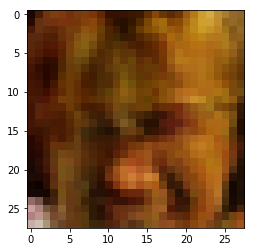

Epoch: 45/50... d_loss: 0.8811... g_loss: 1.3685...


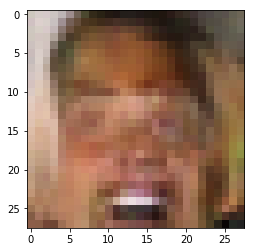

Epoch: 45/50... d_loss: 1.0495... g_loss: 0.9129...


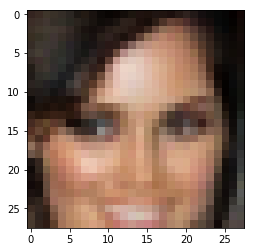

Epoch: 45/50... d_loss: 0.7405... g_loss: 1.5596...


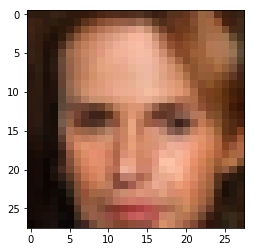

Epoch: 45/50... d_loss: 0.8457... g_loss: 1.5618...


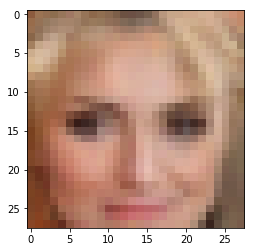

Epoch: 45/50... d_loss: 1.0365... g_loss: 1.1066...


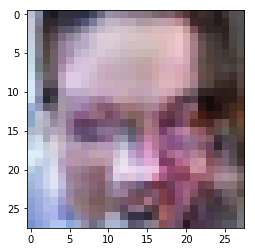

Epoch: 45/50... d_loss: 0.8562... g_loss: 1.3926...


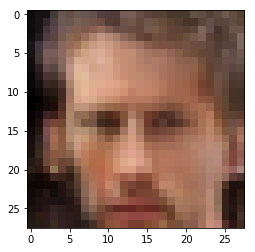

Epoch: 45/50... d_loss: 1.0369... g_loss: 1.2497...


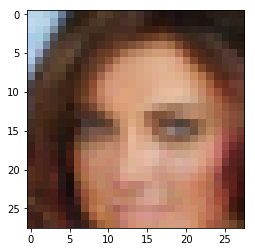

Epoch: 45/50... d_loss: 0.9021... g_loss: 1.3471...


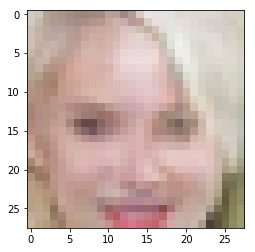

Epoch: 45/50... d_loss: 1.2580... g_loss: 1.6657...


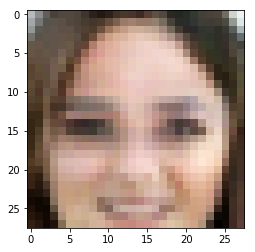

Epoch: 45/50... d_loss: 1.2356... g_loss: 0.7902...


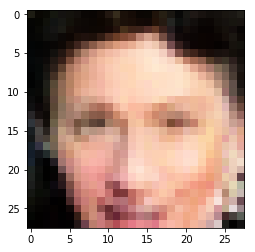

Epoch: 45/50... d_loss: 0.8788... g_loss: 1.4301...


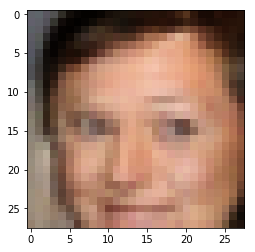

Epoch: 45/50... d_loss: 0.9814... g_loss: 1.1883...


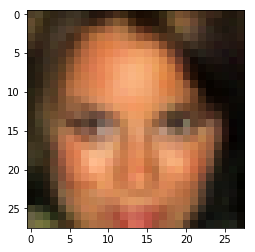

Epoch: 45/50... d_loss: 0.8413... g_loss: 1.4766...


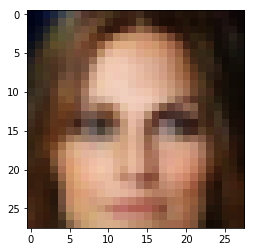

Epoch: 45/50... d_loss: 1.1655... g_loss: 0.9781...


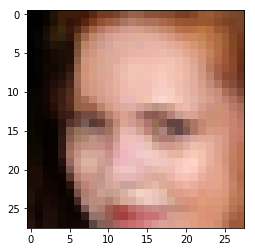

Epoch: 45/50... d_loss: 0.9206... g_loss: 1.7097...


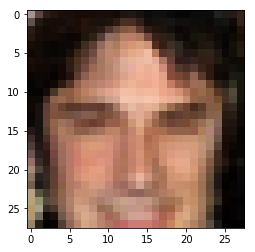

Epoch: 45/50... d_loss: 1.0582... g_loss: 0.9388...


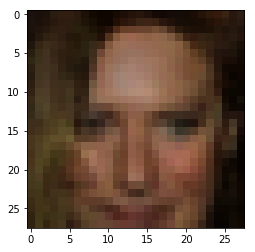

Epoch: 45/50... d_loss: 1.1256... g_loss: 0.9564...


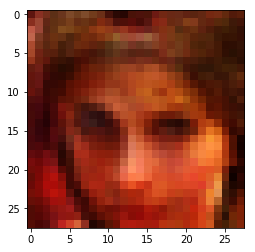

Epoch: 45/50... d_loss: 0.8780... g_loss: 1.4406...


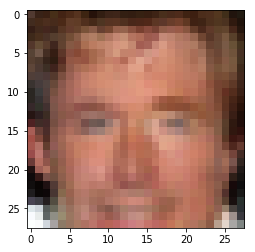

Epoch: 45/50... d_loss: 0.9797... g_loss: 1.1214...


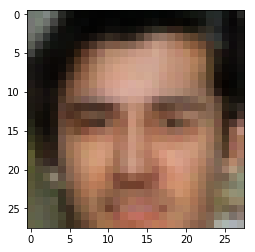

Epoch: 45/50... d_loss: 0.8289... g_loss: 1.8084...


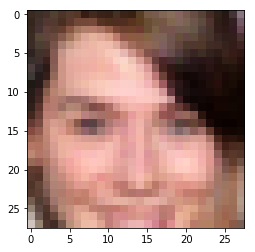

Epoch: 45/50... d_loss: 1.0492... g_loss: 0.9875...


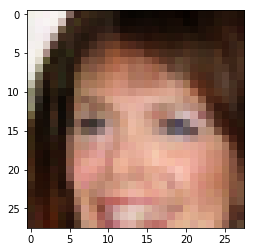

Epoch: 45/50... d_loss: 0.8489... g_loss: 1.4709...


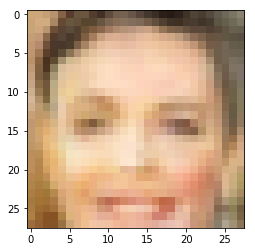

Epoch: 45/50... d_loss: 1.0764... g_loss: 1.0169...


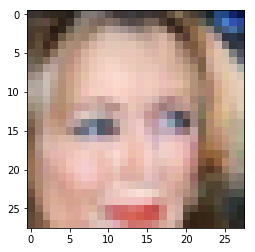

Epoch: 45/50... d_loss: 0.9570... g_loss: 1.4390...


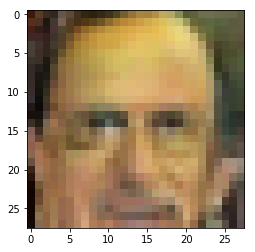

Epoch: 45/50... d_loss: 0.9221... g_loss: 1.4036...


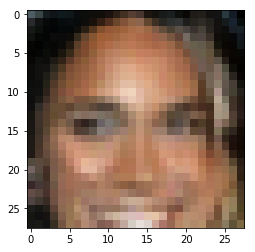

Epoch: 45/50... d_loss: 1.0884... g_loss: 0.9184...


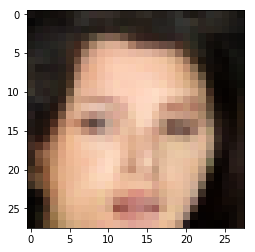

Epoch: 45/50... d_loss: 1.2577... g_loss: 0.7591...


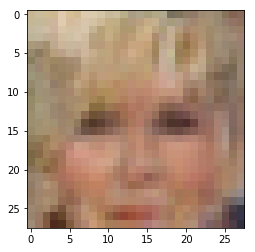

Epoch: 45/50... d_loss: 1.0000... g_loss: 1.5711...


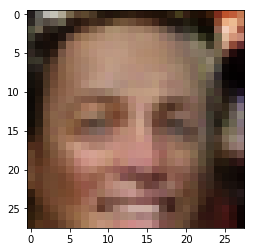

Epoch: 46/50... d_loss: 1.0419... g_loss: 1.2066...


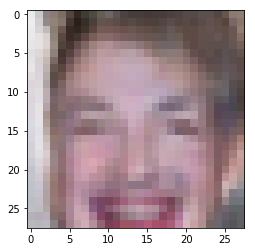

Epoch: 46/50... d_loss: 0.9514... g_loss: 1.2465...


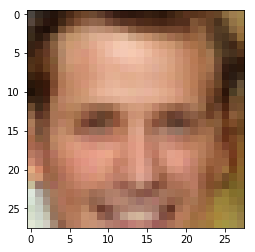

Epoch: 46/50... d_loss: 0.9941... g_loss: 1.0909...


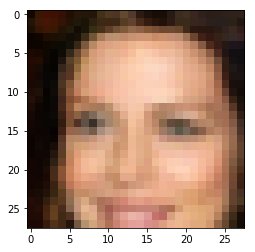

Epoch: 46/50... d_loss: 0.9036... g_loss: 1.2920...


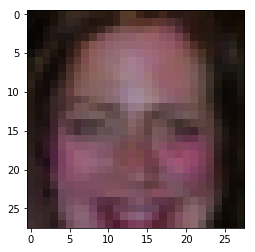

Epoch: 46/50... d_loss: 0.9933... g_loss: 1.1089...


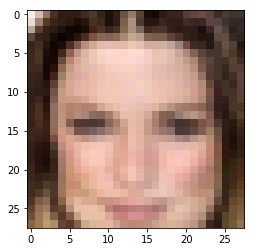

Epoch: 46/50... d_loss: 1.0115... g_loss: 1.1291...


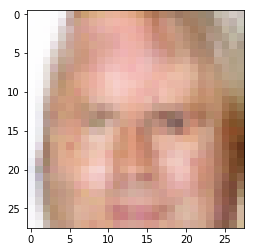

Epoch: 46/50... d_loss: 0.8105... g_loss: 1.6045...


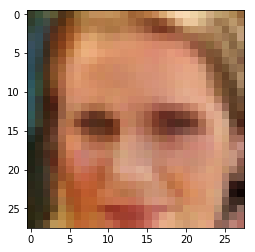

Epoch: 46/50... d_loss: 0.9463... g_loss: 1.3829...


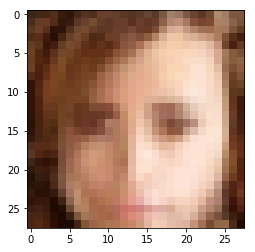

Epoch: 46/50... d_loss: 1.0424... g_loss: 1.1472...


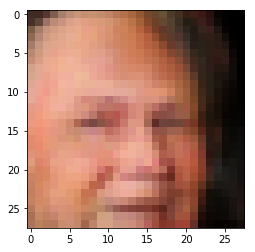

Epoch: 46/50... d_loss: 0.9652... g_loss: 1.2309...


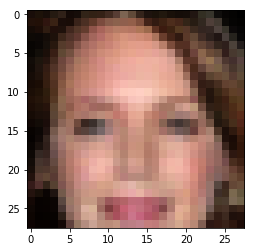

Epoch: 46/50... d_loss: 0.7432... g_loss: 1.5256...


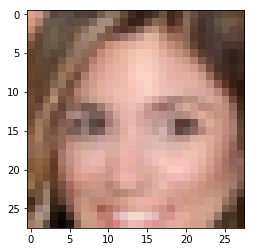

Epoch: 46/50... d_loss: 1.2696... g_loss: 0.7430...


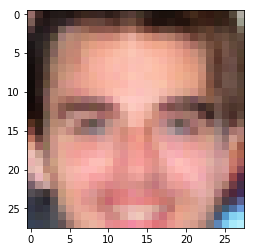

Epoch: 46/50... d_loss: 0.9248... g_loss: 1.2621...


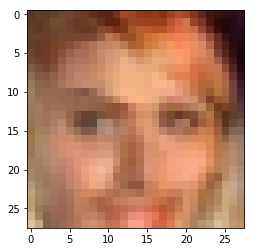

Epoch: 46/50... d_loss: 0.9614... g_loss: 1.1215...


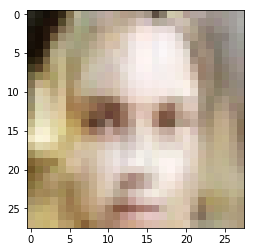

Epoch: 46/50... d_loss: 0.8923... g_loss: 1.4905...


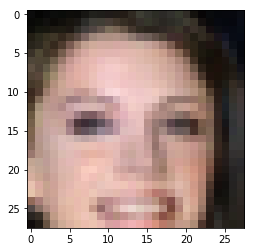

Epoch: 46/50... d_loss: 1.1252... g_loss: 0.8543...


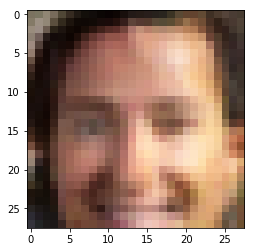

Epoch: 46/50... d_loss: 0.9221... g_loss: 1.1855...


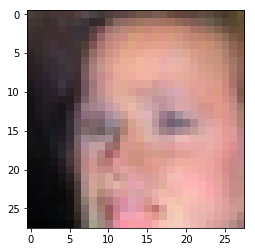

Epoch: 46/50... d_loss: 1.1665... g_loss: 1.0024...


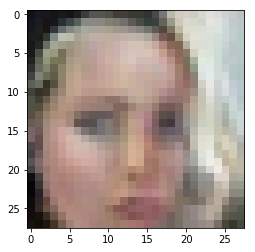

Epoch: 46/50... d_loss: 0.7718... g_loss: 1.6138...


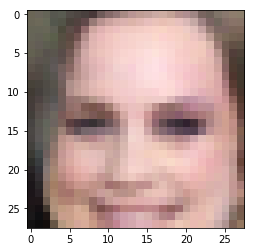

Epoch: 46/50... d_loss: 0.8183... g_loss: 1.4654...


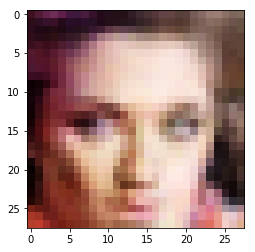

Epoch: 46/50... d_loss: 0.9400... g_loss: 1.4055...


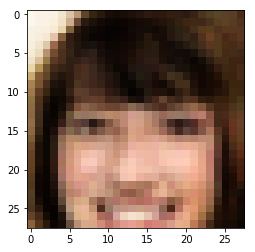

Epoch: 46/50... d_loss: 0.9047... g_loss: 1.1590...


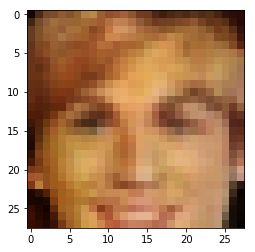

Epoch: 46/50... d_loss: 0.9805... g_loss: 1.7256...


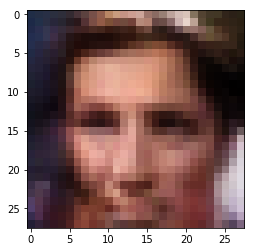

Epoch: 46/50... d_loss: 0.8283... g_loss: 1.8669...


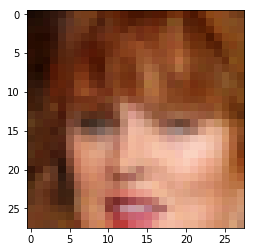

Epoch: 46/50... d_loss: 1.1068... g_loss: 0.9488...


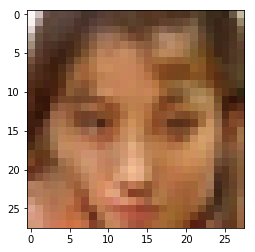

Epoch: 46/50... d_loss: 0.9539... g_loss: 1.1091...


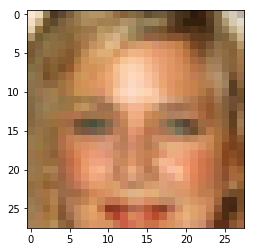

Epoch: 46/50... d_loss: 1.3046... g_loss: 0.6741...


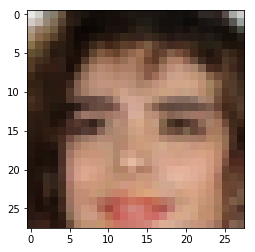

Epoch: 46/50... d_loss: 0.7745... g_loss: 1.4704...


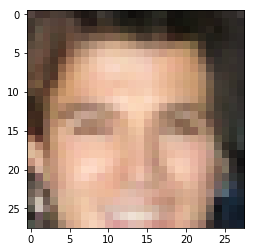

Epoch: 46/50... d_loss: 1.2769... g_loss: 0.7117...


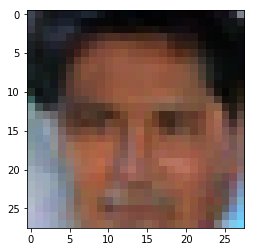

Epoch: 46/50... d_loss: 1.2901... g_loss: 0.6847...


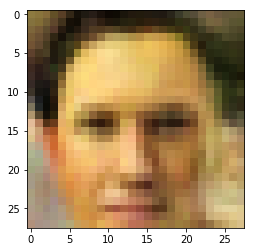

Epoch: 46/50... d_loss: 1.0024... g_loss: 1.0723...


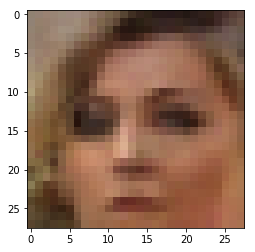

Epoch: 46/50... d_loss: 0.7979... g_loss: 1.5142...


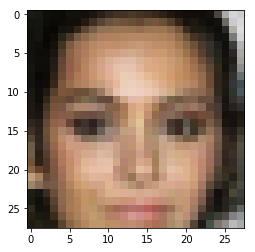

Epoch: 47/50... d_loss: 1.0439... g_loss: 1.7923...


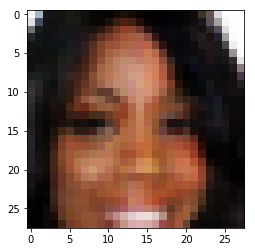

Epoch: 47/50... d_loss: 1.1248... g_loss: 0.8583...


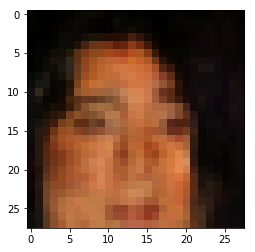

Epoch: 47/50... d_loss: 0.9071... g_loss: 1.5631...


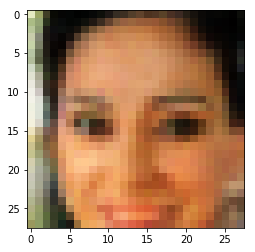

Epoch: 47/50... d_loss: 1.0173... g_loss: 1.0087...


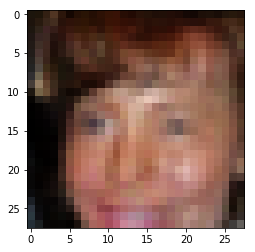

Epoch: 47/50... d_loss: 0.9930... g_loss: 1.1641...


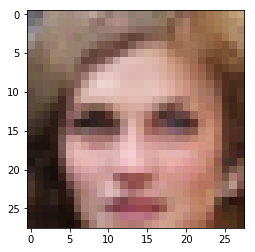

Epoch: 47/50... d_loss: 1.0505... g_loss: 0.9525...


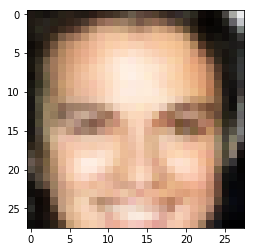

Epoch: 47/50... d_loss: 0.8067... g_loss: 1.5351...


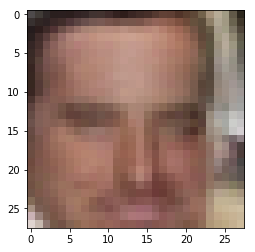

Epoch: 47/50... d_loss: 1.0728... g_loss: 0.9818...


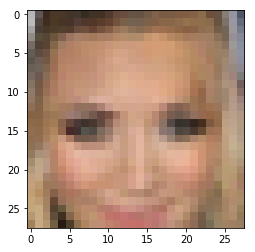

Epoch: 47/50... d_loss: 1.2716... g_loss: 2.4249...


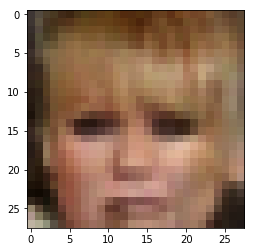

Epoch: 47/50... d_loss: 1.1190... g_loss: 2.0634...


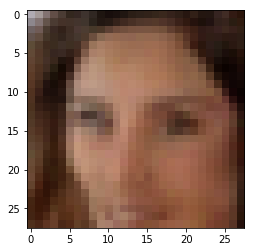

Epoch: 47/50... d_loss: 0.9286... g_loss: 1.2087...


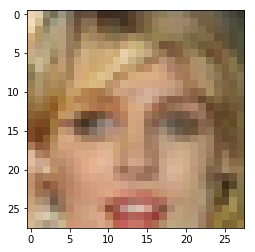

Epoch: 47/50... d_loss: 0.7719... g_loss: 1.8838...


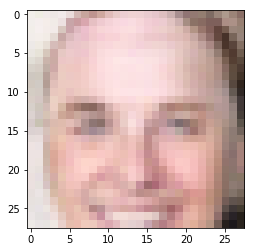

Epoch: 47/50... d_loss: 0.8796... g_loss: 1.8062...


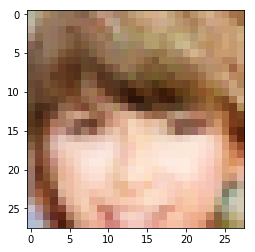

Epoch: 47/50... d_loss: 0.9934... g_loss: 1.0737...


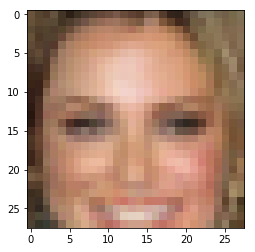

Epoch: 47/50... d_loss: 1.0321... g_loss: 1.0707...


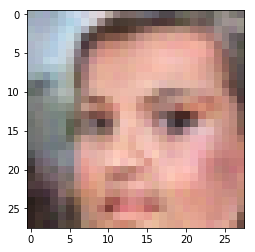

Epoch: 47/50... d_loss: 1.1646... g_loss: 0.8754...


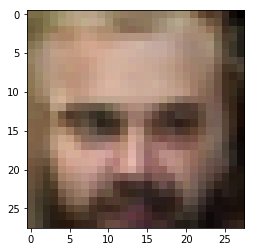

Epoch: 47/50... d_loss: 0.9519... g_loss: 1.1750...


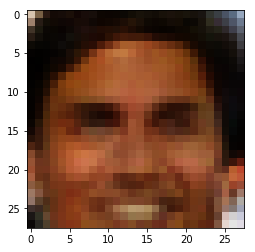

Epoch: 47/50... d_loss: 1.0284... g_loss: 1.1068...


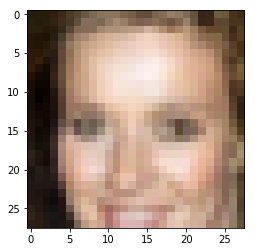

Epoch: 47/50... d_loss: 0.9561... g_loss: 1.6335...


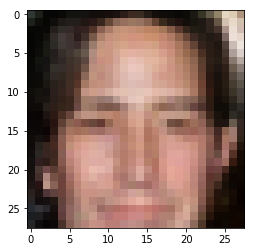

Epoch: 47/50... d_loss: 0.9215... g_loss: 1.5806...


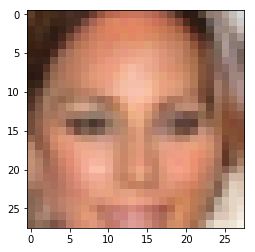

Epoch: 47/50... d_loss: 1.0248... g_loss: 1.2492...


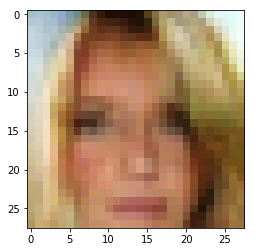

Epoch: 47/50... d_loss: 0.8418... g_loss: 1.3109...


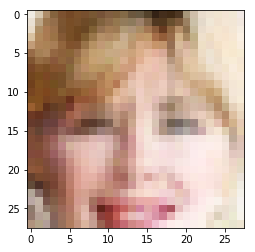

Epoch: 47/50... d_loss: 1.0343... g_loss: 1.4139...


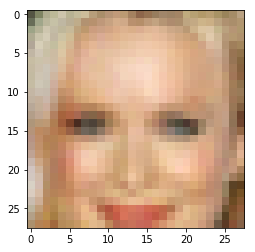

Epoch: 47/50... d_loss: 0.9357... g_loss: 1.2303...


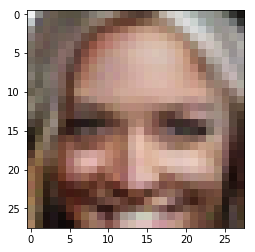

Epoch: 47/50... d_loss: 1.0254... g_loss: 1.1009...


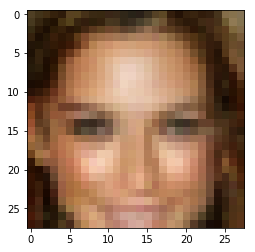

Epoch: 47/50... d_loss: 1.1207... g_loss: 0.9191...


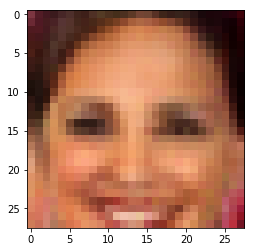

Epoch: 47/50... d_loss: 1.5218... g_loss: 0.7077...


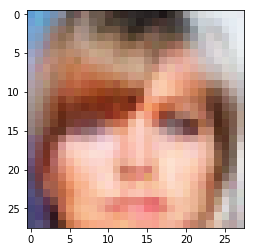

Epoch: 47/50... d_loss: 0.8936... g_loss: 1.2650...


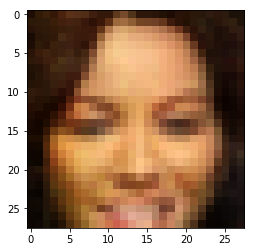

Epoch: 47/50... d_loss: 1.2083... g_loss: 0.8084...


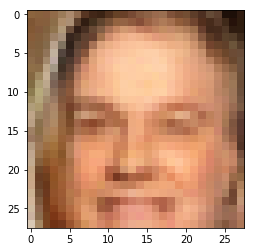

Epoch: 47/50... d_loss: 0.9127... g_loss: 1.2817...


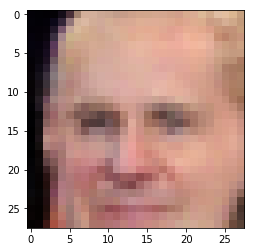

Epoch: 47/50... d_loss: 1.1692... g_loss: 0.9072...


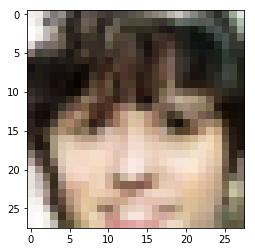

Epoch: 47/50... d_loss: 0.9610... g_loss: 1.3585...


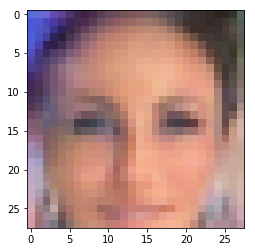

Epoch: 48/50... d_loss: 1.3242... g_loss: 0.7357...


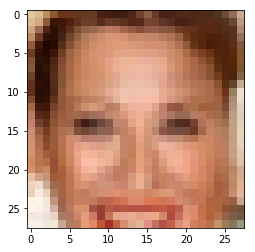

Epoch: 48/50... d_loss: 1.1538... g_loss: 0.9521...


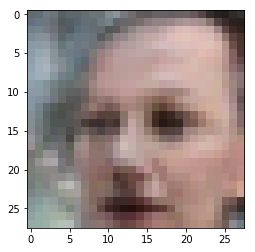

Epoch: 48/50... d_loss: 0.9093... g_loss: 1.7723...


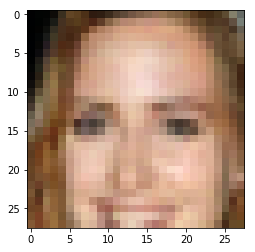

Epoch: 48/50... d_loss: 1.0526... g_loss: 0.9411...


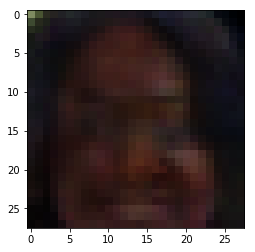

Epoch: 48/50... d_loss: 1.0508... g_loss: 1.0125...


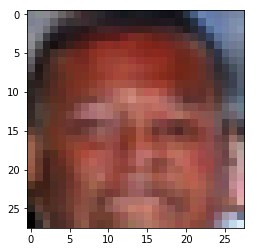

Epoch: 48/50... d_loss: 1.1649... g_loss: 0.8529...


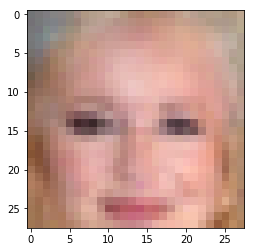

Epoch: 48/50... d_loss: 0.8284... g_loss: 1.3728...


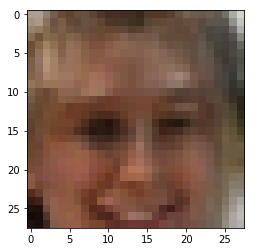

Epoch: 48/50... d_loss: 0.7459... g_loss: 1.6131...


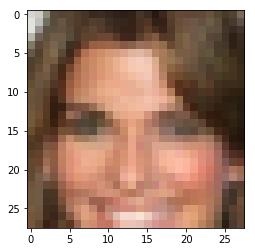

Epoch: 48/50... d_loss: 1.0750... g_loss: 0.9616...


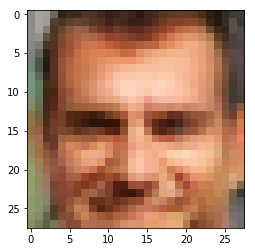

Epoch: 48/50... d_loss: 0.9384... g_loss: 1.1916...


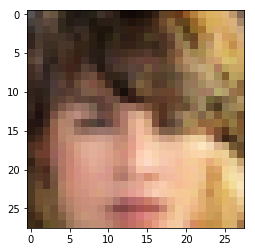

Epoch: 48/50... d_loss: 0.7547... g_loss: 1.8556...


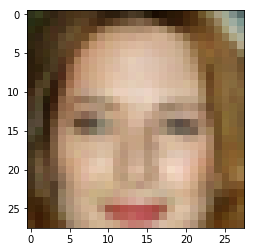

Epoch: 48/50... d_loss: 1.0156... g_loss: 1.0628...


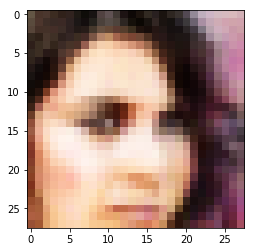

Epoch: 48/50... d_loss: 0.9038... g_loss: 1.1667...


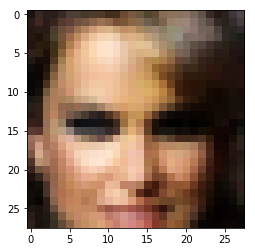

Epoch: 48/50... d_loss: 0.9560... g_loss: 1.3978...


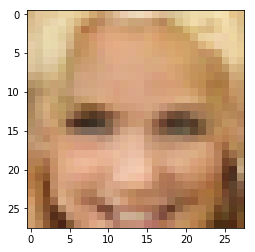

Epoch: 48/50... d_loss: 0.9253... g_loss: 1.2161...


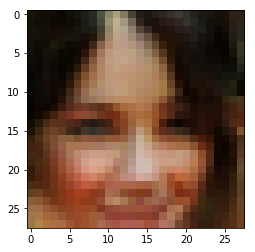

Epoch: 48/50... d_loss: 1.1165... g_loss: 0.9606...


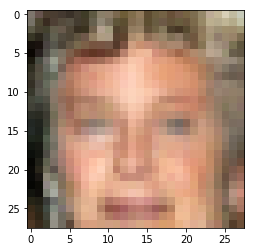

Epoch: 48/50... d_loss: 0.8434... g_loss: 1.4781...


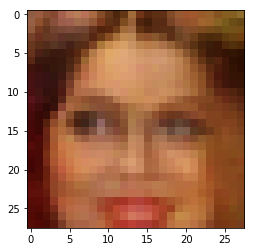

Epoch: 48/50... d_loss: 1.0932... g_loss: 0.9504...


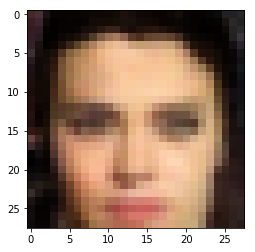

Epoch: 48/50... d_loss: 1.0661... g_loss: 1.0471...


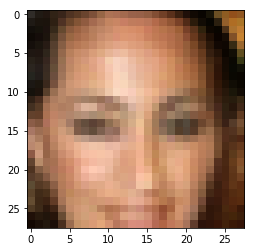

Epoch: 48/50... d_loss: 1.0465... g_loss: 1.0434...


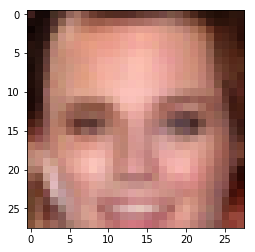

Epoch: 48/50... d_loss: 1.3342... g_loss: 0.7097...


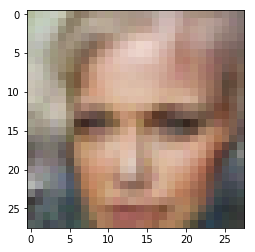

Epoch: 48/50... d_loss: 0.9490... g_loss: 1.2801...


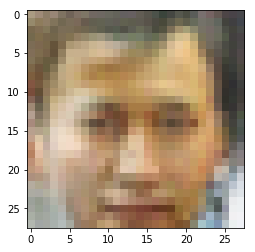

Epoch: 48/50... d_loss: 0.9391... g_loss: 1.8885...


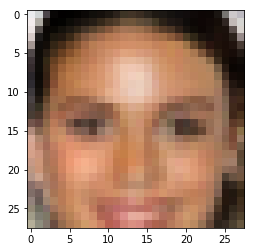

Epoch: 48/50... d_loss: 0.9299... g_loss: 2.2670...


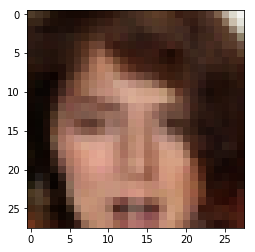

Epoch: 48/50... d_loss: 1.3714... g_loss: 0.6329...


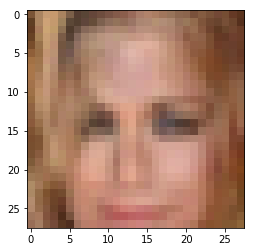

Epoch: 48/50... d_loss: 1.0365... g_loss: 1.1089...


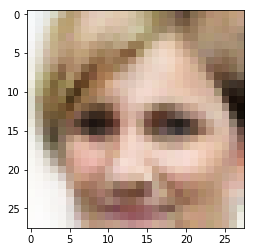

Epoch: 48/50... d_loss: 0.8588... g_loss: 1.6459...


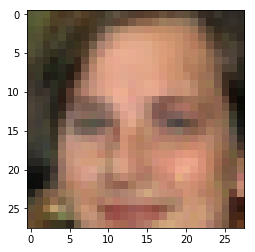

Epoch: 48/50... d_loss: 0.8598... g_loss: 1.2794...


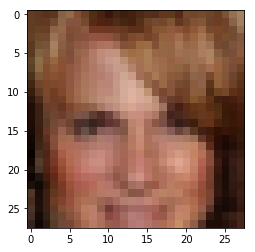

Epoch: 48/50... d_loss: 1.0659... g_loss: 1.1797...


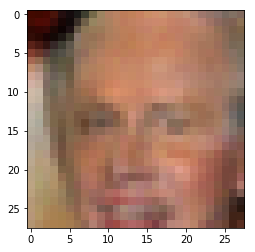

Epoch: 48/50... d_loss: 1.0552... g_loss: 1.0154...


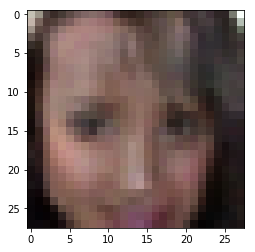

Epoch: 48/50... d_loss: 1.0091... g_loss: 1.1872...


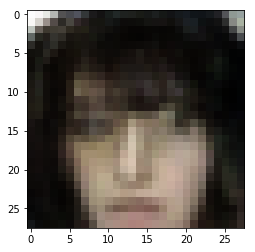

Epoch: 48/50... d_loss: 0.9575... g_loss: 1.5138...


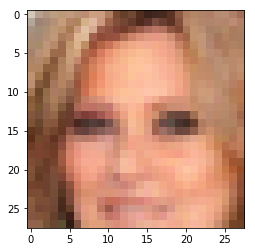

Epoch: 49/50... d_loss: 1.2147... g_loss: 0.8182...


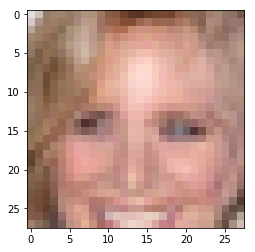

Epoch: 49/50... d_loss: 1.2113... g_loss: 0.8601...


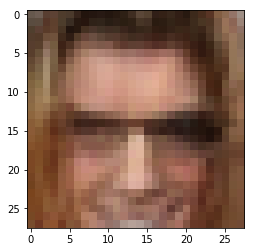

Epoch: 49/50... d_loss: 0.9514... g_loss: 1.2547...


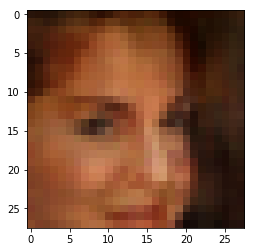

Epoch: 49/50... d_loss: 1.0387... g_loss: 1.0675...


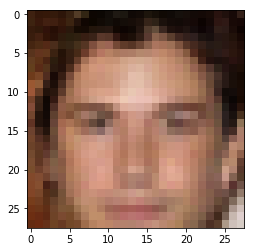

Epoch: 49/50... d_loss: 0.9707... g_loss: 1.0256...


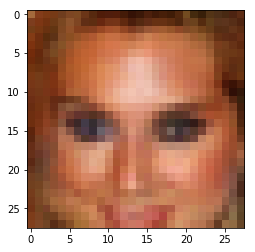

Epoch: 49/50... d_loss: 0.7958... g_loss: 1.8561...


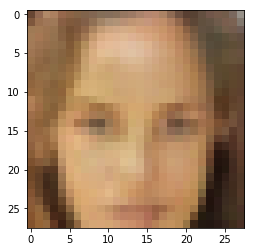

Epoch: 49/50... d_loss: 0.8816... g_loss: 1.3541...


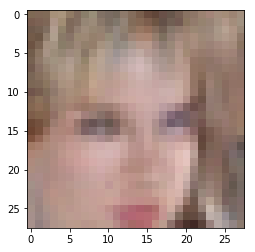

Epoch: 49/50... d_loss: 1.0417... g_loss: 1.0491...


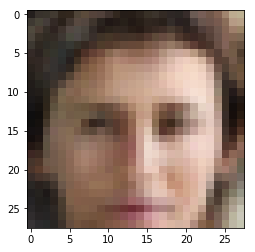

Epoch: 49/50... d_loss: 1.1852... g_loss: 0.8515...


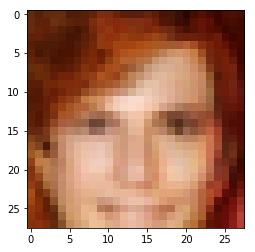

Epoch: 49/50... d_loss: 0.9180... g_loss: 1.3076...


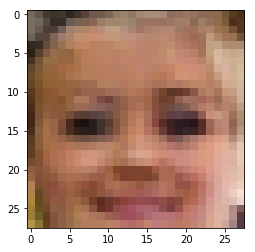

Epoch: 49/50... d_loss: 0.8882... g_loss: 1.3471...


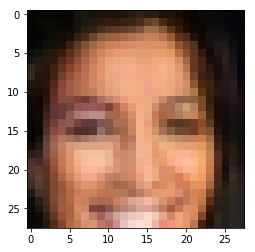

Epoch: 49/50... d_loss: 0.9467... g_loss: 1.3413...


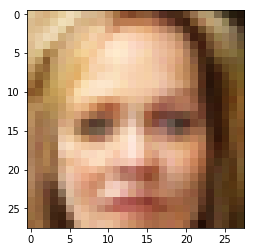

Epoch: 49/50... d_loss: 1.1728... g_loss: 0.8325...


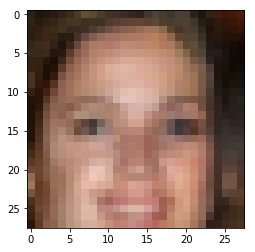

Epoch: 49/50... d_loss: 0.8844... g_loss: 1.8830...


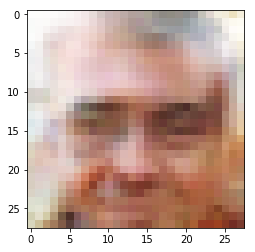

Epoch: 49/50... d_loss: 1.0953... g_loss: 1.0273...


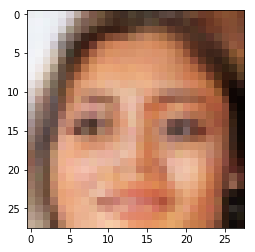

Epoch: 49/50... d_loss: 0.9007... g_loss: 1.3552...


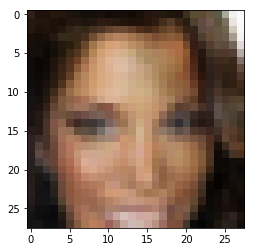

Epoch: 49/50... d_loss: 0.8529... g_loss: 1.4686...


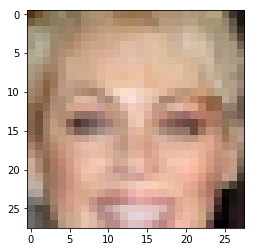

Epoch: 49/50... d_loss: 1.0596... g_loss: 1.0243...


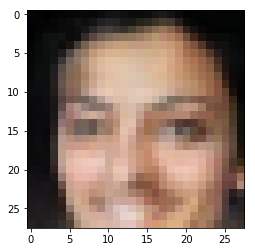

Epoch: 49/50... d_loss: 0.8181... g_loss: 1.4850...


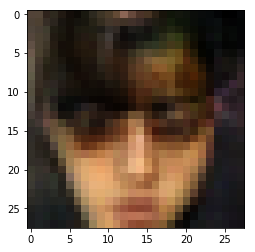

Epoch: 49/50... d_loss: 0.9226... g_loss: 1.3821...


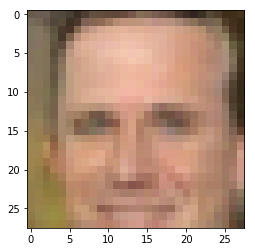

Epoch: 49/50... d_loss: 1.1267... g_loss: 0.8838...


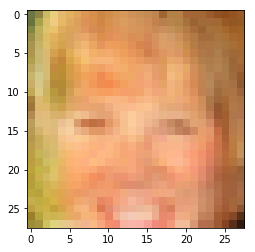

Epoch: 49/50... d_loss: 0.7260... g_loss: 1.7995...


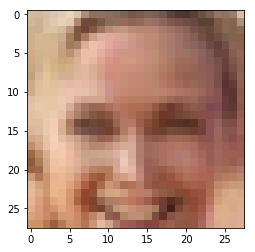

Epoch: 49/50... d_loss: 1.3712... g_loss: 0.7024...


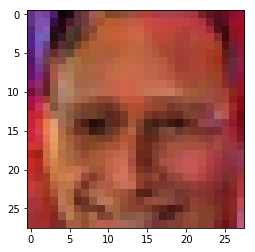

Epoch: 49/50... d_loss: 0.9215... g_loss: 2.2998...


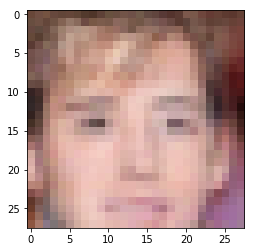

Epoch: 49/50... d_loss: 1.2511... g_loss: 0.7481...


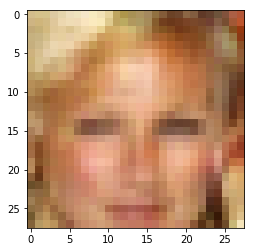

Epoch: 49/50... d_loss: 0.9517... g_loss: 1.2616...


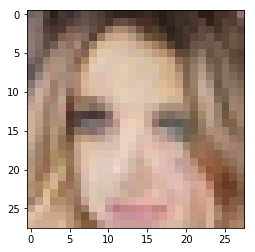

Epoch: 49/50... d_loss: 1.1003... g_loss: 1.1019...


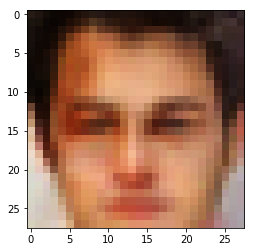

Epoch: 49/50... d_loss: 0.9776... g_loss: 1.1012...


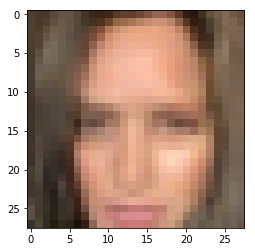

Epoch: 49/50... d_loss: 1.0213... g_loss: 1.0107...


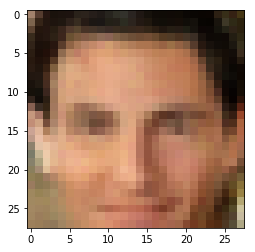

Epoch: 49/50... d_loss: 1.0672... g_loss: 2.1020...


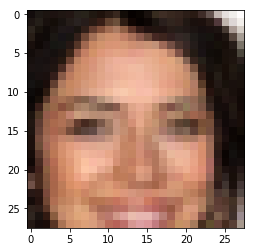

Epoch: 49/50... d_loss: 1.2124... g_loss: 0.7799...


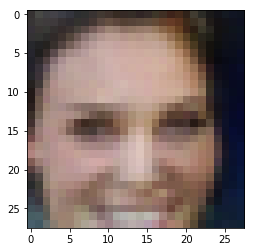

Epoch: 49/50... d_loss: 0.7988... g_loss: 1.8635...


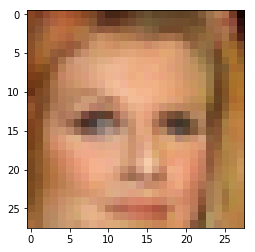

Epoch: 50/50... d_loss: 1.0958... g_loss: 0.9915...


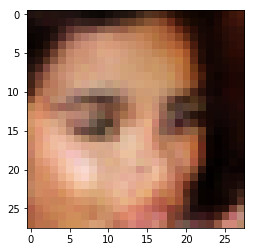

Epoch: 50/50... d_loss: 0.9770... g_loss: 1.2713...


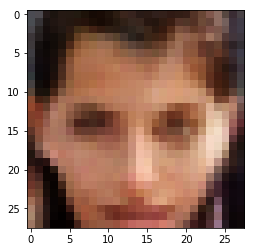

Epoch: 50/50... d_loss: 1.0903... g_loss: 0.9208...


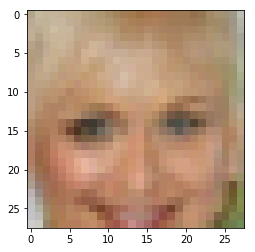

Epoch: 50/50... d_loss: 0.9011... g_loss: 1.7942...


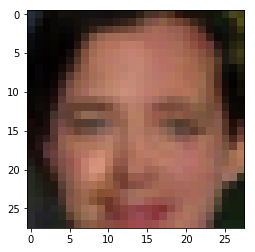

Epoch: 50/50... d_loss: 0.8526... g_loss: 1.4228...


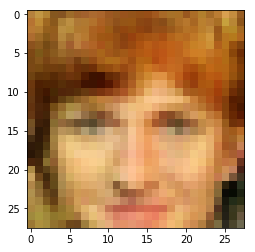

Epoch: 50/50... d_loss: 1.0280... g_loss: 1.2240...


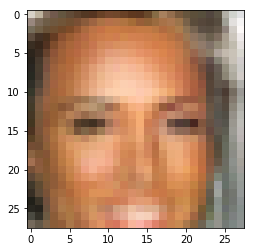

Epoch: 50/50... d_loss: 0.8609... g_loss: 1.3944...


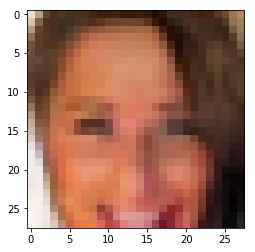

Epoch: 50/50... d_loss: 0.8436... g_loss: 1.5722...


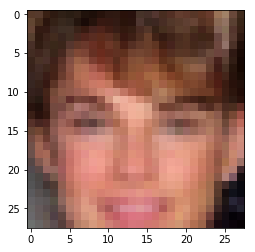

Epoch: 50/50... d_loss: 0.9419... g_loss: 1.3113...


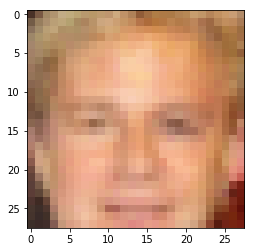

Epoch: 50/50... d_loss: 0.9073... g_loss: 1.4623...


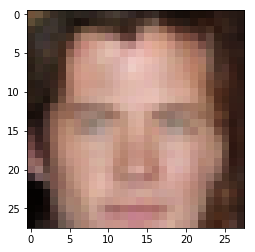

Epoch: 50/50... d_loss: 0.7444... g_loss: 1.9754...


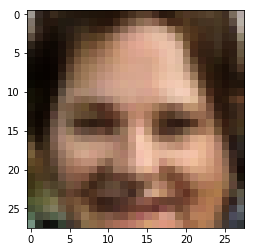

Epoch: 50/50... d_loss: 1.0072... g_loss: 1.1384...


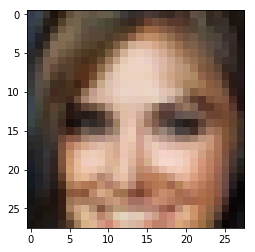

Epoch: 50/50... d_loss: 1.1490... g_loss: 0.9259...


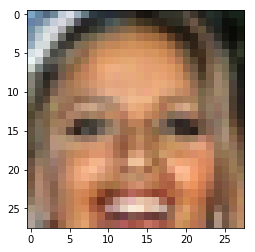

Epoch: 50/50... d_loss: 0.7997... g_loss: 1.7982...


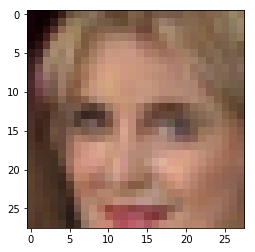

Epoch: 50/50... d_loss: 0.8448... g_loss: 1.5203...


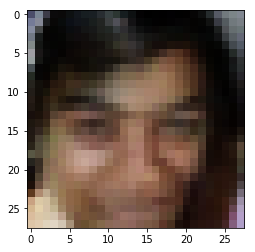

Epoch: 50/50... d_loss: 0.9407... g_loss: 1.2028...


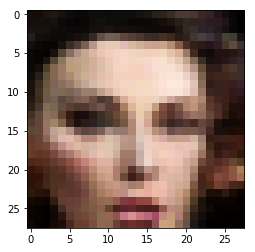

Epoch: 50/50... d_loss: 0.8197... g_loss: 1.4219...


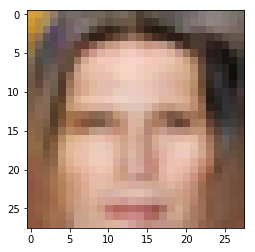

Epoch: 50/50... d_loss: 1.0270... g_loss: 1.0306...


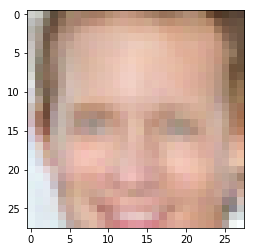

Epoch: 50/50... d_loss: 0.9754... g_loss: 1.1751...


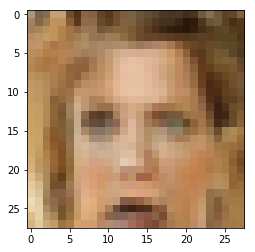

Epoch: 50/50... d_loss: 0.8536... g_loss: 1.4070...


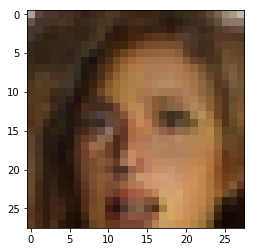

Epoch: 50/50... d_loss: 1.0597... g_loss: 1.0641...


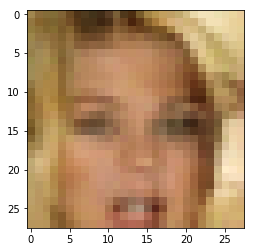

Epoch: 50/50... d_loss: 0.9575... g_loss: 1.1919...


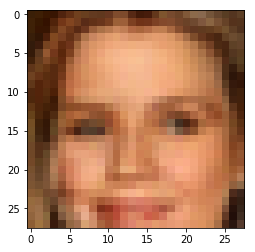

Epoch: 50/50... d_loss: 0.8885... g_loss: 1.9503...


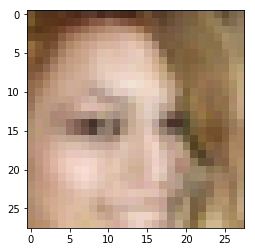

Epoch: 50/50... d_loss: 0.9772... g_loss: 1.1768...


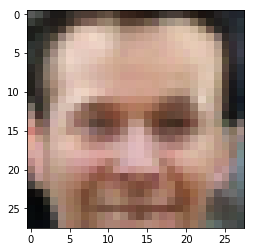

Epoch: 50/50... d_loss: 0.9715... g_loss: 1.0356...


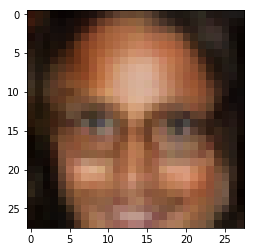

Epoch: 50/50... d_loss: 1.1073... g_loss: 0.9448...


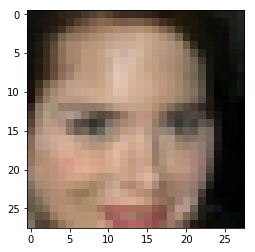

Epoch: 50/50... d_loss: 0.8959... g_loss: 1.3585...


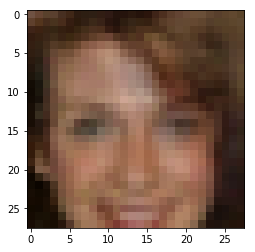

Epoch: 50/50... d_loss: 0.7616... g_loss: 1.8260...


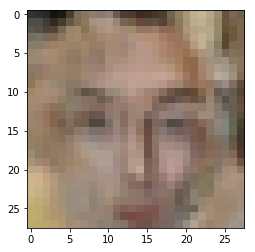

Epoch: 50/50... d_loss: 0.9372... g_loss: 1.2814...


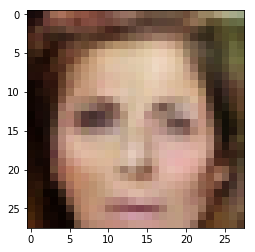

Epoch: 50/50... d_loss: 0.8652... g_loss: 1.4100...


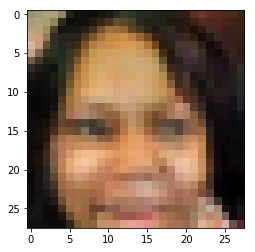

Epoch: 50/50... d_loss: 1.2824... g_loss: 0.7642...


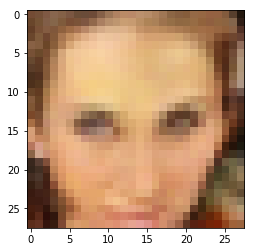

Epoch: 50/50... d_loss: 0.7762... g_loss: 2.1374...


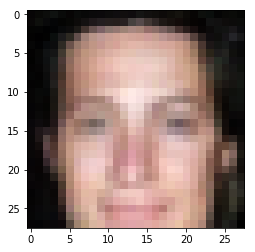

In [18]:
batch_size = 64
z_dim = 256
learning_rate = 0.0009
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 50

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.